In [1]:
import numpy as np
import pandas as pd 
import os
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

In [2]:
data = pd.read_csv("whole_data.csv")

In [3]:
x_train = pd.read_csv("x_train.csv")
y_train = pd.read_csv("y_train.csv")
x_test = pd.read_csv("x_test.csv")
y_test = pd.read_csv("y_test.csv")

# Data Description:

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


In [5]:
print('Number of class 0: ', data[data['target'] == 0].shape)
print('Number of class 1: ', data[data['target'] == 1].shape)

Number of class 0:  (179902, 202)
Number of class 1:  (20098, 202)


In [6]:
data.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


# Check missing data:

In [7]:
# check missing data
print("Do we have missing data on the dataset: ", data.isnull().values.any())

Do we have missing data on the dataset:  False


# Check data target balance:

The ratio of label 1 vs label 0 :  11.17163789174106


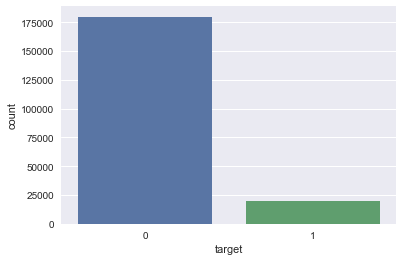

In [8]:
# Checking the balance of the training data
data['target'].value_counts()
data.loc[data.loc[:, 'target'] == 1]
data.loc[data.loc[:, 'target'] == 0]
data.loc[:, 'target'] == 1
sns.countplot(data['target'])

print("The ratio of label 1 vs label 0 : ", ((data.loc[data.loc[:, 'target'] == 1].shape[0]) / (data.loc[data.loc[:, 'target'] == 0].shape[0]))*100)

# From the result we know that the data is unbalanced with respect with target value. We have more label 0 than label 1.

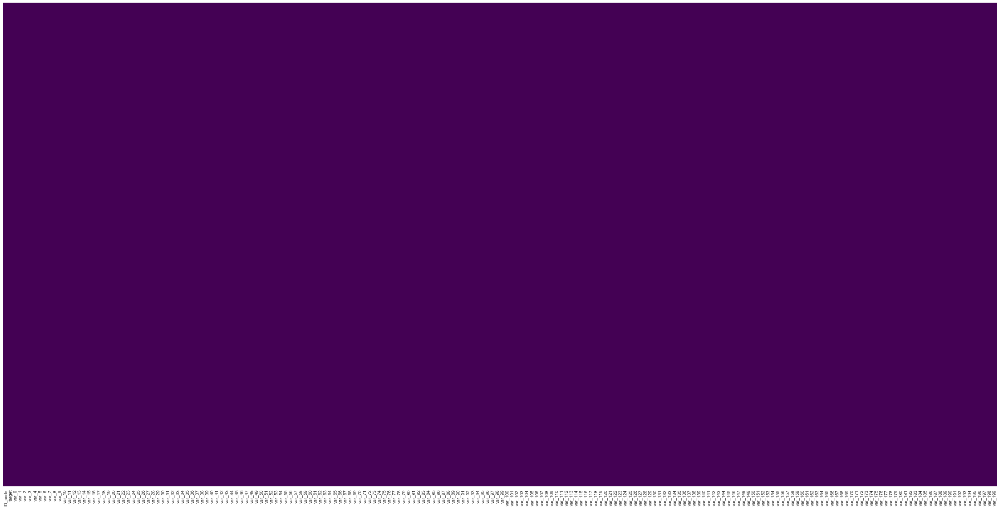

In [9]:
plt.figure(figsize =(40,20))
sns.heatmap(data.isnull(), cbar=False, yticklabels=False, cmap = 'viridis')

# Prove that:
# 1. Dataset has no missing values.
# 2. If there were any, you would've noticed in figure represented by different colour shade on purple background.

# Check data outliers:

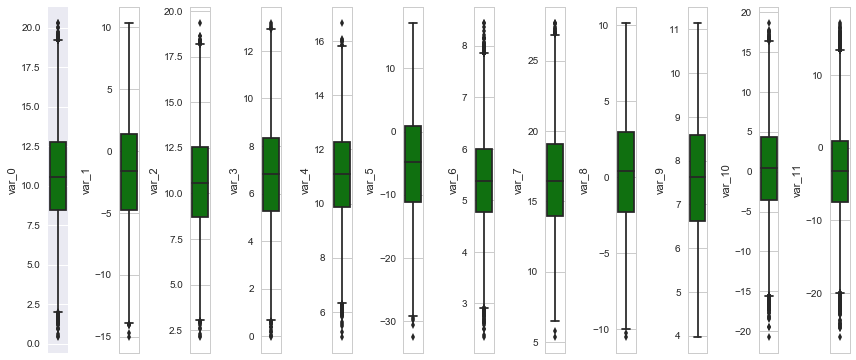

In [10]:
start = 2 
end = 14
l = data.iloc[:,start:end].columns.values

number_of_columns=end-start
number_of_rows = len(l)-1/number_of_columns
plt.figure(figsize=(number_of_columns,5*number_of_rows))
for i in range(0,len(l)):
    plt.subplot(number_of_rows + 1,number_of_columns,i+1)
    sns.set_style('whitegrid')
    sns.boxplot(data.iloc[:,start:end][l[i]],color='green', orient='v')
    plt.tight_layout()

In [11]:
features = data.columns.values[2:202]

In [12]:
data_outliers = []
for feature in features:
    Q1 = np.percentile(data[feature], 25)
    Q3 = np.percentile(data[feature], 75)
    
    step = (Q3 - Q1)*1.5
    print("Data points considered outliers for the feature '{}':".format(feature))
    display(data[~((data[feature] >= Q1 - step) & (data[feature] <= Q3 + step))])
    feature_outliers = data[~((data[feature] >= Q1 - step) & (data[feature] <= Q3 + step))]
    data_outliers += feature_outliers.index.tolist()

outliers = data_outliers
outliers.sort()
print("All outlisers data", outliers)
print("number of outlisers data", len(outliers))

Data points considered outliers for the feature 'var_0':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1759,train_195898,0,1.7892,-4.4876,12.1413,6.2317,10.8426,1.2176,4.5691,21.2123,...,-0.2023,7.8647,-0.5641,2.9154,23.4318,-0.4071,-1.8007,10.0246,16.6844,-2.7347
2884,train_162103,0,19.2157,-1.8854,7.6829,6.5986,11.0326,-13.9361,5.4486,14.0797,...,5.2036,8.7186,1.6014,8.2913,15.6245,0.5029,9.0399,8.7356,13.6520,2.3337
7604,train_143231,0,1.5822,-8.7406,14.6000,6.0790,14.1122,0.5619,6.4963,12.3820,...,3.9923,6.1602,2.8518,7.3731,12.1898,0.7455,8.1656,10.2794,14.9699,-7.5176
11722,train_183118,1,1.9094,3.5356,12.8074,5.5539,11.4644,-11.3273,5.5577,14.0650,...,2.7248,8.0333,-0.4988,-1.5328,12.8529,-2.5931,-4.7758,7.7296,11.5529,7.1783
13651,train_104817,0,19.3992,1.2672,6.2021,9.1580,9.0816,3.2712,2.9847,17.9151,...,6.6141,6.7360,2.1023,3.3257,21.5047,1.9647,10.3722,10.1799,14.1491,-4.5324
15539,train_72728,0,20.3150,3.7755,7.5366,10.8933,10.5552,5.0879,5.4532,17.5903,...,3.8433,4.0647,1.0206,4.8478,18.3133,-0.3395,-0.5236,8.0608,14.4211,6.7592
17074,train_65328,0,1.0147,0.0926,11.5542,6.1213,14.1236,3.7310,7.0027,13.8855,...,8.1236,9.5542,2.0134,10.2565,23.5217,0.6036,6.6042,9.0276,21.0147,-2.2733
18680,train_150496,1,19.2619,-4.6011,10.2342,7.9766,10.9282,-11.7257,5.3349,15.8766,...,1.5833,7.9113,1.6699,6.1159,15.9752,2.0263,6.4662,7.3132,17.8927,-0.4682
23306,train_88724,0,19.2292,5.6445,6.2731,7.0720,12.0223,-2.5328,6.0461,18.4836,...,0.5487,1.1874,0.0363,5.3393,23.6203,-0.4999,4.2777,8.4638,14.1621,0.2271
23660,train_123459,0,19.4725,-8.1159,11.6919,4.1371,10.4234,-5.3150,5.4535,17.2273,...,-3.3296,4.3979,1.7359,10.2778,22.5701,-2.2404,9.8155,8.8661,20.6199,-13.2330


Data points considered outliers for the feature 'var_1':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
56710,train_17045,0,9.9448,-13.9609,9.4189,8.9022,9.9335,2.8718,4.6034,13.0116,...,0.6677,8.8638,1.5104,3.9933,15.4753,-1.9068,4.7601,8.0158,9.1702,-1.7938
62752,train_188513,0,9.3187,-14.0910,4.7517,7.7008,10.5176,-11.2095,4.7818,20.6821,...,4.3079,3.8301,1.3643,-3.8955,18.5870,1.2193,2.4075,8.8452,18.7180,-7.4082
91768,train_77939,1,9.9115,-14.0370,14.5881,7.8856,13.0283,0.5511,5.9337,13.5277,...,8.6899,6.0020,2.4300,1.1156,18.6356,0.4159,0.9720,7.9027,16.6504,2.8215
104571,train_130849,0,9.5796,-14.6962,9.9887,8.1516,14.1697,-7.6733,3.8098,21.0957,...,-0.0261,5.2231,-0.4406,10.8688,17.6939,0.4001,8.7648,7.1085,14.1484,-2.1074
122916,train_53322,0,9.0616,-14.0325,8.4497,4.5893,13.2734,-16.7324,4.4534,17.0229,...,4.8753,13.0156,1.1313,-0.5577,17.8960,1.2476,2.4324,8.3166,12.9244,-12.1676
180762,train_128527,0,5.8861,-15.0434,6.1810,4.6607,10.5459,-9.9246,4.5121,10.0901,...,4.2344,8.2169,1.2045,6.9338,12.5805,-1.3013,5.8491,9.0511,15.0798,-13.4580


Data points considered outliers for the feature 'var_2':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
8786,train_93874,0,12.0314,2.3346,2.1693,3.6319,13.4174,-6.4734,3.5014,21.2904,...,-0.8495,7.2483,3.6136,1.7557,17.2556,0.4472,12.2926,8.7815,13.7535,-10.3080
12599,train_150964,0,7.2650,-0.8853,18.2823,3.5733,9.4632,1.6120,4.5959,21.3345,...,7.6951,7.6783,3.1005,2.8289,15.9552,3.2332,0.2578,11.4284,12.1618,-12.2500
18412,train_181007,0,11.5772,0.8839,2.9803,8.3857,8.8148,-15.3223,5.5418,17.9091,...,4.3378,8.7489,5.7480,2.3472,17.8655,-2.0291,6.5766,9.5657,17.6865,-22.4561
26296,train_47873,0,9.4297,1.2352,18.4055,8.1563,10.3803,-13.4654,5.2396,16.6519,...,7.0488,7.5840,-0.7250,2.8604,16.4545,3.0198,0.3123,7.0298,21.6152,-2.9209
35074,train_22808,0,8.3695,-0.1994,18.2115,3.4233,8.2312,0.3462,5.5306,11.7266,...,3.2960,7.4355,4.2231,3.0135,17.1411,1.8063,0.3981,9.1648,14.3444,-6.5624
38086,train_56541,0,5.7170,-10.3636,18.2910,3.4448,11.3887,-8.5216,5.1915,12.5582,...,2.4272,6.8637,0.1405,6.4319,17.6128,1.9529,-0.5132,9.1251,10.2957,-4.1532
39125,train_115359,1,17.8970,-8.9327,18.2088,7.0575,10.7935,-4.1596,4.2872,14.7086,...,0.1688,10.1432,2.1102,7.0823,18.4065,-1.4618,1.1388,11.2750,16.5461,2.1071
44664,train_189857,1,12.8354,1.2827,2.9462,5.8795,13.6890,3.4673,6.0979,18.5807,...,2.2106,1.8990,-0.0326,0.2913,20.0854,-0.5767,-3.5296,7.0420,14.3419,7.9812
47624,train_17022,0,15.4564,-7.9326,18.3095,7.2260,12.3072,-9.3227,3.9488,17.4257,...,7.6415,9.0069,2.8013,4.0274,16.9609,0.4357,-2.9249,7.3536,12.8319,-22.1754
48531,train_180230,0,7.8584,-0.2808,18.3932,7.3443,13.0867,-12.6018,6.6533,10.8895,...,1.2501,3.7571,5.2326,7.7679,22.8792,0.6474,0.0379,9.9664,19.2409,10.8430


Data points considered outliers for the feature 'var_3':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
10420,train_93672,0,9.9279,-2.9324,7.5762,13.1883,12.4062,-0.7368,6.3172,10.2022,...,9.3614,9.7783,1.3048,-1.0859,21.2741,0.1669,-2.9693,9.2154,13.8360,-1.2188
24389,train_126230,0,9.0174,-1.3309,14.7057,0.1788,13.0578,-14.7234,6.0742,19.8026,...,-0.9509,10.2371,3.8281,-1.8029,17.1941,-2.7950,11.7147,9.5411,15.5241,8.9220
34996,train_116281,0,5.6770,4.0852,9.1654,0.1707,10.8888,-8.7060,5.4112,13.4409,...,10.2573,8.7407,1.0746,6.7652,20.8553,-0.0296,0.2952,8.4295,18.8955,-2.4032
42349,train_83383,0,14.7939,-7.4613,14.4185,0.2550,9.1362,-18.4591,5.2859,13.4507,...,-1.0311,10.6063,4.1947,1.5517,19.1545,-0.0452,2.2595,9.3691,17.6601,4.7542
46683,train_96710,0,13.6556,-1.4271,16.6624,13.0983,12.5317,0.6249,5.3871,18.5946,...,0.4498,7.4274,0.6558,7.2523,18.4677,1.0119,3.2381,8.5994,17.1624,2.9458
61730,train_119517,0,9.7218,-4.9594,13.3805,0.5973,7.7467,-1.7343,5.2883,20.0284,...,-4.2778,7.1216,-0.4754,-1.7089,15.8684,-1.7667,10.8590,10.0820,17.7803,-14.4799
67379,train_199836,1,6.1845,2.8286,8.5944,0.3740,12.6503,9.9060,5.5725,15.9712,...,13.0266,3.4509,2.6856,3.5149,12.9778,0.9322,0.5566,6.7955,15.4489,-17.0909
77921,train_105234,0,4.5366,1.9465,12.6897,12.9918,11.9756,1.7083,5.8861,17.7107,...,2.3825,7.5179,2.3455,-1.8654,21.6754,3.0780,11.5386,8.5330,16.4589,6.7945
88817,train_130464,0,4.9126,0.0567,8.5928,12.9389,12.6003,-5.2092,3.5782,19.4036,...,2.9341,8.3867,3.1199,4.6418,16.3666,-1.3846,6.9362,9.9197,19.1911,-16.1422
108766,train_123787,0,5.8885,1.3527,8.4151,0.3736,9.3586,-15.5773,5.2408,11.9292,...,2.6701,10.7712,1.0947,6.8155,11.0504,-0.8593,3.8340,8.8791,13.7459,9.4887


Data points considered outliers for the feature 'var_4':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
889,train_98716,0,6.1692,-4.0798,14.7031,4.2245,6.0857,-16.1166,4.7423,22.6575,...,-0.0216,10.7610,-0.2625,6.8634,23.4306,-0.4025,0.6478,9.8669,16.6120,-10.9869
4146,train_119490,1,14.7186,-2.9593,10.5719,5.8261,6.0865,-15.0069,5.9423,20.8307,...,8.5959,4.5786,0.9924,-1.1449,14.2649,0.0096,-5.7680,7.8113,15.9640,-21.7376
4433,train_199723,0,11.0102,-3.5825,12.6599,8.0481,6.1536,-0.3369,5.1000,13.6642,...,10.6588,1.5064,0.7375,5.6540,16.7737,-3.3254,-0.1944,8.0841,13.1128,-15.3827
4805,train_19710,0,4.4231,5.2020,12.3174,11.7338,6.1616,-0.7209,5.7649,23.1200,...,3.0690,4.8593,2.5880,3.9393,19.5576,-0.7261,-1.2946,8.5726,13.6896,5.4213
11511,train_196977,0,13.2870,0.6264,11.0511,6.5541,6.2021,4.9855,5.4569,13.1571,...,0.0701,11.0347,0.6625,4.1136,20.1252,1.0683,-1.5805,8.7342,12.5048,-6.7411
17475,train_134881,0,13.3438,0.1395,9.1645,8.5066,6.1547,-0.2104,5.3295,14.8064,...,10.4710,1.5199,2.4904,5.9856,18.4982,0.2741,12.0195,8.3331,15.8299,-6.8762
17923,train_30916,0,11.6545,-0.7831,9.9602,8.2372,5.9440,-8.4719,6.0774,21.1734,...,5.0997,4.9379,3.0714,8.3042,15.2576,0.4460,9.1723,9.5000,12.4038,9.7800
21887,train_101731,0,16.7940,-0.7383,9.1069,5.9442,5.9111,8.6604,5.5160,14.2864,...,0.3777,3.3976,3.6553,2.3374,20.8986,-1.4900,12.4226,7.5208,15.5612,-1.6876
22400,train_103191,1,7.0581,-2.4521,10.3905,4.6880,5.9579,-4.8488,4.7290,10.1630,...,-0.7553,15.1051,1.2038,-2.8608,19.1253,-2.0434,8.7736,9.3334,14.5538,5.5302
24278,train_107850,0,7.4951,1.9294,8.3791,9.5037,6.2709,5.9896,6.4031,15.8645,...,3.6547,11.2104,1.7878,0.1085,11.6523,1.1586,2.8392,9.3764,17.7424,3.0705


Data points considered outliers for the feature 'var_5':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
114679,train_140622,0,14.2662,-2.5842,6.7978,5.3209,11.4529,-30.6816,6.1606,17.4688,...,-4.1951,5.5232,2.1657,2.8579,22.1266,-1.3179,-7.0059,7.6408,13.9766,-4.3446
124550,train_189389,0,8.2342,2.2885,12.4722,5.3942,11.4229,-29.7773,5.3718,16.1334,...,-4.7403,9.4916,2.7110,5.7594,12.7414,1.7295,1.6613,9.6887,16.4618,-0.2574
130520,train_96858,0,13.9054,5.1595,9.6745,5.6233,11.0681,-32.5626,6.2924,10.9103,...,-4.5144,14.9301,1.3576,-0.6745,22.4595,-0.9642,-6.5020,9.5679,13.0980,6.7041
149845,train_138911,0,9.0179,-7.3303,17.2408,6.4317,11.5813,-29.4844,6.2273,10.0701,...,6.6049,7.0130,3.1057,2.0253,20.2254,0.3092,13.6723,9.7650,13.4145,-7.3038


Data points considered outliers for the feature 'var_6':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
4096,train_113736,0,10.3603,0.5060,12.1658,3.3017,14.5281,-3.5346,8.4330,16.7044,...,1.5223,3.0722,1.4582,4.9706,22.4669,1.2398,4.4379,9.2589,15.1702,14.7121
4327,train_134369,0,14.1195,-6.6278,12.5343,7.6450,11.5617,2.4549,7.9523,14.3704,...,6.4112,5.9023,0.8810,12.3772,20.7606,1.3400,0.6310,8.6129,15.9778,-2.7036
5097,train_9966,1,13.0909,-0.3547,9.9865,2.5649,12.0019,-4.9105,2.8296,17.6055,...,14.6078,6.1989,1.1384,6.9034,19.2586,2.1853,1.1301,10.5507,15.2719,4.6646
7644,train_183420,0,7.9764,-1.2301,6.9491,8.3635,8.9606,-0.1096,2.8055,12.1950,...,7.0517,5.2797,-0.0577,2.9295,17.7633,0.1852,-5.4009,8.9251,8.3519,8.9434
7681,train_32601,0,9.9631,-2.9171,8.8262,2.6616,9.9558,-3.9127,8.0263,14.2212,...,-4.7487,11.9057,2.7860,4.2689,15.8186,3.1915,2.7311,8.7209,12.7651,9.4703
11096,train_28388,0,10.2152,-3.2490,6.1754,6.0161,12.5159,-12.2281,8.1334,16.1648,...,4.1735,2.1613,3.6514,-2.0500,12.7398,0.4759,6.7113,8.0350,16.3904,-8.1912
14290,train_124630,1,9.1584,-2.9566,12.5575,6.8993,14.1464,-6.6092,8.2852,22.7752,...,-0.9801,6.3126,3.2410,4.3588,13.6178,-0.4051,4.2940,10.5964,16.9348,-6.2071
18122,train_136728,0,13.4475,-4.2359,13.9427,4.7325,10.9132,-3.2032,8.0150,11.8603,...,3.3548,8.4334,5.0393,-0.3487,13.9591,-1.5556,-7.6861,9.0049,12.7749,-14.2651
18627,train_175405,0,13.6527,-2.9592,11.0622,3.6455,13.0585,-6.6459,2.5875,15.1674,...,-0.1998,5.1249,-1.2609,5.9529,18.5817,1.5823,-1.9532,7.9190,17.4660,-29.4037
19715,train_18580,0,12.3302,-1.6004,14.0570,9.4040,13.0517,-12.9251,2.8607,18.5964,...,9.7650,7.8456,1.5726,3.7137,19.2671,-0.7640,-6.7793,9.8433,18.4182,-25.9541


Data points considered outliers for the feature 'var_7':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
11357,train_118314,0,8.4851,-4.4274,9.8186,4.0352,10.4321,-14.9852,4.4947,27.0606,...,3.2520,7.6665,4.3749,6.3321,20.8693,0.0568,-5.9874,8.7158,15.7117,3.8583
21092,train_13534,0,7.9996,-1.0120,9.4230,5.0882,8.7573,1.2287,4.7792,27.5977,...,3.2644,12.3077,0.7248,1.6331,15.7726,-0.9018,4.8817,7.7940,16.8717,-10.2080
39206,train_34390,0,9.0694,8.2530,9.5457,8.8681,10.7506,-4.4757,6.7106,26.8659,...,5.5469,10.0693,2.1744,0.3070,16.5743,-0.3315,12.9370,8.8925,20.0467,-10.0791
63362,train_57124,0,9.7018,2.4473,10.4100,8.4782,9.9689,-14.9670,5.3781,26.9902,...,2.5825,10.9522,1.6961,4.8586,21.5615,-0.8607,4.0913,9.6590,15.3278,-11.2728
67603,train_182889,0,6.7740,-1.8707,10.9521,9.2161,11.7614,0.1056,2.9815,27.3971,...,3.4669,5.7652,2.8201,-0.1556,19.4976,0.2973,-5.2936,8.5292,13.9860,-21.8269
71484,train_107230,0,9.8698,3.6960,13.3720,5.8208,12.1235,-9.9848,5.5532,26.9282,...,1.4408,1.5702,-0.2527,-2.7767,17.2115,-0.7405,-2.2572,7.9007,14.4214,-8.8126
80370,train_182146,0,9.2696,-5.2180,12.7925,7.8540,11.1443,-8.4283,5.8900,27.2138,...,6.8475,8.9300,1.8881,-0.2339,19.1091,-0.3297,-4.5762,10.1514,10.4685,-7.1911
83599,train_28679,0,9.2663,3.6290,5.8674,4.7464,12.7327,-9.7637,4.5386,26.9408,...,6.0284,7.2908,1.8277,10.0306,22.5551,0.4026,7.3714,9.8375,15.1723,4.5388
86528,train_15718,0,10.2381,7.8534,13.3369,7.0925,10.8275,-0.9861,4.5820,5.7494,...,5.4780,5.1885,0.7866,1.6502,20.3913,-2.0477,3.0635,9.5573,19.6102,16.8338
107133,train_18100,0,9.7502,4.9384,9.4252,5.8314,9.5764,0.6004,5.5158,27.0257,...,1.2353,2.2570,1.4296,3.2223,13.8533,0.1574,3.5189,8.4064,18.6940,7.0959


Data points considered outliers for the feature 'var_8':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
8846,train_63317,0,10.7461,4.4139,13.0052,6.2895,12.045,-17.2319,4.5709,19.9200,...,6.8147,7.9487,2.5767,5.0136,21.9614,0.4638,4.2619,8.8771,8.1431,3.1143
52702,train_184988,0,11.0215,3.4416,10.4664,5.7697,9.912,-0.9385,6.0541,17.9755,...,2.2497,12.0610,2.8280,4.1632,18.4159,-3.3420,-5.8410,9.1712,14.5457,2.5799


Data points considered outliers for the feature 'var_9':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_10':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
559,train_188041,0,8.4705,4.9483,15.6532,7.7498,10.8379,1.1206,4.7590,20.1181,...,-0.9683,8.8010,1.1468,0.3750,11.1383,0.2030,0.6989,9.5677,20.1511,-17.4130
990,train_61459,0,12.9424,-2.3146,15.7673,8.0415,12.1822,-19.4536,4.9799,17.0375,...,3.9131,4.7153,2.5372,3.6151,22.6001,-1.7949,4.7857,8.7991,15.6486,-13.0163
1514,train_40646,0,14.6822,-3.9234,7.8154,8.9524,10.9258,1.2310,5.8421,11.7657,...,0.4640,10.8976,3.6934,1.6927,13.9906,0.4195,0.1861,9.0891,10.5768,-5.3926
1946,train_89159,0,9.3375,-6.7995,12.5025,6.9997,11.1604,-10.6060,6.0309,17.3573,...,-1.6076,11.4585,1.7890,8.8895,14.8408,-0.0365,-3.8625,8.8064,19.0323,-3.3152
4110,train_75941,0,12.7596,-2.5460,13.5417,8.1811,9.3516,1.4892,5.7999,17.6707,...,3.5834,10.8498,-0.4475,8.4041,14.8644,-3.3304,-5.4172,9.9701,12.3800,-22.3377
4684,train_177187,0,4.7555,-6.2358,8.0596,6.4867,10.3835,-6.3696,6.1367,23.2467,...,-7.2953,9.1117,2.1522,1.5907,17.5077,-0.2562,6.6688,10.3237,13.7213,-8.8623
6633,train_12107,0,6.9356,-3.0143,12.1009,8.0014,14.3823,-3.0230,3.4161,19.1278,...,7.8741,14.3199,4.2742,4.3714,19.7245,0.1249,-2.7901,10.1995,13.8054,0.8067
6950,train_142390,0,12.7458,-4.0680,7.6895,11.7490,9.5445,-10.3529,6.0261,16.3641,...,2.8948,5.2371,2.2528,5.4087,23.7454,0.4395,6.9685,10.2620,13.3896,-12.3794
8656,train_88542,0,11.5546,-8.5610,8.3164,1.5397,7.4690,3.1441,5.2613,12.9312,...,7.0372,14.4895,1.6407,0.7727,19.2525,1.0739,1.5596,9.6504,15.2790,-15.2398
11977,train_36793,1,18.5702,-4.0372,11.4736,4.6191,11.1471,-5.8108,4.9995,15.8725,...,0.0321,11.2314,3.2116,5.8660,21.5688,1.7715,14.1491,8.3186,19.0152,-8.8701


Data points considered outliers for the feature 'var_11':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
490,train_156136,0,10.7694,3.9677,12.6023,8.6877,7.5811,-5.3540,6.2254,13.3510,...,-2.8031,5.3168,1.5350,7.7245,16.3197,-0.7288,-1.9729,8.7975,13.6737,-7.3350
2133,train_130311,0,10.7495,-0.5816,8.2001,4.2078,9.4984,-11.8887,5.8709,20.0250,...,7.5572,8.2003,2.9062,1.5512,15.6100,0.0315,-4.6549,8.0166,13.1355,3.4241
5859,train_75273,0,8.3386,-3.3854,11.6739,8.9667,13.7595,-13.8105,5.2563,10.6318,...,-2.9184,6.5018,2.2831,2.3973,20.9897,0.8152,-0.7078,9.0218,15.1727,-0.3035
7340,train_84702,0,11.8975,2.1664,15.6343,4.8449,8.1219,-1.6093,3.6679,13.6390,...,6.2836,11.8486,4.1395,6.6567,14.9244,2.3351,3.1600,9.1713,18.1281,10.3902
7475,train_59289,0,10.5625,1.9752,7.9626,9.3052,15.0075,-12.1513,5.0354,21.8399,...,10.1795,10.0805,3.0087,0.8542,17.1694,0.9579,14.1623,8.1076,14.4813,3.0623
7679,train_145561,0,17.2147,-2.0231,14.0865,5.7379,12.8996,-4.0738,4.5422,14.2250,...,4.2155,4.5676,2.0312,5.7312,15.9012,-0.3266,5.3349,9.6644,14.1066,-1.7049
10167,train_129375,0,11.4598,1.4860,6.9553,4.5249,12.5062,1.0595,5.9227,16.3692,...,10.6482,3.6252,0.8692,7.6786,14.8042,0.9580,6.1439,8.2033,21.3108,0.2128
10845,train_187795,0,5.7316,-3.9200,7.9708,6.8080,11.3229,-7.5845,7.1501,14.9610,...,1.7348,7.1427,2.7952,4.4549,11.2201,-0.4829,4.7877,10.1873,15.5113,5.8774
12067,train_7095,0,10.7896,-10.7039,6.1247,4.9828,8.2460,-8.4800,5.5572,19.4529,...,-4.6040,7.8157,1.8863,5.1176,19.5853,-2.5990,5.0543,8.3166,8.9064,9.8051
12461,train_159874,0,13.6909,-5.5154,7.1623,4.9247,10.4244,-1.4940,4.8445,17.4164,...,1.5613,2.7639,2.5245,1.6975,15.8777,-0.1245,1.5429,7.9831,20.6134,-17.2365


Data points considered outliers for the feature 'var_12':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
2087,train_11380,0,9.8774,4.1744,9.4196,6.3656,14.4918,-0.8374,6.0838,14.3438,...,-1.0920,6.1164,0.2911,6.3670,11.4517,-1.6496,7.6020,10.3660,13.7966,-14.9782
2415,train_58092,0,9.3266,-1.7759,9.1073,6.4709,12.3004,-10.0158,6.5918,15.9963,...,4.8409,5.7239,1.3247,3.2943,24.0687,-2.3398,-1.3055,8.3533,19.9358,-4.0962
4305,train_21942,0,8.2297,-0.8886,13.4441,4.2457,12.4595,-12.2539,6.5725,10.5867,...,10.1258,4.2161,0.4993,1.9997,21.8795,2.5845,2.2195,10.0787,15.1018,-14.4706
10913,train_197044,1,12.9245,1.3182,9.4715,7.8215,11.4784,7.6387,6.3440,21.7840,...,11.5570,8.9693,1.6189,9.3765,11.1673,0.3423,8.9453,8.1547,14.6893,-13.0804
16344,train_87596,0,10.3474,-2.0313,11.1030,6.7300,12.2818,-16.4066,5.5112,18.5487,...,3.5417,7.8075,-1.2522,6.5668,14.2532,1.2902,12.9428,10.2565,20.6834,-8.1441
18442,train_149637,0,9.9378,-3.7589,12.3144,5.4644,13.6364,-5.0853,4.8263,20.9676,...,1.0928,9.0556,1.1698,3.9634,16.7353,0.1644,3.8963,9.7995,14.1713,-7.5334
21266,train_38570,0,8.4151,0.0917,11.9751,5.5627,11.3353,-1.0240,5.5603,15.9015,...,-1.5047,7.1691,0.2718,7.1983,13.1126,1.9863,2.0102,8.1117,13.7876,-3.0390
29494,train_107647,1,11.9309,-2.7715,13.1584,8.2164,12.3764,-19.0292,5.7685,12.8414,...,8.1157,9.2856,1.1978,0.3674,14.7151,-2.8938,5.9729,8.7668,15.1135,5.7390
32658,train_190907,0,5.5633,1.1353,10.4627,6.2387,12.1025,-12.9777,5.0337,18.4467,...,0.6673,14.4074,2.1647,8.1225,13.5948,-1.4916,2.5890,7.9199,10.9467,-3.7737
41556,train_147551,0,6.8163,2.5036,14.0292,6.0348,9.6332,-7.1149,5.1613,18.5706,...,4.9845,8.2534,1.0140,5.6046,20.2746,1.3241,-5.5186,8.6070,19.1441,5.8503


Data points considered outliers for the feature 'var_13':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
4407,train_30205,0,10.5029,-5.9252,8.9891,6.721,10.6709,-18.8533,5.8226,19.299,...,7.9191,14.7897,4.4177,4.203,12.328,-1.1246,4.412,8.4261,17.4993,-4.5516


Data points considered outliers for the feature 'var_14':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
125781,train_167946,0,11.6282,-1.4585,15.4251,6.3638,10.8114,-2.4015,4.7281,18.9967,...,0.1862,5.6376,2.2321,2.7500,15.8566,0.2658,-2.0011,8.2081,21.6772,7.1393
176943,train_132910,0,6.9619,-1.7099,10.1948,5.5801,10.5495,-5.3591,4.6032,19.4004,...,-0.8228,7.1618,-1.2822,5.2833,21.0626,1.3087,3.2055,10.5983,11.6832,-5.2496


Data points considered outliers for the feature 'var_15':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
5164,train_192263,0,10.0352,-2.1426,13.0067,7.9357,11.2997,-9.1947,4.5238,15.5849,...,1.9073,5.2181,1.6142,2.2832,20.6750,2.3031,0.6026,10.8928,20.3502,-23.1507
10764,train_55826,0,12.0413,-7.1058,10.0913,5.8568,12.3521,-15.7496,6.2171,14.8278,...,2.2667,7.5724,-0.6870,-0.7826,17.2770,-3.2032,1.4263,9.3852,13.4249,-9.4461
16435,train_187551,0,7.4135,3.3305,6.6537,6.8891,11.7100,9.6074,4.5067,15.2497,...,11.6636,7.0800,1.7450,9.1804,19.4948,-0.5879,5.6519,10.6328,19.3762,-4.8833
28499,train_32811,0,8.8595,-4.8084,11.8454,7.2438,13.8914,-13.1420,5.9143,10.4891,...,11.6610,8.3770,1.0308,0.7857,15.7159,2.1384,0.3231,8.8165,15.1856,-2.2197
41935,train_148380,1,12.7061,2.9227,10.1469,3.9739,10.9727,-13.1090,6.2698,19.8982,...,2.3028,6.4868,4.3851,-2.6822,19.6370,-0.8925,4.6511,8.3050,17.0280,-26.6525
44211,train_63125,0,11.9879,1.1094,11.0869,7.5616,10.9168,2.5217,4.9808,13.0222,...,-1.3218,6.2058,2.6868,0.0909,14.2536,1.0907,-4.0952,8.0594,13.9175,-0.6194
49490,train_110114,0,10.7284,-4.9927,12.3594,6.4218,8.7164,3.3136,6.8139,20.9955,...,-1.8456,11.3458,4.4076,7.9174,18.0130,-0.4072,0.3334,9.0849,12.3584,-25.5857
55928,train_153646,0,12.7756,-3.9436,10.5061,5.1970,12.2543,0.2730,5.3005,15.2370,...,8.2648,6.7669,3.8462,12.4905,18.1528,-2.0727,-2.4479,8.4135,18.1497,-14.2245
77564,train_37560,1,14.0980,0.5404,15.1327,7.3116,14.2630,-5.8172,5.0992,23.0086,...,-5.2920,3.7706,1.8175,4.4361,14.1866,-0.9914,11.2058,7.3324,9.6741,-5.1391
80741,train_5362,0,9.7990,-2.7331,13.0655,6.8157,9.6832,0.0311,6.0121,16.8198,...,0.9422,8.5635,-3.1028,6.3561,19.4113,-0.9847,-0.3535,9.3062,16.5972,-2.6548


Data points considered outliers for the feature 'var_16':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1600,train_105747,0,8.0484,0.4854,11.1691,7.7385,12.0696,-6.3141,5.9763,14.9430,...,0.9248,6.4958,3.6710,2.0296,21.3791,-1.3476,-0.5311,9.1590,15.6643,-10.3860
8320,train_101538,0,11.5530,-2.0525,13.5924,6.2122,9.5843,1.1066,6.6817,14.3265,...,-0.9275,12.7537,2.9932,8.4945,16.6034,1.8617,2.6316,7.7203,19.8631,3.9637
10711,train_124827,0,13.2670,2.4090,12.8109,8.6435,13.8975,-16.6420,5.7188,15.3435,...,4.4385,7.2129,1.8080,6.0106,25.6073,-0.9667,-2.3518,8.7447,14.1674,-16.0605
12544,train_119337,0,4.0966,-5.4989,11.5264,4.0776,12.2211,-1.9731,5.8357,18.5830,...,6.3209,9.1123,1.6485,1.0607,20.4324,-1.1388,-7.2767,9.6208,15.3829,-1.6668
14671,train_19818,0,8.0919,-6.4704,14.0419,7.1129,14.5421,0.6270,3.1972,20.2648,...,-3.1322,12.0987,1.4138,13.2405,23.0069,-2.0295,-1.0475,7.1933,19.7624,11.2307
17696,train_72547,1,12.6265,-4.7787,7.6765,2.0047,7.8799,-22.6292,6.6681,13.5601,...,9.9076,4.9354,-0.8206,5.0801,20.3761,1.6842,12.3589,8.7073,15.6075,7.3985
25175,train_33638,0,10.8676,-7.6994,10.0421,7.3358,12.9299,-15.6361,5.5640,17.7498,...,11.2285,7.8573,0.5169,9.2321,14.8376,-0.3313,-8.8398,8.8112,15.7194,7.9470
27761,train_166921,0,11.2968,-7.7795,9.4108,10.0397,12.4025,-6.7366,4.8834,20.6612,...,6.3281,8.4831,0.7741,4.4315,14.9366,-0.0555,1.4234,8.0733,17.7653,2.9985
27862,train_104074,0,12.5646,4.3171,10.3239,5.1424,9.7040,-0.4546,5.8726,16.3355,...,6.2051,4.7023,2.7442,0.2536,21.5349,2.7543,-4.8060,10.5723,13.9581,18.6268
28551,train_45692,0,10.2339,2.5727,12.3879,7.7946,10.3571,-16.3640,5.1851,19.2595,...,-0.5491,5.8171,-0.8469,2.2625,18.4473,-1.3633,-4.1407,9.4014,9.2285,4.2585


Data points considered outliers for the feature 'var_17':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
797,train_4895,1,12.4378,-1.4144,9.0106,9.7615,11.2357,-12.7968,5.3113,19.9380,...,8.9226,10.8851,3.9801,8.2121,14.8928,0.8570,-0.3705,8.5952,17.8018,5.7228
815,train_154150,0,3.7198,-3.1217,13.0765,7.6550,11.4241,-9.4826,4.5657,13.0467,...,4.8279,12.4143,1.6522,0.9532,17.0228,-2.0688,-1.5773,8.1387,14.8363,-1.0384
1498,train_57056,0,11.0008,-3.9138,11.0287,4.2008,12.0735,-0.4555,6.1041,17.0756,...,5.1321,6.9759,3.3450,8.9318,19.3615,-1.8139,5.5270,7.3864,15.0692,-0.3506
1706,train_7460,0,9.1729,2.0938,9.3275,8.1909,9.7841,12.6141,5.0788,17.2202,...,4.8936,8.3505,4.9276,5.9318,15.9960,-0.7120,-2.0988,8.4782,14.9388,-12.1031
2745,train_136755,1,6.1709,6.5579,13.3819,6.7445,9.3175,-2.0445,6.1096,20.0997,...,6.5691,3.0039,2.2000,7.1825,16.3357,-0.1574,3.6059,9.7002,22.6195,0.9485
3119,train_42949,0,7.3473,0.2487,8.2930,4.8968,9.9520,-7.7030,5.1265,17.6904,...,12.7890,3.3278,0.3050,6.4094,12.0730,-2.5298,-1.0590,7.9032,10.7709,-14.3678
4822,train_60227,0,11.0140,-6.2404,12.4085,6.2989,11.6018,-1.0139,5.3785,14.7558,...,2.1566,7.6133,-0.8024,6.5059,21.6766,0.5838,9.5909,8.0721,16.0557,-0.9323
6036,train_107710,0,16.4500,4.7665,8.1524,12.0449,10.4174,5.1383,4.3528,17.6196,...,3.0688,9.3434,1.1528,7.9638,12.6423,2.3537,9.8183,9.3999,19.1000,-4.6797
6039,train_73628,0,2.9025,1.5158,11.1899,8.8220,10.8736,-8.9462,6.6324,19.7214,...,4.7509,5.3894,0.2352,9.0459,18.6026,2.5490,8.3395,8.3697,8.3626,-7.4530
6456,train_164827,0,7.7320,0.6906,7.7097,9.5457,11.3527,-11.6322,6.6880,20.3715,...,-0.1399,8.4410,-0.5254,9.6121,17.7813,-0.3228,14.1481,7.7457,19.6161,-18.1023


Data points considered outliers for the feature 'var_18':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
38163,train_101053,0,15.6494,-5.5631,6.7291,9.8268,10.4255,5.9293,4.7976,18.7680,...,6.3449,6.6472,-0.3919,7.4725,20.8084,-1.0759,-0.0866,10.7126,10.6481,-4.6052
55411,train_69025,0,7.0684,1.2524,14.2047,3.0021,10.7800,-16.6452,4.6743,20.1197,...,4.9728,9.1183,3.4716,-1.1931,19.0768,-0.5689,1.3122,9.2283,15.2182,-24.4588
61447,train_142282,0,12.9262,-1.4422,12.4700,6.9325,7.2001,3.9862,4.1104,13.8718,...,11.2253,10.7116,2.4808,5.2285,19.4137,-2.1954,9.5981,8.0197,17.7412,-19.6953
69167,train_160833,0,13.7974,-6.4155,12.3920,10.7942,11.3052,0.3485,4.7159,11.7366,...,2.8649,6.9883,2.7347,8.1147,12.8363,-0.7633,-8.2842,7.7086,22.2735,6.8280
118425,train_15685,0,6.3764,-6.7997,8.4750,8.9293,12.9720,-10.4532,4.4533,12.4294,...,-6.9760,10.6303,1.3568,5.0090,17.0202,-1.7153,0.3162,9.6477,13.9339,-0.5345
118668,train_81362,0,10.8128,-1.3846,12.6660,9.5354,9.9004,-4.2451,6.0330,13.5200,...,7.0873,10.2562,1.1443,8.6241,21.7423,1.0887,-8.3215,9.2969,11.9575,9.4580
119092,train_120811,0,5.9561,3.2868,7.3634,9.3934,13.6483,-6.4205,4.7543,18.3854,...,-4.3791,11.2026,0.9023,3.7030,14.1454,-1.0040,4.5845,8.1853,16.2542,9.7109
152577,train_141680,0,14.3633,-2.6150,7.0656,5.5326,10.2688,-19.4558,6.2992,15.2730,...,4.9288,5.2185,2.0971,5.1323,16.8123,-1.2581,-2.3002,9.2966,18.6024,2.8598
160498,train_107835,0,11.0674,-7.5309,8.0681,5.7702,12.3994,-5.4596,6.7527,12.8942,...,-1.7422,7.5478,2.3661,-2.2390,15.5423,-0.7125,13.7647,8.3681,21.5659,1.7020
182161,train_10572,1,10.0845,-0.1985,12.9035,9.4880,9.4756,-17.4874,5.5490,21.4619,...,-5.5226,12.1615,0.7227,1.7244,15.4029,1.3636,-0.3451,9.0708,9.6156,-3.8504


Data points considered outliers for the feature 'var_19':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
55025,train_189526,1,9.8049,1.4491,10.2755,6.0207,10.1498,7.4097,4.8381,18.3879,...,8.7671,2.9031,1.7142,5.2859,17.966,-1.3292,3.1108,10.5783,17.5386,-9.0366


Data points considered outliers for the feature 'var_20':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
35136,train_11510,0,7.4449,-7.2302,12.4509,8.5867,14.1262,-12.2877,5.5013,15.6545,...,4.509,9.794,3.1876,-0.0846,15.9161,-2.053,2.1721,10.1155,17.9405,-26.4275


Data points considered outliers for the feature 'var_21':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3740,train_97626,0,11.5539,2.4064,6.7316,8.4406,11.1021,-10.8968,7.3223,21.3369,...,1.1475,11.2659,-0.6965,-1.0445,17.0901,1.2224,10.6549,8.9208,19.1417,-10.7566
4596,train_39009,0,9.0605,3.1386,9.8550,5.6945,10.8119,-9.7904,5.9028,19.3317,...,6.6463,9.2571,1.9637,0.4502,21.7471,-0.2419,-2.0502,9.4007,10.5754,-3.2037
5163,train_162788,0,8.5084,0.9244,8.2389,4.5718,12.0124,-0.3497,4.8225,18.8097,...,-0.5179,10.9848,1.8216,-2.8518,20.1985,-0.7988,-2.0099,7.9339,13.1557,-15.6852
5596,train_36110,0,15.2241,-9.8963,12.0085,8.9581,9.8429,-13.6926,4.2658,18.5678,...,4.1923,6.9048,2.9424,3.6199,17.9320,-0.2042,2.8440,7.5513,13.4943,-8.8044
6053,train_156297,0,8.3291,-2.4382,7.3621,9.8040,10.7511,-12.0979,7.0431,20.3954,...,-2.1653,8.3571,4.1786,4.3871,12.5435,-2.1154,6.8558,8.9754,14.7969,0.1027
6334,train_105098,0,8.1696,4.4452,12.3133,5.4700,8.6374,-16.5695,4.8212,18.8484,...,3.7327,7.9588,1.6688,2.0737,22.1306,-1.3704,3.1054,8.1842,22.7630,12.5456
6369,train_35191,0,10.1807,-7.3679,12.1460,9.0918,10.5156,-13.7537,5.5311,21.4226,...,-2.9844,1.6987,4.2198,-1.8909,13.6024,-2.8257,-2.6900,8.9259,22.6875,-6.1238
6993,train_52590,0,7.2665,-4.8636,10.5486,4.8549,10.2536,-16.7390,7.1096,11.3828,...,6.1754,6.8909,1.3806,0.4685,22.5625,0.8957,8.1530,9.3065,20.1121,-21.4618
7932,train_126009,1,17.1552,-2.0936,10.4183,6.7761,11.9163,-8.0088,5.6443,17.9651,...,3.1005,6.9045,-0.6209,1.0620,19.9619,1.5918,8.3667,7.5502,21.2590,-0.2732
8490,train_84486,0,8.8642,-6.9186,12.0891,4.5216,12.5799,-18.2229,5.6002,15.9859,...,3.3987,3.0082,1.2597,1.9933,21.9812,0.4102,7.3554,9.9051,19.0192,-14.6115


Data points considered outliers for the feature 'var_22':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
802,train_91726,0,7.9047,-8.8233,13.8371,4.7369,11.3863,-17.6163,5.6744,16.0318,...,9.1852,5.7453,0.3769,2.2922,17.4952,-0.8446,6.3245,10.3523,17.8499,-6.7159
1889,train_125006,1,10.6679,1.9257,13.8187,8.8269,14.4320,-4.8862,5.9278,18.6074,...,12.7978,7.5112,-0.2227,4.8167,19.4884,2.7999,-0.8215,9.6634,12.9330,-3.1995
2892,train_189660,0,7.9848,-4.7250,9.0353,10.7388,10.7987,-13.6730,4.5107,14.1799,...,2.3192,9.3450,3.4666,4.9826,14.1330,-0.6490,3.6033,9.0025,9.0263,-9.7507
3828,train_15641,1,11.8452,-4.4093,12.2665,7.0404,9.0066,6.4893,5.3026,13.8406,...,1.7326,6.5354,2.8013,6.7428,22.3066,-0.9633,-2.0337,7.8340,13.6642,-11.1923
3866,train_106390,0,13.5591,-1.4681,11.1847,7.1945,9.2023,3.6800,7.4231,24.6812,...,8.1014,6.7682,3.0001,0.1712,20.9882,0.7944,5.6439,7.3936,15.7801,-14.0962
4748,train_122500,0,13.0858,-8.9576,13.3469,8.5563,10.8079,-4.5858,5.9984,15.6908,...,5.0138,12.1362,3.0437,6.8165,21.3040,0.9189,5.8600,8.7276,14.9951,8.5646
4951,train_185286,1,11.8416,-7.1721,12.4213,8.7204,11.3318,2.8729,4.9513,16.0850,...,1.7557,7.1457,0.7387,5.2265,15.6290,0.6671,-8.2483,8.3595,17.2572,-9.3466
5420,train_60194,0,5.8953,-2.7236,13.4413,4.6188,9.3630,-5.0322,4.7765,13.5631,...,7.6799,10.6348,1.0487,5.4876,16.3051,1.4103,-2.8807,10.3999,17.7111,5.3389
5587,train_157825,0,10.0811,-6.2210,7.8604,3.1245,10.0303,-5.2105,5.1182,18.2530,...,10.1740,4.9503,0.9851,-0.7884,19.6419,-0.2698,3.0998,7.5903,13.7640,-15.2631
5701,train_134966,0,16.4793,-2.3348,13.0678,7.3309,12.8778,-7.4696,4.6649,21.0153,...,13.8564,11.6853,1.6362,-5.6634,19.4921,-1.1971,5.6752,9.6905,15.8960,-1.6642


Data points considered outliers for the feature 'var_23':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
555,train_140679,0,9.6387,-2.9143,10.5403,5.9965,10.5905,-5.8324,5.1487,15.4821,...,7.5655,7.7776,1.9221,7.5155,20.4192,2.6035,-4.9380,9.1827,18.5558,-15.3479
845,train_149550,0,9.3076,-2.9081,8.6148,11.0826,11.7036,-2.4200,5.3663,16.7671,...,6.1604,10.2509,0.6969,-1.5730,13.4726,-0.0896,-3.3561,9.3642,14.0101,-1.7528
4944,train_150683,0,7.4550,4.8403,11.2675,7.6132,12.0055,8.0852,4.0888,23.8404,...,-4.6123,2.9555,2.3939,6.0424,20.7642,-1.0801,-5.0560,8.9145,13.9118,5.4664
5021,train_165778,0,10.8212,1.5734,10.1992,6.5327,11.5760,-8.2078,7.1569,20.0710,...,-1.8674,8.7751,4.9999,-3.6732,23.4404,-1.6048,0.6508,8.1197,18.7241,-16.8464
6287,train_104771,0,16.3727,5.1898,16.9145,9.4283,11.4118,-13.7595,5.2757,12.7477,...,-0.6429,10.4722,2.5532,5.9081,15.4982,3.2415,10.3921,8.8178,13.3255,11.9099
7292,train_7397,0,9.3417,-6.2708,8.2291,4.8670,8.7625,-1.1360,4.5580,20.4789,...,-2.7230,5.5727,2.8116,-1.2277,18.9031,0.0874,-7.2468,9.1775,18.6666,0.4697
12291,train_48431,0,6.6343,4.5809,14.1789,7.8941,12.7343,-1.1056,5.0432,15.6934,...,5.3261,2.4741,3.1903,4.1164,19.2573,1.1616,-3.7661,10.3115,18.6280,5.5991
12406,train_133071,1,7.6254,6.2665,11.8806,5.2767,13.2994,-4.3051,4.6594,20.2340,...,6.3137,11.3573,0.3506,8.9771,19.2206,-0.1969,3.1431,10.2185,19.0844,0.3324
14683,train_176014,0,14.0174,2.1387,9.1855,8.1308,9.9273,10.3640,5.3259,18.9710,...,5.4527,11.4556,1.3969,0.4471,21.5878,-0.7043,2.7904,8.5862,18.0497,5.2970
19138,train_65616,0,13.9757,-12.0641,5.2947,4.0965,9.4458,-1.5197,6.5519,13.1586,...,-3.4602,7.8463,3.2816,5.7498,20.8691,-1.4059,7.0877,6.9277,14.0484,0.1371


Data points considered outliers for the feature 'var_24':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
8401,train_17538,0,10.9976,-1.7254,13.3374,6.7141,12.2808,-8.7518,3.8315,23.4961,...,7.5946,7.7770,1.0184,2.8744,20.2153,-0.3325,0.3138,8.8052,15.3190,-6.1316
47722,train_171905,0,7.6756,2.9654,9.2725,8.8350,9.3675,-16.1913,4.4507,14.4920,...,1.7208,7.2393,0.8128,4.1732,18.4477,1.1332,1.8798,8.7363,20.7419,-10.8657
93810,train_25071,0,8.2677,-5.4425,12.7467,9.3290,9.0810,-4.7073,6.0198,18.2829,...,6.3211,8.7171,3.6979,7.0813,14.5823,0.4560,-0.5775,9.8743,12.1691,-11.6177
190445,train_133932,0,9.3813,-9.2863,12.5760,5.8389,13.0871,8.7229,5.8267,19.0428,...,8.9387,9.4601,4.6706,2.1256,11.3187,-0.1362,11.7318,8.6041,17.3149,-16.9802


Data points considered outliers for the feature 'var_25':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
350,train_107339,0,7.3593,3.4922,9.4999,8.3081,11.8681,5.5050,4.1528,13.3130,...,-2.5421,6.2081,0.7226,0.9445,17.6707,-0.1091,6.6094,9.0744,21.5528,-0.1270
826,train_141638,0,4.3728,2.5549,15.7955,7.3149,11.6127,-5.8231,6.4237,18.7152,...,-2.5939,0.0118,3.0520,2.9831,15.4619,-2.1774,1.6270,7.8552,18.8650,-0.0041
870,train_138521,0,8.9301,0.2521,11.4672,5.5138,8.8861,-0.8465,5.0759,19.8762,...,6.8802,6.6235,2.8675,5.6368,10.9312,-1.2249,5.4108,9.6754,19.3320,1.5471
1892,train_160556,0,8.6139,0.9609,12.4631,3.3399,9.5559,-4.1412,5.1555,13.2515,...,-0.3161,4.8030,2.5794,3.2363,20.5112,2.6337,-1.8992,7.7298,12.8209,-15.9652
2038,train_121468,0,5.8664,-0.6032,7.7222,8.3219,12.4459,-9.3625,4.2030,10.6028,...,-3.6070,2.5513,4.6848,7.0322,19.9701,-1.1452,-3.2401,9.3959,14.8575,-8.3841
2740,train_152458,1,15.6221,-5.1821,10.3082,8.3178,9.9877,5.9479,5.7759,8.8596,...,-6.2176,11.0820,3.5538,-0.8232,13.7149,1.0807,-2.4071,9.8180,9.9209,5.7792
2752,train_88967,0,12.3439,-3.7855,11.5832,7.2077,10.3585,-10.7451,4.7107,20.1067,...,3.2770,2.1304,0.5029,3.4729,20.7187,-1.5840,2.6320,9.9842,18.8649,-12.7631
3555,train_160306,0,13.4422,5.6682,11.6892,5.9055,12.5511,-13.1233,5.8752,14.0004,...,0.6899,9.1664,1.7706,6.1266,19.3562,-1.5130,-4.3190,8.8832,13.5690,9.6667
4392,train_35260,0,16.9777,-3.0847,11.8242,7.3596,11.6879,8.6468,5.7507,14.8133,...,2.5174,9.3805,0.7794,4.0929,13.7938,-0.6948,4.1319,9.7127,13.7296,-5.3276
8271,train_168716,0,13.8215,2.5728,10.5203,6.4027,7.8114,0.6669,4.3260,18.7932,...,4.9117,14.5492,5.2097,1.6600,14.9258,1.2422,5.7472,9.0872,17.4727,-5.1791


Data points considered outliers for the feature 'var_26':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
547,train_126422,0,6.4976,-5.3672,9.8561,10.6697,9.4000,-6.3670,5.4143,18.2895,...,0.9209,12.3458,0.1825,-4.5027,12.7823,2.1972,1.7350,9.4338,18.5987,16.9899
1000,train_96448,0,18.4291,-2.7035,10.7811,5.4779,10.4686,-1.6125,5.7655,19.8639,...,-3.1474,5.4029,1.2447,-0.4572,17.3113,-2.2787,-4.9924,8.9000,16.1284,10.6795
1674,train_181777,0,9.7878,-7.1344,8.5416,10.8576,12.9993,-5.9440,5.3068,18.1608,...,0.9692,3.0124,5.5860,-2.8321,18.3019,-1.1576,6.4138,9.7234,13.2962,-5.6123
2292,train_53226,0,12.7921,-6.5220,5.8402,5.2985,11.5754,-9.8321,3.9897,17.3164,...,13.7823,7.4822,-0.4925,8.9536,19.8382,1.8247,9.2632,9.9248,20.4529,-12.0151
3078,train_79597,0,8.0607,-5.0472,6.1323,8.4591,11.0150,-15.5488,6.7283,18.9450,...,7.6944,11.9871,0.1619,4.8589,16.5612,1.4716,4.5739,8.3401,15.7883,6.9211
4137,train_164433,0,13.2012,1.5251,9.9492,10.7536,10.1348,-13.5431,6.4374,16.9701,...,-0.7933,9.0278,2.7416,4.5663,18.3050,-2.0648,-6.9760,9.8261,16.8812,-3.8696
5235,train_77025,0,18.4422,-1.8772,8.9739,7.4864,9.5189,0.5445,5.2502,10.8007,...,1.3530,12.0362,4.8573,0.1765,16.6767,-1.6871,0.5012,8.1202,15.0345,-23.3266
6120,train_99870,0,12.7879,5.2398,10.9711,2.2428,10.9995,-4.2199,5.3105,20.0163,...,4.5731,4.5509,3.2441,8.3986,17.3357,-2.1982,-2.9009,9.1261,14.6267,-1.7201
6398,train_85774,0,11.8979,-1.9154,9.5656,5.7635,10.9831,6.6237,5.3445,20.3474,...,1.9625,7.4110,2.2934,5.3903,17.5528,-0.0150,-2.3629,8.1708,12.6890,5.5348
7009,train_34722,0,11.3785,-5.3479,8.3491,6.2508,9.6422,6.2983,6.7352,15.4430,...,-1.2516,4.0952,0.4137,4.8583,23.2166,-0.7484,6.6250,9.1232,18.2288,-19.5903


Data points considered outliers for the feature 'var_27':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
61490,train_84984,0,11.8883,-8.6454,7.2218,5.9397,9.6194,-12.2520,6.5618,17.4450,...,0.3544,6.7730,3.2647,5.3434,24.1572,0.2338,-2.1706,7.0681,18.2259,-20.0995
179263,train_15598,0,12.7869,-8.9800,9.9031,7.6986,12.8197,-14.4320,5.1560,16.5520,...,-2.7579,5.9839,1.2942,5.4745,19.6909,0.3210,-2.2706,9.6953,17.0552,-0.1430
191554,train_4577,0,11.2872,-0.8844,10.0754,5.1341,11.4873,-1.6075,4.5242,17.4401,...,11.5415,12.9614,2.5397,-1.5895,13.8703,-0.3198,0.4730,7.5657,16.6483,-4.4132


Data points considered outliers for the feature 'var_28':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1630,train_162661,0,6.5410,0.6380,7.4576,7.7477,12.3001,-16.7788,5.6633,18.6666,...,2.2294,7.5741,2.9026,1.0713,18.0484,-1.6112,2.1013,7.6258,16.4412,1.4605
1721,train_112719,0,9.7088,-8.7562,14.9192,7.2068,9.1043,-9.6392,4.7583,24.4308,...,6.1758,11.0600,2.8342,3.6338,16.1352,-0.6269,5.8987,7.8009,17.0482,-20.5914
2272,train_136754,0,10.9889,-5.0771,8.5870,2.8124,12.3883,-15.7047,3.8834,15.4153,...,6.8002,6.8176,3.3049,11.1005,17.8170,-2.3982,1.9135,9.0359,11.8945,-7.7544
4693,train_121555,0,13.7896,-6.4226,11.5118,3.1821,9.5629,0.1916,3.9695,9.7007,...,5.6564,5.5475,-0.2411,-1.6061,16.8235,1.2559,-4.7977,8.7077,16.6380,1.1077
5756,train_85399,0,12.2650,-0.6130,12.0534,8.2432,8.6908,-5.1125,6.3528,13.2456,...,2.6217,3.9573,3.5307,0.0170,19.3965,-1.1983,-6.5084,11.1982,16.3834,0.6513
7681,train_32601,0,9.9631,-2.9171,8.8262,2.6616,9.9558,-3.9127,8.0263,14.2212,...,-4.7487,11.9057,2.7860,4.2689,15.8186,3.1915,2.7311,8.7209,12.7651,9.4703
8606,train_73488,0,11.3942,7.6823,11.8525,6.8590,12.4500,-7.7018,4.0517,19.8482,...,5.3965,7.0547,-0.6513,-2.7216,21.5166,-0.7724,-1.6888,9.0165,18.6558,3.6133
9596,train_177073,0,18.6107,-0.3153,9.4769,2.2485,12.3500,4.8929,4.8867,16.3456,...,-1.7236,3.3150,4.0385,10.5769,18.8855,-0.1877,3.3138,10.5324,17.9630,8.4919
10348,train_118174,0,13.2299,-4.3967,8.2272,7.0311,11.6354,4.3755,5.0670,23.9286,...,-4.9167,7.8195,3.9161,-5.3665,13.3241,-1.0373,6.5156,8.0029,18.1387,-13.0116
10697,train_92809,1,13.1896,0.1036,12.3693,7.9661,11.7798,-2.3586,5.0811,10.9772,...,0.4508,7.0778,0.4485,4.4094,18.6170,1.5280,-6.8490,9.0796,14.2579,-21.8165


Data points considered outliers for the feature 'var_29':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
74,train_132412,0,8.6960,3.2375,11.2094,5.1777,10.0405,-10.2558,3.9687,20.6923,...,2.7346,6.5353,-0.1091,0.1267,22.2501,-2.1972,6.7835,8.2766,21.3842,3.2312
1898,train_38282,1,11.1707,7.9965,8.9063,7.8830,9.3228,-4.1504,5.6570,18.8300,...,7.9710,8.3137,-0.7981,8.3937,23.9775,-1.6263,9.5463,9.6240,14.3032,-15.2305
2000,train_14331,0,8.6062,-5.9265,12.8208,4.9488,11.9831,-6.7547,5.3640,17.3084,...,0.5727,5.4579,2.1052,-2.3783,12.5249,2.2980,-1.3063,7.7702,12.5788,5.5753
2967,train_119586,0,10.9888,-2.8231,9.5045,5.2809,10.5726,-5.3721,4.3153,17.5428,...,4.3023,12.9005,2.3893,4.7940,13.2618,0.9323,-2.0348,8.2911,16.7898,10.5361
4924,train_139125,0,11.2113,3.1806,11.2130,5.6477,11.4933,-0.2535,4.6771,10.4266,...,7.3859,6.3710,3.5070,10.1642,14.7961,-0.4681,2.3111,8.4294,14.6912,-9.1600
5398,train_12020,0,15.2457,-4.7328,16.2804,8.0662,9.9370,-3.9328,3.5349,17.5395,...,6.6130,3.7955,1.3652,2.8109,20.9031,2.2526,4.2351,10.0507,15.7283,-1.8817
5453,train_101994,0,5.6713,6.6663,10.5367,6.8238,13.3593,0.5753,6.2691,16.0985,...,4.6053,7.5385,2.0186,9.2794,16.9532,0.3644,10.2826,8.3015,13.4226,-6.0979
8847,train_1690,0,9.1950,-4.0819,11.0531,5.8106,13.9859,-14.9077,5.0067,17.8799,...,14.7285,7.1100,1.2944,1.9403,19.6904,0.2920,-3.4143,6.9808,13.5005,-10.5291
10207,train_113367,1,7.3845,6.5420,13.6145,6.5232,9.0365,-9.7487,5.9498,16.8816,...,-3.3869,2.1239,-1.1014,1.1066,19.2281,0.3656,6.4244,8.9489,15.6828,3.1819
11577,train_85719,0,7.1127,-2.4619,7.0323,8.1179,10.2684,-12.1233,5.3599,19.7977,...,8.5394,4.8138,1.3258,10.4881,19.6291,-0.9078,5.5607,9.3158,15.6642,6.5114


Data points considered outliers for the feature 'var_30':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
11181,train_126079,0,7.9322,-4.0796,9.9456,8.1730,11.6832,-8.2812,4.5484,16.5807,...,1.0954,8.4985,0.2693,2.8480,18.7220,1.3003,4.2676,8.7576,16.9496,-11.5236
22449,train_107682,0,18.6519,4.7024,11.6994,5.3316,8.4650,-0.8586,5.0446,17.5683,...,10.0996,4.4823,2.7503,7.0407,16.5686,0.2068,-1.9403,9.9405,12.9984,-10.2662
29094,train_100936,0,9.8146,-4.4283,14.2034,4.6277,11.4173,2.7553,5.2281,14.3291,...,-0.6295,9.0943,2.2359,-0.5944,18.7929,-0.9219,9.1022,9.9354,17.1984,0.6435
57621,train_19487,0,11.3654,1.8691,12.8277,2.4045,9.1718,-2.1205,5.7107,17.4911,...,4.4260,9.2538,3.9913,-3.5853,21.5590,-0.0515,6.5874,9.4110,14.6875,-2.8930
68557,train_121570,0,12.6192,-0.2529,16.5904,7.9746,11.6635,-9.4212,5.2767,14.8114,...,-2.2820,7.6752,3.0120,-3.4919,15.1849,1.2633,-2.7963,8.0197,13.9757,-20.3512
75048,train_70355,0,9.4322,6.4453,7.7648,7.1850,12.3886,4.0144,6.3252,10.5239,...,3.8718,5.6113,3.2850,5.0747,17.4050,-1.9664,-8.4331,8.5283,16.4683,-11.7663
77466,train_35283,0,6.9635,-1.8482,11.5412,8.5598,7.9857,-4.3378,4.7105,17.1233,...,-1.7817,8.7625,3.2516,11.6060,13.0279,-0.7030,6.0944,8.2903,10.0202,-3.0144
87059,train_66048,0,12.3629,-2.0271,13.4488,8.5777,10.4969,1.8778,6.0539,20.1479,...,4.2831,5.5107,0.5913,1.3909,21.5642,-1.2940,2.5230,8.5362,18.8209,-9.8076
120060,train_32048,0,13.5541,1.7031,10.4832,3.6411,11.6728,3.7949,4.5937,15.8106,...,1.6442,2.1755,1.9783,4.2966,14.9738,-2.2850,5.8073,8.3788,13.9164,-11.8978
120253,train_63349,0,8.0719,0.3709,10.4283,4.5619,9.2125,-8.6431,6.7189,12.9718,...,0.3541,11.0090,3.7347,1.8701,13.6734,-2.6583,-8.2716,7.8553,16.0221,6.7010


Data points considered outliers for the feature 'var_31':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
389,train_95333,0,14.4609,-0.0435,8.7551,2.8934,11.7992,2.8123,5.4003,18.0709,...,11.1956,8.5808,3.4501,-3.3314,21.4677,-2.0373,5.6434,8.1588,16.8589,9.7450
510,train_54349,0,9.1506,1.3276,8.1511,8.9332,11.8002,-2.9208,5.3099,15.3829,...,5.6381,2.7303,4.2740,-1.4142,20.7570,-1.8299,-5.6002,9.9258,14.2978,-24.9608
799,train_45138,0,8.4337,-4.3748,9.0779,3.9609,8.4121,1.6511,5.3019,17.7204,...,10.7412,11.1570,2.6206,5.1570,14.2064,-0.4796,3.6997,9.1616,17.1095,2.0314
1017,train_113562,0,8.3915,-4.8803,10.2963,9.5386,11.3486,-9.2242,5.9869,13.4889,...,-1.1720,7.3258,1.8260,-0.5540,24.5790,0.3026,5.6365,8.2887,15.5700,9.4699
1210,train_146726,0,8.8748,-4.9403,9.6323,7.2212,12.4946,-2.6329,4.2254,15.2409,...,1.6545,4.0621,1.6991,-1.2968,20.5417,-1.8679,8.0387,8.4947,17.4610,-10.3922
1236,train_167353,0,10.7601,-5.5234,8.2121,5.4007,11.8583,-0.5512,6.8462,14.2820,...,-3.1531,8.4333,0.4147,2.7973,15.2820,2.1624,8.6865,11.0432,12.5376,11.7550
1331,train_91099,0,8.1945,1.2311,9.2816,9.7253,11.3234,0.1293,5.3275,19.7152,...,5.5008,3.0017,0.9445,-0.3850,17.0394,2.4561,6.2310,10.5135,15.9933,7.1831
2191,train_128829,0,11.1743,-0.1993,11.1963,7.4267,9.3347,-16.5173,6.5860,14.1256,...,5.4175,8.3442,2.2834,3.8519,16.1950,1.1406,-4.5076,8.3968,13.2873,-3.9928
2334,train_32214,0,6.5020,-0.6187,9.9372,8.8771,12.4498,-2.9661,5.7192,17.6509,...,5.7363,3.3989,0.4069,5.5799,18.2651,-1.9139,-4.7980,8.1089,16.2064,4.7920
2499,train_54591,0,12.1660,-6.5046,13.1477,8.6574,10.9760,-11.8810,4.3655,21.3385,...,4.3192,15.6947,2.7951,2.1214,18.2828,-1.7016,1.5854,8.1747,17.6015,0.3848


Data points considered outliers for the feature 'var_32':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
63283,train_64176,0,9.4875,-5.0738,11.3763,8.5366,9.4146,1.4179,5.8792,14.6982,...,2.8503,1.7387,3.8995,5.6890,13.2145,2.2020,6.8650,9.9559,13.1861,2.0448
107379,train_40300,0,12.8620,-1.8948,5.5418,5.1548,7.2529,-17.0863,5.9659,18.6693,...,1.7008,8.4582,4.1965,-1.3809,21.5625,-1.2957,-3.0109,8.6254,19.1029,1.1809


Data points considered outliers for the feature 'var_33':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
155578,train_84970,1,6.5081,-0.1150,10.1731,5.1820,12.5868,-8.7387,4.4845,17.1716,...,11.5282,8.4466,1.2749,0.7959,18.0177,0.6561,-5.5857,8.9665,21.5886,-4.4603
182177,train_80386,0,12.8130,-0.8173,10.4913,3.4130,10.6886,-14.2905,5.9778,19.8743,...,0.3759,7.5398,0.4430,-0.3247,19.6504,-1.0237,-0.2389,8.9484,16.1532,11.1940
188416,train_26786,1,13.2453,1.5140,9.6190,10.2881,11.0828,-14.3820,5.4758,10.4890,...,-1.7794,6.8044,1.4170,2.0478,17.5006,0.4988,1.7544,7.5687,19.2326,-8.9313
190251,train_134686,0,6.2160,0.5050,9.4859,6.7772,10.1239,-5.3822,5.1716,19.4484,...,4.3464,5.4647,2.0253,6.6640,17.9035,1.5129,0.2779,8.2426,18.2968,-20.2567


Data points considered outliers for the feature 'var_34':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
18012,train_75029,1,10.1925,5.5586,10.0309,4.8609,8.1543,11.6398,6.1363,10.7862,...,12.2304,14.3094,2.6087,0.4952,23.6976,-1.4392,7.3788,8.8426,21.0399,3.4340
37694,train_140449,0,12.1596,-5.3020,12.1845,2.6598,12.3718,-15.6820,5.8219,20.7411,...,2.0565,8.0065,1.0907,-0.9755,13.3933,-1.5196,3.3873,7.7646,16.2032,9.1135
38162,train_40676,0,11.2280,-0.8201,10.4235,6.5287,11.6388,-0.6066,5.6427,16.1200,...,-2.6154,9.3795,0.6057,8.6824,17.0092,-2.5412,12.6002,8.5690,15.6675,-6.7575
54707,train_121710,0,14.9479,-4.5017,11.6525,8.2482,11.6059,-1.6038,5.4913,12.3824,...,4.3930,8.1880,3.6102,-3.0882,19.6627,1.8418,-2.1745,9.4932,14.9544,6.7997
57870,train_159392,0,7.8474,3.2905,10.7358,3.7587,13.4737,-19.5509,4.4834,10.2191,...,1.5156,6.5310,1.4774,-6.3953,18.0942,-4.0538,-6.1658,10.3320,16.3156,10.1398
109868,train_97129,0,13.0386,-0.0417,9.4696,6.5849,13.3168,2.3272,4.4498,11.9243,...,-0.8179,13.1347,-1.5556,8.0158,22.2718,-0.8454,8.7219,9.5096,16.7323,-1.8587
129222,train_2879,0,9.6073,-1.9105,12.1147,5.2265,11.1585,0.3978,4.5701,15.9770,...,2.6998,4.3598,4.2495,6.5765,20.2135,-1.0065,4.3053,10.4754,16.6425,11.4769
147308,train_194246,0,14.3726,-0.7743,12.7912,7.0213,12.1245,-15.0599,6.0919,21.2395,...,2.8944,12.5307,0.3912,12.5725,21.2709,0.4360,-0.8671,10.1401,17.7886,2.4806
195102,train_57164,1,12.4598,-1.6828,6.2439,5.5907,8.9745,1.3168,5.8425,18.6859,...,4.4172,9.7925,1.7446,-0.3711,14.8670,-1.3073,-7.4106,10.2407,17.0788,-10.9096
199677,train_153344,0,11.6230,2.5644,6.9613,3.6546,8.8583,1.7434,4.9882,17.1286,...,5.8463,8.2459,0.1985,-1.0512,18.7063,-2.9641,2.4150,7.2755,16.3486,20.4537


Data points considered outliers for the feature 'var_35':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
45,train_78817,0,11.0439,0.7970,9.1415,3.6444,10.9791,-1.7500,5.9687,21.1752,...,3.1521,7.0876,3.1403,1.7265,21.9886,0.8002,2.1417,8.7414,18.0584,-17.4790
466,train_190612,0,11.3887,2.5973,14.1721,5.8388,9.5854,-7.3944,6.3803,16.0037,...,7.6918,6.0109,2.1860,2.9868,15.7931,0.6222,-5.4581,9.7587,16.1722,1.4888
771,train_88859,0,7.7410,0.3007,14.2398,9.1365,9.0892,-11.1979,7.1623,16.3514,...,4.2603,5.5040,3.0362,1.9174,16.0184,0.4718,-2.8260,10.0174,18.8548,1.5647
1405,train_87769,0,11.3833,-4.5979,9.1869,6.7881,8.6717,-6.8647,5.2413,13.2157,...,7.3860,6.3289,3.5176,6.2436,20.2754,-2.3044,10.1859,9.9729,13.5659,-7.2552
1441,train_157598,0,4.4976,2.8663,12.3165,5.7204,10.7757,1.6250,3.8937,13.9034,...,-1.0656,10.6495,2.5969,-3.7792,16.5106,-0.8565,0.0123,10.1907,13.7399,7.5823
1975,train_8812,0,13.1069,3.6592,7.0750,6.4733,13.6489,-13.0363,5.2890,14.3008,...,7.6460,3.3025,3.9939,7.1358,13.7885,-1.9482,8.2321,8.2275,16.6906,-1.2786
2169,train_2425,0,9.4127,-8.0550,12.7763,7.5403,11.8206,-3.3197,5.0461,13.2920,...,0.6337,3.8966,4.9943,8.2887,16.5807,0.4850,-2.2946,9.2201,18.6250,9.4656
3281,train_76411,0,9.1585,4.3330,12.5266,4.1259,12.2837,1.9911,6.5058,13.9489,...,4.4813,10.3500,1.4766,6.9887,14.2717,-1.6571,-4.3503,10.3763,12.9748,-0.0058
3874,train_3300,0,9.5071,3.0467,8.7959,4.6794,8.7927,-5.5308,5.1582,9.8992,...,-2.1301,8.3897,2.1487,-4.0512,14.2379,0.3500,6.5376,9.4020,20.4306,5.2602
3882,train_190741,0,12.6649,3.9357,6.3373,9.1644,12.6592,-15.4792,6.5513,15.8856,...,-2.9431,6.1757,2.9636,11.6133,20.2328,-1.1203,-0.0694,9.1605,20.8060,11.1702


Data points considered outliers for the feature 'var_36':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
710,train_62224,0,9.7620,-7.8152,10.8071,8.0972,7.0671,1.3876,4.7243,19.4685,...,3.6789,10.1140,1.2370,10.2950,19.3949,-0.5042,0.4696,7.2916,13.4455,-21.3905
2014,train_171058,0,9.1227,1.9958,8.9217,9.2303,9.1443,3.1732,4.8455,21.2809,...,10.6719,6.7452,1.3114,6.6815,25.4547,0.3005,-4.7616,7.6794,17.7669,0.4469
3100,train_190406,0,17.7671,-0.4552,12.6835,4.2915,11.9396,-16.9679,3.8533,17.4333,...,5.1409,8.8527,1.3475,5.1417,19.8515,0.9638,3.8557,8.3038,20.5273,13.3805
10078,train_185224,0,9.4184,-2.4457,9.9618,9.2012,12.1170,-13.4162,4.3725,18.1030,...,-0.0837,4.4914,2.1402,10.4053,18.7289,-1.7482,-4.3365,7.4903,12.7790,-17.0311
10560,train_164936,0,9.6363,1.1493,8.3841,4.6212,11.5477,5.4921,5.0616,19.0959,...,2.4731,5.1449,0.1958,6.7112,17.5961,0.9253,1.8363,8.6640,16.1465,-10.4611
13600,train_73295,0,12.6853,-2.4262,7.5596,6.8895,8.4498,-5.9035,5.3745,14.8125,...,2.5267,11.4210,4.0380,7.7753,19.9197,-0.5683,-5.3328,7.2482,9.7826,8.1842
14363,train_63300,0,6.7440,2.7739,10.0942,8.4978,10.8607,2.1991,5.6269,14.7480,...,-1.2374,7.0195,1.7745,6.6790,20.8109,-0.7742,4.6188,7.9493,11.9427,-1.5552
15802,train_44310,0,7.6165,-4.0937,14.1958,5.5653,9.9332,-0.1990,5.3487,13.8458,...,5.5024,-1.3493,1.1844,0.6846,15.4605,0.7786,7.3942,8.0033,12.9192,-21.7667
16351,train_89042,0,11.7215,-2.8498,6.8021,6.5988,10.6081,-9.9973,5.6386,11.2325,...,4.5046,2.6368,2.7711,-1.5320,20.4492,0.4553,0.7424,9.1336,18.5494,-1.5349
16942,train_139334,0,8.6418,-4.9866,6.6207,7.8075,13.1300,-9.3167,5.5254,14.5118,...,0.9494,9.7624,3.2182,6.5001,21.3271,-1.2620,14.1298,9.2499,9.7177,-24.7739


Data points considered outliers for the feature 'var_37':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
5858,train_20317,0,16.4828,-3.6668,9.335,6.8667,11.1465,-4.0928,4.4014,18.438,...,6.185,6.9654,1.3025,9.3235,11.0756,-1.4071,9.121,10.0685,22.7428,15.9513


Data points considered outliers for the feature 'var_38':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
825,train_88733,0,16.5019,-6.2183,8.2527,9.8204,10.0550,5.4902,5.3406,23.5969,...,2.2321,4.5390,4.9259,7.4094,14.8037,-1.2597,-4.5478,9.6513,19.7165,-9.3212
857,train_94872,0,7.3221,2.1622,10.1261,5.7884,11.2648,-3.8589,5.2984,21.7887,...,0.8908,6.5220,2.0572,-1.7200,16.2729,-1.6122,-1.1124,9.3767,19.8745,-12.4348
1755,train_84841,0,7.3082,1.0805,7.0364,7.8664,8.7437,0.3904,4.5692,15.9952,...,2.3730,7.4822,0.3308,7.9062,22.6682,0.0078,-2.9273,8.0869,14.1641,-16.9582
1980,train_49494,0,7.7543,-3.2020,12.5416,4.2394,11.3179,0.3121,5.9703,15.8122,...,0.5499,6.3567,2.2768,-0.2591,13.2197,0.3358,-4.2726,9.3593,10.6711,4.9020
2095,train_119805,0,13.6952,-3.0676,13.6692,9.0668,10.2599,-1.3405,4.4419,15.0765,...,9.5640,9.8766,2.9564,3.3372,14.5797,-0.2689,-3.4475,9.6747,16.2348,2.0921
2309,train_147797,0,9.0543,-7.4949,11.3231,8.5007,14.3645,6.9435,5.4563,17.5364,...,-1.5672,7.0075,0.4751,11.2223,15.8599,0.5828,6.1812,8.8547,16.6479,6.5571
2554,train_148662,0,13.7407,-1.6057,8.5738,6.1736,11.0019,-18.6190,4.8276,16.5477,...,-3.9033,5.0010,3.0706,4.8211,17.5411,0.2825,-3.1538,9.8336,13.1653,-4.7554
2857,train_41161,0,13.6555,1.4545,8.5840,5.8235,7.9603,-13.4057,4.7207,20.7552,...,-4.5047,10.0620,3.0585,6.6372,23.5869,-1.3457,5.3174,9.8560,18.9452,11.3259
3086,train_35455,0,7.5110,-4.0038,8.5932,4.2983,12.1366,-11.8569,5.6452,12.8980,...,-3.8401,0.8001,3.7639,0.4425,14.9873,-1.0945,0.4630,10.1521,18.7141,13.2319
3385,train_153923,0,12.7679,-6.7714,8.5263,9.5355,12.7741,-0.0997,4.5567,16.8157,...,2.1786,7.5392,4.9683,9.0953,19.5173,-1.8334,-1.5193,9.2357,18.0510,-0.6711


Data points considered outliers for the feature 'var_39':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
567,train_174183,0,9.6449,-7.0671,17.5787,5.8575,12.6671,-7.0911,6.0970,18.9930,...,-1.5434,13.2793,0.3432,-2.5733,17.6784,1.1134,6.8108,8.2957,16.9999,14.4988
1657,train_48725,0,10.6748,-9.2745,9.2960,8.5189,11.5534,-8.6359,4.8575,16.5581,...,11.0963,11.6860,1.4740,2.4661,22.8487,1.3829,4.4753,8.1061,11.6051,8.2533
2682,train_193379,0,17.9493,1.2004,10.4453,4.8218,10.4387,5.0645,4.7933,19.4110,...,2.6638,4.6518,2.1099,6.2101,16.3573,-0.7676,-6.0594,8.2999,16.6619,3.1988
2808,train_156277,0,5.3560,-7.6546,9.9022,3.5191,13.6347,-5.1384,6.1212,14.1775,...,3.2623,4.0724,-0.9859,5.9539,16.7048,0.3692,-1.4975,9.7060,16.3487,13.0772
6780,train_41054,0,9.4610,-0.1418,8.8186,9.6982,9.1412,-19.9490,4.9341,21.4175,...,3.6310,6.2552,2.4969,9.0294,18.7450,-0.7307,-1.0023,7.9140,17.9769,1.7983
8858,train_167501,0,18.3426,6.3339,6.9346,5.3080,10.6066,-1.0891,6.3168,12.6982,...,0.6506,8.9869,2.9678,9.3481,14.3476,-1.0847,5.1087,6.5762,8.5569,0.9225
9316,train_56862,0,6.9826,-2.3787,9.3665,8.6769,8.7113,-2.7888,5.1796,21.5108,...,-0.7206,9.4755,1.5716,7.2313,18.3909,-2.5317,7.9535,9.3925,17.8659,-7.0375
10935,train_49161,0,8.6075,-2.9705,11.8132,8.4660,12.7843,-13.0247,6.9988,9.2070,...,-2.2584,8.7121,-0.5245,1.7277,17.5430,-0.0387,4.8116,8.9791,15.8060,3.2515
12043,train_39161,0,10.3219,-3.6306,9.4112,4.0240,11.6367,-2.5052,6.8365,20.4228,...,7.8881,15.5148,1.1016,4.6956,11.4191,1.5736,4.5048,10.4944,11.2219,-10.2573
13300,train_151863,0,13.9163,7.2577,7.4992,6.6351,10.0319,1.2573,3.9230,14.2743,...,9.9292,7.2414,-1.5228,6.5448,17.4826,-1.7302,2.5580,10.0808,17.8778,0.4280


Data points considered outliers for the feature 'var_40':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
8689,train_190919,0,10.0957,-3.4825,11.9376,5.3735,10.7743,-11.7978,6.0182,10.2458,...,2.0860,9.0832,1.9887,9.6505,24.5380,-1.9565,0.6984,8.7966,13.0095,0.7880
17743,train_152910,0,9.6622,-0.5658,12.5019,6.7599,10.0241,-5.5085,4.4763,15.5196,...,2.0353,9.0035,4.2811,4.3216,21.7204,-0.6950,7.6994,7.5921,16.0333,-8.3383
19232,train_53049,0,9.6505,0.4469,12.0838,4.3592,12.0722,12.1793,4.3284,19.8385,...,2.0450,4.0645,1.9089,3.7893,16.1200,-2.5800,4.5998,10.7346,21.7872,-13.9908
20267,train_52218,0,8.9446,0.3815,17.2572,9.6811,7.2597,0.7557,4.8623,16.7818,...,-1.6080,1.3278,1.4769,6.9455,15.9584,-0.5621,9.4649,9.7585,16.2395,-4.3903
24902,train_144146,0,6.5977,1.0771,12.3350,5.0238,9.5397,-5.6189,5.7613,13.8897,...,4.5296,10.6052,2.9847,-0.9357,22.5432,1.6524,5.5034,9.2655,16.2482,-3.6439
27286,train_189040,0,6.5465,0.4361,10.7293,9.9311,14.1901,-5.0770,5.8625,22.3113,...,0.4192,10.1586,1.0820,7.2835,13.3240,0.6336,-0.7491,7.1139,12.3977,-0.4813
34828,train_166308,0,10.6190,-4.1003,6.3719,5.9946,13.2570,-4.3106,6.1281,19.4450,...,-0.2946,3.6818,0.8781,10.8771,20.7899,0.2328,3.4719,9.0462,20.7712,-15.9235
41567,train_127815,1,9.6697,6.8108,11.5855,8.4089,12.2654,0.6374,6.3995,14.0690,...,5.4810,11.2171,3.1152,-0.4720,21.6032,1.6790,1.1843,9.6281,13.9815,0.0989
43968,train_8297,0,12.2311,-7.8304,10.8228,10.5623,9.0416,-15.4333,4.7180,16.3191,...,1.6208,6.1536,1.4086,12.0519,19.9055,1.5610,5.7514,9.1043,16.2149,-8.7277
45560,train_45966,0,7.5905,-3.8660,9.2080,5.1832,12.0558,-10.2650,5.9241,15.0297,...,-2.2493,3.7213,0.3234,4.1248,24.1544,0.1065,8.0061,7.6398,18.4182,3.3820


Data points considered outliers for the feature 'var_41':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_42':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
10988,train_158531,0,15.3394,-9.6289,14.3457,5.8855,11.0667,4.3667,5.8401,19.8767,...,6.7069,4.8014,-0.1133,2.6965,17.0883,-1.0406,5.9373,9.3647,14.7010,12.4355
17140,train_7148,0,8.3380,-0.7490,7.7898,5.1183,9.5786,-14.0954,6.5444,16.7589,...,7.1403,2.6033,-0.3636,8.0654,13.7072,-0.3443,1.2997,7.2082,14.7813,4.6240
21294,train_58955,0,7.1177,-6.0516,13.3648,8.0696,8.2539,-7.7547,5.2528,16.9766,...,11.1972,2.3275,0.8040,-2.2210,19.5232,0.7326,1.0927,7.6835,13.9836,-7.0730
22303,train_73501,0,8.5603,-6.4166,8.5172,8.0225,11.0140,2.2827,6.7204,10.3880,...,7.7334,9.3285,0.4433,8.1337,18.4283,-1.7359,3.5066,6.9416,14.5711,-16.8279
22952,train_136185,0,11.5347,-10.0484,11.3969,5.7564,11.4558,-11.4626,5.6786,10.8324,...,2.7167,8.3421,1.9919,-0.5000,15.6491,1.7909,3.8554,8.4480,14.4539,4.9973
30703,train_158394,0,3.8225,-4.9301,13.0007,5.6991,8.8670,-8.5282,4.8217,13.2830,...,-1.5456,3.0055,4.6652,7.0184,17.8790,0.4024,2.0965,9.3426,13.6283,7.8924
37746,train_30607,0,12.3947,-3.3197,9.5029,7.3678,9.4494,-11.3472,5.4686,20.5421,...,7.1377,8.6622,1.4399,0.5543,14.6935,-0.7831,-6.9132,7.1103,13.5907,-8.5197
46734,train_115659,0,9.1166,1.0207,10.4502,8.1695,12.1779,-2.3307,5.4721,13.7635,...,0.0901,5.8808,4.2966,0.4834,14.7329,0.5004,7.0407,9.6680,17.9155,10.4434
52404,train_180503,0,7.7236,-0.1248,14.0133,5.1581,10.9923,-15.0727,5.6148,13.7328,...,2.0645,7.6057,4.4040,5.3353,16.6811,1.7483,5.0494,9.1332,19.1991,1.8039
68607,train_175606,0,17.3406,-4.6556,12.3501,9.0786,9.7933,-11.9134,5.1367,15.7442,...,5.2109,9.0721,1.4028,1.6904,21.6568,-0.2810,4.7948,9.6113,14.5780,8.2146


Data points considered outliers for the feature 'var_43':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3623,train_138668,0,8.7700,2.7842,9.1026,9.9947,11.9369,-6.3208,5.8961,18.1044,...,-3.1335,7.5933,0.7931,3.7805,20.0068,1.2307,5.4130,8.3751,16.4316,-0.8361
32682,train_34174,0,7.6407,-2.3559,12.6189,5.3709,9.2269,0.8161,4.6679,18.5050,...,-4.3495,7.9928,3.0826,5.6195,21.7750,3.4015,4.5673,9.3530,13.9534,11.8938
36628,train_81405,0,8.5985,2.5576,9.4650,7.5806,12.9948,-11.9967,5.2677,19.6357,...,-4.3471,10.2666,1.7496,9.8002,16.3059,-1.3357,-4.8345,9.5835,18.8506,-2.6259
39302,train_51534,0,19.0715,-2.5063,8.8157,8.0177,12.0444,1.0364,4.6243,13.4528,...,3.5853,6.8281,-0.2866,2.5941,12.8357,-1.1218,-7.1058,7.9326,12.1268,-5.2001
42103,train_133800,0,13.1830,-5.0448,13.5074,7.6303,7.5693,-7.6560,6.5921,18.9345,...,-0.6001,9.2883,2.9781,-1.0086,19.1321,-1.9547,-4.0771,8.7294,14.7171,0.0422
61960,train_78019,1,13.6104,0.9514,15.1344,10.0776,8.3219,-0.1694,5.9928,10.3042,...,2.1676,9.0097,1.7205,5.9328,21.2591,1.4354,-3.4049,9.4341,16.8096,-12.2539
85357,train_147087,0,10.5410,-1.8098,8.7174,8.1230,12.3379,3.6901,6.5081,14.1032,...,5.1355,4.5661,2.2665,4.2671,16.0830,-0.5166,0.7131,7.9036,12.0158,-14.7515
88811,train_120781,0,7.8699,-6.9862,5.8036,5.7589,8.4725,-7.1732,5.2701,11.1793,...,3.6379,10.7254,0.5254,1.0598,22.0377,0.1446,3.8438,7.7658,15.2855,6.0519
106009,train_541,0,16.0108,-1.0694,12.6350,5.1256,11.4125,0.6848,5.4884,11.4450,...,14.5158,9.7648,1.5818,4.5355,17.2357,0.6783,-1.2133,8.5208,15.8664,-8.5728
130799,train_140609,0,14.4386,-10.7176,13.1753,4.7262,12.0032,0.9085,5.8287,18.1644,...,7.4076,9.8778,2.0206,-0.9035,17.4762,-1.7017,8.8571,10.3141,10.0216,-17.8533


Data points considered outliers for the feature 'var_44':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
129,train_134628,0,10.0987,-3.9458,13.9082,2.6415,12.2230,-21.9219,5.4792,19.3390,...,-0.4372,8.4872,2.2231,-4.9547,21.0589,0.0536,8.3438,8.1513,17.6366,-7.1118
244,train_153405,0,16.1914,-10.9334,9.2732,4.3491,10.3482,-1.4026,5.1892,24.6031,...,-2.9808,5.0622,1.3710,4.0034,17.7872,0.6567,-5.9633,9.3179,8.2398,8.7585
590,train_128797,0,13.1709,-1.9372,7.4774,9.2953,11.1090,5.6322,4.5534,15.7909,...,-5.5624,7.5068,4.9631,4.4698,22.5522,0.4243,-2.5233,8.4753,19.1693,8.1487
591,train_3546,0,12.3755,-9.9350,11.6021,8.3303,13.2038,-8.1933,6.3615,22.2409,...,5.9620,8.3683,2.7650,6.9578,24.2157,-0.0502,7.7215,9.2454,18.6116,7.5613
921,train_114242,0,8.9984,0.6601,14.7060,9.1058,9.6836,-4.0800,5.8859,17.8501,...,6.6091,4.7027,3.2049,-3.5382,19.1941,0.0540,6.2004,10.2181,17.4494,10.8813
1080,train_58713,0,9.8858,-7.3283,15.2098,10.3985,11.8141,-14.7980,4.2899,18.7159,...,1.5608,5.1523,2.8412,4.9942,18.3814,-0.9108,-9.5260,9.2453,13.4483,-3.7747
1100,train_129976,1,10.7256,-5.7045,11.7909,10.5617,9.9543,-1.5789,5.5569,13.5541,...,0.1230,11.8557,1.9426,6.4832,19.0236,1.1679,2.7686,9.3885,19.3517,10.8903
1155,train_64713,0,7.2913,1.9602,12.1620,8.7060,9.2142,-12.4020,5.4009,12.0822,...,-2.3796,15.5862,-0.8545,-1.1486,14.9176,-2.1348,-3.8233,9.7826,18.8586,-14.8723
1277,train_180378,0,12.7326,3.8163,8.9578,7.6496,9.6301,-1.0912,5.9263,15.5508,...,-0.4229,10.6330,3.2895,1.7430,21.0175,0.0099,8.8084,8.5344,11.3437,9.3201
1286,train_119968,1,7.4358,-0.9782,10.3647,6.2387,10.9557,-15.7926,5.9368,10.8433,...,3.5335,7.0186,-0.5177,-0.5218,14.4305,-1.0012,-5.8390,8.9566,12.3989,-24.2802


Data points considered outliers for the feature 'var_45':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3267,train_88300,0,13.3244,-4.9225,7.3096,7.8139,13.0479,-9.1010,7.4068,19.4073,...,2.9442,10.3470,-0.0819,1.1316,20.3192,-2.0031,-3.7079,9.9802,15.0315,12.9449
6472,train_111466,0,9.3942,-6.1227,7.6706,9.0051,9.3151,1.0514,5.6611,16.6362,...,2.3685,7.5848,3.5569,0.3888,11.4381,-0.6991,2.4181,7.6811,15.3267,-19.3309
14901,train_124069,0,10.2093,-6.7837,13.9681,7.9078,11.3663,-10.6116,6.2183,21.5447,...,1.8021,2.9521,1.4190,-3.3498,19.9898,0.9359,-6.1722,7.9724,16.8890,3.9035
16133,train_178781,1,9.6479,-6.6254,9.5934,7.9688,13.1237,-0.8900,5.2942,17.2161,...,6.1472,4.4184,1.0753,-2.1430,21.1277,0.8844,0.1741,9.4646,11.9199,8.3721
33229,train_154316,0,8.5770,-7.4846,7.1369,8.4216,13.0431,7.2729,6.9451,20.3367,...,1.6502,3.4054,0.4416,6.7996,19.2637,-1.6627,-3.5140,7.7837,12.9091,-9.4838
40615,train_122479,0,9.5732,0.3711,11.0263,8.1468,12.8217,1.2318,4.4132,19.7052,...,8.6538,14.9997,1.2274,-1.3806,16.2424,-1.9022,9.6269,8.2941,17.5434,-8.2463
41805,train_65123,0,11.9999,1.3309,11.5044,3.6303,9.2093,-18.2535,4.6156,13.6509,...,13.9490,8.8081,2.9310,-6.7085,13.2116,-0.8826,-2.9301,8.1864,18.3359,14.1714
42874,train_144623,0,11.4885,-0.7857,12.6583,4.3757,11.5258,-4.1182,6.5038,20.3006,...,-3.9973,2.6691,1.7245,-0.3782,18.7001,-0.6704,-5.4979,9.5591,19.3418,7.8767
46080,train_22995,0,15.5781,2.4896,9.3479,7.7657,11.8805,7.2587,5.2182,11.0783,...,1.1469,3.7837,3.0751,-5.0528,18.0641,-0.4605,7.9548,7.7539,19.5508,5.0549
47004,train_29756,0,11.4780,-2.1685,12.3781,4.9085,12.1904,9.3746,5.6366,21.0150,...,-0.8536,5.9784,0.4856,9.0146,15.5215,-1.7969,-3.4449,9.6105,12.8753,-7.4380


Data points considered outliers for the feature 'var_46':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
498,train_50537,0,10.4325,-3.0695,12.5639,8.7813,11.3352,-7.9217,6.4575,15.5569,...,5.6603,5.5717,1.4680,1.5008,21.5279,2.1074,2.6740,8.6856,16.3833,-12.5242
969,train_94520,0,12.9525,0.7967,9.6206,8.5341,11.7770,-5.7538,6.6581,11.0740,...,8.7107,7.3664,0.9191,7.5196,14.2762,-1.4282,1.6529,8.5657,18.0959,9.6360
1099,train_105562,0,6.7469,-0.2382,11.2001,6.2955,12.0887,2.9257,5.2663,20.3435,...,8.5861,7.1019,-1.1153,7.5074,14.9041,-0.2114,11.8890,8.3276,17.8757,-10.4725
2088,train_21434,0,4.1717,6.0926,10.1093,5.1299,12.7762,-7.8358,4.4165,18.2025,...,-1.1794,10.5322,1.1472,8.4935,13.7583,-1.2387,9.9583,9.4273,16.8063,8.0398
5624,train_4443,0,8.5785,3.0780,7.9785,4.5831,11.7444,7.2800,5.0928,13.1886,...,6.4319,11.4202,0.9543,2.1203,21.7799,0.0223,-2.0463,9.2499,13.1634,-3.6778
6839,train_64203,0,14.3351,-1.0897,6.6992,9.9939,11.0948,8.7480,5.0133,13.5955,...,0.0628,10.0294,1.8750,-0.5562,24.0255,0.5981,6.8180,9.2903,18.2661,1.2898
7373,train_25827,0,9.3684,-0.7254,9.7461,6.0323,12.0079,-9.2522,6.2233,12.0489,...,6.3004,4.7014,2.5059,4.5896,15.7683,-1.4423,-3.7142,8.2102,19.4704,-19.4728
7483,train_21455,0,13.3376,-6.6343,7.8066,5.7762,10.9714,1.1284,6.2246,21.7950,...,3.0489,4.4464,1.3044,1.3127,14.4079,-0.0539,-2.4901,10.1069,11.7642,3.7848
8872,train_146923,0,14.2631,-0.9912,7.3945,8.7261,12.0278,-20.9239,5.5978,15.8031,...,1.7104,7.8789,-0.4357,3.7695,20.2254,-3.2955,-6.7721,9.3120,14.6721,-13.4126
9183,train_45266,0,6.0021,-1.1928,13.7809,5.5288,7.7354,3.6738,6.5030,25.1493,...,8.9628,3.4823,2.0507,4.5246,17.4012,-1.6138,-3.3974,8.4344,19.7118,-13.4186


Data points considered outliers for the feature 'var_47':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
44774,train_145785,0,11.9975,5.8557,11.7013,4.8044,12.7714,-16.6018,5.9413,18.3930,...,4.8431,8.7092,1.7763,8.3077,15.8079,1.1489,-4.3305,7.0539,17.3486,4.0929
132771,train_70852,0,13.1224,-4.0508,17.7409,10.1268,9.8222,-7.1016,6.2956,11.7534,...,6.7986,8.2510,1.8092,2.8545,21.1742,-0.5609,12.1278,9.5525,19.9949,-11.7282


Data points considered outliers for the feature 'var_48':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
923,train_30006,0,6.7159,-2.6636,11.5965,7.4818,10.5880,-2.1067,4.2435,16.0419,...,2.1655,8.2876,1.9252,2.6907,16.9162,0.1753,-9.4999,7.9974,19.0039,-12.5725
2779,train_844,0,8.6902,-2.3622,8.5111,6.0031,12.8851,-8.7507,5.0947,13.1930,...,8.3285,8.6701,1.6418,0.4658,21.4575,0.3128,10.4703,9.9750,15.5844,-14.5067
3659,train_168114,0,7.7145,-1.1950,13.9181,6.5927,12.7356,8.8851,5.1518,10.6765,...,-4.2241,8.0719,0.0189,5.6096,16.3886,1.4110,1.8696,8.3336,22.2995,-4.5102
6700,train_69845,0,7.2454,-0.2430,10.8496,6.4413,11.5326,-11.6641,4.6610,17.0764,...,11.9125,9.3063,-0.7620,0.5403,15.1886,-1.8713,-3.1778,10.1739,15.4360,2.1195
9052,train_159293,0,8.3522,-5.8752,10.8873,6.4566,10.0359,4.8917,6.6469,15.7109,...,5.0636,5.0962,3.7071,2.8972,17.1306,-0.4092,7.3383,8.9618,19.9679,-0.6876
11655,train_186135,0,10.0319,-0.0025,6.9997,5.1526,11.2376,-4.6631,5.7906,20.6186,...,3.3910,14.2240,3.2533,3.3337,13.9508,-0.4489,-7.2846,7.5166,13.2947,6.4637
13055,train_148552,0,8.8963,-2.7787,6.6429,4.4454,12.5647,6.3651,4.8066,16.3658,...,11.2152,6.2937,1.9808,10.3624,25.8590,1.3780,-3.6186,8.8896,12.4939,1.2582
17482,train_169241,0,17.1328,-6.9099,17.4596,6.6824,10.8476,2.2939,5.4273,21.2392,...,6.5588,10.1096,1.3051,9.0453,16.4414,3.1564,4.0901,10.4999,18.0753,-7.2504
19012,train_117965,0,10.7755,0.8849,7.1750,9.0075,8.0412,-7.7597,6.3015,20.8153,...,7.6725,8.7817,2.9819,2.8591,18.0572,-0.7255,-8.0196,8.4673,15.6603,4.5188
22184,train_24029,0,10.2996,5.8496,9.3595,7.0111,9.7595,-0.2542,4.9587,17.1355,...,1.8661,5.5970,-0.5454,3.0565,20.7272,-2.3783,-3.7649,10.8308,15.9517,-4.7165


Data points considered outliers for the feature 'var_49':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
5226,train_81019,0,7.9536,-2.7035,11.3146,7.5930,12.0799,-10.3249,4.8039,21.4168,...,13.9129,10.8375,3.5199,2.8954,16.1337,-0.6866,-4.0878,8.5210,17.5410,5.9504
54711,train_12967,0,4.5504,5.0521,7.6949,7.8350,9.7048,-7.0950,4.9569,21.7048,...,-4.6195,3.2553,1.7820,1.2491,19.1712,0.1525,1.4529,9.2835,18.9915,6.5550
86887,train_89341,0,9.5917,2.5614,9.6226,9.5237,10.8834,2.6230,6.0411,19.1679,...,5.7357,2.0062,0.3785,4.1699,18.0830,-0.3081,13.8305,11.7395,18.4695,-5.0981
102804,train_67486,0,11.4032,-2.9108,10.5700,4.6542,9.4981,2.1938,7.1373,15.8194,...,9.0570,6.3335,4.6035,6.1571,14.9711,1.7681,-5.4237,7.7138,17.8374,-12.7702
107310,train_124593,0,6.1634,-4.5945,6.7079,5.0821,13.0328,-16.0481,4.8040,17.3034,...,14.3756,14.1742,1.2840,0.9345,21.0633,0.2644,-0.6162,8.7641,15.3844,3.2795
114700,train_161953,0,7.1374,-1.4708,13.3946,5.8182,14.4560,6.4675,6.7635,18.0394,...,10.0036,10.6155,2.6719,-4.4241,19.3063,0.3673,-0.4934,10.3518,17.0044,2.0411
154263,train_59420,0,6.1600,-3.0640,14.9467,9.7111,11.5099,7.1100,4.6851,14.0618,...,8.3719,9.8557,2.0650,-0.5104,20.0338,-0.8066,0.7681,7.1923,13.7456,-8.3238


Data points considered outliers for the feature 'var_50':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
265,train_21648,0,9.3938,-6.9693,14.4092,3.6307,11.5121,-13.9194,4.5111,18.0837,...,6.1179,1.1429,1.8127,8.1578,18.4846,-1.0258,4.2172,11.1538,11.7874,-16.5127
2056,train_61737,0,5.0652,1.3720,12.2757,8.0552,8.8180,-15.2060,5.9498,21.9616,...,-1.0422,5.7597,0.1795,-0.7073,14.7228,-0.6983,1.5401,7.6888,15.1603,1.9925
5200,train_68819,0,10.4012,-9.0328,5.8154,8.5459,12.4286,0.2151,5.0077,16.8793,...,-4.8089,8.8791,0.3662,-2.8587,17.7483,0.2885,6.2608,9.0937,13.7157,13.0694
8050,train_189312,0,6.5638,-2.9149,9.0287,8.7349,9.6491,-6.6987,4.7481,16.0793,...,0.8987,4.1848,4.1193,-7.4535,16.3222,-1.4625,6.6868,9.5887,19.1600,-8.9400
9932,train_12174,0,8.8126,4.7116,13.8317,6.0773,11.1477,-2.6288,6.4151,13.0168,...,4.0425,2.0535,1.1939,1.6854,18.3561,-1.1831,-0.8615,9.8247,13.2360,-16.5705
10623,train_150158,0,11.4385,-2.8210,12.8847,6.9140,9.7437,-12.4454,5.9501,14.9294,...,-0.7848,7.8581,0.5936,-0.4388,16.5861,1.5015,-0.9873,7.4490,13.3354,-8.8092
11300,train_8095,0,10.1227,-2.7606,8.4152,4.6313,11.0070,-0.8500,5.1282,17.5941,...,12.3731,3.8818,-0.7461,-1.7316,11.6916,1.2142,0.1081,8.8113,13.9175,-14.6290
12289,train_33136,1,7.9221,3.5702,5.1994,4.0228,9.3447,2.6467,4.7476,20.9035,...,0.4805,8.5691,0.0189,9.5677,17.8834,1.0300,12.1297,9.6610,15.0357,-12.4972
12622,train_179823,0,7.2626,0.2704,14.6951,7.6726,11.2449,-2.6803,5.4853,12.3455,...,-0.6365,4.4882,0.8562,8.2225,15.6097,0.5920,3.9258,8.6278,19.8171,-16.3314
12971,train_29518,0,12.1832,-3.1584,8.5892,7.4098,11.1924,-14.3096,5.1670,17.0667,...,-0.0280,8.2520,1.6174,1.8649,23.0172,1.9014,-4.4605,10.0878,17.8591,6.2692


Data points considered outliers for the feature 'var_51':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
6131,train_64635,0,16.9265,-4.8378,9.4102,4.7178,12.7128,3.6683,6.1986,21.0387,...,-1.6132,10.3574,1.9240,2.5952,16.1333,0.2620,7.6448,10.2401,21.7004,5.2332
15290,train_87438,0,5.7876,-1.8562,16.4353,3.0186,10.2097,-2.5348,6.3938,21.9996,...,2.5867,9.0726,0.5911,-1.3254,21.9168,0.8694,-2.1678,7.5614,19.0045,9.4525
19965,train_169718,1,11.5208,0.5177,8.5918,8.1072,6.9205,-5.9717,4.9728,15.2626,...,0.4746,8.5271,-0.7233,9.1025,17.3334,1.6189,-4.2495,8.3646,15.9540,-13.2950
20034,train_21887,0,8.2043,3.3145,8.3782,9.0894,12.9005,-8.9385,4.2633,17.5899,...,-1.9127,1.7533,1.5370,4.9675,23.9673,0.6130,-5.2657,10.6972,15.8775,-10.4821
29148,train_9436,0,14.1984,5.7150,12.1554,5.5217,12.0740,-10.1911,5.8895,9.4214,...,-0.0033,9.2777,1.3241,5.8458,24.1845,0.3233,7.4768,7.8031,18.4242,4.5382
29294,train_99001,1,13.4597,-0.9626,5.9810,7.9504,11.9176,-5.1443,5.1825,10.2268,...,10.1262,8.5064,1.7102,7.2039,15.5186,1.9349,4.7380,7.7035,22.7112,-6.6063
30660,train_65148,0,8.0449,1.4940,11.3524,9.1141,10.0404,-14.9171,6.4846,19.9428,...,-1.7816,11.1685,2.8014,0.8508,20.3025,-0.0782,-7.0039,9.1807,20.4801,1.1669
31899,train_35268,0,9.1005,-2.5326,7.0578,5.3564,13.3095,-0.1778,7.3283,10.5380,...,0.5218,9.2326,1.3206,2.7770,13.6637,-0.7166,4.2648,9.5974,14.6217,2.3941
42649,train_44141,0,14.9679,-0.3252,8.5601,7.2357,12.4216,-7.9643,6.3451,9.3083,...,1.3381,1.9653,2.9178,3.3190,19.5686,0.0606,1.8595,9.2627,12.9050,6.8228
43700,train_84080,0,9.9799,0.0026,11.4663,6.8586,13.5199,5.6265,6.1354,17.1782,...,3.7968,1.3465,2.4056,4.0834,19.7655,0.3701,8.9526,8.3829,11.8916,-0.5445


Data points considered outliers for the feature 'var_52':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
39,train_104753,0,10.2805,0.6118,16.3288,2.4598,11.3393,-10.0434,5.8773,16.1184,...,3.5253,7.2104,-0.2979,4.4373,15.5494,1.5615,0.1020,7.3570,20.4566,3.3597
260,train_41328,0,10.7062,-8.7511,10.8887,9.7021,8.5934,-1.6546,4.9569,12.0035,...,-0.1903,12.2393,-0.0365,-4.6719,17.3327,0.3940,-4.4961,7.5660,16.8326,-9.1311
876,train_182663,0,6.3782,-2.1228,11.5464,10.4607,13.4460,0.9993,4.6552,18.2424,...,4.8116,3.9303,0.8195,4.4153,19.2268,-2.7716,-1.8021,10.1274,15.9578,-3.6533
1356,train_99365,0,8.1095,-4.1661,16.3817,5.9851,11.0564,-12.1055,3.8041,18.9849,...,4.1407,9.7983,4.5675,3.5613,24.5436,-0.1360,-0.9407,8.0333,13.4387,-25.8036
1499,train_33885,0,14.1118,-3.8367,9.5206,8.0940,12.5431,-2.4162,6.3857,19.1030,...,0.1509,3.8003,1.0481,2.6841,15.0206,-3.4633,-1.0272,9.9356,20.3219,6.1489
2762,train_179335,0,11.8339,-2.9519,10.3121,6.6779,13.1940,-3.8866,4.1190,20.7106,...,-3.1607,10.2716,1.9882,1.1951,19.6579,-2.6828,3.4386,6.2317,8.5222,2.0423
3940,train_51699,0,4.7590,-5.5460,12.1566,6.5442,11.6738,-19.5443,5.0031,13.3208,...,4.6896,9.3060,0.1345,7.7976,20.2804,-1.1588,4.1230,7.1237,16.6195,11.7861
4484,train_88148,0,11.7002,-7.7665,16.2031,9.1686,11.7783,-17.2032,5.1644,16.6994,...,5.4576,10.9355,4.0047,1.0498,12.2210,1.4485,-3.6332,7.6400,13.9036,0.6665
5035,train_174097,0,11.0200,8.0571,12.3377,6.9272,10.4024,2.9942,3.8590,15.9636,...,5.9107,11.8798,1.6985,6.3981,21.5224,-2.3587,4.0787,8.5606,15.6349,1.7316
5922,train_119449,0,7.5300,-4.5769,8.1709,7.5205,11.5348,2.8389,5.4890,11.0386,...,12.8643,8.5969,0.2214,3.2911,17.6508,-0.9922,4.6232,7.3438,17.4967,3.7139


Data points considered outliers for the feature 'var_53':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1034,train_65731,0,14.4527,4.3969,14.7706,6.0467,11.7367,1.8127,6.3133,9.9720,...,-1.1685,5.4882,1.9804,7.1718,18.7664,0.0512,7.1084,9.5752,15.4376,7.4673
2964,train_159451,0,14.3036,-3.6844,8.3509,5.6529,13.6690,8.9740,5.2094,14.5212,...,-0.5640,4.6634,3.7735,3.7740,19.3762,-0.3500,-2.8063,9.2704,22.3482,-14.2641
10845,train_187795,0,5.7316,-3.9200,7.9708,6.8080,11.3229,-7.5845,7.1501,14.9610,...,1.7348,7.1427,2.7952,4.4549,11.2201,-0.4829,4.7877,10.1873,15.5113,5.8774
11553,train_182971,0,11.5469,-0.6386,10.8558,6.2161,11.0924,-4.4763,6.9534,11.8193,...,-1.2322,7.3011,-1.4219,0.5645,20.8830,0.2230,9.1414,8.7652,17.4671,5.5590
23616,train_27667,0,7.1948,-3.9614,8.5569,9.2851,12.3134,-3.8317,4.9669,15.6812,...,11.2774,4.0751,0.2526,4.6051,14.6320,1.7154,4.7289,7.6562,15.4001,8.6857
25196,train_80382,0,18.4145,-7.1430,7.9141,10.0162,11.8984,-13.2337,5.1002,12.2099,...,-0.7085,7.8510,1.7980,4.3061,18.8531,-2.1428,2.8582,8.3862,17.3566,12.3354
26803,train_147766,0,9.1290,5.5171,11.1072,8.8358,10.3854,-13.8547,7.0226,19.3710,...,-8.5446,11.4554,0.1674,-2.0759,14.5934,-1.5719,5.2962,8.7152,14.3206,-4.8751
34793,train_42242,0,10.3678,0.3287,9.9218,10.2851,11.2295,-1.8991,5.9202,22.5975,...,0.8068,4.4235,3.2839,6.3100,23.6337,-0.3500,-3.1282,9.2464,20.3735,13.8110
51367,train_21292,0,12.8792,-7.5687,17.2568,7.1152,8.7236,6.0930,4.6088,20.7534,...,11.8416,10.4611,1.3395,6.1652,16.1357,-2.3587,11.7010,8.7126,15.4876,11.4914
57042,train_41716,0,13.2561,-0.3336,11.5537,6.6721,11.3622,-16.2027,5.5533,11.4937,...,4.1162,8.3918,2.5069,6.2633,19.7393,0.5036,5.5210,8.6133,19.7704,4.9336


Data points considered outliers for the feature 'var_54':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
5250,train_77068,0,7.3743,-1.5174,12.3405,4.2902,12.0742,-3.0984,4.7659,17.5561,...,6.1633,8.5565,0.3402,3.3650,17.7091,-0.7498,-5.2988,9.1818,19.7136,0.1105
7315,train_30035,0,14.2926,3.2721,8.9102,7.5767,8.3799,-6.2354,4.1111,19.9146,...,-2.0697,10.9493,1.2593,4.8534,13.8058,0.9657,-4.3871,9.7243,16.0882,-18.1381
7856,train_85793,0,12.5325,-1.3988,10.9094,6.2524,10.4173,0.6446,6.2808,14.1510,...,8.3330,8.4284,-1.1786,0.7059,15.7288,-2.2647,8.6525,9.4938,10.3295,-2.7688
13514,train_106248,0,12.4974,-1.8104,10.9998,6.5683,9.6492,-10.0398,4.5959,19.7099,...,-3.7556,3.6348,2.8304,2.6317,12.1364,-0.0318,9.4976,8.8241,15.9749,7.7949
14644,train_131974,0,14.0086,1.6840,10.4549,4.0893,9.3977,0.3132,5.2145,15.4312,...,-0.9949,6.3183,0.1343,7.0966,13.8353,1.2818,0.5757,9.8674,19.7265,10.3246
17383,train_198405,0,12.8835,-1.7876,9.3823,11.8483,9.2732,6.3323,5.2494,14.9843,...,-3.5128,11.0057,2.2628,1.3972,16.4358,0.9557,-1.3761,9.1443,14.9009,-1.4739
33516,train_94664,0,11.8888,-1.0481,9.2044,7.1948,11.5756,-16.4850,4.3262,17.4538,...,-0.5097,5.5780,1.3871,3.5977,17.0684,-0.5795,5.8708,8.4888,9.5227,-7.5694
35985,train_135972,1,13.4817,-3.4983,6.7682,7.9749,11.9456,-17.8069,4.1795,15.4318,...,1.5166,7.9763,-1.1602,7.9580,16.6530,0.7349,3.9850,9.1602,14.0641,-0.1780
36461,train_192580,0,13.5374,-7.3108,14.5455,7.6870,11.0089,-7.5328,6.9468,17.6083,...,-0.0387,8.2706,2.8870,5.2626,18.0625,-0.5555,-6.0694,8.8245,15.4657,-16.7420
37363,train_49170,0,13.3929,4.0824,11.0269,3.8426,12.1424,-9.4270,3.5653,18.7701,...,1.1586,10.2204,1.2347,-3.5961,19.3699,1.4125,11.1618,8.4722,14.2915,2.2111


Data points considered outliers for the feature 'var_55':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_56':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
638,train_4268,0,5.2584,0.0655,9.8592,4.7714,13.4564,-14.2561,4.5150,20.4747,...,6.6233,11.3864,2.2807,3.8674,23.7533,-2.2001,6.3129,8.4771,17.0002,14.1988
2422,train_140621,0,12.9136,0.7014,13.6931,6.8784,11.2959,6.9253,4.6797,15.7555,...,0.4702,5.9707,1.2069,-0.8344,17.9365,1.7652,0.5188,8.2202,16.3068,6.2176
4407,train_30205,0,10.5029,-5.9252,8.9891,6.7210,10.6709,-18.8533,5.8226,19.2990,...,7.9191,14.7897,4.4177,4.2030,12.3280,-1.1246,4.4120,8.4261,17.4993,-4.5516
4716,train_87609,0,12.4361,-7.1702,8.8168,8.7981,8.9026,-16.2720,5.8865,19.1734,...,9.1675,7.0206,2.9934,5.2478,21.9330,0.0049,-1.0727,8.9333,15.8065,7.4152
6268,train_1125,0,9.9474,-5.0164,10.5640,5.4885,11.4120,-16.8957,4.7363,18.6252,...,-4.5220,4.8687,0.4924,7.6094,22.3900,0.5838,2.4357,9.1240,20.3357,-11.0708
6747,train_3242,1,4.9960,4.5942,7.3124,10.1795,12.3281,-12.6026,5.1915,20.4204,...,7.7390,5.8254,2.8647,4.1873,20.2171,0.1508,-9.8289,8.7065,18.2342,-7.7922
6784,train_58134,0,6.9044,-4.0299,12.5984,12.0985,12.7090,-5.9010,4.7918,13.8622,...,8.3786,8.1784,4.2271,7.5907,17.7499,-0.3343,4.2139,9.5312,19.5136,-19.7495
7450,train_107668,0,10.5877,-3.7945,16.4194,6.1410,12.2418,-6.4959,6.1941,16.5414,...,-0.9948,8.7664,2.0172,4.2174,16.4281,0.8581,5.0974,7.4243,16.6117,10.8547
7586,train_169546,0,6.2243,-8.7290,9.7314,7.0264,13.7331,-13.3180,4.8510,17.5897,...,3.9479,8.6703,0.3418,-3.8668,16.3039,0.2518,-2.0798,9.1277,15.8977,-7.8923
7842,train_148098,0,16.2060,2.8173,16.5806,6.0563,11.3694,-4.0972,5.5600,20.1979,...,5.4631,5.8059,1.2476,7.4736,20.8583,-2.8836,5.8748,8.1076,16.4209,-2.7844


Data points considered outliers for the feature 'var_57':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
987,train_189050,0,9.3971,-0.7391,6.7387,2.3806,10.0685,2.6578,5.4018,20.0249,...,2.3186,6.2113,5.4627,5.3159,19.3906,0.2902,5.1512,8.6925,17.8745,-7.1260
5028,train_160131,0,11.4632,1.6529,7.8525,8.5657,11.9266,-13.7711,5.9189,18.4392,...,2.6387,7.4798,3.9006,4.6720,20.1156,-3.3856,-7.7807,8.5174,15.1254,-10.3464
8561,train_151280,0,11.9778,1.0738,10.9864,4.1538,13.8103,-13.3422,5.7462,17.6200,...,2.4272,9.0939,4.7375,1.4262,24.1098,-1.0681,6.6337,8.9383,19.3503,6.0391
9507,train_161137,0,11.3676,-7.4280,7.6929,6.7885,8.2225,-7.1403,6.3135,16.1872,...,9.7718,7.8927,0.3118,-1.3814,18.5828,-0.1351,-7.8940,8.5392,14.6377,-10.8244
9771,train_63040,0,9.8228,1.9233,12.9426,4.4206,11.7739,-10.9856,5.0073,12.5660,...,8.3669,6.7097,5.3775,7.7901,13.9258,1.3493,4.0771,8.6129,12.1788,-2.2739
10288,train_81191,1,9.5469,5.1117,8.5059,7.2773,10.7265,-5.8870,6.1956,23.8989,...,4.0294,7.3662,0.1242,-6.4183,18.3832,-0.6888,6.3993,10.2324,17.5584,14.3154
10934,train_190804,1,11.5519,-2.0094,11.4464,4.9542,10.0611,-13.3738,4.9214,17.7315,...,-0.5109,7.7986,1.0812,2.0562,16.3515,-0.1930,-0.3152,8.8054,20.4778,2.4809
13572,train_54424,0,8.7037,-1.5954,10.2139,9.5193,11.8921,-18.9480,5.1172,19.7043,...,6.7203,5.1536,2.6377,8.9125,20.2894,-1.4580,4.9350,8.9088,17.5289,-19.6891
15915,train_17512,0,10.0861,-9.0201,14.0679,4.9862,11.3097,-6.3619,5.6176,14.3028,...,6.8130,11.1124,2.1868,8.9060,21.4946,0.4644,5.1313,7.7952,17.0775,-15.8964
16901,train_63697,0,14.5673,-6.2847,5.7872,5.9215,11.3802,-15.5920,3.8878,14.4935,...,-4.3223,4.1562,4.2492,2.4662,22.1053,0.0623,-6.2208,8.5836,21.3908,11.9818


Data points considered outliers for the feature 'var_58':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
72,train_156290,0,5.8786,0.5379,3.9142,10.0925,11.0881,-8.2784,5.8369,19.7135,...,1.6761,3.1714,1.5251,9.3630,19.9911,1.9815,5.4274,10.4884,10.3271,9.7367
479,train_103159,0,9.6581,-1.7060,9.8603,5.6496,9.8741,-11.5209,6.2526,20.2371,...,0.7816,12.3442,1.7785,4.3379,19.3149,-1.4515,-2.2404,9.5933,17.5335,-1.3863
2818,train_25986,0,8.4155,2.6654,11.0751,8.5833,13.4050,-19.7448,5.7069,17.4804,...,-0.6139,3.3620,0.9636,1.0220,15.7004,-1.9284,-0.7788,8.7510,17.1757,9.3793
3622,train_12452,0,14.3230,-2.1797,9.5574,7.5929,10.5867,-2.5265,4.6864,14.3312,...,4.8777,6.7862,3.9559,5.0795,16.5279,1.2052,-3.4689,9.9657,12.1580,5.7418
4665,train_39227,0,16.0008,-6.0901,7.3354,3.9035,10.4898,-5.5748,4.2416,20.6513,...,2.0184,5.0338,0.6991,9.3568,20.8672,0.4989,-0.8489,8.5175,20.1640,8.2828
4677,train_127713,0,13.7735,3.0270,13.4400,6.3452,12.6753,7.5336,4.2264,12.7496,...,-0.1370,10.5468,1.7212,3.2942,12.5572,-1.6088,10.9275,8.8903,13.1306,-24.2031
5261,train_172611,0,14.4482,-6.7053,7.8762,9.9913,11.0708,-15.8879,4.9002,21.9611,...,-5.4245,9.6730,1.8761,2.8174,14.7210,1.0270,7.9379,8.4476,13.7355,-6.1902
5599,train_146945,0,10.8885,-0.5121,12.2571,7.4736,12.3044,-14.6449,5.0751,19.4663,...,-0.1813,8.5002,0.5867,-2.7448,14.8203,-1.6694,1.1787,9.2518,15.4227,-12.8988
5629,train_12097,0,8.9451,3.5905,11.4486,7.5929,10.2494,3.4869,6.6324,14.4973,...,0.4879,6.4030,2.2622,7.8559,14.2374,1.2743,0.9842,7.5623,18.1666,-0.9896
5940,train_100535,0,6.9988,3.1098,11.3092,4.9556,14.3611,-3.0934,5.0785,21.7716,...,3.2797,10.2225,4.4929,0.5668,18.5325,1.0339,-7.7543,7.7661,19.5550,-1.7651


Data points considered outliers for the feature 'var_59':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
4177,train_47073,0,11.5221,-4.6500,9.1407,8.3655,11.2532,5.6489,5.9459,12.2714,...,9.8922,8.4819,0.3829,0.7949,19.3875,0.0618,6.9267,8.3884,13.3077,-20.6909
6740,train_120315,0,10.3979,-3.9591,7.7637,5.9136,14.5360,4.4208,6.3794,13.9624,...,3.6842,5.2302,2.4646,7.3069,21.9369,0.6442,-0.3596,7.2959,13.1947,-8.1552
7146,train_84721,0,7.8852,-5.8187,10.7889,7.1778,14.7374,2.3118,5.0562,19.6013,...,5.8632,7.1063,1.6584,0.0273,15.4495,0.1117,-1.6632,8.0317,16.2363,4.8028
12337,train_182215,0,8.8523,-3.8350,14.0619,3.1682,11.4214,-10.3725,4.6944,17.1152,...,2.8870,5.8789,1.8698,4.7307,13.8550,0.7823,-7.9687,6.8839,15.1178,-0.9145
12506,train_138823,0,11.9844,-6.0857,9.0451,3.3286,10.6056,1.2464,3.9156,13.0641,...,12.5829,3.2819,1.4544,7.5786,13.4879,-2.9774,-4.1451,9.3304,16.8594,-18.0361
16489,train_162294,0,11.2159,4.6196,5.4423,4.9137,12.3348,5.6825,3.5258,10.9755,...,4.0970,3.7541,2.2375,1.6035,19.4620,-1.4923,-2.0572,9.0047,17.4431,-3.2693
18852,train_91848,0,9.2899,-8.4219,8.4040,6.0627,12.0298,7.8371,5.3637,10.3158,...,3.8183,0.8439,1.0192,-1.2682,21.2731,1.0333,9.5822,8.9405,12.7583,14.2756
20313,train_182952,0,14.4616,1.6886,9.8854,7.3545,10.8818,-5.7510,5.6120,21.2056,...,3.1207,11.2276,-0.5391,2.0951,19.1611,-0.6253,-4.8568,9.0171,17.1394,-16.6702
20525,train_126070,0,14.8361,1.0992,12.3212,5.3875,11.2673,1.5666,4.5022,18.7736,...,3.2893,8.2288,-0.0791,0.0487,15.5125,-2.7475,-6.8249,7.8140,15.5227,7.5141
26993,train_132915,0,11.0550,-0.0263,10.4608,5.7438,9.7038,-19.4564,5.2636,15.4303,...,6.9225,9.2425,2.1186,4.2822,18.4609,0.7617,-3.4719,7.5897,18.7251,3.2779


Data points considered outliers for the feature 'var_60':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
33179,train_57142,0,12.4015,-1.6770,14.9553,4.5813,9.3128,2.8012,6.4397,23.0369,...,-0.2769,7.6317,1.7928,-4.2280,23.3449,0.7262,7.1273,7.4901,16.5022,9.1692
45479,train_156561,0,10.4901,-1.8257,11.3123,7.5686,12.4184,4.8046,5.5947,20.5401,...,7.1965,10.0565,2.3544,-1.2420,23.5802,-2.0340,-2.9401,10.3488,22.0861,-4.2970
61518,train_156947,0,11.3302,-1.2750,6.6710,5.7770,14.5225,-12.6254,5.9601,11.5447,...,6.3132,7.1922,3.3014,10.5374,15.1484,-0.4214,-6.5661,8.0179,14.0267,-9.7907
102132,train_161188,0,10.4717,-4.9794,6.8725,4.1524,12.3101,-7.8126,5.9707,12.4396,...,6.7785,13.6384,2.2520,-5.2004,22.4455,-0.5704,4.1881,8.4100,17.4156,-14.6154
116159,train_138682,0,11.6976,-3.8353,6.8338,4.2257,10.4018,-22.9980,5.6245,16.3781,...,11.6369,3.9507,3.7063,4.7954,19.4004,-0.0667,6.5760,9.2205,14.2303,-1.9586


Data points considered outliers for the feature 'var_61':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
244,train_153405,0,16.1914,-10.9334,9.2732,4.3491,10.3482,-1.4026,5.1892,24.6031,...,-2.9808,5.0622,1.3710,4.0034,17.7872,0.6567,-5.9633,9.3179,8.2398,8.7585
1472,train_104949,1,8.3467,-2.9544,12.5883,4.7998,11.5637,-0.4910,4.8443,14.3208,...,3.2432,5.9232,1.9134,-0.2517,13.7270,1.1003,-5.0215,8.0305,13.1456,-8.3319
2762,train_179335,0,11.8339,-2.9519,10.3121,6.6779,13.1940,-3.8866,4.1190,20.7106,...,-3.1607,10.2716,1.9882,1.1951,19.6579,-2.6828,3.4386,6.2317,8.5222,2.0423
3803,train_189961,0,15.0155,-4.0795,10.4185,3.4916,13.3725,-5.8469,5.1513,12.5370,...,5.8742,4.7167,1.0290,-2.0010,13.2300,1.1781,5.4739,8.6377,18.3775,14.3566
3865,train_23871,0,10.7898,-7.4433,13.7358,8.0504,12.1419,-14.2818,6.4419,16.1483,...,6.8166,9.5863,-0.2316,2.2467,17.8204,0.2627,-7.3658,7.9671,17.7416,-14.6570
4009,train_105766,1,15.4888,1.8925,12.0022,6.7231,10.9766,0.2143,6.6593,21.1275,...,10.9250,6.8983,0.0635,1.6852,14.8846,1.9665,14.1878,10.0081,16.7416,-9.5308
12408,train_71019,0,15.5848,-4.3970,13.9700,7.6931,12.7239,-6.6674,4.9973,22.2508,...,9.5682,4.0266,0.8253,1.7426,12.0429,0.2849,1.8015,9.0894,16.9611,10.8002
16913,train_86936,0,15.0944,-1.6720,7.1329,6.2656,12.3507,-2.8176,5.6161,11.3989,...,-3.4294,0.3175,1.2168,-0.2745,19.8842,-0.5238,9.7141,9.6478,17.0661,16.2793
17182,train_19636,0,13.7509,-6.8161,8.6195,3.0815,14.2270,-17.1750,4.3703,15.9777,...,1.9153,10.0924,-0.6217,0.8429,16.6535,0.2927,4.8210,8.7657,15.5932,4.9124
17385,train_76612,0,11.9556,0.8436,11.3870,6.2660,12.1900,2.3236,5.2007,17.5099,...,-4.0341,4.5400,2.3454,4.1843,17.8091,-0.6232,-5.6433,7.3501,17.8746,-23.3349


Data points considered outliers for the feature 'var_62':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
311,train_43773,0,14.5430,-6.3831,10.7212,9.0407,11.8591,-4.4120,4.6767,18.2258,...,4.0072,6.4250,0.6423,5.6094,13.7818,-1.4012,10.4979,7.9390,13.1300,7.7922
462,train_128655,0,13.9290,-0.9174,13.7042,5.9787,10.8929,-3.6703,4.9468,9.6718,...,6.8964,9.4970,1.3086,-1.0572,11.9475,-0.9555,12.6389,8.1985,17.8999,-26.5086
572,train_185034,0,15.2690,-0.4522,14.0936,3.5739,9.0941,-15.8459,4.8131,17.8437,...,-4.8294,3.6326,1.6449,7.7755,18.3838,-1.5304,4.5212,9.0311,13.5556,-15.8694
1071,train_81498,0,10.6129,-2.9296,9.1485,5.5839,10.1086,-5.4278,4.1688,13.9605,...,2.7334,11.1409,4.0836,6.4977,18.6222,0.7764,4.3603,9.9725,12.5111,-9.9548
1288,train_46159,1,12.8834,-2.1762,8.1177,5.2576,13.0351,-11.1580,6.4167,18.2947,...,-3.6841,7.2896,2.1499,0.3613,16.4585,-3.8593,-5.6126,8.3660,10.7386,14.3493
1640,train_182051,0,12.4430,4.2042,11.2460,7.9935,11.4839,-2.2412,5.5897,19.7173,...,1.9571,3.7712,0.5549,7.2321,18.0154,-2.1502,2.9406,8.1288,10.9354,-0.7693
1675,train_97783,0,12.8033,-4.8856,14.5339,9.2091,8.6057,-15.8407,4.6566,13.7225,...,-1.8621,14.7379,1.5808,3.4385,23.0670,-2.4851,-7.5942,9.7037,16.0142,-8.3879
1869,train_184246,0,14.9169,3.6601,9.4126,6.4378,9.2282,-0.4144,7.0909,24.0947,...,3.6446,3.5348,3.4657,5.6445,16.8396,-1.4046,4.2209,8.4350,13.4506,14.7606
1967,train_132955,0,7.5314,-1.2656,12.4092,9.3517,11.6308,0.6198,7.2182,14.4459,...,2.8605,5.7849,0.6921,-0.0149,21.8414,-1.8250,8.1220,9.2527,12.3129,-6.6490
2124,train_198598,0,13.0865,7.7406,12.4147,4.0436,11.4582,5.0137,4.4481,13.8514,...,5.3343,12.9624,1.7902,6.8649,15.6325,0.0909,-4.6637,9.3419,18.6565,15.8667


Data points considered outliers for the feature 'var_63':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
2400,train_62330,1,7.1914,2.7259,12.2226,8.0508,12.4112,-12.8540,6.2600,19.3012,...,3.9333,8.5109,-0.2889,1.9535,12.5847,0.9383,7.5987,9.1957,15.5439,-13.8337
3290,train_66217,0,7.6327,-8.6799,8.9676,3.8467,8.1405,-10.6100,7.2140,13.1041,...,5.4476,4.5478,2.6661,0.3803,15.5224,2.4155,-3.0072,9.1293,16.8890,4.2503
4105,train_41697,1,14.3707,-1.2861,12.4233,10.5445,12.5599,8.3950,5.5490,11.7125,...,7.9966,8.6387,1.6761,2.6695,13.6572,0.3331,3.5510,9.0778,15.0491,9.1897
5805,train_33934,0,9.4576,-5.2192,8.8876,7.0616,13.2719,3.4710,4.7445,21.1880,...,-4.3377,2.8983,2.4702,9.8360,22.1790,0.1924,-3.0976,9.4234,16.9515,-9.0994
5926,train_101501,0,13.2526,-1.6865,6.9486,4.3383,12.7658,-0.5468,5.2255,13.2669,...,6.5462,8.5545,3.2963,0.0206,18.7686,-0.6837,-7.0409,8.6013,19.6995,1.2942
6935,train_104915,0,12.1542,-6.5985,8.7738,7.1244,9.0428,-0.2824,6.4663,15.7095,...,3.2138,3.5173,4.1738,3.8978,16.3486,1.1185,-0.4660,9.1050,19.9353,5.2136
6956,train_3338,0,9.0474,-5.3353,14.1385,8.6811,12.3175,1.3649,5.8241,16.0224,...,0.6097,3.9397,0.0694,3.2013,19.5079,-1.9573,-0.6376,7.9743,20.3866,11.9226
8847,train_1690,0,9.1950,-4.0819,11.0531,5.8106,13.9859,-14.9077,5.0067,17.8799,...,14.7285,7.1100,1.2944,1.9403,19.6904,0.2920,-3.4143,6.9808,13.5005,-10.5291
9339,train_121077,0,9.3005,3.4556,14.9995,7.4387,8.2388,0.9923,4.6467,11.5960,...,2.8048,4.8785,-0.9383,5.6412,12.7540,-1.3982,-7.2631,7.6044,17.4146,-0.1834
9572,train_126933,0,9.3333,-8.7270,7.0792,7.0466,13.0860,-6.9278,5.6197,16.2823,...,-0.8581,7.4978,0.3670,5.4055,22.3252,-1.5077,2.4626,9.6636,14.8522,-10.9875


Data points considered outliers for the feature 'var_64':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
4288,train_132314,0,11.4715,6.1792,12.1542,4.9609,10.7882,4.1627,4.7446,9.5765,...,9.8684,14.4344,1.7175,3.7194,20.8525,-2.2092,4.2497,8.9774,15.1054,-10.7105
10275,train_88311,1,13.1185,-7.3248,9.3940,4.1742,11.7466,-0.3402,4.5280,14.8467,...,6.7000,11.2403,1.5660,-3.5958,14.6775,-1.4977,10.2383,8.3629,19.0583,6.9057
13980,train_135260,0,9.6949,-5.6963,13.2105,7.3515,10.7420,5.4241,5.0157,12.1779,...,11.5133,9.0916,2.6599,3.8738,22.6517,0.4869,9.8089,10.0372,14.5480,9.7599
31709,train_131772,0,5.0799,-7.8744,13.0473,6.7758,12.5380,-12.8252,4.7488,22.2118,...,1.5184,5.3013,4.0743,1.9427,14.5939,-1.3422,5.2354,10.2569,17.8527,-7.9450
32235,train_164267,0,10.2215,-4.8408,11.3474,8.4282,13.2547,-16.3625,5.3189,21.5531,...,1.7551,3.3645,1.0534,-0.6449,21.2172,0.5050,8.9810,8.2100,9.1219,-3.5944
38033,train_71541,0,10.7313,-5.3363,12.5248,7.3119,11.9432,-11.4046,5.3512,14.9674,...,9.7052,8.1294,2.6219,-0.3459,11.0998,-0.0527,8.9635,10.3403,12.4552,-22.5635
55033,train_158137,0,10.2066,-2.5140,9.2187,5.0812,10.3465,-5.7223,5.3129,19.1289,...,-2.0099,4.6074,1.8719,2.2025,18.6796,3.2307,1.3000,9.4669,17.2537,-6.5414
69583,train_197515,0,7.5359,-1.0771,9.5242,7.8299,9.8776,-8.8318,4.9878,15.0806,...,6.1134,4.6933,0.8649,5.2504,16.9022,0.7870,5.7854,7.7094,20.3116,-5.3182
70647,train_49019,0,11.5654,2.0637,12.9256,5.8547,10.5599,2.5354,4.8113,13.3831,...,5.1867,6.1707,-0.3580,5.5934,10.9247,0.4328,-4.8303,8.9945,14.6673,7.5917
74390,train_71034,0,8.9973,-4.0399,12.5408,9.4671,12.5689,-12.1173,5.5437,11.7638,...,6.3732,4.5649,1.9435,3.2240,14.4920,1.7535,5.5128,9.6070,19.3743,3.0762


Data points considered outliers for the feature 'var_65':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
187,train_83420,0,5.7638,4.0872,14.9022,9.5188,14.3019,-8.9196,5.2106,11.2450,...,7.1941,2.1193,2.1382,2.8842,19.3463,0.9786,-2.3462,8.6263,14.3637,-12.3745
1575,train_54961,0,10.7617,-6.4387,9.6433,10.6594,8.1143,-8.4325,7.1415,18.9733,...,9.4063,6.3976,2.4935,3.8858,14.1098,-1.1436,11.2343,8.3470,11.0434,3.8042
1668,train_96693,0,17.4180,1.3109,10.3932,5.8529,10.5328,-11.0975,5.0607,18.0515,...,2.2891,8.6404,-0.8247,8.3807,16.1680,-0.9143,4.4072,9.3114,20.3960,6.1166
1798,train_14426,0,15.0814,-4.2415,13.3474,7.5061,10.7996,-11.8493,6.5308,17.7974,...,2.7538,11.2457,3.7522,5.3785,16.8037,-3.1857,4.0237,8.5028,16.6866,-11.1239
2391,train_121001,0,7.2186,-2.3654,9.0424,4.4212,11.7791,-5.3119,4.4582,11.5882,...,4.9339,8.5838,4.7759,2.6127,20.8084,-0.1139,2.0217,10.3287,12.1757,-12.0459
2408,train_170561,0,6.7641,-0.8083,7.6774,10.1205,11.2476,-5.9072,6.6064,11.4445,...,7.5091,4.5616,3.0930,6.5883,18.9612,-0.1866,-2.1199,10.1059,17.9496,-4.8117
2445,train_41937,1,12.0144,0.1604,8.6823,6.5599,14.6933,-1.4973,4.2998,14.0473,...,9.0621,4.6347,4.3202,5.7812,13.9719,-0.2051,-4.6324,7.7097,18.1418,6.6995
2977,train_93117,0,7.4515,-0.0235,6.9699,6.5481,12.6697,-19.3154,5.7678,17.9684,...,1.9488,4.7160,0.8081,-0.6880,15.5441,-0.4514,4.0682,10.2257,13.2029,-5.2926
3901,train_37925,0,13.2961,-5.2024,6.8514,6.4251,9.0072,-6.9502,4.6654,11.9537,...,3.8740,4.3042,2.7677,8.6871,18.9415,-1.9465,-4.1193,8.8208,9.3935,-5.0170
3933,train_49427,0,8.8741,-2.5546,13.5671,4.0787,10.8961,6.1451,3.4942,18.5361,...,4.0433,11.4035,1.2153,9.4041,19.6056,1.6127,-6.7268,9.7233,11.7747,3.9136


Data points considered outliers for the feature 'var_66':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1677,train_101536,0,11.3396,0.7908,4.9736,6.4467,13.6244,-15.9986,4.9691,11.3705,...,3.4380,4.8456,3.8839,2.6232,15.4384,1.6575,2.7814,8.4784,14.8023,21.0372
1734,train_51730,1,14.2793,1.5162,8.8989,4.9273,10.7955,-20.5020,6.5914,18.2862,...,5.5076,8.3680,2.5847,5.5041,17.9366,-2.4037,9.5708,8.4092,16.0256,-5.2270
3064,train_14417,0,10.2280,-6.3221,11.8263,8.9049,12.5964,-4.2388,6.6452,19.7455,...,4.0693,6.6938,1.2208,3.1631,17.9770,-2.3555,6.6571,8.7274,16.2121,-20.2581
5302,train_56491,1,10.1452,-4.0769,8.2091,11.5835,7.8681,-7.4997,6.2979,8.7620,...,2.3307,6.8192,2.8177,7.0124,18.2983,-1.0857,-7.3160,9.4012,19.2579,-2.4456
6621,train_162047,1,8.5267,-1.2117,11.7908,7.5670,10.6370,-7.8003,4.2221,22.7574,...,-0.2923,7.5507,0.4515,5.7919,14.8294,0.6316,13.7652,9.4373,15.5585,7.0351
11005,train_4520,0,9.7140,-2.0264,10.7312,6.6478,11.9414,4.3027,5.0642,9.8390,...,-1.9434,15.4705,4.8624,9.7093,22.2450,0.4132,7.1647,9.9702,12.8288,10.3520
11809,train_165902,1,14.1065,-2.7995,7.5067,7.2211,12.2778,-5.0775,4.0823,15.6936,...,13.2635,9.2747,2.6730,3.6224,15.5740,-0.6071,5.9503,9.4556,14.8339,11.7008
13565,train_94873,0,10.2710,2.4711,9.6575,9.0659,7.8294,7.3372,5.2266,16.5817,...,-1.9357,3.7101,3.4167,5.5181,19.0732,2.2387,-4.9695,7.6036,16.8613,-13.3520
15363,train_49143,0,9.9532,-7.9891,11.1135,11.5262,9.8618,3.3144,5.4578,13.3844,...,-2.7603,14.9857,-0.2005,3.2138,23.3924,1.7525,6.4335,9.5602,16.4411,-4.8293
17281,train_66441,0,15.4957,2.3722,11.1171,4.4785,10.0986,-15.9478,5.1503,13.0599,...,6.5953,7.8904,1.5839,9.2562,23.5260,-1.5332,9.6862,6.4895,14.8860,2.8371


Data points considered outliers for the feature 'var_67':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
87,train_91113,1,10.2307,1.1094,7.2957,7.4929,10.8021,5.9940,5.5205,13.8729,...,11.8761,3.2414,4.4815,-3.0230,21.3295,0.5495,6.3311,8.6315,17.8607,-3.6147
504,train_108813,0,18.9806,-5.6093,10.1624,9.8155,11.8667,-5.7579,6.7441,16.5164,...,6.7039,9.1233,1.9008,6.7307,13.9808,3.1425,6.8953,7.7059,15.6482,-4.9314
1121,train_22669,0,16.1177,-1.4211,13.7432,7.1307,14.4677,-9.0659,5.0336,16.6246,...,-1.3488,1.6434,3.2994,-5.0912,14.6318,2.3675,3.0480,8.8511,11.0269,-0.5762
1217,train_191985,0,12.8540,2.9118,12.2934,3.5284,10.3061,-8.6091,6.6986,19.7001,...,2.5860,9.5119,3.7536,1.1307,17.5467,0.7224,11.0533,9.1863,16.3903,-2.1216
1225,train_26853,0,8.3138,-1.4304,17.3581,9.1821,11.7447,-12.8987,6.0062,12.9165,...,0.6724,8.5090,2.5073,5.7069,18.6381,0.6799,-2.3685,8.7475,15.0995,-14.2873
1505,train_59205,0,10.1363,0.9875,14.6047,2.8549,13.5535,-7.7589,6.6897,15.2543,...,4.1422,9.5753,1.7702,5.5010,19.9896,-1.3484,-9.8083,8.6139,15.2030,4.5307
1546,train_114705,1,10.5283,-7.9299,8.9666,8.5403,13.3419,-14.3305,6.7476,10.4243,...,-2.8487,8.5562,0.3337,11.0536,16.8669,-1.4791,9.3667,8.1990,11.7519,7.7145
1762,train_55628,0,7.5631,-2.3974,14.1749,3.6742,9.4147,-20.7285,5.0047,20.5183,...,3.7789,2.0780,0.5856,2.3722,19.9886,-1.7246,11.0252,8.3561,16.0134,-4.2871
2431,train_192119,0,12.3501,4.9476,10.7304,8.2638,10.4663,0.0161,4.6093,17.9105,...,2.1572,9.2190,3.1218,-0.0776,16.0398,0.4902,5.2573,9.4736,20.8510,-0.9693
2541,train_13673,0,11.0091,-1.9857,10.3672,4.8383,11.5978,-7.8686,3.9068,16.9958,...,1.7351,11.3251,1.7369,4.5665,23.0585,-0.8858,-2.8158,8.0237,17.7581,3.3746


Data points considered outliers for the feature 'var_68':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3451,train_26345,0,8.5714,-5.8492,6.3460,3.7027,13.7930,-1.7572,4.7231,11.8793,...,10.2448,13.2758,2.4970,0.4811,19.6297,-2.4385,11.1195,10.3598,17.9739,10.2708
4868,train_95477,0,7.5911,1.7684,10.7303,11.8550,12.0304,-6.1271,4.0588,12.7029,...,-4.8090,9.5906,2.6958,4.4421,16.3146,3.2046,2.0075,8.2525,14.0496,-18.8955
5137,train_119463,0,8.3559,-4.5966,12.3904,3.5389,11.2482,-9.2684,5.0683,17.5543,...,6.6636,8.7005,4.8572,5.2648,13.9668,-1.5579,-1.8544,8.8824,14.2861,-11.7675
8947,train_175505,0,12.2990,-3.8511,12.7233,6.1106,11.4837,-11.7262,4.9948,11.7854,...,4.6626,9.5983,1.8153,7.2101,14.1096,-1.3279,11.5198,10.6294,14.3496,-5.9257
10238,train_172388,0,5.1779,7.5607,10.0610,8.8571,9.8805,-17.7505,7.0311,14.0532,...,2.3820,1.6205,2.9163,3.6398,22.6199,0.2888,-5.6241,9.9586,17.0391,4.6266
12049,train_199253,0,13.7062,-0.9893,12.5294,6.7838,11.1511,-2.5157,5.4559,10.1147,...,0.2008,6.3548,2.3234,1.4286,15.0995,0.9998,-7.7927,7.2872,9.7078,7.2147
13330,train_79800,1,4.9423,-2.0495,12.3873,7.0692,10.6601,5.4197,6.1749,18.4808,...,9.3155,13.5207,0.4407,-0.2807,21.7569,-0.0267,4.6462,10.0583,18.1973,-8.4508
13931,train_87483,0,14.9953,-3.3090,10.6153,10.9460,10.8839,1.5768,6.7914,12.5669,...,-2.4599,7.5966,1.0907,3.7433,18.0906,-2.1796,-0.0951,8.5361,20.6668,-17.6252
14443,train_122666,0,15.4601,0.9452,17.7764,6.4325,9.4813,-7.4206,5.3555,16.7830,...,-1.8018,4.8926,2.7502,8.6706,17.6872,0.5074,7.5013,10.1069,16.0886,9.4903
18329,train_184505,1,13.9748,-4.0970,10.0332,7.0180,9.1616,6.9311,6.7372,20.6803,...,10.7687,2.6553,1.0783,-2.3244,17.5344,2.6621,7.0896,8.9626,19.5037,7.8929


Data points considered outliers for the feature 'var_69':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
35797,train_2954,0,8.5080,-0.2653,10.6131,7.7992,8.6850,-7.2755,5.5672,15.4916,...,4.4377,4.8726,1.6874,4.7885,17.7531,-1.8512,9.1136,9.2877,19.8759,3.4430
43670,train_49702,0,11.0092,0.8434,7.9101,9.2610,12.1662,-8.3237,4.2644,19.5563,...,2.1330,7.1794,4.3655,9.1573,18.2159,0.1535,-0.3150,9.4555,13.3197,0.5307
45089,train_67603,0,13.7519,1.6550,13.9051,7.3777,7.9516,3.1100,5.2590,18.1819,...,4.3351,9.6020,4.1538,3.6421,15.9241,-1.3999,0.7595,9.0891,18.1610,5.5040
56374,train_6167,0,6.3619,4.0872,9.2331,3.7304,12.4578,-14.0513,5.8234,17.1139,...,5.8854,13.0188,3.0194,4.1935,14.5090,0.4371,-4.2999,9.3979,17.3591,-6.3326
67646,train_31186,0,9.8573,-4.0875,12.8677,7.8655,11.2686,8.9858,7.3428,20.2447,...,6.5129,13.3615,2.0099,7.9446,15.9115,-0.2592,1.0186,7.8283,17.1077,-1.7851
68435,train_120065,0,7.8281,-1.5000,12.6412,4.7946,12.0262,-4.2278,5.1859,14.1016,...,-8.4368,5.7719,1.3841,9.0768,19.7866,1.8203,-7.7624,8.9661,12.8954,3.2669
88861,train_1286,0,11.2399,-1.8704,12.8819,4.1605,11.7337,-0.7295,6.3723,17.7164,...,6.5166,10.2814,3.5431,1.2115,12.6115,0.6181,4.5885,8.4832,15.1507,9.9266
110197,train_136351,0,9.8734,1.7752,10.6316,9.3517,11.3041,7.6910,4.7499,19.3904,...,-0.4724,7.2395,2.6945,-3.7719,20.3610,1.2385,-4.1881,9.2331,14.3898,12.2948
110796,train_31290,0,6.5331,0.4385,13.3538,4.1848,8.4777,4.7230,6.1749,21.9939,...,3.7981,1.2360,3.0920,9.8060,17.3766,-0.1581,9.4229,9.4955,17.6129,-10.2652
140177,train_138116,0,11.2599,-5.4726,14.9193,5.8781,12.1019,-17.0260,5.8957,21.2502,...,-3.7713,7.2400,3.9536,2.9484,18.9156,0.0217,9.5737,8.1870,17.0800,-2.8802


Data points considered outliers for the feature 'var_70':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
29598,train_97717,0,12.9629,0.0623,6.9236,9.9073,12.0505,-4.4374,3.9826,20.1104,...,6.5460,10.0542,-0.3188,6.8043,16.4465,-0.5711,-0.9934,7.8742,15.6091,-21.4272
39232,train_187837,0,11.8617,-7.3391,7.1563,8.1927,11.8557,-14.1858,4.6867,20.7856,...,3.2138,11.9449,1.0221,1.3186,18.5332,-0.1945,5.3966,7.8701,19.5094,-13.4133
97015,train_46049,0,8.5661,-2.9008,10.8063,6.7764,10.1926,-5.0418,6.5767,12.7405,...,7.3281,3.9766,1.4644,8.0808,15.6083,-0.7712,-3.6083,7.8876,21.5424,4.3789
97727,train_133787,0,8.6792,-1.6402,11.0475,8.9122,9.8303,-19.6160,6.8366,22.3124,...,4.4641,9.1888,0.5449,-4.3656,14.9051,-1.1860,2.4174,9.0026,12.8213,-3.0182
186339,train_186488,0,6.8849,-2.2200,6.4363,6.4788,10.7410,-1.3062,7.1927,20.0563,...,5.8306,11.1913,1.7641,6.7320,18.0867,-0.7588,-6.8077,6.9622,16.4182,-2.6565
188208,train_134775,0,9.6602,-4.1938,11.4108,9.1972,8.9360,-10.3335,4.7546,12.0934,...,-0.5026,8.0736,4.8803,-0.0880,18.1027,0.5072,6.6645,10.2626,18.1473,-1.0628


Data points considered outliers for the feature 'var_71':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
811,train_40644,0,11.5662,-4.4709,11.4692,4.5683,9.1315,10.8705,5.5201,11.0892,...,10.8706,5.3379,2.3752,3.7568,19.0209,-1.5299,-6.0437,8.4153,14.9797,-19.2274
1877,train_68949,0,8.5595,3.7476,10.8768,8.5630,12.3924,-16.8034,5.6835,17.4492,...,-1.6995,4.2802,-0.1318,8.5466,15.9217,-0.9444,8.8382,8.1314,16.1222,10.2584
3421,train_158919,0,10.9461,0.9886,7.2712,7.6942,12.2270,-1.2546,5.3246,15.7057,...,0.2540,6.8061,1.8052,5.0015,15.1282,-2.4746,-9.7394,8.7307,16.2717,2.3856
5967,train_138985,0,8.0682,-9.6640,13.0060,8.7500,12.9226,-7.7814,6.7531,19.7349,...,1.7620,11.5963,2.5751,1.6860,15.7365,1.0989,1.3462,9.8637,23.0702,-6.8535
9688,train_109043,0,8.7235,-3.2072,13.7958,4.1299,11.7101,-10.0014,5.0421,16.8777,...,4.8351,6.2190,3.8113,-3.8565,15.9061,2.1723,5.7677,10.6627,10.9615,11.9262
11007,train_179190,0,7.5573,-2.5062,13.0448,6.8371,11.9047,-6.2961,4.4403,20.3986,...,3.7918,3.8904,-0.0283,2.3708,14.5104,-1.5087,12.0609,9.4035,17.3357,-6.0832
27421,train_10365,0,5.3404,-1.7554,12.0497,4.3537,10.9157,-3.7284,5.3598,14.4201,...,3.7521,3.0193,-0.2912,-0.4676,16.3417,-2.1267,2.8009,8.8561,16.5393,-4.9436
31459,train_173268,0,10.0915,5.5125,10.6704,2.3564,8.2674,-3.0616,5.0116,15.3628,...,4.5357,13.1998,1.1017,3.5673,20.0008,0.3787,-5.4992,6.7021,17.3734,-1.6294
37459,train_71328,0,7.9584,4.7358,10.4451,5.0761,9.9937,-1.4408,3.9707,16.7942,...,6.5333,6.9570,5.0554,-0.5733,19.0750,1.6024,10.8406,8.9189,12.4169,15.4125
37927,train_70665,0,8.1652,3.5057,10.7538,4.5823,12.9370,7.6556,4.0386,17.6298,...,7.7213,14.6853,4.4513,7.7510,15.0017,2.1488,3.6226,9.0915,18.2543,-18.4206


Data points considered outliers for the feature 'var_72':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
2375,train_5092,0,16.7951,-2.1758,15.7518,8.8228,8.0517,-10.8455,4.6467,15.0756,...,4.9182,10.1456,4.8056,4.6320,20.7533,1.1220,-3.9181,9.3074,12.6426,-15.7339
10228,train_92314,0,9.5459,0.2029,11.6074,7.6544,12.7336,-8.5045,6.6079,21.9155,...,7.7620,5.5209,3.1176,8.8189,19.1797,-1.1172,-0.4940,9.9138,20.1855,1.5198
12128,train_166130,0,9.8575,2.2121,8.0727,3.6583,9.6860,-8.4530,4.9267,16.1308,...,6.1331,5.5604,0.2751,-2.0934,17.0595,-1.5610,4.2283,10.2699,17.0380,-1.1330
13067,train_112971,0,11.1441,-0.2405,16.5874,3.3129,13.1704,-14.9082,5.7839,17.6636,...,0.6052,9.7404,1.9388,1.3967,18.6541,-1.5066,-0.0216,7.7461,18.8660,-4.0370
17252,train_172792,0,12.9549,-1.1468,14.2218,9.0114,9.7001,-9.4173,5.7109,12.8829,...,10.4023,5.7447,2.8001,-3.4301,19.5324,-1.4142,7.9629,9.2529,10.7456,-7.0005
18451,train_115588,0,12.6428,1.9952,10.2405,8.6439,11.9968,9.7649,5.6061,14.4127,...,9.0225,5.6329,0.9304,3.2492,21.8380,-1.9693,-3.5299,9.4574,17.4965,-10.1905
21392,train_120225,0,8.2809,0.8180,12.3533,5.3954,8.0786,2.1186,7.1027,11.9983,...,2.5579,7.5071,1.3505,0.1259,20.2973,1.8278,9.6751,7.8074,11.1309,-7.7555
25785,train_27214,0,9.4141,1.2355,14.2126,6.7286,11.0138,-0.1927,6.4883,22.0547,...,10.3940,2.7284,2.2222,2.5251,17.8539,0.6667,0.5423,8.1443,14.4314,-0.8349
25908,train_22217,1,10.3591,-2.2355,11.1333,9.5583,11.5463,0.7782,7.3193,11.5593,...,-2.0988,7.7092,0.8396,5.3370,16.2065,-1.7650,6.1913,7.2723,14.4396,-11.8991
28354,train_91630,0,10.8172,-0.8668,7.0527,8.7475,11.8833,-0.1867,4.6882,12.2200,...,12.5917,10.1364,2.9037,0.7407,20.6212,-1.4856,-3.9382,10.4558,11.1606,0.5798


Data points considered outliers for the feature 'var_73':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
6575,train_117973,0,13.3130,3.1681,8.7526,6.0419,8.3928,-17.4025,5.3495,19.1851,...,5.8854,5.7102,-0.4613,0.3305,18.4165,1.1977,-2.6207,8.1742,17.1079,3.2557
16464,train_108440,0,12.0674,-8.1376,12.5209,8.6330,9.4282,-1.8527,6.3744,18.4943,...,5.9251,6.0129,1.8559,2.4925,14.5240,1.0866,-5.5453,8.4902,16.5700,-18.6057
35615,train_23098,0,16.1062,-5.6923,8.4559,5.2130,10.6597,-14.7713,4.0598,18.5327,...,-0.5115,10.6915,2.1675,-2.6747,20.9358,-2.1111,-2.4784,9.2077,19.2570,-11.7668
38031,train_186797,0,12.2788,-1.4516,14.3101,6.2923,11.6282,-16.0543,4.5915,19.2515,...,5.4198,4.4512,0.6765,3.0817,17.8834,2.3375,-5.1801,7.9642,21.3587,10.4399
60121,train_193348,0,13.0823,4.8352,11.9344,5.4693,12.5190,-13.4545,3.9279,10.5686,...,1.7048,11.3258,3.0196,1.9635,13.5621,1.2441,6.3302,8.1778,16.9142,-5.6976
66637,train_57586,1,11.3439,2.6077,5.5069,7.1894,11.6957,-13.8912,4.7996,12.5084,...,-0.2100,10.5726,3.8486,1.2193,17.1291,-0.7537,-1.2752,7.9295,15.8149,-3.0103
77586,train_58184,0,14.0335,1.5121,9.7527,7.9943,7.7544,-5.2232,5.5724,13.6846,...,-0.2527,5.3055,2.2943,2.8480,13.2560,-1.0983,6.4526,9.3627,14.4733,2.8514
94615,train_112053,0,7.8816,2.2336,10.2679,11.2991,12.6374,5.8274,5.7051,12.0626,...,-1.2196,7.1916,2.9235,12.8137,13.7857,3.1600,6.9398,9.3172,15.9719,-3.9345
101416,train_41270,0,12.0939,0.1770,12.4437,7.7738,9.5193,-13.0038,4.7911,13.6003,...,1.2332,4.2832,-0.0540,5.8587,21.4535,-2.0953,2.5680,9.4213,17.9024,-19.3825
107315,train_1030,0,7.4871,2.6655,9.8138,8.4646,10.7716,-16.6889,6.0293,22.0729,...,-0.6554,7.6953,4.9829,1.0415,19.2942,1.0793,5.3021,10.1733,13.5027,-0.5440


Data points considered outliers for the feature 'var_74':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1360,train_40764,0,6.0781,2.0283,10.4299,5.3693,11.6965,-15.1424,5.1690,21.6878,...,2.1700,6.5129,0.6488,8.3166,20.5942,-0.7446,-5.8542,7.9557,19.4635,11.7352
2054,train_148245,0,9.7005,-8.6693,8.6218,8.2797,10.7240,-9.7601,4.6188,14.5200,...,6.0875,7.1974,2.7953,2.9312,20.2887,0.8020,-1.3025,10.6306,18.9526,-8.1767
2811,train_51562,0,6.7395,-4.3421,8.9362,5.7817,13.0603,-6.3214,4.7100,22.5052,...,3.1406,4.0812,3.3800,0.8682,20.7210,-0.1700,-4.8812,8.0830,7.8759,13.2030
2859,train_164371,0,11.9596,-1.4858,9.5309,5.7554,9.8654,-4.3488,4.4170,15.4429,...,1.9050,7.3562,1.9295,-0.1881,15.6189,-1.6950,10.0480,8.3108,14.8920,8.9492
3951,train_146038,0,6.2020,1.6162,7.9146,3.6482,13.0354,-11.9210,4.9254,10.2038,...,4.3749,2.2203,2.3430,10.4563,19.3241,-1.7158,1.1637,9.0977,13.2264,-13.6405
3971,train_102468,0,10.2154,-5.2553,9.6276,7.9613,10.4655,-3.2479,5.8245,14.0770,...,10.6225,7.5515,3.6333,0.6444,16.0283,-1.0590,11.3835,8.8235,17.2347,-28.0927
4204,train_80530,0,7.3597,2.9142,10.1444,2.7306,12.3028,-8.8393,5.9778,12.8531,...,5.7912,8.1569,0.3450,1.3493,11.7010,0.3352,-3.4830,10.6705,12.1218,14.8740
5542,train_45950,0,9.4876,-1.3660,11.2056,6.1423,14.1664,-13.1969,7.3010,17.3100,...,5.3574,4.4351,1.5194,3.9125,14.7739,-0.4613,4.6052,7.9484,20.3043,-11.4533
5961,train_53138,0,14.1522,0.9930,7.9815,9.5692,12.0815,4.2401,4.6998,14.2633,...,-4.1249,9.1878,-0.0459,0.5526,21.7098,0.8594,-7.3317,9.8757,19.3135,9.2876
6260,train_147940,0,10.5996,1.4493,12.9484,9.0913,14.2654,-1.8539,4.5564,17.2188,...,10.4013,6.8981,1.9635,6.0781,20.8812,1.6394,7.7885,8.6838,16.2746,7.5911


Data points considered outliers for the feature 'var_75':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
8786,train_93874,0,12.0314,2.3346,2.1693,3.6319,13.4174,-6.4734,3.5014,21.2904,...,-0.8495,7.2483,3.6136,1.7557,17.2556,0.4472,12.2926,8.7815,13.7535,-10.3080
13451,train_190271,0,8.9050,2.8356,15.1038,6.4431,11.4731,-17.3216,4.5611,17.5188,...,7.8505,9.0000,4.5442,2.9673,15.5022,1.1347,-4.0688,9.7961,15.5574,-3.0746
47511,train_136061,0,7.2304,1.2823,10.4630,9.7285,12.0107,-8.6451,4.7237,16.5580,...,-7.6775,8.5386,3.0280,4.1948,15.1754,0.7035,-2.4006,9.3821,12.8174,-9.0014
54446,train_98118,0,12.5971,-8.6423,11.2444,4.0562,12.4137,3.1723,4.4995,18.1914,...,-1.1280,6.3997,1.2330,7.0217,16.1719,0.7170,0.5691,7.8061,12.7373,5.5902
59357,train_125988,0,8.8480,-2.4725,12.2157,7.0239,10.5759,4.1605,6.0055,18.8508,...,6.7788,9.0753,2.8617,4.9795,11.4234,3.7965,-6.8700,7.7287,15.9033,-17.9152
70457,train_161402,0,14.0657,0.1215,10.9239,4.6129,11.2244,1.5480,5.4798,10.0160,...,3.9619,7.5333,1.1945,8.6053,21.5076,1.0871,-1.7387,8.2874,12.0273,-0.4238
70727,train_143589,0,8.8716,-1.7933,6.6678,7.2330,12.0775,-17.0732,5.3901,21.8817,...,-6.3349,7.3422,3.3532,-0.3464,14.8703,-1.6814,1.0556,7.6747,11.0591,1.7445
121521,train_34729,0,8.1605,1.8876,7.8078,3.9369,9.5929,1.0881,5.4361,19.7022,...,5.1151,9.0170,0.5650,-0.8901,12.2742,-1.1091,5.2385,10.5193,20.3913,12.1979
141193,train_180793,0,10.0958,1.8823,11.1245,4.4057,10.9446,-2.8853,4.7935,19.2425,...,-5.8139,12.9802,3.1038,5.4088,12.8401,1.0218,-3.1424,9.1709,17.2369,18.9035
188359,train_113739,0,11.0122,0.9934,13.2542,1.5621,12.0065,-0.2283,6.3622,16.0454,...,1.7003,3.5638,1.2689,-4.5307,12.9457,2.0251,-4.6652,10.0720,12.5494,-15.5339


Data points considered outliers for the feature 'var_76':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
77,train_57985,1,9.2747,-0.4066,13.0670,6.0908,10.9535,13.5017,5.2380,10.4175,...,13.0696,7.6393,2.9529,6.3929,15.4912,-0.2880,11.4027,8.2037,18.2504,-6.1462
1232,train_40094,0,11.3500,2.6400,9.0662,9.9600,7.9605,1.0849,4.8512,10.0369,...,11.5857,9.3799,4.3780,-4.8595,15.8848,-3.3691,-4.9067,9.7162,14.9239,4.5672
2609,train_54841,0,11.5306,-0.3116,8.1134,5.3540,10.8413,-15.4033,5.2654,11.7928,...,4.0384,11.8686,2.4079,2.2831,21.2717,-2.2478,6.3258,8.2226,15.3698,4.0212
2954,train_129759,0,12.7484,-7.1623,10.9031,5.4745,13.2661,-9.4455,4.8932,13.7933,...,-0.2393,5.5653,0.9949,-2.4882,14.9754,1.1444,2.7654,8.8518,13.0584,-5.6813
4218,train_161168,1,6.9836,1.5553,5.4703,8.8187,10.8193,4.9683,4.2397,19.6379,...,8.5911,4.0401,1.9574,1.6830,17.2090,-0.6338,-6.6940,8.9564,14.1270,2.1023
4548,train_50100,0,10.3518,2.2306,10.0211,5.6652,9.9322,-17.3420,5.0487,16.5484,...,2.0735,3.3618,0.9348,3.6356,14.7752,-2.1874,4.7443,9.4963,21.7383,-21.0928
4831,train_195943,1,10.4633,-6.0537,12.4037,6.8912,10.0445,-14.3166,5.0104,15.3514,...,9.4837,14.0110,1.7368,-3.7322,15.9385,1.3178,7.8334,8.8443,16.2694,-3.7486
5958,train_139449,0,7.8425,1.0140,6.1410,6.2297,9.4375,3.4085,5.6943,14.0814,...,10.5779,2.4503,2.2726,9.1142,23.1630,-1.0342,4.5077,8.2967,17.3846,6.7071
6186,train_66839,0,8.4512,-7.7242,7.8986,6.7133,12.6283,-8.8885,3.6717,13.4068,...,4.0896,9.9107,3.9407,-0.5992,17.3420,1.2624,-2.7254,7.8409,9.9022,0.2901
6254,train_176884,1,12.8623,0.5669,9.7936,10.2104,8.0947,3.4039,5.5558,18.6410,...,9.6131,8.5185,0.9070,2.1373,14.4528,0.8044,6.7845,7.2491,16.3527,4.0879


Data points considered outliers for the feature 'var_77':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_78':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
97647,train_7737,0,7.8268,-5.2913,10.0330,4.1072,8.6356,4.0570,4.2824,20.4675,...,-5.2474,10.7927,2.9510,3.5474,15.8392,-0.4507,5.9653,9.5128,19.5691,-5.7262
142634,train_129360,0,6.6998,-4.0974,12.4843,8.1891,6.8238,-0.9476,5.1161,19.8001,...,-3.3428,8.6374,3.9381,10.7326,19.5658,1.3477,-1.2618,9.2331,16.4109,7.2407


Data points considered outliers for the feature 'var_79':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_80':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
5077,train_143091,0,9.3617,-2.8246,8.2594,9.7818,11.0738,0.4101,5.1953,21.3098,...,14.1599,3.6581,1.1958,-1.8765,18.6499,-1.5317,-0.8193,10.3316,18.8553,1.9466
18626,train_120981,0,10.6351,1.6895,8.4691,3.1222,9.4265,-12.6116,5.9397,19.8758,...,0.3933,4.0340,2.1549,9.1718,15.7568,-1.3660,-1.1775,8.7948,18.6097,4.7052
38121,train_161075,0,9.7453,-2.5299,12.4515,6.3682,8.4805,-4.5967,5.6943,14.3188,...,-1.1123,4.9350,0.7029,6.8448,20.7320,-1.4993,-4.7166,8.4679,19.5717,5.1219
54572,train_165491,1,11.7979,-5.3817,16.5959,9.0400,14.0799,-13.6556,6.3049,13.4559,...,9.4756,2.5900,3.1455,-3.1665,18.4753,0.2172,-5.4244,9.2523,8.5926,2.3701
75560,train_162234,0,12.1006,-2.6026,12.6074,7.6844,9.9434,-7.3654,6.7185,14.7799,...,6.6759,5.1434,-0.1417,-0.4332,15.2307,-0.6257,-5.9925,10.2852,19.6099,-19.7744
86522,train_26111,1,11.4952,-0.0590,9.7788,7.7864,11.5642,-7.5873,6.5039,12.1494,...,2.4424,6.4651,1.1951,1.7183,19.6492,-1.5585,-0.0151,8.8311,13.4268,2.4070
86735,train_21086,0,8.6150,-3.1130,8.5739,6.0254,8.8870,6.8651,4.6154,13.0141,...,8.8861,7.7048,4.2193,4.2925,19.9499,0.2736,-1.9108,8.6478,15.3914,-2.6087
106114,train_85471,0,6.8400,0.3954,12.5192,11.8362,8.1434,-5.2867,4.5909,14.7149,...,-1.3432,12.1506,1.5395,7.1198,20.2240,-0.4633,3.7075,8.1722,12.8133,5.3568
106123,train_45848,0,16.3719,-3.0935,13.1004,8.2820,8.7347,-16.5920,6.4074,14.5332,...,-1.7574,7.9721,1.6325,-3.1192,16.2731,-0.1318,1.9127,7.9890,20.2765,10.9662
115763,train_149535,0,5.0680,3.7034,6.3470,8.2514,10.6006,4.8604,5.2733,16.8318,...,7.3533,14.6757,0.9879,7.8369,14.0375,-0.3112,6.7195,11.2465,19.4771,-2.5300


Data points considered outliers for the feature 'var_81':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
634,train_13943,0,10.7892,-7.2506,11.6154,8.0388,11.1724,-5.1790,5.3995,17.1618,...,2.1116,4.4487,2.0511,7.3637,15.0720,-0.9873,2.0342,9.8359,8.9340,-16.3721
1567,train_199987,0,8.0438,-1.9184,13.1498,9.2027,8.9886,2.7531,4.2194,18.1138,...,7.1818,10.8590,3.5770,1.2627,16.9983,-1.5922,-3.5687,8.1765,19.5095,-13.3091
2311,train_56917,0,15.0319,1.0856,7.4674,8.1426,9.3372,-4.6448,3.4239,20.4718,...,4.4476,15.1474,0.3846,1.8369,17.9642,0.2099,-0.0601,10.7135,10.2242,9.8346
4323,train_98825,0,9.4319,-4.8899,13.9036,7.5498,10.1150,-13.4840,4.4842,14.4614,...,1.8086,4.5446,2.5914,2.9716,12.3628,-1.6663,8.2437,9.8549,13.9303,-1.9763
5546,train_179147,1,8.8173,-3.2333,12.6012,10.3946,8.5415,-7.0308,6.3408,11.7974,...,-0.1563,13.4617,0.6703,3.6397,14.2652,1.9813,2.8555,9.6211,16.8854,1.3879
6378,train_12664,0,12.4457,-0.4656,13.2040,6.8070,11.2915,-9.1622,6.2515,16.0910,...,-3.1960,7.3751,1.8298,-1.7140,21.4185,-0.4968,-4.5413,6.8613,12.9807,16.9873
6417,train_134530,0,12.3204,-6.0136,7.9136,2.9104,9.5820,-4.9073,4.7398,15.7547,...,3.1080,11.1269,4.1270,-3.1367,17.0827,1.1752,3.2912,9.2336,13.7987,6.2152
7208,train_3367,0,9.4795,7.2267,9.1560,6.5542,9.8272,-7.3333,5.2846,14.1294,...,0.6966,6.2605,2.2140,10.2030,23.5820,-1.8094,-4.5856,9.2224,17.8237,-3.8831
8144,train_3571,0,18.7991,-4.2476,7.8149,4.0056,7.9438,-17.9885,4.6199,22.9402,...,7.6098,2.3343,1.9617,-0.6781,22.5538,-1.0781,-1.0229,6.7013,18.2493,2.9692
11095,train_190578,1,11.9508,-4.5944,6.3137,6.0307,8.1869,-6.0352,5.6113,12.5230,...,4.3400,9.1374,3.5114,5.8448,21.2164,1.4484,-3.3019,7.9470,11.2426,9.8201


Data points considered outliers for the feature 'var_82':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
85121,train_189984,0,11.3331,3.6771,10.0005,6.6867,8.5645,-12.3620,4.7520,13.5311,...,-3.0913,13.0490,2.1008,-0.3976,17.1093,-0.6673,-4.2944,8.5006,10.1406,-6.3717
159630,train_91995,0,15.6230,0.2171,12.9853,3.9634,9.7505,3.9488,6.0363,11.0157,...,0.7492,5.2277,1.1913,3.1116,18.1978,-0.8369,4.6663,7.0259,13.6497,4.2344


Data points considered outliers for the feature 'var_83':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
36709,train_31875,0,10.9132,-4.6413,12.2180,7.5786,12.3646,-15.2449,6.3066,18.0306,...,4.1187,4.4656,1.5327,-2.2463,20.9789,0.3331,-1.2434,8.1416,18.4265,-6.2060
74549,train_160860,0,12.8885,2.2494,13.4323,4.9775,11.8197,-20.4118,6.6583,13.7915,...,1.7042,8.1830,3.0995,2.0884,14.2316,-1.0661,-0.1535,9.6373,18.2648,-9.4945
108194,train_17004,1,11.0059,2.8156,10.5281,7.4606,11.9158,-10.6060,5.0537,12.6649,...,3.4617,5.3184,0.8175,-4.6172,19.6782,-0.9774,9.0877,9.2014,13.3312,-2.4079
162313,train_194064,0,14.2412,1.5630,11.5746,9.6654,11.5416,-13.4416,4.2035,12.8859,...,-1.7600,5.5986,2.5151,2.0672,20.4231,-0.0137,-1.5866,8.1571,13.4185,-0.5212
170098,train_45150,0,13.4228,-3.7785,11.5863,6.6877,8.4166,-1.8531,5.6988,15.5992,...,5.7487,7.9205,-0.0418,0.2337,15.7997,-0.1452,3.9667,9.1330,13.1112,-5.5453
199316,train_59366,0,13.2512,3.9208,8.9454,7.3179,10.6787,-6.1082,5.7284,15.4438,...,2.3484,2.5253,4.4162,-3.9939,20.3742,0.4715,-0.4053,9.3007,20.9352,-5.5847


Data points considered outliers for the feature 'var_84':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
500,train_74935,0,12.4208,-6.1202,7.3514,5.5025,12.6409,-5.1960,6.4914,15.1391,...,-3.5306,9.3780,-0.9201,5.0281,12.7192,-0.9701,-1.6882,8.4049,17.5156,-27.4030
2702,train_196217,0,15.7838,-4.3316,8.4120,6.1008,10.3043,-2.5068,5.5503,20.0145,...,7.3752,10.0380,2.4987,3.8934,19.3224,-0.8277,4.5591,8.8347,9.5787,-21.6409
7847,train_193825,0,7.1047,-1.6294,7.9687,9.2068,14.3492,8.7368,4.6951,21.3191,...,4.7909,5.2661,0.9461,-0.6362,16.8614,-0.1482,-5.4264,8.9081,7.6365,-10.7510
9876,train_81912,0,7.5690,-5.6377,8.9157,4.1106,10.7639,4.7557,5.8283,17.9638,...,-4.0905,7.1461,1.5514,10.1233,23.6878,1.4394,0.5859,9.8812,14.8033,-7.4886
11102,train_110308,0,11.4586,4.7685,12.4945,6.5394,10.8479,-23.9102,6.3060,18.0737,...,1.8634,10.7452,2.2178,-1.4126,17.2904,0.8841,7.2248,8.0761,17.3402,-11.5100
14432,train_157530,0,6.3133,-8.2211,8.5283,7.6206,14.1436,-4.6494,6.1104,19.6833,...,8.9246,10.8993,1.2137,0.3987,17.6298,-0.6908,8.9131,9.8151,20.5742,-0.3626
14906,train_114080,0,13.0616,-9.0762,5.3603,8.4077,11.0137,-1.1126,5.8247,14.6701,...,-1.0292,4.3632,3.5165,2.8952,17.9558,-0.0800,8.4635,8.0307,21.8301,-0.2814
17675,train_138935,0,12.6903,-0.3351,8.9820,7.1590,9.6204,-1.1756,4.6759,21.9184,...,-3.5200,5.2697,2.0743,2.7874,19.7403,1.1241,-0.2782,8.9237,20.6748,-2.3793
29841,train_92444,0,12.4448,-5.2513,11.1700,7.2607,10.7048,-5.8910,6.0474,18.1573,...,2.9413,6.2161,1.3522,2.1671,18.6842,0.7285,5.2734,10.5514,14.6205,-1.3990
30496,train_114235,0,7.3850,-0.0654,13.3251,6.2306,11.6731,-7.8957,5.5174,20.0875,...,9.0084,8.1843,3.7109,-0.2391,13.9157,-4.1595,1.9438,8.2899,22.1523,6.0262


Data points considered outliers for the feature 'var_85':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
80780,train_173677,0,16.5357,-0.0143,11.6610,4.1859,13.0650,-1.3994,5.2477,22.3905,...,5.7786,6.5873,1.5309,3.0820,22.2122,-2.9038,-6.9674,9.5565,17.4307,3.3316
143085,train_193938,0,13.0727,3.3842,6.6544,7.1866,11.5880,-2.3732,6.2841,15.6357,...,4.8451,4.6246,-0.7090,3.5326,16.8269,-3.1485,6.4008,9.3203,8.4641,-17.4859
180094,train_112826,0,7.5546,3.7354,7.6428,7.0278,12.1008,-11.8201,5.4476,16.3889,...,-1.2556,2.2188,0.3219,3.3404,13.7411,-0.5300,-7.2534,9.1023,14.9925,10.8493
185240,train_61051,0,7.7697,-6.7270,10.0452,10.0017,10.6580,-10.3508,5.4362,19.3320,...,2.6203,6.7813,2.5619,4.2500,15.5482,0.2921,-3.5856,7.8709,10.4662,-13.2064


Data points considered outliers for the feature 'var_86':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1213,train_161629,0,12.7226,-6.0720,17.4404,7.0208,12.1158,1.6684,4.6404,16.5892,...,-3.2834,3.1486,1.5343,7.2933,21.8825,1.0221,5.8613,9.2508,14.6210,9.2192
1592,train_132771,0,12.9831,2.8446,10.7694,9.5943,12.3303,2.1794,5.1042,19.8683,...,3.9574,8.1168,3.3391,-0.4770,20.1351,0.2814,9.7155,7.7232,12.3215,-5.1710
1788,train_23888,0,9.4021,1.8161,8.0542,6.0457,13.2737,0.0403,6.1693,18.9642,...,2.1340,9.6730,1.1137,8.5315,15.6733,0.2432,1.2638,9.8160,18.2719,-13.6197
2177,train_176985,0,7.5086,-0.4615,7.8068,8.6432,12.8997,3.1072,6.7761,18.2903,...,11.9853,7.0960,1.3427,10.2859,14.4141,-1.0600,0.4869,7.6277,18.7897,-11.1437
3123,train_144851,0,12.1172,-6.7072,7.8691,4.4651,12.3202,-3.4463,4.1811,10.6447,...,5.3378,6.7080,3.6378,6.2997,16.5998,-0.5198,-1.6648,8.9128,18.8557,7.4772
3326,train_52893,0,8.6507,-5.3588,16.6904,6.6581,13.3193,-4.0873,5.6694,14.0732,...,2.6353,5.4122,1.9086,-3.6429,15.7918,-0.2755,2.3712,8.0695,18.2512,-21.7629
4603,train_44946,0,11.6062,-0.0862,13.6854,6.1466,12.9862,-3.6649,4.9979,15.1673,...,-2.0398,6.9513,2.6544,6.1620,15.8197,-0.6831,-3.0422,8.6695,14.3762,-14.7300
7054,train_86023,0,6.2904,3.4079,11.7520,3.4108,11.4692,-16.9909,4.3799,21.8508,...,6.3586,5.2677,0.1324,9.2258,15.7032,1.1447,3.8469,9.7471,18.3620,-21.3537
11864,train_93915,0,15.6738,-1.7806,9.4863,9.7306,10.0456,-5.3022,5.9003,12.3415,...,12.6937,5.8883,2.1987,-4.9322,15.4060,-1.0800,2.4633,8.2302,10.9778,-10.4861
13075,train_24316,0,12.6454,-7.1915,12.5069,2.5944,10.5342,4.1111,5.4176,15.5588,...,3.8916,9.5158,3.5720,1.6903,12.7942,0.9412,2.6453,8.7082,15.1039,-3.8065


Data points considered outliers for the feature 'var_87':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1072,train_47956,0,10.0838,0.7643,9.9343,6.7262,11.9951,3.7007,5.7470,17.7315,...,5.4928,7.8146,2.9811,2.2488,16.0173,-0.7421,2.9957,8.4826,20.2968,-7.3764
1657,train_48725,0,10.6748,-9.2745,9.2960,8.5189,11.5534,-8.6359,4.8575,16.5581,...,11.0963,11.6860,1.4740,2.4661,22.8487,1.3829,4.4753,8.1061,11.6051,8.2533
3076,train_11475,0,3.8377,-8.1997,10.8592,9.2271,11.5943,-12.7653,6.2178,19.0258,...,4.4956,7.2257,2.5039,7.9699,22.8943,-1.8990,8.0387,7.7301,12.8654,-27.1658
3182,train_58357,0,10.1475,-5.3450,8.3496,8.8822,11.8921,1.6411,3.8265,12.4055,...,3.4714,4.6530,0.3065,-0.6485,19.5180,0.6564,-1.4334,8.4426,14.2554,-0.2038
3637,train_70323,0,14.2655,-1.0399,9.1834,6.1805,13.2483,-0.9004,4.4347,22.4130,...,-5.1865,9.4876,4.0324,12.1144,18.7032,0.2437,-5.7689,9.3612,10.9797,8.6168
8230,train_188791,1,16.8917,-5.4621,15.3809,10.8380,10.4509,1.0262,6.0760,14.2517,...,0.9388,14.9923,-1.7948,-0.6823,15.2436,-0.9993,-2.0355,9.3651,16.1527,7.8620
9453,train_129124,0,13.6555,5.2512,13.7980,8.3863,10.3272,4.9178,6.3861,24.7327,...,-2.9379,6.7775,4.3539,7.0056,12.6793,-0.6898,7.8267,8.7045,17.9402,-5.5674
11248,train_108305,0,12.3021,-1.0608,5.9771,9.0863,10.1745,1.5500,4.1497,17.1175,...,2.7095,7.9599,0.2023,1.0604,11.1746,-1.0073,8.8105,9.9598,19.9802,2.0581
12767,train_23699,0,6.4891,-5.0971,10.8496,8.3577,8.4833,11.5303,5.7566,16.2501,...,4.9020,4.9588,2.5581,7.6052,18.4436,-1.0265,6.7337,9.9401,18.6430,-6.2636
13810,train_82651,0,10.6865,5.1372,8.4644,7.3470,14.2673,-2.1403,4.5146,18.0203,...,2.0440,6.3431,1.7477,2.9209,18.0308,0.5766,0.5170,10.1278,16.4981,-12.5931


Data points considered outliers for the feature 'var_88':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
25824,train_174483,0,7.7420,-7.2086,7.2715,7.5998,12.8371,-6.8629,5.1830,15.1335,...,-3.1013,5.0996,1.9110,3.4249,15.1208,-2.5757,-1.2778,9.1144,12.5488,-10.4057
31769,train_110683,0,6.3580,-2.4034,10.4881,4.0819,10.3708,-7.9714,5.5951,18.1398,...,5.2130,12.3687,3.1306,5.6543,21.8698,-1.9598,8.1407,8.5618,12.4974,3.3156
35101,train_155961,1,13.0119,-1.2135,9.3281,7.1851,11.2892,-0.3012,5.8761,13.3966,...,3.0929,14.9437,0.9043,7.5579,16.1630,2.8858,-1.5803,10.5647,16.1224,-10.7313
37591,train_29416,0,9.0300,-7.5488,12.6133,2.6548,9.5373,3.5779,6.0285,17.5394,...,1.8229,13.0036,0.4997,1.8153,20.0581,2.6862,-6.6817,6.8903,17.0567,6.9076
41523,train_122541,0,16.3490,-5.1334,14.3715,6.1219,10.4444,5.3778,5.5112,18.6550,...,6.1542,6.2771,2.7485,10.4304,17.9336,1.4041,7.2418,8.3535,14.2074,6.5554
42388,train_151228,0,9.0096,-8.2666,16.0792,3.5034,9.9547,-0.7791,5.6188,14.0887,...,4.7608,12.6786,0.1203,2.5279,14.4685,0.8411,8.8927,8.1699,16.1754,7.4672
44572,train_182298,0,13.6473,-3.3708,15.8999,5.4851,9.3373,-17.7659,4.2015,15.9961,...,-2.1224,2.8479,2.9851,5.1275,13.5961,-1.0703,9.5049,9.1774,13.1307,0.7052
48183,train_64097,0,10.2993,-2.2844,8.7286,8.7041,12.0862,12.2462,5.0922,20.1144,...,-1.9867,8.7038,2.3001,5.6959,17.3302,-0.0761,-0.8785,7.7915,15.0859,10.6856
62831,train_40037,1,11.8083,7.1490,7.8202,8.2201,11.3024,2.2362,4.0665,15.3261,...,2.1309,9.0431,1.3009,8.7345,22.6572,1.3163,0.8540,8.0117,15.7889,-11.1441
65262,train_181188,0,12.0766,-1.9967,13.0752,4.9219,12.6747,-3.3865,4.6790,16.3558,...,3.8774,12.8302,4.2380,3.7112,23.2821,1.5117,10.2149,7.5791,14.0526,-10.2346


Data points considered outliers for the feature 'var_89':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1021,train_34181,0,10.9448,-1.0065,8.4308,6.3232,10.4359,-8.7964,6.0142,14.1544,...,-0.0159,1.8728,1.8116,-0.3747,20.0341,-0.8405,-0.0804,10.3857,23.8600,-13.6339
1775,train_111517,0,12.7495,1.2581,9.8120,8.7912,14.4209,-10.5558,6.3594,18.7724,...,5.3708,11.6985,0.9005,3.5873,11.8427,-0.4832,14.3829,6.8054,11.4637,-10.3351
3147,train_113342,0,9.2453,-5.3644,10.3944,9.0431,12.7165,-6.4021,4.6497,17.4700,...,-1.7677,14.2312,2.2854,3.7504,16.2324,-3.5931,-4.7539,9.6836,15.0103,-8.0568
4194,train_25740,0,8.1216,-3.3503,11.5682,6.2103,9.6775,-15.8784,4.8584,10.7372,...,-5.8264,9.4446,1.4808,6.6821,18.6293,-1.3551,-4.0245,9.7534,17.5736,-11.4155
4877,train_169621,0,9.3803,0.2420,12.1367,4.9405,11.9374,-15.6284,4.0919,15.7831,...,9.1948,6.2633,-0.7698,-4.0025,22.1895,-1.2315,-1.3549,9.5856,11.1449,-18.0074
10125,train_160587,0,9.6029,0.5670,12.1905,4.3925,9.1323,-4.6674,5.2846,15.4381,...,4.6061,4.7482,3.7367,10.5037,15.1388,2.9405,-4.4491,7.3336,16.2406,-15.2348
14991,train_5386,0,14.0137,-4.4888,12.1525,8.8812,9.4149,-11.6765,5.9018,14.1517,...,-0.4202,7.5015,2.4695,9.4258,20.1931,-3.0459,0.4762,7.4398,20.4457,9.0867
17163,train_133088,0,8.2427,-5.1695,10.0866,5.6730,12.6456,-11.0261,6.3385,19.0130,...,3.1410,7.6399,2.7026,9.7184,14.3074,-0.7297,4.6641,8.4434,16.1261,9.9528
19799,train_132040,0,8.2912,-5.9666,11.9438,3.1546,11.2249,-2.5374,5.1977,16.0711,...,3.0751,5.3737,1.6031,1.2268,16.3101,1.0486,2.9915,8.3074,16.4353,1.3461
22895,train_23094,0,11.6351,-1.1782,10.0481,7.8846,12.8850,-10.6022,5.0771,13.6204,...,13.6103,5.4453,1.9203,2.6528,19.8288,2.0751,-0.4101,8.5072,15.5570,-8.4253


Data points considered outliers for the feature 'var_90':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
23392,train_148200,0,12.4620,0.4625,11.2998,6.0748,9.5453,-9.0722,5.1170,17.0454,...,12.4327,3.5502,2.9012,-0.2614,15.3919,-0.5738,-6.3620,8.1641,19.9380,10.4694
56234,train_52284,0,11.0002,-5.6578,12.2915,5.6560,12.6530,-2.3204,5.8674,21.4802,...,0.5771,8.7769,2.3518,2.2488,18.9235,-1.8334,3.5068,7.3840,17.5599,-2.9804
113816,train_61117,0,6.7946,0.2934,7.3982,5.0861,12.5819,1.2274,5.1820,14.8549,...,10.1410,10.1827,1.0059,2.3012,17.0693,-1.8143,3.6537,7.6800,9.0693,10.4917
119360,train_55152,0,10.1812,-2.8697,10.6907,5.6851,9.1615,-4.4629,6.6938,16.6547,...,4.7217,3.9246,3.7809,-1.1461,19.7711,0.9653,4.0477,11.1123,9.7173,-4.3182
129310,train_26612,0,10.8004,3.4375,11.1422,6.1279,13.4151,-6.3523,4.5486,10.7045,...,-1.4508,8.2814,2.2334,5.3601,14.2321,-0.0604,-0.2939,8.6956,17.7331,-12.0229
145022,train_148063,0,12.2628,-4.3922,10.9554,4.5156,13.9110,-9.5757,4.6010,16.5832,...,1.9897,7.6209,1.1997,9.5283,17.6249,-1.8516,-4.9034,8.6076,21.9251,0.1946
154027,train_82612,0,9.9713,-4.9994,12.4516,8.8223,12.0379,-18.0370,6.8430,18.3464,...,10.3029,1.8867,1.5306,1.8187,23.2114,2.9839,7.5724,9.6975,12.0926,-10.6313
180819,train_5296,0,12.9661,-6.7974,11.4678,4.9674,13.3643,-12.8635,4.4695,12.2539,...,3.7289,8.6263,1.1041,3.1014,13.6206,0.4372,5.4818,8.2655,9.3731,-17.4394
190064,train_6534,0,13.3673,3.8713,5.4009,4.3613,12.5419,-1.9539,5.1286,17.0055,...,-1.6014,5.4535,2.8089,4.1826,17.5108,-0.9235,7.0966,7.6594,14.1619,-17.0351


Data points considered outliers for the feature 'var_91':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1125,train_48278,0,7.8956,0.8806,7.7042,7.5847,13.3946,-1.1471,4.8522,14.8324,...,2.0090,7.8319,-0.0307,4.3565,23.9024,0.1146,4.0135,7.1327,21.8781,18.4817
12604,train_68398,0,10.3603,-4.8047,6.4218,9.9227,10.7188,2.8987,5.8289,13.6911,...,2.3210,7.9911,2.7496,-7.5882,14.6471,0.4992,-4.9207,7.6640,12.4813,-16.9509
15059,train_49457,0,4.6531,-5.1594,10.3852,9.7080,10.7391,0.7711,6.5036,16.8963,...,0.8847,5.6079,-0.0427,4.3021,17.5870,0.7644,10.0392,9.5588,15.6936,-9.4133
25314,train_59339,0,5.2209,-6.1223,8.8764,8.1339,10.5447,-6.7534,4.8420,14.9459,...,-1.5339,4.8612,3.1423,5.5788,18.9643,3.2138,7.4864,9.1226,12.7881,-3.8363
38322,train_33259,0,6.4282,-1.8961,11.4599,7.5150,9.0006,-8.6128,4.7224,18.0967,...,-3.6496,3.8672,0.8256,9.3590,21.8688,0.2612,-4.4008,8.1010,16.9196,11.3550
67876,train_92253,0,8.8077,-4.8724,11.0608,4.8538,11.8301,4.3210,4.4181,20.5474,...,3.7434,5.6369,0.5651,2.3303,15.0030,0.8480,2.7475,8.3538,13.6940,-12.8333
85730,train_182739,0,6.1331,-7.6799,10.6733,8.6268,10.6194,-8.0531,6.4672,14.3266,...,10.5137,4.5930,1.5881,8.2605,21.3468,0.3355,5.2166,9.9294,16.5757,0.5124
89124,train_56424,0,13.4277,-4.2734,17.4172,8.3237,9.4764,-19.2084,5.7097,15.1103,...,5.0962,9.7183,3.0164,4.0713,17.4074,0.4012,0.1070,8.6248,9.3056,-0.9554
91401,train_152179,0,10.5567,0.1508,9.9368,4.6455,13.4725,-11.3132,5.0748,20.0416,...,4.0401,7.6049,2.5108,2.1476,18.3242,2.5351,0.2063,8.4423,15.5796,4.2966
97477,train_62018,0,13.8013,-7.8917,11.3576,6.6597,9.7965,-4.3737,5.1863,13.9498,...,0.3214,10.2962,1.8563,-5.4318,18.5076,2.1116,-3.3515,8.8489,18.4222,-4.6139


Data points considered outliers for the feature 'var_92':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1907,train_83955,0,8.7051,2.6088,13.5767,5.8560,11.6241,2.1750,5.1515,18.0751,...,6.5575,9.1416,1.8680,9.8967,21.2111,0.7096,-9.7167,8.4673,13.9718,14.5407
3824,train_138496,0,6.9307,0.7373,16.0264,9.4856,10.5505,-8.5949,5.8717,18.5895,...,-0.6920,4.4583,3.0293,6.0451,18.8532,0.0236,9.5665,9.0392,14.3656,-13.8412
5164,train_192263,0,10.0352,-2.1426,13.0067,7.9357,11.2997,-9.1947,4.5238,15.5849,...,1.9073,5.2181,1.6142,2.2832,20.6750,2.3031,0.6026,10.8928,20.3502,-23.1507
5637,train_173189,0,6.6014,-8.4689,8.0931,5.2036,10.5984,-0.5805,4.4736,13.6443,...,3.4347,7.9130,2.4031,8.4995,20.3316,-0.8599,9.3374,9.2136,17.8813,-22.0073
5973,train_31991,0,7.0282,-6.1707,10.2421,2.7513,10.2821,-4.9513,5.9739,19.7443,...,-0.8775,9.8284,2.9446,9.2130,12.1602,1.4377,14.0705,10.0517,17.9306,8.3550
13987,train_129103,0,7.9757,-7.1555,11.3996,3.6276,12.8818,6.5824,4.6027,17.8964,...,5.2503,6.3426,1.5743,9.3918,15.9887,1.0690,10.0855,10.7249,15.5221,7.5738
15398,train_64887,0,8.4041,-11.6105,8.9246,10.0168,12.3845,-0.2915,5.2182,13.1281,...,-2.2277,4.5264,-0.3995,6.9170,24.1788,-1.5080,3.0482,11.3410,16.8767,16.3391
17486,train_189952,0,15.7051,2.3357,4.8254,4.9116,11.0182,4.3910,5.4991,19.1679,...,6.0641,7.1272,1.0275,-0.2826,18.9068,0.5449,-5.5538,8.4677,15.2310,-9.2828
24062,train_2644,0,13.7997,-2.1419,10.2473,6.9182,12.2380,-8.9600,5.3857,16.4365,...,-5.9280,6.7207,0.7975,1.9292,17.8600,0.5981,10.0918,8.5700,17.5914,12.5694
24498,train_100395,0,13.0724,-6.6969,9.1384,5.9226,9.3576,-4.4366,4.4198,24.7833,...,3.9967,9.8643,0.4629,-5.0074,19.0733,-1.6624,3.2910,8.3656,18.0515,-11.5579


Data points considered outliers for the feature 'var_93':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
355,train_44965,0,15.2823,1.3014,7.5554,8.8224,12.6011,-5.8951,5.4716,20.8292,...,2.3019,7.6009,5.3827,5.6529,15.9019,1.6153,-0.1785,9.3656,18.4417,0.9040
500,train_74935,0,12.4208,-6.1202,7.3514,5.5025,12.6409,-5.1960,6.4914,15.1391,...,-3.5306,9.3780,-0.9201,5.0281,12.7192,-0.9701,-1.6882,8.4049,17.5156,-27.4030
850,train_60943,0,6.5036,-5.0084,7.2609,6.6215,11.5902,-8.2838,6.0607,10.2719,...,6.6107,8.2277,2.2526,-2.8299,19.1387,-2.2592,-0.3915,8.0889,16.1070,1.6872
1539,train_8227,0,16.3803,2.3668,8.1016,5.5240,8.6632,-12.4944,4.4425,14.9293,...,0.8649,11.1839,0.7330,5.4225,13.6609,-0.6351,1.5179,8.1934,11.9381,16.9693
1682,train_157534,0,8.9529,-3.3055,8.6116,5.6283,12.6757,6.8454,4.9845,14.5204,...,0.9479,8.1994,1.1624,1.4704,16.6681,-2.9639,1.5118,8.4421,19.0231,-1.2037
1739,train_160664,0,9.4077,0.2645,13.1921,8.1006,12.8278,0.4803,5.5307,16.0759,...,11.5588,5.4310,1.0254,6.7524,14.4536,0.1374,2.7768,7.8851,19.2667,-12.1086
1911,train_146077,1,18.6521,-5.7168,10.7059,4.2935,13.8330,0.8054,5.1904,19.1059,...,0.3673,6.8473,1.7500,0.6294,17.1438,-1.9995,-4.4713,8.7138,10.9626,10.0291
2477,train_77540,0,12.7914,1.3801,8.5922,4.3089,10.9639,-10.5215,6.2808,20.9583,...,2.2266,9.2188,4.3711,5.0585,14.6110,-1.4386,-6.7782,9.1134,15.8578,-3.5522
2585,train_46716,0,9.2364,-6.6531,8.4135,7.5072,8.1104,-17.1865,5.9284,11.9621,...,0.8590,6.0411,4.8594,2.9645,16.8159,-1.2057,-6.0751,10.3657,14.9817,-4.8644
2791,train_177545,0,6.6326,-10.7920,11.2937,6.6951,13.0160,0.3795,4.9513,16.8669,...,3.2675,7.2189,0.5811,6.7748,18.0074,-0.2485,13.5860,10.5843,13.7368,7.9926


Data points considered outliers for the feature 'var_94':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_95':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
116,train_123300,0,8.0793,-2.7326,12.5228,5.9860,12.3631,3.2506,4.9549,11.4506,...,4.7218,7.1115,3.2811,0.2378,21.7539,-1.1445,-4.4407,8.8862,18.8534,2.7881
1040,train_21521,0,11.6337,-4.2247,12.8834,7.1197,10.1414,0.7732,4.5411,16.2185,...,8.2622,8.1876,0.2344,-2.1067,13.8503,0.5293,13.7160,8.3267,15.0822,-8.8609
4165,train_182958,0,14.5929,0.1161,5.0025,3.0941,9.0553,-1.4338,5.9930,13.7339,...,1.6903,10.1331,3.3910,5.8098,19.0362,-0.5081,-6.8788,9.2663,12.3186,6.3604
4211,train_171454,0,11.4056,0.8402,8.0458,8.2589,8.2927,-16.6046,4.6691,19.0490,...,7.1727,8.5872,-0.9353,2.6861,14.5848,-1.0003,3.5178,8.8266,15.4389,-13.9941
7323,train_14469,1,9.8360,-1.9680,5.6575,7.0270,8.4186,-10.3525,5.7869,19.3595,...,9.5005,9.4875,1.2332,-3.5687,16.4478,-0.0368,-5.7892,7.7115,21.1951,-15.5785
7968,train_141449,0,8.6004,-2.5230,7.5571,4.8142,8.5474,-5.1781,5.2852,14.0993,...,7.5605,5.9130,1.9165,2.5663,16.2110,2.1931,-5.4981,7.9744,17.8987,-2.6003
8996,train_130993,0,7.8444,-8.7780,9.1363,8.9149,11.4289,7.3520,3.8169,16.9924,...,3.0603,2.3782,3.9121,1.5450,14.9126,0.0597,11.2000,9.5936,17.3122,6.0365
9673,train_31054,0,10.0235,3.6828,8.7507,10.5437,9.6222,1.9537,5.4243,13.4341,...,6.6405,5.6554,1.5382,9.3250,17.3524,-0.3499,11.2972,7.6847,14.5935,9.9908
10661,train_71482,0,10.4848,-1.0478,14.4608,8.8207,13.1499,-0.3682,5.1744,22.4649,...,3.9741,8.4250,1.0782,1.8088,22.5329,-2.1616,2.0574,8.3835,21.8702,-0.6001
11251,train_147885,0,4.5099,-2.2629,5.9602,6.8786,13.3600,1.4876,5.7459,17.9454,...,11.8888,4.5110,-1.1787,3.0886,19.9952,0.2632,0.3931,9.6765,10.9693,-10.3725


Data points considered outliers for the feature 'var_96':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
8408,train_85889,1,17.7751,3.0025,11.2921,8.2463,10.0546,-8.8087,4.6513,14.2006,...,5.1873,14.1847,2.6578,3.0145,16.3430,-1.1174,0.0849,8.4975,18.8796,-5.8917
73207,train_116678,0,13.9237,-3.2328,12.4218,7.1794,9.6476,6.9232,7.5709,14.9123,...,-0.6922,5.2941,0.3632,10.0389,14.2055,0.8599,5.6924,10.3471,13.2976,-0.0218
81238,train_130521,0,16.2413,-6.1676,12.5336,7.0651,10.5839,-7.3190,5.6997,22.8365,...,2.4816,10.1961,0.7493,10.7857,23.2837,-2.2246,4.9614,9.4518,22.8066,-16.0391
82033,train_60918,0,13.8419,-3.5722,9.2797,7.7735,11.8421,-1.5940,5.0394,14.1291,...,5.3383,4.6254,2.4869,-1.2630,20.3005,-0.4864,8.1008,10.0175,14.7955,-9.8240
109949,train_104902,0,5.8947,-5.0615,7.8257,8.9322,11.8497,0.0429,5.9619,18.6243,...,-3.8799,8.9325,1.5393,4.0542,18.0446,0.9629,9.2450,7.9022,19.0898,-19.2705
164801,train_198026,0,14.3136,2.1847,9.9930,8.2988,9.7640,-0.5872,6.1254,19.5925,...,6.3395,9.8742,1.6368,1.3119,16.8938,0.0413,6.1933,9.1760,17.9596,-4.6130


Data points considered outliers for the feature 'var_97':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
41598,train_159949,0,9.5513,-6.5913,8.4546,7.2014,8.2571,-12.0669,5.9083,20.6527,...,4.0611,6.2839,2.3996,-1.0482,14.7964,-0.5226,3.8694,8.5180,21.8111,-0.9956
54249,train_58449,0,12.4810,-8.2495,11.5010,8.0936,9.6375,-10.1980,6.5910,13.1753,...,13.0301,12.6971,1.0142,3.9970,22.2944,3.2477,8.3486,9.4204,14.3113,-14.3224
65070,train_198207,0,12.2824,3.9151,8.8577,8.3952,12.5661,-6.0107,4.3056,9.9495,...,7.6887,9.8992,3.5312,7.3437,24.0191,0.6498,-1.7825,9.2599,18.2442,-7.1070
79702,train_143353,0,9.0770,-2.7315,9.2077,5.0505,11.2523,2.3784,5.6498,16.7409,...,0.6572,8.6665,1.2659,5.0838,13.4864,0.5351,-0.4343,6.9942,15.2283,-14.2607
127199,train_148130,1,11.3670,-1.5536,7.3468,2.9516,9.1654,2.4900,6.0612,22.7800,...,0.2039,9.0934,2.4339,-0.9670,18.9536,-1.0272,3.2948,10.1774,14.1228,2.1988
149991,train_102154,0,14.4258,-0.7627,12.2831,11.1236,12.3385,-10.9283,4.7209,10.6512,...,0.2691,5.4809,-0.2182,3.9470,18.7561,0.6488,-7.5291,8.9916,15.6297,9.5029
174853,train_179049,0,9.3701,4.1802,7.9887,4.8750,14.1615,-0.1089,3.9890,17.5551,...,3.7164,7.0296,5.2419,5.2716,15.9256,0.0371,6.8713,10.3181,17.8626,-10.6626
192108,train_185067,0,8.3564,2.4662,10.1000,8.2287,11.1108,6.6904,5.9387,20.0996,...,6.3869,2.1088,-0.9226,-5.4450,15.9481,0.7452,-7.0911,9.3175,13.8117,-11.7863


Data points considered outliers for the feature 'var_98':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3733,train_93623,0,14.0080,-1.5979,5.7970,5.4318,8.8985,-14.7751,3.7525,17.2039,...,3.8842,7.3897,-0.6566,3.8287,21.2305,0.0664,-4.5665,8.0242,16.5171,1.4493
4893,train_136875,0,15.6183,0.2315,9.0032,4.7025,11.7176,-4.7637,5.9958,21.6567,...,3.7307,12.3305,1.1581,6.9529,18.6787,-0.8201,8.1034,8.9392,18.7820,7.3884
5956,train_10721,0,7.2916,-2.6858,9.1066,6.2499,9.5803,-9.8194,5.9890,12.8688,...,4.4523,11.1678,1.4790,9.1086,14.9297,-0.2033,-3.7620,8.7338,17.3796,-4.2732
6767,train_154588,0,12.6534,7.3016,12.3145,6.5821,10.8345,-0.2883,5.6487,21.0072,...,0.4690,2.1777,2.8120,-0.6491,22.7225,3.3599,3.4472,7.6116,13.5597,-13.8490
6977,train_120389,0,11.0211,5.6082,11.1850,4.8820,13.8059,4.5253,4.7178,20.7275,...,4.7171,11.3697,2.1762,6.2714,21.2283,-0.2208,-5.7789,8.6460,15.0790,2.7926
7144,train_74630,0,14.1886,3.4052,10.7760,6.6226,12.1991,-8.0410,6.6258,15.1157,...,1.6209,6.0974,0.9853,-4.1497,24.5127,0.7763,-3.8311,8.5088,18.7494,-18.0182
7786,train_140128,1,17.7028,8.0848,11.0400,4.7763,13.0939,1.4891,4.7373,23.0650,...,8.3034,4.0131,3.9389,9.0911,21.2415,0.4407,-1.9963,8.2196,19.3051,-18.7980
9758,train_108786,0,9.4433,-4.6510,5.0406,6.3061,8.7414,-9.7951,5.5567,22.4432,...,12.5017,5.2144,1.1576,3.6911,18.2116,0.2249,-0.2124,8.9687,13.3809,17.6401
10142,train_197020,0,10.9134,-8.8389,15.2412,9.1270,10.4450,-16.0605,3.7342,14.7088,...,1.9023,4.2851,0.1962,3.8630,15.1549,-2.5980,0.4467,9.0057,20.5311,-27.2937
10182,train_161792,0,10.3080,-2.8685,12.4028,8.7148,8.8736,-21.8834,6.5383,13.3120,...,12.5363,13.6595,1.5179,-0.4986,16.8806,-1.4132,-6.4464,8.6462,16.6298,-12.7997


Data points considered outliers for the feature 'var_99':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3980,train_91455,0,9.4288,-2.1737,10.8150,7.5900,10.3381,-19.8468,6.4926,10.3786,...,2.8214,10.3127,2.2678,2.2844,17.8929,-0.3575,-0.4705,7.8396,16.9558,-6.5728
9540,train_33829,0,11.5212,-3.4232,8.3816,6.9600,12.9865,-4.2539,4.7485,13.5154,...,6.8775,9.4452,1.6895,4.4530,14.2708,0.6320,-3.8040,10.1217,19.7315,-17.8951
14478,train_127301,1,9.6285,-6.6288,11.3974,6.7076,10.6325,-9.0225,5.9097,22.5004,...,-4.2107,9.8125,1.8997,9.1949,21.5838,3.2918,-0.7717,6.8452,13.8627,12.6604
18119,train_159695,0,9.7760,-2.5342,9.2348,4.9029,14.0826,-16.5120,5.7145,12.0409,...,6.6854,6.1682,0.6577,6.4285,21.6541,-1.7732,2.9253,7.7868,16.9220,6.9432
18564,train_175913,0,5.2290,2.9151,9.2962,5.4736,10.6199,-13.3248,3.7145,12.2585,...,12.2450,9.5142,3.5731,10.7839,18.9986,0.4410,4.1581,8.5818,18.1403,11.7663
27955,train_34142,0,13.2330,-6.7105,12.1390,5.5993,11.3393,-15.6357,5.9906,12.3121,...,0.9898,2.8491,1.5154,10.4047,17.8200,0.3871,5.2572,8.5254,10.7492,8.9751
35391,train_169889,0,12.2207,-6.2285,17.6155,4.9493,9.7880,0.3508,5.2837,16.7941,...,3.3031,3.2347,3.4494,3.7297,19.7069,-0.7735,-1.7187,8.2824,18.8580,-6.1271
37572,train_196551,0,6.8489,-7.9588,15.5137,3.4203,9.7024,-2.9406,4.9478,13.8052,...,7.0560,10.9956,1.6543,5.6093,13.6101,0.3187,10.5120,8.8476,16.7852,-0.8999
41936,train_18823,0,9.3849,-3.0145,10.3265,7.5613,14.9152,5.5459,5.8418,21.9529,...,1.2723,7.4016,1.4855,3.7984,17.6478,1.2058,1.6040,8.2755,14.0459,8.9735
43601,train_83795,0,16.1710,-1.9111,10.8056,8.2319,13.3697,-0.3696,4.8147,19.8702,...,2.8843,7.5355,2.4517,7.6618,24.4565,-1.7377,3.9337,9.9046,16.7337,8.8223


Data points considered outliers for the feature 'var_100':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
988,train_8163,0,12.1354,-5.3775,15.2003,6.7683,11.9796,-13.7206,4.8052,25.2516,...,10.2376,6.7569,3.4823,3.9465,14.7789,-0.0195,2.1288,9.0101,17.7074,4.9601
2259,train_169209,0,9.5377,-1.4756,8.9544,6.1813,12.7218,-20.9672,4.5852,21.1502,...,7.6872,5.9900,4.8152,14.7489,14.6278,-0.3934,10.7287,6.8363,16.6091,-14.2405
5826,train_114344,0,7.8161,-4.2799,8.9858,4.9141,12.3487,1.8825,4.6920,21.4677,...,-4.4976,8.0787,1.0301,4.7026,16.2678,0.0031,-1.1975,8.7954,13.4070,-2.4514
7856,train_85793,0,12.5325,-1.3988,10.9094,6.2524,10.4173,0.6446,6.2808,14.1510,...,8.3330,8.4284,-1.1786,0.7059,15.7288,-2.2647,8.6525,9.4938,10.3295,-2.7688
8582,train_166948,0,9.1318,-3.6560,7.5318,6.8956,9.2810,-2.1437,5.5457,13.4552,...,1.1398,12.2336,2.8158,0.9173,18.6803,-0.6914,9.1689,8.5604,12.5628,-9.6006
8634,train_140125,0,10.8752,3.9615,8.3484,4.0528,12.2062,-15.6889,5.7680,12.4902,...,1.9375,10.6631,1.9516,-1.8287,12.1191,0.6613,-1.2794,9.3966,20.4972,-13.8058
9491,train_175725,0,11.4518,2.7250,14.3184,7.6924,11.1328,4.6326,5.5831,21.5450,...,2.3909,9.1244,1.5684,4.8750,19.8701,-1.6671,0.6839,9.0004,12.0192,-4.8446
9544,train_19043,1,13.6157,2.5607,11.2534,5.3515,9.5860,0.3050,6.1813,22.2905,...,9.2254,6.3369,0.3589,-0.1550,19.2136,-3.4410,5.1696,9.2038,19.0245,-5.9025
11675,train_26053,0,11.0159,2.4028,15.4269,4.5351,8.1399,3.7549,7.3175,20.9319,...,-7.4023,3.6039,1.9506,3.3992,15.0128,-0.9646,3.4856,8.2695,17.4079,-2.0313
11991,train_138076,0,8.1024,0.6285,9.6151,5.0229,13.3143,-0.4599,5.4420,14.7219,...,5.2476,7.7021,3.0457,5.7891,21.9912,-1.5961,-4.7525,8.7702,13.9376,-11.7660


Data points considered outliers for the feature 'var_101':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_102':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
5527,train_33129,0,14.5583,5.4164,10.2091,10.4248,11.4319,-8.1545,5.9794,16.6873,...,0.6335,5.3760,2.3126,3.8660,20.6867,0.9178,-3.2558,7.7487,19.2365,-7.4512
7688,train_182578,0,14.3313,-1.1986,8.0032,5.4751,12.0379,-1.4831,4.5879,18.4676,...,10.8541,5.8987,2.7584,-4.2840,22.7119,0.9258,5.0737,9.9808,16.5450,7.4632
9064,train_78443,0,10.0212,1.3119,5.6596,7.9987,10.0104,-3.4285,5.5496,16.7721,...,-0.5803,8.1960,3.3852,7.2219,13.1127,-1.3732,1.0438,8.7750,16.5451,1.0339
9684,train_178474,0,7.0593,-1.3208,12.2637,4.8907,11.0884,-5.7770,4.9582,16.0118,...,-6.7076,13.0647,2.2917,-4.1140,18.8166,1.7114,9.6426,10.8820,12.6973,1.0746
11539,train_178565,0,9.9223,-3.8431,16.4273,7.7832,8.1139,-12.7490,5.4534,15.8636,...,-2.1382,6.6076,3.4838,-0.5814,18.3889,1.1850,3.0742,7.5767,16.6756,-10.2863
13104,train_57009,0,7.8548,-9.4555,12.9243,7.7741,9.3669,1.5256,4.9614,16.1991,...,6.9956,3.3505,0.9352,3.3210,21.8929,-1.2123,11.9686,9.3035,15.1202,-17.6579
14627,train_8798,1,7.6620,-3.2416,10.0849,7.0942,12.5244,-0.1729,7.0129,10.9055,...,5.4157,13.6045,1.4644,7.8303,23.4284,-0.7947,6.5751,8.8416,19.4981,-2.5812
17850,train_126853,0,8.7624,-5.4497,12.4233,8.6538,11.9236,1.5106,5.2470,20.7967,...,4.1894,7.7874,4.1306,1.3846,14.7601,0.1924,8.0600,8.9396,20.1930,6.3752
23368,train_96866,0,7.1417,-2.5119,7.5535,7.9163,9.8152,0.6443,5.5402,14.1173,...,-0.1294,8.8110,2.1667,7.0759,21.3823,0.8047,9.1766,9.4919,19.0604,0.5078
24539,train_10778,0,6.0673,3.9735,8.7587,7.1690,9.4456,-4.7121,5.7573,16.3873,...,8.2533,4.7664,5.1466,7.8425,15.3267,0.9228,3.2324,8.4140,12.1467,-7.1613


Data points considered outliers for the feature 'var_103':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3658,train_161832,0,15.5647,-3.2233,12.0404,5.1730,12.0415,-1.2392,4.4162,9.6066,...,-0.3574,9.3626,2.4090,7.1851,20.1174,-1.3506,1.6361,7.8860,15.6861,8.4288
7962,train_25235,1,14.5995,-4.0699,8.8460,9.1680,12.1674,-7.8610,4.3744,13.3256,...,12.2245,9.3273,1.7046,0.3938,20.0698,-0.1228,-5.1661,8.3568,10.0697,-8.6448
8616,train_70294,0,12.3705,-6.3011,13.1686,7.2731,13.2878,0.2811,4.9735,12.8417,...,1.9890,6.3767,1.0179,6.4728,19.6315,1.1993,3.3917,8.9780,17.7059,-18.4658
10567,train_114030,0,4.6541,-0.2682,7.4116,7.0965,9.2799,9.2821,5.7525,19.5085,...,9.4187,3.1566,3.0085,8.5302,19.1078,0.2462,0.3513,9.8430,16.0746,-21.3102
19942,train_87962,0,10.6478,-5.9533,7.4397,7.4422,12.6246,-1.0780,4.2148,15.1699,...,6.6544,8.8407,2.4557,-7.9539,14.0563,3.2784,-2.7585,8.5002,16.2875,9.2251
26815,train_38244,0,15.3494,-6.2622,12.8053,5.2129,8.6778,-8.0047,4.8809,19.0788,...,4.5761,6.8419,1.8845,7.3175,23.8700,-0.4152,-0.4981,8.7621,19.1101,-2.4006
31660,train_103386,0,8.0358,1.0353,11.4882,7.9640,13.3820,-4.7080,5.4651,15.3177,...,7.1657,9.9841,1.3306,9.4323,17.0256,-1.7109,-4.0672,9.3343,14.5872,-18.6771
33272,train_79091,1,12.8491,5.7656,12.3371,9.1854,11.1987,-18.5051,6.5389,17.8995,...,3.6452,1.5062,2.4820,2.3742,14.2842,-0.8150,3.6638,9.6684,16.5889,2.5059
34839,train_8833,0,10.7858,-4.6294,12.2523,7.7618,10.0698,0.7297,4.4156,19.9492,...,7.7160,0.1729,-1.0286,-0.2979,17.4071,-0.6316,-0.6822,8.3326,13.7745,6.9061
36221,train_148659,0,6.1887,-1.4939,9.0494,6.5100,11.6331,6.9117,5.3932,19.9479,...,-0.5128,7.4499,3.4506,1.4093,22.6459,2.4819,3.2510,8.4614,13.3045,-23.9079


Data points considered outliers for the feature 'var_104':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
752,train_164503,0,7.9553,-6.3573,9.4464,6.3162,8.0936,0.2744,7.3104,16.1165,...,8.1883,4.6647,0.9651,-3.9699,15.2687,-1.1179,5.3070,9.8554,17.5008,-3.6199
1512,train_149555,0,9.4878,1.1468,9.7661,3.9968,12.1252,-3.1607,6.4217,14.2417,...,10.0409,4.7200,2.6630,2.9927,17.2218,1.1464,4.8636,9.6081,13.2548,-5.1443
1673,train_171819,0,12.0754,0.1899,6.9824,6.2684,14.8580,-2.6483,4.7559,14.2191,...,7.4784,8.1265,2.7436,-1.4233,16.9602,0.3415,6.3640,10.5363,18.3990,-14.0972
4174,train_193606,0,13.0926,-9.1404,12.2655,4.3341,11.1038,-11.1583,5.3773,16.7369,...,-0.4903,6.1957,1.3253,7.8270,19.1588,1.3818,-3.2105,9.7830,18.0765,-9.1477
4584,train_62059,0,6.1860,-4.6332,10.7412,6.6813,11.6933,-7.1028,5.2230,13.2314,...,8.2843,8.1727,1.5579,-0.3906,19.8347,-0.5488,-2.9197,9.3429,14.8816,1.5283
4920,train_89793,0,9.9485,1.8952,8.0651,4.8365,9.7572,3.1177,7.1640,15.3929,...,-3.3022,3.5970,1.3668,-0.2638,13.6525,-0.1456,8.5129,10.4534,19.1822,3.5388
5998,train_46446,1,8.6961,-5.8321,8.9916,7.0796,13.3265,5.5997,4.7316,15.5388,...,7.0961,2.8655,2.3761,1.7394,17.0957,-0.1343,0.8714,8.3155,14.8662,-0.8983
7568,train_9317,0,10.5869,6.6139,7.7583,4.0281,8.8615,-1.6145,5.7863,11.9518,...,0.8526,9.4045,3.3833,3.1286,14.3253,-1.5205,6.1176,8.3873,15.1392,-2.2221
7927,train_160964,0,10.6667,2.4916,7.9703,8.9632,8.5023,-19.8155,4.7527,13.8357,...,1.8845,4.3396,5.8031,-0.0256,14.6347,2.4758,1.6711,7.7640,11.7586,-5.2342
7950,train_19464,0,14.0956,-8.8356,11.7770,9.5901,10.7577,-15.3018,4.3218,12.5580,...,7.8596,7.5054,1.5508,-5.7229,16.1530,0.6214,-2.7602,8.0019,13.2941,8.6562


Data points considered outliers for the feature 'var_105':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
453,train_192955,1,13.0735,3.2879,12.4714,9.3046,8.7309,1.9548,5.2643,16.1675,...,3.9538,14.3249,-0.1688,5.6474,13.3045,1.4189,7.9168,8.9354,17.3944,13.8613
701,train_86190,0,8.4893,-3.1119,6.6691,3.8563,8.4277,-17.4317,4.8080,14.3659,...,2.4703,7.0049,3.8057,0.4799,21.5024,-1.1261,9.0280,9.8588,13.5832,-18.9028
840,train_134981,0,6.9398,-4.6699,9.7807,8.1943,11.1354,-8.9136,4.8510,17.4496,...,8.0120,5.5339,2.8097,7.2799,16.5927,0.0879,7.0634,8.4553,15.6218,0.7786
1077,train_128235,0,12.5550,-10.5514,11.4005,9.4658,8.1407,-14.6440,6.4605,11.6596,...,11.0622,13.4453,1.4428,5.5918,17.7324,0.7439,2.1463,7.3848,15.7136,10.5813
1238,train_128828,0,10.0112,0.9605,12.3047,8.0560,11.4118,-5.9495,6.3983,18.4846,...,14.6796,8.8053,3.0469,-3.7569,17.9792,-2.4257,3.7162,8.6289,15.9453,-15.1924
1250,train_107446,0,16.3928,1.6431,12.2493,6.4803,10.2937,4.7011,5.5005,14.0447,...,9.2743,7.2778,2.0730,0.7859,19.9343,0.5289,5.5196,8.5041,15.3767,2.1116
1598,train_82617,0,8.0589,-3.9104,14.1059,5.9193,12.0076,-15.4974,5.6533,16.0431,...,-5.5596,7.0662,1.8383,0.5058,16.0025,-0.2565,4.9251,8.0722,17.9996,4.8752
2017,train_114100,0,9.9475,-5.6563,10.0096,5.8580,11.5339,-7.5250,5.6913,14.9993,...,1.9116,6.3184,1.8758,4.3360,19.7054,2.9164,-1.9959,8.9606,19.2317,-6.0865
2780,train_107708,0,17.4735,4.4613,15.8103,7.3411,10.3848,0.2991,4.8200,22.0177,...,4.2010,6.2755,2.3524,3.5065,20.8688,-1.0099,10.0395,9.5487,8.5885,-9.0474
3059,train_95478,0,12.5616,-3.6038,10.5228,10.0101,11.5264,-17.7990,4.4706,21.2761,...,3.9168,12.2603,1.1812,4.4102,21.6496,0.0243,-3.6148,9.2140,12.2597,11.1059


Data points considered outliers for the feature 'var_106':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
670,train_859,0,11.9255,-3.4164,10.0940,9.7733,14.2771,4.8172,3.8163,22.3980,...,1.4041,8.3057,2.1174,-2.0009,20.9515,-1.9538,-3.1785,9.8297,18.8857,-1.2941
720,train_104849,0,9.4483,0.3709,13.5384,7.3494,12.2487,-14.3387,6.4184,24.7873,...,0.8497,9.3667,3.5987,7.6274,15.6502,-1.7679,-3.9292,9.6322,17.9110,-10.4955
1246,train_83228,0,16.1894,-0.6622,12.6428,8.5448,11.4119,-17.3838,4.0829,17.4444,...,-7.5226,5.0978,1.1725,-0.9729,18.1050,2.5649,2.2511,8.4355,12.3310,10.5412
1360,train_40764,0,6.0781,2.0283,10.4299,5.3693,11.6965,-15.1424,5.1690,21.6878,...,2.1700,6.5129,0.6488,8.3166,20.5942,-0.7446,-5.8542,7.9557,19.4635,11.7352
1952,train_129275,1,7.2360,2.1664,8.0366,5.2559,10.2901,-1.5708,4.5523,18.1535,...,-2.1928,9.6806,-1.3954,0.9295,16.8501,1.5302,3.0294,8.4556,19.5178,14.0309
2357,train_8683,1,6.9457,6.7636,10.2001,5.4103,13.3659,-13.0560,6.5318,11.1119,...,2.1065,2.8672,1.9612,0.4391,16.4211,-2.0200,5.8816,8.6037,12.9219,-14.7908
4548,train_50100,0,10.3518,2.2306,10.0211,5.6652,9.9322,-17.3420,5.0487,16.5484,...,2.0735,3.3618,0.9348,3.6356,14.7752,-2.1874,4.7443,9.4963,21.7383,-21.0928
4597,train_1789,0,7.2877,-3.4937,11.3558,7.3048,12.3806,-4.3092,5.0315,20.0269,...,1.5753,8.1103,1.7378,-8.6037,18.2106,-0.0793,-6.5392,8.4281,15.2672,-24.2063
4634,train_121721,0,10.0073,-7.5921,9.6356,8.6268,11.8455,5.7108,5.8113,17.3636,...,9.1134,9.1511,0.3008,2.8307,17.7664,-0.9228,3.6734,7.7930,18.4339,0.6564
4834,train_86040,0,11.8794,0.7641,8.1429,6.0337,10.2203,-7.7691,6.3542,12.8032,...,2.2953,0.8047,3.5424,0.8072,14.9816,-0.9875,6.9073,10.0712,14.5010,-26.8264


Data points considered outliers for the feature 'var_107':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1361,train_38338,0,11.4854,-7.3929,8.4256,8.9824,12.2864,-7.7144,4.6792,13.3279,...,2.5073,10.6595,2.9707,-3.5190,16.2015,-2.7538,10.7213,8.8956,18.3757,-15.1987
2325,train_55208,0,12.8072,-2.3096,11.5432,3.7086,14.5681,7.2844,4.0426,22.2282,...,4.1821,5.5678,0.8791,1.9488,11.1682,-0.3847,-2.6957,8.3330,16.7559,8.1264
4694,train_26033,0,14.8443,4.2241,10.2928,3.5374,10.0000,-8.6213,4.5621,17.4897,...,5.2536,14.5497,2.7872,4.7146,16.8483,-1.1734,0.4161,10.5133,11.4917,6.5208
6211,train_47608,0,11.0929,-4.8444,7.6493,6.9077,11.4028,3.0294,5.3287,20.1303,...,0.9028,0.1110,2.8874,4.9381,20.4272,-1.0347,8.2715,7.7411,14.7505,6.5529
6372,train_84802,0,12.1064,4.2983,9.3254,9.9886,11.0936,-19.4502,5.0834,15.3699,...,5.2080,7.3145,4.1475,8.9510,16.2723,1.1829,11.3391,8.1478,17.5399,3.4844
6711,train_126360,0,6.6763,-2.9625,8.0942,5.8525,13.4418,-8.1177,3.7936,14.2575,...,-7.1520,10.0812,2.5022,3.3540,23.7031,-1.8893,5.8467,9.6382,17.7296,3.0923
9464,train_133963,0,17.7794,-7.6099,8.7501,10.2132,10.8906,-16.9269,6.0633,18.2305,...,2.9875,7.9878,-0.3074,6.9876,20.8985,-0.8798,5.1035,10.1657,17.9828,-12.7514
10140,train_38786,0,7.2217,-0.8722,8.5788,9.3402,12.7485,6.4043,6.3191,22.8106,...,5.7041,9.3677,4.0836,2.9565,24.1036,-0.5055,-1.0131,8.8853,17.7487,-3.5569
11367,train_142645,0,9.8224,-1.5929,9.7534,7.8500,11.9615,2.9968,6.1135,16.4059,...,1.7642,8.4483,1.9989,-2.1875,17.0227,-0.4701,-5.5851,9.7886,16.2609,14.9473
12911,train_114458,0,8.1946,-4.2859,9.7459,8.4896,12.9733,-0.3722,5.7633,14.5403,...,-2.2486,6.1857,1.6928,9.4511,16.5416,-1.5573,1.8563,7.7368,22.4842,15.2768


Data points considered outliers for the feature 'var_108':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_109':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
178643,train_158596,0,10.284,-0.8462,12.4945,6.5785,12.5873,-4.2593,5.8044,18.8692,...,-4.084,5.7104,2.8066,0.5615,17.9328,-0.6425,-3.6276,10.0818,12.6899,3.2609


Data points considered outliers for the feature 'var_110':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
718,train_104514,0,7.5329,-7.7675,12.5410,3.8518,8.9132,-0.3091,5.0095,17.8836,...,-3.9140,3.7690,2.4017,2.8355,17.7814,2.8280,8.3088,10.2766,15.8063,3.9437
726,train_181679,0,13.2045,-9.0651,17.4516,4.5766,9.9345,-1.3573,4.8224,12.8599,...,-1.1577,7.7266,-0.0657,8.9283,12.2168,0.3857,3.7821,8.8862,14.4228,-4.4273
1044,train_97348,1,15.0937,-4.1301,11.9232,5.5160,12.2981,12.2534,4.1628,18.1128,...,-0.1078,3.3509,1.2901,9.5518,17.2801,0.3226,-2.3919,8.8920,18.0522,2.7558
1938,train_102929,0,10.3350,1.0049,14.2599,8.2332,11.4905,-11.6381,5.3712,19.4792,...,4.2061,4.5985,0.6260,-1.8367,13.3862,-0.1403,5.1243,8.5115,15.3311,-7.0649
2162,train_41227,0,6.7397,2.1338,9.6476,3.7832,8.8343,-17.1419,6.7804,14.3907,...,11.1628,5.1670,-0.3016,-0.2540,17.6445,2.6472,8.2376,7.9146,19.6773,10.1969
2484,train_148941,0,13.8236,-2.6494,9.7107,10.0454,12.4134,-7.8611,3.5864,12.2426,...,-0.7367,8.0770,1.4421,3.7017,22.6823,-1.2845,-1.7528,10.0697,14.1152,4.0436
2520,train_14059,0,14.4602,2.6609,14.9268,4.4937,12.6259,2.0600,5.2812,21.5312,...,8.2846,6.4545,1.3082,3.7765,13.6199,-0.5253,8.9902,8.4664,17.8886,15.7075
3734,train_128228,0,12.0755,-3.6661,11.5067,7.3810,8.0341,-3.7522,6.5758,15.2281,...,7.9097,10.2907,3.0882,-4.3822,20.3766,-1.6272,7.8646,10.3616,21.2864,-12.0797
4577,train_90642,0,10.9226,-7.8451,11.6712,8.4912,10.7228,5.5522,4.0494,16.3188,...,2.3578,6.4146,-0.0851,5.5106,18.7942,1.7412,-4.6161,8.6551,20.6402,-7.1829
4791,train_162153,0,14.0314,-1.9481,13.3944,4.5153,12.6673,-3.1102,6.0835,15.3316,...,3.6836,10.3326,2.5490,4.7980,20.2387,1.0179,7.7381,8.0291,18.1626,16.5536


Data points considered outliers for the feature 'var_111':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
2280,train_118035,0,14.0849,-4.2663,8.8137,9.4588,10.9086,8.0623,5.9879,15.9317,...,3.7256,7.4514,2.3648,2.9634,22.8291,1.3221,4.8258,9.2473,15.2064,-19.8067
3138,train_62230,0,10.0331,-2.4399,12.8802,4.5581,9.1867,-10.5605,4.6496,14.1713,...,4.8814,7.7695,2.4894,2.5720,10.9486,3.1481,-1.2515,6.5399,18.6199,-7.8485
6685,train_127640,0,11.7205,-5.8366,12.9964,6.9747,10.8945,9.2057,5.1899,17.7773,...,7.6442,6.8885,-0.1181,0.8114,17.6553,1.5318,1.0734,8.6887,15.6982,-19.2155
7549,train_178035,0,8.9871,-6.2828,8.6388,9.2423,10.6565,3.3053,6.1995,20.1501,...,5.9577,12.1032,2.2296,3.5551,21.2908,0.1417,6.6105,9.7453,14.5908,2.4728
9288,train_339,0,9.6172,-5.4069,6.9914,3.2765,10.4498,2.1240,4.9765,12.1902,...,1.8961,8.2276,4.1076,10.0173,19.9835,-0.1209,-0.1839,10.6831,17.3916,-4.4786
10834,train_198504,0,8.8425,3.6378,9.7458,7.5348,8.9631,5.1709,6.3239,19.2600,...,6.0142,4.3806,1.9481,-1.3620,23.6218,0.3651,-5.7872,9.3209,13.2156,-9.5015
12732,train_129934,0,7.0069,4.1473,7.8008,7.4323,11.0233,3.6348,5.9249,13.5252,...,10.8560,6.7069,2.6259,4.4512,17.9016,1.0726,-1.1843,10.1770,15.4234,-5.9573
13268,train_132172,0,10.3692,-3.1675,10.0583,7.3685,9.3354,-7.0210,4.2747,17.2562,...,4.6332,4.6513,-0.8643,10.3156,18.9201,0.4606,0.3104,9.9815,8.4901,-12.8085
17080,train_192902,0,6.3182,-7.0798,12.3225,3.1837,9.3922,3.9183,5.0531,13.0233,...,-4.8745,4.1371,0.6010,6.6312,22.3725,1.2064,2.1199,7.5105,16.9288,-9.2880
17361,train_7624,0,9.4959,2.5854,12.0566,6.2178,10.4848,3.4847,4.7178,15.5973,...,3.7872,13.2981,3.0542,-4.4862,16.6480,0.6952,4.9211,10.0263,21.3429,2.6743


Data points considered outliers for the feature 'var_112':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
10543,train_67274,0,11.2765,0.9837,12.2104,8.7789,10.2069,-10.7943,4.5480,18.6451,...,-2.6647,6.1122,1.6745,2.3461,21.1247,-1.0768,-5.4357,8.0632,18.8922,-3.0142
14954,train_146636,0,8.1366,-4.9745,12.0039,7.1070,12.8792,-3.1338,4.6243,13.8270,...,4.6046,7.4225,2.9992,8.4927,26.2432,-1.5125,11.3653,8.7592,19.9888,2.4002
22410,train_8398,0,7.9447,-6.5438,9.8056,6.2155,8.9001,-9.7416,4.9169,15.0885,...,5.2348,6.1739,4.5118,-2.9481,19.2844,0.7958,3.3724,8.8052,10.6420,-9.0573
70630,train_72181,0,8.2552,-1.1627,11.0411,7.0434,9.1461,2.2309,4.4230,17.4993,...,1.8187,4.0236,1.0091,8.5614,19.8038,-2.9299,-1.0504,7.9243,15.8157,12.5020
80222,train_95900,1,8.7350,1.7472,9.7774,9.5984,10.4190,-14.6599,5.9477,20.8686,...,8.6786,5.0357,0.3426,1.2487,22.5785,-0.8889,7.6454,10.0271,16.2882,-8.6714
85334,train_26460,0,11.1656,-0.7825,14.1419,9.7500,8.2796,1.0352,6.3377,16.3220,...,8.5046,6.0037,3.2066,-5.0689,17.9228,0.1897,-3.5069,10.1679,12.5113,-4.2889
86336,train_1490,1,14.9235,1.1473,8.6006,6.9330,9.5357,-10.5603,4.2297,19.1558,...,0.1820,10.1262,1.0393,6.4207,23.3993,0.1638,8.9079,10.1451,15.4705,11.4414
113984,train_110529,0,10.6262,-4.2952,12.3561,7.5015,8.3759,-2.1851,6.1501,15.1550,...,5.4891,9.3161,-1.9790,5.7913,17.5594,2.6358,-5.9353,9.0476,19.6182,4.6829
145212,train_54181,0,7.8563,0.9514,15.3442,3.9956,10.9721,0.1729,4.5246,13.0439,...,-3.8117,11.4051,2.5577,-1.9008,16.6831,-0.6216,3.0690,8.9267,14.7794,-5.0084
162390,train_87595,0,15.7557,-2.1640,7.8973,9.0254,10.5346,4.5573,4.5807,18.1244,...,-6.0539,14.6738,3.4818,3.8131,15.5519,-0.2140,5.8999,9.1865,14.9497,3.0400


Data points considered outliers for the feature 'var_113':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
175592,train_40316,0,9.3817,-6.0659,9.3354,6.976,11.7962,-17.9019,6.1812,18.0994,...,-0.1818,7.1467,1.23,3.698,19.6526,1.7674,-3.3161,9.7561,14.5126,-19.6049


Data points considered outliers for the feature 'var_114':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
7071,train_44073,0,9.2279,-0.4233,10.9295,8.2100,14.4243,-8.3193,4.7839,17.0712,...,6.0485,-0.5197,1.4798,1.1542,17.2987,0.5828,-4.3714,8.1997,16.7182,-14.4224
13386,train_104611,0,10.5803,-4.9471,7.4852,9.5869,11.5613,-1.8764,5.9408,18.2900,...,12.6504,9.1485,2.2857,-1.0250,20.3298,0.2839,0.0119,7.7790,11.4054,-18.7940
15288,train_19736,0,10.1520,3.7955,7.2576,7.1652,10.8829,-4.1360,4.8488,20.9780,...,9.7403,6.8236,2.9812,3.7996,15.4177,-0.6572,6.0072,9.1473,15.4830,-18.9668
16979,train_144953,0,11.6948,6.5195,8.7968,3.7702,11.7548,6.0614,3.3453,13.5739,...,0.5514,8.6314,3.9409,-3.5428,21.7522,1.6361,-8.2629,7.5042,15.0145,10.9516
18903,train_172177,0,13.3344,0.0107,16.1214,6.6642,11.4100,2.8284,4.8543,15.6809,...,-4.0856,5.0485,0.5473,-0.4732,16.9054,-0.5999,1.7518,7.2171,13.0661,-14.2965
20800,train_168841,0,13.5837,2.0208,9.0705,5.5947,10.2744,-10.8205,4.8296,20.9348,...,5.3937,8.0669,0.3889,1.1888,16.1707,1.8971,-1.9129,11.1758,9.9453,-21.8131
21828,train_159503,0,6.8341,-6.6508,7.9777,7.8480,11.0861,-6.0656,4.5180,17.6687,...,-4.1163,7.8201,1.2206,11.4242,14.9425,0.5280,-8.5384,9.1753,10.8616,-7.5484
27068,train_117662,0,9.2867,-2.2864,8.9307,7.3537,11.3355,-11.7519,6.0859,17.3096,...,4.7622,5.4531,3.5149,5.2023,15.5327,-0.6698,3.4356,7.9184,16.6109,-19.1556
30035,train_192710,0,8.1484,5.3740,10.3873,8.8296,8.7034,-11.1906,6.4891,15.5545,...,3.5043,5.8236,1.1837,-4.4125,20.3026,1.7182,2.3196,8.1579,17.7467,-5.5706
32518,train_159777,0,10.9306,3.3745,12.1317,6.6600,12.1858,5.6145,4.1243,16.9559,...,5.1261,9.0144,3.0395,1.3577,18.3067,-0.2497,7.2871,9.7926,17.4233,4.1272


Data points considered outliers for the feature 'var_115':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
877,train_169678,0,8.8128,-1.8600,10.6283,9.1637,13.2655,-1.1959,5.2975,13.9967,...,7.8971,8.4484,3.4074,6.9735,20.5131,-2.9532,-3.4781,7.9571,20.0027,12.3620
1255,train_71912,0,7.6660,-3.9109,13.4065,4.8278,12.8534,-16.7577,4.7529,14.0057,...,2.6354,3.0670,2.6322,-3.4144,17.2991,-0.2021,4.7788,9.9591,11.5580,-5.4117
2588,train_176344,0,16.4790,1.5244,7.3339,4.2759,11.1288,-6.3957,4.7861,15.0355,...,4.2239,9.4637,3.1645,3.9337,25.6499,-0.1985,10.9657,7.1516,11.3850,-14.8116
3626,train_160942,0,7.4787,-2.5209,9.9565,9.6469,9.8548,-8.6720,3.8422,20.9195,...,1.4836,2.9098,-0.3070,5.7308,17.8210,-2.1793,-8.0211,8.2920,12.4238,-9.2747
4367,train_29444,0,12.0040,0.4898,8.7485,9.4999,12.8347,-2.6865,5.9144,19.6782,...,3.6682,9.2038,0.4653,4.6372,16.8472,-0.1973,7.1250,10.5469,17.3611,7.6683
4729,train_161073,0,9.5415,-5.0713,8.7502,6.5105,9.6589,-8.0271,4.9134,12.9651,...,1.1989,9.0054,0.9498,6.7829,21.1260,0.6204,-1.5253,9.2314,11.7495,-3.3146
6050,train_154755,1,6.7736,1.4401,8.4324,5.2953,8.9866,-16.1536,6.7905,16.2878,...,-3.3890,4.0589,1.8384,0.5777,20.0759,0.6757,1.2829,9.1347,20.1874,-0.4021
6415,train_47157,0,10.2334,-2.4960,6.4189,8.1608,11.0571,-12.0193,6.0665,10.4947,...,3.3226,4.0277,0.5730,9.6912,17.4057,0.9928,-9.5512,7.4432,16.5081,14.9120
6723,train_138463,1,5.1101,4.1622,5.6279,7.4171,11.0170,13.3103,4.1441,21.3719,...,5.8997,10.5978,2.9296,2.1398,19.2358,1.8635,-4.3789,7.9237,10.6578,-2.6154
7985,train_52817,0,7.6973,1.0194,12.2763,3.9366,12.6952,-16.6832,4.8424,21.8487,...,4.8418,10.9828,1.1090,2.3497,21.5185,-1.5033,8.9455,8.0221,16.3160,-13.9368


Data points considered outliers for the feature 'var_116':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
18107,train_171773,0,10.6657,-7.5249,12.0280,5.4085,13.1877,2.4327,3.9533,17.7358,...,-1.1107,4.0937,1.3447,3.4890,20.7469,0.1700,6.0459,8.4558,18.4072,12.7690
23831,train_192476,0,13.7123,-3.6258,8.9409,7.3854,10.7324,-5.2363,5.8995,13.9716,...,9.3581,9.0366,2.1741,3.5012,17.8923,0.5948,-0.3573,8.8933,15.5605,0.6899
33298,train_120086,0,11.6347,2.7905,8.9354,9.4907,13.0498,-11.5575,4.8561,14.1183,...,5.2741,15.2706,1.1007,-6.0225,17.6158,-0.3305,1.6208,9.6256,12.7989,-3.6542
34566,train_92024,0,5.3013,6.5796,6.5694,4.4959,11.2835,-4.3157,6.3585,20.9191,...,9.8607,7.6488,1.2847,6.8663,14.1707,-0.8473,10.6076,9.4036,13.2170,-1.3773
65789,train_68433,0,11.7386,-2.1057,6.2925,6.6990,10.6869,0.7560,5.5448,15.3168,...,10.8890,4.8388,2.6999,1.4210,14.3189,2.1960,-6.2373,9.2203,12.0919,-12.5121
69556,train_177422,1,9.8257,-5.7277,8.9793,8.2364,10.3496,-8.4885,4.9561,20.1176,...,2.6515,6.7506,1.4470,5.8982,22.9626,0.5414,4.4638,9.1655,18.5387,7.9376
87235,train_108408,0,13.9553,-4.5358,7.6787,10.0565,11.0184,-5.4787,4.6083,15.2491,...,3.2681,6.4801,0.0536,-3.2989,13.6601,-1.1423,-3.8592,9.6093,12.3885,-16.8491
108626,train_91417,0,11.2455,-3.2992,13.2343,2.9930,12.5332,3.4799,6.6671,13.2167,...,1.1041,10.8035,0.1170,-3.3117,18.7345,-1.6621,8.6577,9.4382,19.1378,-18.9582
114616,train_79926,0,13.6538,0.1243,16.5490,9.0563,11.6318,-9.2810,4.5311,16.5394,...,-1.2176,11.9030,1.1759,10.2461,15.1560,-2.5446,11.2081,9.2280,18.1306,-24.1352
116414,train_74896,0,7.9176,4.9496,10.6052,4.9832,9.9799,3.0465,4.7057,11.4084,...,6.3221,7.9685,1.7689,5.3898,17.7400,-0.1117,-3.1818,9.7230,14.8338,2.0180


Data points considered outliers for the feature 'var_117':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
329,train_177392,0,12.0707,-5.7941,15.0668,8.4563,11.8922,-10.2769,4.7035,8.9660,...,4.9186,6.2781,0.5201,10.1243,14.3053,-0.9968,-0.7504,8.9094,16.0762,-6.2005
977,train_8918,0,10.2882,5.2453,10.9371,2.9989,8.4677,2.6388,4.9486,21.2564,...,4.9302,7.0433,1.3117,6.1975,16.6588,-0.1045,2.0435,7.8659,11.0357,1.0198
1447,train_183495,0,15.9168,-3.8771,13.8564,10.1615,13.3006,10.1647,5.4831,13.6568,...,3.4937,4.6028,1.1297,1.1292,20.4737,-0.2201,-1.5198,8.7274,15.0062,-10.9391
3528,train_81146,0,5.9204,7.2514,8.6249,5.8099,13.8245,-2.4624,6.2249,15.8920,...,12.1597,6.9469,1.6876,1.5189,14.2636,0.7463,-3.0302,9.2351,15.4826,-8.6842
4560,train_42016,1,9.5752,-4.4816,7.8364,5.3851,9.7620,-15.7726,5.5041,17.9145,...,13.4453,8.6140,3.2175,5.3213,17.2583,0.8979,-3.8682,7.5035,16.7799,-22.9382
5192,train_21722,0,8.4371,-3.5744,9.7479,4.8189,9.9669,-16.7905,7.1116,9.7185,...,-0.4600,12.5733,-0.4548,4.3748,14.9066,0.0426,6.1533,8.2949,14.7706,-20.6073
5505,train_42597,0,12.8499,-8.0579,12.3443,5.3346,9.3276,-15.0683,4.7673,10.2377,...,2.7349,5.0334,1.7653,-4.6741,19.3319,-1.5054,0.9948,8.9829,12.0593,-13.9777
7202,train_34664,0,12.1547,-2.5467,12.1282,5.6806,13.2761,-9.4833,6.0150,18.2998,...,6.6042,11.2685,3.0060,-0.1717,18.2205,-2.6106,-4.5383,9.6995,13.3929,3.2511
7327,train_32605,1,12.8413,-7.5475,11.1999,6.8398,10.8906,-16.2949,5.7010,15.4846,...,-1.0528,9.3196,-0.7056,2.0839,21.2272,-1.6669,1.0375,8.9980,8.9577,-5.8232
9121,train_121149,0,9.2674,-7.2487,12.3499,9.7842,8.3109,-2.1621,5.9464,14.4970,...,3.7627,7.1829,1.3453,1.4738,16.7874,0.6441,13.4224,8.1086,9.3266,-11.3106


Data points considered outliers for the feature 'var_118':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1300,train_184164,0,12.6095,0.8822,10.2102,7.9401,10.5272,-4.6524,5.5824,19.5797,...,13.3633,1.7033,4.3877,3.7804,12.6677,0.8125,6.5488,7.9647,18.2072,-21.4523
1423,train_100959,0,5.8904,2.5010,7.1967,7.5424,13.7617,-16.4686,4.5520,16.4045,...,-7.1929,6.1248,3.2253,2.5215,20.4209,0.8111,2.0487,8.5552,12.4751,-10.4567
1511,train_46759,0,13.4091,-7.5920,14.4458,9.9730,10.4845,0.9442,5.6798,18.6557,...,7.2407,12.0937,-1.5166,-2.9836,16.7184,-0.1253,-0.4490,7.3924,15.9422,-13.2898
1556,train_37038,0,13.1325,-3.2410,9.3501,8.1292,10.0160,-15.1614,4.2130,15.1642,...,7.7324,4.8923,0.4045,8.3517,15.6317,-1.7573,2.8080,10.3282,18.2026,-10.6120
3498,train_5612,0,13.1163,0.0530,12.4751,6.1134,10.4721,3.6908,5.3306,17.5828,...,3.6789,5.8329,1.1616,-4.4888,18.2482,-0.4577,-0.3905,7.8762,16.9967,-16.1135
4066,train_44862,0,10.1221,-6.0873,7.4648,6.8541,10.2140,-2.4333,5.2037,14.3926,...,4.7319,6.4256,0.1833,2.7762,23.1570,-0.4621,2.3847,8.5013,16.9991,5.1075
4252,train_104710,0,6.9211,-2.6380,8.2793,8.4570,12.7439,5.7702,4.3459,13.6164,...,-2.2342,4.7178,1.2758,-4.5681,17.0238,-1.2377,6.8635,7.6278,15.0407,-7.3231
4747,train_158759,0,11.6643,-0.5032,14.1549,7.9522,9.4031,-13.4124,4.8636,17.1462,...,-3.2934,6.8149,3.3393,6.7402,15.4420,-2.4213,-0.4887,7.5278,10.4269,7.3713
7970,train_95116,0,9.4001,8.0519,13.6968,8.4767,11.4783,-0.4748,5.6469,13.3506,...,8.1946,7.7983,1.1922,-0.7869,21.6946,0.4952,6.0175,8.8184,22.1877,0.3357
8008,train_115453,0,9.6584,-10.1588,11.3711,10.2904,10.6687,7.2809,4.7448,13.4901,...,-0.8254,13.0027,3.5137,3.8128,20.4505,1.6797,3.8946,7.9230,23.4746,-9.6073


Data points considered outliers for the feature 'var_119':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
58140,train_17588,1,8.9624,4.5995,17.2122,6.3437,10.0621,-17.6475,6.6380,12.5415,...,4.6470,12.5738,0.5917,-7.7012,13.9554,-1.1758,-3.4047,9.7626,13.2009,1.6338
149441,train_9644,0,9.5206,5.6807,5.7466,9.8808,11.4827,-6.5488,6.3005,14.1581,...,5.5123,4.5879,1.5545,7.9013,21.7707,-1.8179,-3.5793,9.7672,18.0254,-9.5318
168854,train_129422,0,8.6785,-5.7573,9.1278,5.4574,10.0381,-1.8128,5.6074,15.5541,...,-0.0027,10.1609,2.7503,1.8296,18.5284,-0.4130,-2.4808,9.0936,22.1604,-12.8058
184366,train_13164,0,9.6376,-5.7924,6.7544,4.5779,11.5241,0.4120,5.2085,19.2493,...,-3.5226,4.4604,2.3906,2.5045,15.4860,-1.9515,8.2199,10.3978,14.6384,-9.3469


Data points considered outliers for the feature 'var_120':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
812,train_129974,0,6.4787,-3.1676,12.7506,4.6700,8.8820,-8.1944,5.1304,17.5064,...,0.4337,7.5210,-0.2105,0.1988,20.0847,-0.4871,-6.7155,8.7552,20.1226,-20.2361
2464,train_38207,0,8.7229,-7.6807,9.7497,6.9880,9.0005,-6.2192,5.0262,17.0588,...,2.0960,11.6328,1.9353,8.7264,21.3360,1.1779,-0.6062,9.8791,19.6506,0.8797
2510,train_151756,0,9.1557,-6.6579,8.3807,9.2764,11.3206,-4.6079,6.1865,18.7234,...,6.2451,7.7948,1.2817,5.2921,15.4526,0.3279,6.2778,10.2877,15.2442,8.4136
2898,train_123340,0,8.8832,-0.6508,11.1522,6.4047,9.5407,-0.1882,5.4355,12.8392,...,-1.1545,12.0817,0.4143,7.2594,20.2004,1.3949,-5.9978,7.2668,13.0012,-9.6325
3193,train_15440,0,6.8828,-5.1090,9.1292,6.2511,13.2963,-8.1572,5.6933,15.9530,...,2.3531,8.1900,1.7715,-1.1799,20.9670,-1.1124,-4.5439,9.8231,17.1619,-1.5171
4251,train_180914,0,9.9955,-7.0255,11.3953,5.9571,11.2754,-15.9476,4.3178,19.5377,...,11.5112,6.2643,2.0902,-1.0674,15.7222,0.6687,-4.3268,8.0139,15.1873,14.7581
4366,train_121936,0,14.3293,-8.6283,10.8510,5.2858,11.6966,5.1849,4.2082,23.4932,...,11.2288,11.5350,1.8233,6.2083,14.7047,-1.0160,6.1304,8.8144,17.1810,7.4593
4798,train_100793,1,11.4306,-2.7114,9.4695,7.2612,10.6788,-5.1571,7.3936,15.4399,...,-1.2039,6.0031,2.1303,1.9891,21.1597,-2.0849,-5.4806,8.5177,17.1926,7.7252
4987,train_155849,0,9.7679,-4.4956,9.6279,8.7353,11.1220,2.2394,6.0663,12.6212,...,14.4865,8.1004,-1.8609,1.1401,14.7153,-0.9986,-1.9551,11.0140,22.4211,-11.4075
5121,train_96424,0,12.2195,-2.4194,12.9010,8.4380,11.9474,-10.7065,5.2379,15.0335,...,-1.5521,11.8203,-0.5581,5.7005,14.3996,-1.4560,0.4702,8.5137,18.2385,8.9899


Data points considered outliers for the feature 'var_121':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
406,train_138829,0,11.9547,1.5944,8.9835,5.9927,10.3376,0.2105,4.2683,18.6484,...,4.6109,11.4800,3.2139,0.5412,16.3759,-0.1587,4.5109,9.9846,14.8745,3.3662
7658,train_113181,0,7.2067,-3.8832,10.7458,11.2306,11.2841,-5.7271,5.5784,17.7492,...,3.3930,5.4017,2.1092,1.3077,16.1604,0.8281,6.1317,8.9121,15.8854,10.4602
21810,train_145221,0,16.0469,-7.4923,11.7988,6.4275,14.5204,-0.9978,4.6343,18.9871,...,-2.6843,8.3649,3.7309,4.0208,20.2309,0.4529,11.6454,8.9077,12.8898,-11.4824
23966,train_72040,0,12.0113,-2.9605,12.2661,8.8344,14.3722,2.1305,4.9055,10.6272,...,0.8258,11.4298,-0.0929,4.7201,20.3457,0.5099,5.5984,8.7774,14.3750,-27.4697
47730,train_50661,0,11.4118,2.7949,8.5105,6.6289,11.5569,5.4903,5.7190,14.8225,...,-3.7082,5.8126,0.8128,1.6081,13.1249,1.6313,-0.1628,7.1150,21.9770,-21.7248
54490,train_189593,0,10.3445,-1.8880,8.6304,4.6348,12.9674,-3.2332,6.1477,12.3114,...,14.9785,8.5386,0.6905,2.9808,22.6313,1.7502,9.6482,8.0471,14.6395,0.5592
68173,train_95143,1,5.2668,-2.9024,14.4650,7.0607,11.8619,2.7282,6.6576,20.2244,...,-2.7537,7.6687,1.8822,1.7054,15.2467,-1.3721,10.6932,8.4823,17.9579,-11.1527
82426,train_98084,0,15.7577,-2.1689,8.6658,8.4769,8.9563,-4.9626,5.0070,16.3500,...,-3.7253,9.4406,3.6018,3.7421,16.2251,-0.7400,-1.4779,10.1570,19.6479,-9.6802
100792,train_37564,0,7.4222,1.3382,8.9681,5.3485,12.5001,-16.4950,5.7205,13.1157,...,4.5167,9.8051,0.8589,10.7561,18.4439,0.0321,-7.6034,8.4110,12.5469,-10.8443
104903,train_52557,0,11.9080,-7.0944,10.0614,6.6780,13.5590,-18.9471,5.9410,13.6011,...,-1.4396,7.2610,0.2551,11.1339,16.5493,-0.6158,-2.6969,8.8740,10.7013,16.7542


Data points considered outliers for the feature 'var_122':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
12890,train_14526,0,9.2249,-8.5954,15.9153,9.9109,11.2051,5.0291,6.0804,20.7660,...,-0.5294,12.0744,1.3326,8.3581,16.2339,-2.4078,10.9558,10.3696,13.4290,1.8632
30311,train_141942,0,8.6060,-3.7664,8.2116,4.7502,7.0772,-0.3554,5.5673,22.9045,...,14.5786,5.1887,0.6960,8.0762,10.9733,0.4209,5.6008,11.2300,12.5283,15.6046
35856,train_61016,0,14.3258,-5.1222,8.5822,8.0807,9.1141,3.0758,5.2953,11.3297,...,2.2022,11.0874,3.2310,10.6961,13.0667,-0.3195,8.6837,8.7061,12.3630,-6.4529
36141,train_144942,0,14.9804,2.4131,11.8292,7.4973,12.2284,-17.5989,5.3041,19.0418,...,0.5292,10.0122,5.2211,6.0514,14.5539,1.9519,-4.8721,8.3578,18.5923,9.1720
48781,train_152770,0,19.0252,2.3326,11.2677,6.0328,10.9002,4.3073,6.0648,8.8817,...,4.6032,9.3223,0.6656,-0.0555,13.6370,-1.4593,-5.5865,9.6783,12.0570,-8.4366
48976,train_62083,0,12.8736,-1.1399,9.6906,6.5135,8.7789,-11.0859,4.0923,12.6312,...,11.5770,10.2734,3.0858,0.4276,18.0996,0.1510,-4.0047,7.9024,16.6706,-7.1454
49477,train_143201,0,9.5071,-2.7960,9.4540,6.6039,12.1569,-13.2953,6.8495,14.5861,...,6.1978,5.7603,0.4284,7.5520,16.3432,-1.4705,7.6460,8.3607,17.3338,0.1060
54981,train_29511,0,7.6424,1.2040,9.9969,4.9352,10.1215,7.9537,5.2496,17.4608,...,3.4180,6.9433,1.7398,-2.4522,21.6191,-0.5673,5.5426,7.5851,15.5019,3.9033
56205,train_104311,0,10.4027,6.1935,9.0227,3.5670,13.4361,-1.8082,5.6780,17.0761,...,5.8285,3.9625,3.5891,4.6184,16.9186,-1.9804,7.9495,7.3937,15.2728,-1.7975
76280,train_69680,0,15.8848,0.9128,10.1685,7.5890,7.8938,11.1750,7.0225,18.7035,...,-6.1053,14.3087,1.3448,1.2825,21.3690,0.9512,-6.2547,8.4731,18.9751,7.4550


Data points considered outliers for the feature 'var_123':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3169,train_32352,0,5.8230,-7.2732,5.8846,5.8847,10.5306,-14.7358,6.0744,13.6997,...,5.8724,11.5390,1.3396,-3.5297,20.5895,-3.6559,4.9236,7.6742,18.5708,-23.1073
4758,train_119010,0,16.1870,-9.2498,13.7897,5.2887,11.0607,-3.7608,4.2169,9.9347,...,7.0001,14.2064,6.1495,-1.8816,16.5673,1.3497,11.2832,8.1461,17.9006,11.8163
49518,train_75297,0,4.9877,0.7876,10.7891,5.9568,10.9161,-0.9561,5.5018,15.4745,...,0.4451,3.6446,-0.9052,4.0151,16.2234,-0.6458,7.6490,8.7332,15.4451,9.2506
60923,train_143953,0,13.7649,-3.1979,14.1835,5.6104,10.3370,-2.8149,4.7978,14.9416,...,-3.1183,3.7250,3.1809,6.2728,20.7632,-0.8464,4.4053,9.6929,17.9957,-12.9727
63508,train_186974,0,11.3805,0.7847,9.3568,3.6533,9.4016,0.5686,7.6445,18.7723,...,-3.5394,1.9581,1.5913,4.7192,21.3200,-0.9610,14.1618,8.2921,13.5794,16.3371
80181,train_130444,0,7.9434,-5.9664,9.4872,7.5609,10.5883,6.3548,5.9176,17.4309,...,14.3908,9.1811,2.7385,2.8417,20.4440,-1.4188,8.7466,9.5198,14.9887,11.0512
92794,train_100300,0,14.3146,-1.4185,9.6933,5.0343,10.9073,4.7660,6.6847,13.2545,...,2.7843,5.0043,5.8707,-0.4879,22.1909,2.7960,4.4737,6.6345,18.2913,-3.3530
101315,train_111946,0,11.3471,1.0465,15.4869,5.2730,10.1476,0.6414,4.8252,22.3127,...,10.1550,5.9683,3.6111,6.8251,17.2897,-1.5010,4.1655,8.8827,17.8846,-7.5037
106151,train_91897,0,9.8641,0.1138,11.0222,2.0256,9.8727,9.8309,6.4160,13.5588,...,4.3606,7.3658,0.7828,6.9154,16.6016,-2.0975,0.3432,8.8367,16.6030,-8.1880
111081,train_44098,0,9.9610,3.4557,7.2860,5.9917,11.3324,-2.4783,4.9968,14.5689,...,-0.5015,12.6186,0.0340,10.3277,23.8601,-1.9442,-3.2176,8.5157,16.7909,0.3822


Data points considered outliers for the feature 'var_124':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
299,train_102189,1,11.8846,-1.7992,10.6002,4.9695,11.2623,-1.4616,4.5559,16.4101,...,0.9909,11.0850,0.5433,8.7189,22.7734,-0.6283,9.8245,8.7151,19.6962,-10.1602
607,train_96868,0,12.4321,-0.0323,7.1217,6.0210,13.0608,-21.0243,4.7330,22.6182,...,-0.9951,3.7282,-0.2900,9.8138,21.7391,3.3503,-4.6132,7.8730,18.7030,-1.2296
919,train_3435,0,10.9749,3.3532,10.5744,6.5288,8.8986,-18.6350,4.4568,23.4151,...,2.7505,3.3601,-1.0377,2.0960,21.0702,2.5274,-0.6191,7.4906,17.3096,-6.5514
2098,train_121622,0,9.9202,0.5864,11.8670,9.5796,12.8632,-0.9109,4.2323,17.2369,...,1.7256,13.4444,2.4571,1.7004,14.6195,-0.3143,4.9646,9.7145,18.4281,-11.9393
2284,train_76183,0,14.3504,1.2729,10.4694,8.5588,10.0301,-8.8123,5.6579,13.1477,...,-4.1910,9.4366,1.1962,5.8475,18.3478,-0.3125,-0.7902,8.9460,17.2773,-0.2130
2746,train_171124,0,12.8373,0.1425,9.1396,3.8288,14.4224,-15.7971,6.1064,16.0416,...,1.0041,9.4293,0.5082,-4.7389,19.1752,2.8550,11.4672,8.4401,11.8717,-1.6076
3364,train_147980,0,18.1312,-2.5028,10.0605,4.1143,10.9671,-20.0763,5.3930,22.8618,...,7.5671,7.6166,3.6335,6.2246,19.1702,-2.4626,4.3964,9.1965,8.1956,-12.6739
3549,train_188099,0,10.5328,-2.5399,12.6983,6.3032,10.7066,-6.3103,4.7481,17.7788,...,-1.5115,5.2106,2.0562,-0.9533,17.4730,0.0546,3.0557,10.0977,18.0670,-7.2613
3647,train_146232,0,15.0262,-3.1311,11.9514,9.0169,9.7063,-5.6750,6.4651,12.1146,...,7.4840,5.2854,-0.1518,-1.8377,14.2759,1.5638,6.9989,10.2486,21.5289,2.8519
4356,train_75308,0,12.2627,2.7836,7.7438,6.6972,13.8285,1.0679,5.1523,14.4010,...,0.1204,5.2704,3.2901,3.5852,16.1216,-1.9807,-2.1587,9.4067,16.4471,-20.0101


Data points considered outliers for the feature 'var_125':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3647,train_146232,0,15.0262,-3.1311,11.9514,9.0169,9.7063,-5.6750,6.4651,12.1146,...,7.4840,5.2854,-0.1518,-1.8377,14.2759,1.5638,6.9989,10.2486,21.5289,2.8519
4074,train_32835,0,9.3330,-3.9845,10.2995,6.5425,10.4679,1.6838,5.0854,16.2770,...,4.3116,10.3876,2.3062,0.9275,14.5038,1.2435,7.6518,8.3632,17.5876,7.1189
4285,train_77327,1,8.1531,5.9583,14.1096,8.7138,11.6034,-14.3230,4.8619,17.3420,...,-5.0194,8.2784,0.1309,-1.0966,18.7755,-1.5387,5.9796,9.9963,17.0000,-7.8930
4492,train_8901,0,9.0820,-0.2281,15.1603,5.4177,13.4310,-17.6127,5.6063,19.1909,...,3.4954,11.5226,1.5762,3.7294,13.4015,-0.9229,7.0791,9.2153,15.1776,-13.2803
4727,train_29837,0,5.7802,-3.2089,8.5246,7.1748,9.1978,10.4958,5.3747,20.5331,...,13.1008,5.4296,2.0357,-0.8882,16.5170,0.2262,7.8732,8.3705,13.5637,-13.5671
5393,train_56362,0,16.8571,7.4526,12.2229,6.6198,12.3381,-9.6119,4.3888,9.5498,...,4.4328,7.6421,0.0624,6.6729,13.1073,-2.4425,1.8409,8.8898,20.7687,-19.7874
6339,train_59797,0,11.2661,3.9761,11.4660,5.5568,8.4831,-17.3148,5.8339,13.7075,...,5.0923,10.4177,2.7996,0.0748,15.7391,1.2399,-9.8174,8.3514,15.2614,-0.8839
6915,train_100014,0,8.2514,3.8264,10.6894,6.3101,10.1259,-7.0935,6.7032,11.1639,...,1.8517,7.5643,1.1238,0.3985,21.4451,-0.7620,-2.1952,8.6560,17.1140,1.4142
8818,train_56744,0,12.3076,0.2437,13.2782,7.6566,10.6480,7.1986,6.4791,20.1029,...,-0.8235,9.1072,1.6480,4.8848,15.2779,-1.2423,-4.3382,10.2621,17.5466,6.6856
9286,train_79043,0,6.7355,2.3693,13.4917,9.8580,8.0500,-10.6528,6.5224,15.8042,...,5.8215,8.3510,1.7447,6.2827,10.7578,-1.2645,3.7781,7.6468,17.4289,-3.3103


Data points considered outliers for the feature 'var_126':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_127':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
33339,train_69540,0,9.0178,5.9559,12.6685,10.3086,9.6436,-2.5494,5.9029,15.7341,...,2.3812,4.1983,1.5773,0.8518,21.0210,1.3077,-1.7544,10.6390,16.1817,-5.4861
54026,train_193307,0,9.3114,-3.4368,7.0201,5.5403,10.8274,0.6497,5.6256,17.0571,...,10.1021,2.8750,1.9060,4.5269,14.8855,0.3585,7.9367,9.5159,19.5066,12.0636


Data points considered outliers for the feature 'var_128':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
20717,train_144724,0,8.3244,-6.2733,14.0359,5.6986,10.1868,12.1456,5.6745,12.7815,...,0.5485,6.5295,3.8873,1.4893,18.0406,-1.5071,-1.0793,8.9048,16.0674,12.3943
35294,train_56528,0,13.6843,-0.4027,9.8509,7.8886,11.2803,5.3670,4.4275,10.2923,...,2.4592,2.5942,2.5450,5.6435,16.2391,1.5724,3.4813,8.8862,20.7587,-11.1829
39875,train_94888,0,10.3827,-4.2974,9.1688,7.9312,9.9699,-0.2168,5.1126,16.7971,...,7.7026,4.5942,1.1659,1.4430,20.0185,1.9292,-11.5697,8.3996,19.8460,-21.0061
42305,train_53643,0,7.0155,0.7379,14.3012,6.9136,9.7524,-3.7393,6.2733,20.9337,...,2.7479,8.7685,1.7985,6.4370,17.5905,3.2617,-5.2999,9.7166,11.9255,-17.4536
50648,train_53403,0,13.0438,-0.4443,13.4380,7.4962,10.0473,4.7300,5.5223,22.2310,...,0.2338,9.2657,2.0219,1.6840,16.7365,-1.4466,1.9994,9.2837,12.0400,-3.2759
56873,train_194578,0,6.4009,0.4709,9.1254,3.2861,14.6827,-0.6389,4.7463,10.2956,...,-3.0165,7.9877,0.3434,2.5471,13.9547,0.5075,9.4974,9.4812,18.4072,-10.4417
69197,train_21499,0,10.6125,0.6007,7.8023,8.3455,9.8986,1.1521,5.0090,15.2599,...,2.9781,4.5152,0.7699,-1.8623,16.4396,0.2943,2.9504,8.9693,18.8958,-10.7274
84525,train_5709,0,15.0594,-0.5870,11.3843,8.4915,8.8595,-6.4743,4.3832,16.1523,...,5.3006,10.5988,1.0910,8.8141,20.2100,-2.8739,-2.5070,7.5658,16.7030,13.1205
85511,train_76949,0,12.0725,3.0878,7.8177,6.6654,12.6510,1.9573,5.7818,16.9529,...,10.5835,8.6414,1.8144,-1.8364,14.2480,-1.2911,-5.6808,8.5046,14.5391,-19.0897
110771,train_134607,0,7.2875,-6.5823,12.0625,6.8664,9.5900,1.6552,3.9121,21.5813,...,6.6503,6.2373,3.1652,4.3843,11.6506,1.2618,-0.8393,8.2919,15.1672,-9.8037


Data points considered outliers for the feature 'var_129':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3857,train_185425,0,11.0405,-5.1768,6.0832,8.0361,8.0751,-5.9822,4.1119,16.7691,...,0.7634,4.6446,0.5076,-0.8366,22.4616,0.5044,3.0801,8.8229,15.9798,-3.1252
7021,train_134103,0,10.5583,2.8418,7.2263,6.6393,7.9529,-5.8319,7.3608,20.7631,...,-0.5314,5.7372,3.3825,0.3248,19.8765,1.9833,5.9662,8.1968,15.5765,-3.2509
8680,train_82923,0,5.8622,3.4686,8.0464,6.6904,9.7040,-8.6249,5.0038,16.4974,...,8.5206,7.6476,5.2948,5.1535,17.9303,1.1289,5.6313,9.0380,19.3391,-8.4831
11196,train_37684,0,12.2830,-6.7114,14.1011,3.1317,12.4436,-5.5820,6.1396,15.4377,...,-5.4212,3.2934,1.5349,2.4943,21.4396,-2.7577,12.4945,7.7933,17.8927,1.2243
18123,train_57305,0,12.3965,3.1946,14.5207,8.0496,12.2108,-1.2075,6.2973,22.0799,...,8.4338,5.9596,2.5389,5.4164,21.2635,0.3131,-2.0871,10.5563,18.4463,8.9357
18243,train_80563,0,8.2440,5.5512,12.4548,5.3952,10.8846,-6.8006,5.6365,18.0689,...,-0.1918,6.9021,3.4006,11.0259,19.1081,-0.1181,3.4920,7.9670,16.0623,4.1473
19028,train_106069,0,7.5942,-1.1968,13.8011,4.8758,13.8924,-14.3706,6.0373,21.5944,...,3.9699,8.2023,-1.1688,1.5738,17.9264,-1.9627,11.0195,9.3205,20.0507,-1.4002
19962,train_10798,0,13.5776,-0.5920,9.9559,9.1733,14.5452,-17.3069,5.7869,14.5160,...,2.1120,2.6667,1.8937,-2.5978,17.5855,-0.0612,-3.6416,7.2983,16.6460,-15.8342
20828,train_59750,0,16.9214,-2.1031,13.3742,6.6815,12.3786,-5.5981,5.5230,18.5117,...,5.1954,1.4761,3.6340,0.4804,20.7198,-1.0125,-5.2706,6.6547,15.0187,-28.0071
26122,train_183149,0,11.3067,-3.8329,14.5160,11.1943,11.9421,-9.0021,6.2293,9.8228,...,-3.3780,6.7340,3.7212,8.6013,13.7243,-2.2233,-2.7022,9.0707,8.4588,9.2117


Data points considered outliers for the feature 'var_130':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
787,train_35767,0,9.9957,-7.6259,10.6338,8.7130,11.8365,0.6699,4.0361,24.3104,...,1.9111,0.2510,1.6907,-1.0029,20.3164,-0.1663,0.6862,8.9320,17.5246,-16.6437
9496,train_122684,1,12.9241,-1.5159,8.6463,6.4847,8.3988,11.7107,5.3169,17.2859,...,-0.3687,13.5601,1.2723,-2.0694,18.5490,-1.5904,4.0492,8.8119,11.1905,-9.8752
17399,train_85613,0,4.8909,-1.8695,7.8131,5.4967,11.0968,-16.9479,4.4733,12.3244,...,7.5400,12.8184,3.0449,6.6879,19.4867,0.7683,6.7428,10.6850,17.9618,-18.2583
25471,train_40162,0,7.9736,-0.0946,11.2994,8.8686,10.0625,-2.7903,5.2772,13.9006,...,0.9186,6.9087,1.8609,2.1029,18.3769,0.7166,1.5178,10.9140,15.9884,-10.9039
51161,train_49573,0,14.6010,-2.1629,15.7645,8.9374,10.2610,-1.1062,3.7898,17.8307,...,1.7874,6.2991,2.8828,2.0491,15.2823,0.8941,9.1490,7.7362,15.0353,-6.8800
53091,train_143880,1,6.6326,-6.9300,9.7340,8.8921,10.7412,6.2289,6.3362,22.5113,...,6.1183,5.1478,3.1532,-1.4873,18.0928,0.5185,0.9192,9.9204,16.1524,-1.5888
86242,train_118940,0,11.0253,-4.9838,8.6199,7.7533,8.7801,-14.3465,4.6469,13.7967,...,-1.4966,8.8475,1.0052,5.2254,13.4610,0.4479,6.1244,9.5319,13.2018,-9.9339
114765,train_61526,1,12.7207,-4.8713,13.0605,6.2349,10.0143,-7.6860,4.1168,13.5764,...,13.9556,7.4370,-0.0482,-1.6319,21.8971,2.0140,8.4200,7.5096,17.1349,-12.3701
114988,train_81753,0,15.6048,-5.0135,13.4816,8.7077,13.6528,13.8149,4.9139,19.4210,...,4.7573,10.5312,2.4617,-3.6231,19.7573,0.2216,9.7209,8.6294,10.6952,-28.1313
139599,train_86222,1,13.7614,0.0168,8.7423,6.5488,12.9220,-5.6184,4.8233,16.8766,...,5.5039,13.1738,3.8427,2.1734,12.7191,-0.1844,-6.3785,8.8745,11.4478,-10.2496


Data points considered outliers for the feature 'var_131':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
60446,train_170510,0,14.0482,4.6457,9.8489,5.2554,11.1341,-8.7980,5.3950,15.8874,...,-1.7740,5.7267,1.0303,-6.2272,15.8361,1.8453,-3.4749,9.0155,13.3499,9.6358
72297,train_13215,0,15.1699,-1.8890,9.7941,3.5257,8.4920,9.3421,5.1086,19.9132,...,-8.3681,4.1060,1.3321,2.3289,16.0615,1.8447,0.5191,8.8575,14.7236,5.5718
77344,train_131232,0,14.7634,-7.5632,6.5110,6.8872,13.1565,-2.6378,7.0776,18.1275,...,2.5328,8.2617,1.1193,3.9643,16.4944,-0.7047,5.4879,9.6177,10.7663,-6.6176
89221,train_77291,0,10.9562,-2.3459,8.2516,8.5542,10.3145,-11.7090,5.8899,13.5508,...,6.5387,11.1850,2.2672,3.8935,17.5771,-0.0411,3.3695,7.8953,20.0540,-1.3100
129513,train_139382,0,5.2550,6.2352,10.3042,3.1647,13.4467,-8.5017,7.6625,18.2369,...,10.8969,9.3400,-0.4072,5.9870,20.2514,-2.1840,9.8480,7.5010,13.5887,-16.1857
164289,train_130434,0,9.3563,1.8910,14.0824,6.5769,8.7422,-0.4771,4.0377,15.3349,...,9.9418,3.8497,-0.9151,4.1890,20.8327,0.5638,-0.0979,9.3215,15.4978,4.9887


Data points considered outliers for the feature 'var_132':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3230,train_125598,0,7.9393,3.4647,10.8583,7.3114,13.1137,-1.4705,7.1223,13.5179,...,11.2186,3.4637,-0.5402,2.7756,12.9651,0.8959,2.5853,7.8495,17.4852,-3.7029
8832,train_113789,0,7.0689,-7.7909,11.2122,8.6184,11.4080,-9.8237,4.4928,12.6786,...,3.0463,8.2595,3.9160,12.8036,20.1039,0.1866,2.4378,8.1097,17.8066,2.7459
8981,train_6585,0,11.0305,0.6615,12.6074,6.7667,11.6736,4.2941,5.0705,23.7212,...,5.9685,4.5984,-0.4757,3.5207,19.1243,0.5446,1.9948,8.3456,13.8237,2.9049
32880,train_139138,0,6.6621,-4.2771,9.1982,5.2651,9.9540,-7.2769,6.0244,13.1477,...,2.9075,5.7629,1.6992,-1.5128,19.4779,0.5285,0.5838,8.9512,19.0208,1.2615
49708,train_190772,0,10.3245,1.9301,13.0773,6.5642,9.2171,-15.8452,7.6385,12.4935,...,1.6319,8.8111,0.8651,5.0976,18.6088,1.1792,9.2966,8.6574,14.6677,-0.6077
54901,train_139086,0,8.7926,-7.4480,4.8938,4.1256,13.3914,-3.7340,5.9489,16.8841,...,2.7123,7.5376,2.7695,1.6727,20.2425,0.6028,4.8641,8.3374,11.7368,-16.4994
55590,train_128009,0,10.1995,1.3561,15.5600,9.5179,11.0314,7.1051,6.9568,13.2039,...,4.0133,10.0947,3.2234,0.8784,14.3749,-0.6589,6.6860,9.0888,11.4701,5.5995
56454,train_72749,0,15.6615,1.4445,15.6536,8.5537,9.7720,-17.1057,4.4271,19.8213,...,2.7921,7.4192,2.1127,3.9041,21.2519,-1.2013,-8.6025,9.1807,17.6291,-4.8908
62109,train_54575,0,12.7793,-0.0731,12.1290,9.4332,11.1229,-3.3580,5.2245,20.5110,...,-5.3976,6.4085,-0.6419,4.4567,15.1027,-1.0288,7.6928,9.7950,11.7735,-13.5723
68645,train_166892,0,9.7268,-0.9916,7.8841,11.8246,12.0486,5.5049,4.9081,11.0187,...,8.5964,11.2386,2.8290,-0.2313,13.4723,-1.8675,2.5290,9.4609,17.5302,14.4589


Data points considered outliers for the feature 'var_133':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1448,train_89144,0,18.8262,-4.9447,14.3834,6.0425,8.9801,3.3525,5.7789,15.0582,...,4.1818,3.9057,0.4892,6.0556,18.7359,-0.9680,1.3959,9.7412,14.2714,-2.2827
3356,train_15870,0,11.7710,-0.5951,8.4259,4.7364,9.8779,-5.4267,6.4402,14.0434,...,5.7258,0.9635,-0.3583,7.2173,20.2675,-1.0551,-5.2839,8.7429,20.4655,3.5169
3440,train_197094,0,8.4395,-8.7483,11.7870,3.3853,11.2956,0.1560,5.6738,16.0437,...,6.8550,7.3323,-0.4002,1.0188,22.5061,2.3392,3.8980,9.0780,18.4024,-24.8628
3496,train_173362,1,8.6528,-5.1924,12.2820,5.8736,8.4068,-4.2895,7.6736,19.1151,...,9.1383,3.4337,3.5254,2.4866,17.6874,1.5514,4.8579,8.2024,17.4779,4.9321
3876,train_112281,0,7.8047,-0.2401,12.5718,7.8339,8.7750,-17.0391,5.3399,18.4643,...,4.8869,2.7478,2.4514,0.6630,20.4481,-0.8733,10.0743,8.2263,13.5409,1.9401
4009,train_105766,1,15.4888,1.8925,12.0022,6.7231,10.9766,0.2143,6.6593,21.1275,...,10.9250,6.8983,0.0635,1.6852,14.8846,1.9665,14.1878,10.0081,16.7416,-9.5308
4856,train_122841,0,8.4454,0.8819,12.4995,9.8545,12.3501,-15.0961,6.6982,15.1368,...,5.5931,10.6109,0.3380,-3.8572,20.6207,1.4785,-6.9585,8.3262,12.7341,-2.2466
5256,train_95480,0,12.6675,-1.2259,11.9620,8.1800,10.0483,-9.1561,6.7668,16.1076,...,-1.8577,8.6677,0.7889,4.0342,13.2721,0.7732,1.5246,8.7240,15.5163,-18.4623
6266,train_84837,0,3.8291,3.9693,10.4844,6.0657,9.8697,-2.4471,6.0675,21.0752,...,9.7346,3.7443,2.3692,3.4229,17.7572,2.2056,8.9167,9.0647,20.5704,-4.7309
6425,train_145277,0,5.4513,-5.9199,10.7770,9.4294,12.5892,-10.8884,4.7176,17.2717,...,1.7763,4.1963,0.4642,2.0136,16.5094,0.6355,-2.1191,8.5023,18.5257,-10.1667


Data points considered outliers for the feature 'var_134':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
7838,train_81448,1,10.5412,-7.1041,12.8736,9.7178,8.4475,-6.7929,5.1986,16.0985,...,-1.9632,6.2551,2.484,-0.4821,16.6985,0.71,-2.4922,9.7196,10.6942,-3.9642


Data points considered outliers for the feature 'var_135':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
5370,train_11307,0,12.5345,-7.3800,13.7499,6.4733,10.3418,1.3149,4.4768,15.6735,...,1.2603,14.1629,2.1474,1.6931,14.0623,-0.5160,3.8189,8.2736,14.6103,0.8056
17872,train_40266,0,10.1737,2.8194,12.8321,6.4275,8.3443,-4.7176,5.9483,13.1831,...,5.1297,6.2165,3.4595,1.3645,15.4149,2.6430,2.2852,9.7925,11.7631,-3.6589
24978,train_177233,0,11.2397,2.6817,9.3588,4.0912,8.8984,-5.5138,6.5964,15.8959,...,13.5258,7.9545,2.5500,5.1304,21.4527,-0.9253,-8.5913,8.9175,16.9704,-22.8718
29924,train_85707,0,10.5185,3.8306,11.0060,7.7114,12.2549,0.2171,3.9712,20.9832,...,3.7230,6.9508,1.8821,8.1394,22.4203,-0.9209,-4.1197,8.1467,17.4389,-0.4936
32119,train_178408,0,5.5514,2.6453,5.7019,8.5904,11.8155,0.0612,5.0116,17.1473,...,9.4858,14.6229,2.9850,8.0308,15.3865,-1.3574,-0.3787,8.3334,12.3965,-2.0419
35515,train_27429,0,5.6170,-1.5979,5.9804,5.8882,11.5305,-9.5127,5.1544,17.4058,...,9.3314,6.2256,-0.0050,3.0938,13.7877,-1.1758,-0.6540,10.3841,15.3039,-7.8516
52603,train_16185,0,4.4157,-0.0328,9.9323,8.0437,10.2705,4.6944,4.7059,18.2667,...,7.6132,14.0871,2.6374,6.7890,24.8275,-0.0415,5.1097,8.2338,17.5455,-19.6100
57031,train_102561,0,13.1272,-7.6098,11.6979,7.0053,11.2467,0.5812,5.9487,17.0279,...,-4.6669,4.4893,3.9276,7.8860,17.8115,-0.1131,-3.4102,7.6159,10.7937,7.9392
57212,train_136014,0,12.5500,-1.5850,7.2713,10.7147,10.3209,-15.2036,5.0510,16.7702,...,0.1909,5.2597,3.0483,-1.6740,15.3709,-0.3508,3.1972,8.9423,16.2359,-2.0339
60656,train_120884,0,9.9681,-5.5833,12.7993,9.1085,10.7297,-1.7987,4.4480,14.4856,...,2.5343,10.6171,4.1865,-0.2665,20.2736,1.4675,-5.9996,8.2977,14.7975,-1.0336


Data points considered outliers for the feature 'var_136':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
2135,train_53494,0,12.8017,-0.6999,10.5248,7.6379,11.5803,4.5859,5.0563,17.4788,...,1.9351,0.0918,0.5202,-1.0953,15.3269,1.1861,-0.6734,7.6476,13.9279,-3.3157
163630,train_128407,0,10.5423,5.1658,9.5539,8.4585,12.1827,-3.4457,5.5580,23.6530,...,-4.0286,8.1112,1.1931,-6.3488,18.7944,1.2643,3.6179,8.3562,13.4738,-20.3942


Data points considered outliers for the feature 'var_137':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_138':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
168,train_34509,0,6.5259,0.6862,8.1004,5.3153,12.7234,-11.2842,4.2762,20.7565,...,4.4351,9.0928,-1.3040,3.2980,15.2107,-0.5419,7.2282,10.0534,15.6920,-4.7723
513,train_143402,0,15.9992,-2.4925,8.2017,5.4596,11.9531,-1.8094,5.3838,12.8216,...,1.7641,5.7505,3.9671,3.7484,20.1963,2.0091,11.0661,8.2616,15.5001,-14.9944
865,train_11379,0,14.2484,3.1496,11.6218,10.3025,12.6923,-1.1114,5.6615,14.5602,...,6.5229,6.2436,1.4475,0.7564,19.1221,0.2245,7.4430,8.5337,19.8174,-1.8586
1036,train_94029,0,12.9190,1.3189,7.0850,8.7835,9.3158,-19.2609,4.5528,21.6794,...,10.1554,3.6371,2.2069,-3.3752,17.4796,-0.8257,5.7254,6.5349,14.2162,8.0915
1072,train_47956,0,10.0838,0.7643,9.9343,6.7262,11.9951,3.7007,5.7470,17.7315,...,5.4928,7.8146,2.9811,2.2488,16.0173,-0.7421,2.9957,8.4826,20.2968,-7.3764
1990,train_61886,1,15.6975,-7.6540,13.2998,4.3470,8.0793,1.5532,6.7599,9.6171,...,3.0509,2.8845,1.3068,6.7038,10.9647,0.0686,4.2100,9.5665,19.2517,10.1277
2160,train_173845,0,9.4895,-1.6584,10.2868,3.9402,11.0672,-14.5130,6.7624,15.2238,...,3.1053,7.9694,0.8794,0.4508,12.9184,-1.0537,-6.8965,7.2888,21.5119,-22.2277
2931,train_86187,0,8.2529,-1.4794,11.4991,6.6217,9.7126,-15.5232,4.6230,14.7312,...,-0.4570,5.5248,4.3122,-2.5664,20.7880,1.4326,-3.8688,9.8154,12.9412,8.8492
3118,train_188665,0,10.9671,-3.9370,12.6379,7.9782,11.9601,-3.6360,4.6940,15.2171,...,7.3974,0.1283,3.4068,9.6204,21.2631,1.1503,7.1013,7.8811,13.5185,14.1670
3224,train_191782,0,9.8450,-6.7420,15.3846,7.9197,10.1101,2.4636,5.4950,16.8771,...,5.0378,7.1684,3.2751,4.8721,15.2510,-2.0594,-0.7726,9.4401,20.0752,7.6071


Data points considered outliers for the feature 'var_139':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
48,train_193701,0,10.7597,-8.5156,11.6068,10.0676,11.6164,0.0166,5.1572,15.4454,...,5.5407,5.5336,1.4073,7.1760,21.4202,0.4925,-2.4732,9.9690,20.7969,-10.8405
552,train_143325,0,12.7780,-7.2338,8.3388,6.7686,10.9732,5.1259,5.5280,13.3870,...,-6.8528,10.0337,0.2774,1.8960,13.5516,-2.2063,9.4144,7.9881,12.1167,7.0918
2897,train_117085,0,8.3709,7.8257,14.2860,7.7493,9.9684,-16.7961,5.7300,20.9638,...,-1.9246,5.9588,1.6966,7.1370,15.3374,-0.3269,-6.4627,9.6268,16.4673,-11.2226
3779,train_112106,0,9.2085,-5.9278,10.9402,6.7293,12.0450,-2.1290,4.2759,14.2220,...,5.9127,9.5076,2.0057,8.4510,22.3290,0.7330,8.9640,7.3806,16.8597,-5.6220
6674,train_64775,0,8.2895,-4.6375,11.7239,10.6937,10.0128,-3.7571,4.7740,14.7819,...,4.5497,7.9171,0.0951,3.2528,15.8171,-1.5543,1.2792,9.3596,10.0934,5.7586
8351,train_185654,0,7.8032,-3.7660,7.3317,9.6595,13.4594,-5.9694,4.2417,15.5543,...,9.3103,5.3409,2.0567,2.0984,16.0767,-0.8982,7.8091,10.1166,15.9925,16.0463
8520,train_132484,0,8.6328,-2.2834,10.4925,7.7944,13.7534,3.5462,5.6055,15.6526,...,-0.3927,3.9123,2.8418,1.2052,18.4524,-1.9763,-7.7062,8.9070,18.3602,1.5107
9524,train_168669,0,9.1336,-4.2352,10.1106,10.0234,12.5125,-11.0753,7.2852,17.0336,...,0.1164,5.6830,3.1323,5.0784,17.3075,-1.6723,-0.8598,8.2981,18.3464,-4.7269
10203,train_76770,0,5.6937,6.3605,10.3664,8.4001,10.5139,11.8865,6.7344,17.8391,...,-1.0167,2.9363,2.4913,2.6344,13.4631,1.3341,7.2581,8.6175,17.2369,20.2587
11410,train_129792,0,9.9930,4.6970,13.4005,10.3681,9.7134,-6.0022,5.9460,12.3839,...,0.9551,7.9743,3.9968,1.3745,18.1687,-0.5567,2.7082,7.6140,16.9240,-2.6282


Data points considered outliers for the feature 'var_140':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
84,train_16664,0,10.4296,-2.4893,13.7379,7.9671,12.1373,6.5016,5.9111,16.1705,...,1.7634,10.2637,1.9564,1.7770,13.7486,1.5052,-8.4216,10.4396,19.3875,-14.2031
767,train_139454,0,9.5038,-4.2417,11.8708,8.1790,10.4628,-15.0070,4.4243,15.1207,...,2.5619,8.7288,2.3443,-3.2561,16.6073,-0.5446,3.9836,8.3402,15.6805,-18.6833
1688,train_137717,0,7.2744,1.0392,7.3462,7.0113,10.1870,-3.5811,4.4156,12.2590,...,-3.0564,9.7937,1.7642,2.4075,15.9754,1.6510,7.6599,10.1762,12.4684,2.3755
2890,train_151074,0,10.9903,-6.5240,11.3645,2.8081,9.3076,1.1613,6.3013,20.8362,...,5.9285,11.4024,4.5695,8.1308,15.9380,-0.5497,0.4023,7.9724,20.1119,0.0107
3184,train_20408,0,18.9417,-2.7172,8.5191,8.8026,11.8096,0.6957,5.0223,18.8559,...,4.7932,4.8646,3.0931,3.0738,18.4877,2.8113,5.1592,10.5651,13.2503,3.3541
4104,train_22264,0,14.1755,3.4072,10.4350,6.5770,9.3090,3.9438,5.6370,19.6688,...,-1.9107,4.9787,2.1639,9.2440,14.3917,1.2334,5.7019,9.8287,18.4114,-11.1223
5472,train_69302,0,11.0393,-4.2596,8.0849,6.1697,12.9689,-9.7414,4.1063,16.0522,...,4.1087,12.4321,-1.7005,11.7853,21.5148,-2.2146,3.3812,8.7535,12.8962,-18.8604
6219,train_76320,0,14.4849,0.4456,12.9624,8.9984,11.9497,-3.2612,6.2465,11.8554,...,5.3151,5.2922,-0.4678,6.0358,16.4838,1.0004,8.6868,7.3814,17.8004,8.2403
6683,train_57277,0,11.8469,-2.8666,12.5170,8.6513,10.1484,-20.8632,6.9201,18.8064,...,-0.7011,6.6980,1.5471,0.4237,14.8988,2.5020,6.2220,7.3948,17.5552,-4.9728
7894,train_74063,0,15.3350,-0.7050,9.0947,8.8023,14.4460,2.2866,6.3716,17.4465,...,7.2380,6.5208,1.9258,-1.9968,15.1615,0.4652,7.8201,9.0042,18.3141,-16.9951


Data points considered outliers for the feature 'var_141':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
86434,train_70524,0,4.6802,1.1846,7.6949,3.409,8.5987,-4.7215,4.2337,21.7615,...,-1.4338,3.3083,2.1,8.1487,22.6025,1.049,-2.9076,8.0428,16.332,-9.1035


Data points considered outliers for the feature 'var_142':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1427,train_48842,0,12.6598,0.2893,11.7683,5.5602,11.4572,11.4452,4.9887,13.0517,...,3.8124,9.3348,0.0805,5.8002,21.8961,-1.4943,9.0642,8.9771,18.5226,-4.5275
1891,train_51930,0,12.3078,-1.4002,7.1719,7.1683,10.5655,-20.6951,4.5002,12.5277,...,-0.5509,7.4180,0.1817,9.0493,12.8508,0.5364,7.3888,9.2923,13.9327,4.0879
7926,train_84725,0,11.6614,-0.0501,11.7875,7.0119,11.0376,-10.3730,4.9071,18.0461,...,6.5138,11.2044,1.7163,0.2348,22.0641,-1.0290,-7.5839,10.7505,10.6387,12.4646
8539,train_66979,0,9.3115,-5.2469,7.1194,9.3019,11.3433,13.1085,5.6069,12.3082,...,3.6370,7.9540,1.5803,0.3231,17.2258,-0.4116,7.5750,8.6686,13.3407,3.5512
9147,train_58883,1,10.4897,-6.6773,9.2383,8.3774,11.3257,-8.9138,5.4619,21.6141,...,5.0423,2.0610,1.2468,2.7675,21.5747,0.5050,6.3978,8.0016,18.9057,5.3302
10240,train_8158,1,6.1457,-4.8613,13.3511,5.4866,12.3112,6.1610,6.6763,16.6095,...,7.3843,8.0420,2.1050,1.8834,16.6996,-1.5962,-3.0616,9.2941,21.1997,-16.5245
10449,train_29736,0,13.5555,8.2931,7.8061,7.3060,10.5989,-2.6539,4.5325,13.5005,...,9.1187,8.2035,-1.0402,3.8649,22.5576,-1.2398,4.9232,10.6574,16.2054,-16.4162
16062,train_153699,0,15.8272,4.0894,11.5047,9.2442,13.4173,2.4648,5.1395,22.8645,...,-7.0425,7.8422,0.3365,1.9609,22.1589,-2.0183,0.1447,8.7715,15.2353,-4.6838
16577,train_29271,0,7.7845,2.2751,12.4291,9.3334,10.1231,2.2279,4.5606,12.3448,...,-6.2634,5.5632,0.8584,-0.6236,16.4456,-1.6702,0.0523,10.2160,21.0337,-0.6258
21932,train_108940,1,8.2571,2.0334,12.4408,10.0104,10.1825,7.5193,7.3813,21.9162,...,-2.6451,7.2132,3.1456,6.7409,12.9847,1.0140,-0.4450,8.6896,19.2724,5.0032


Data points considered outliers for the feature 'var_143':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
199,train_136663,0,7.9614,1.6273,13.1672,8.1007,14.7472,2.4829,5.1991,15.8166,...,-0.4189,11.1164,0.4834,4.2649,21.1744,-0.6183,13.7225,10.5078,15.4130,7.8711
3365,train_39913,0,11.3462,5.2541,7.5581,8.6475,11.1855,-6.1119,4.9937,17.4052,...,5.2367,4.1543,4.4730,4.5027,21.4689,-2.0299,8.9681,10.1658,14.4751,4.7825
4098,train_120073,0,12.3399,2.2737,7.0427,8.4552,11.9698,-7.0449,5.8770,15.4850,...,6.0380,2.2793,-0.5988,-1.2255,20.5948,0.5459,-0.0411,9.2903,13.9518,-16.5666
5980,train_114409,0,9.0901,2.9107,11.0744,4.2181,9.6939,-12.9659,5.8114,12.5790,...,5.9701,3.9370,1.7504,3.4834,14.9002,-0.1794,7.7556,9.2224,20.1542,-18.6911
11059,train_40673,0,10.5324,-0.1388,11.7077,2.8146,12.1865,0.3395,5.9453,19.2915,...,-0.4706,1.5462,2.6350,4.2337,22.1204,0.5299,-1.6999,7.5887,11.3809,-10.6037
11698,train_26724,0,11.3153,-7.0001,7.9722,7.3695,11.2822,-6.3347,5.2966,15.8000,...,8.0980,5.8166,0.8680,7.2870,17.8714,0.3863,6.2154,9.8914,17.6487,-6.0008
12334,train_124335,1,10.1133,-1.2122,8.7621,10.8210,10.6084,8.7469,5.6542,16.3937,...,7.1451,6.7617,1.2905,2.6434,19.6459,-0.8573,-1.5117,8.3617,10.4628,-17.9279
14427,train_83782,0,10.4121,1.4843,11.2676,6.4710,13.5256,-5.6368,7.2105,16.5234,...,-7.5535,8.5350,2.4749,6.1996,14.2074,-0.1990,12.6878,10.2949,22.0184,-2.4072
17813,train_183277,0,9.5105,-11.8432,13.9120,5.1144,13.2789,-7.0446,4.5323,18.1165,...,11.6677,9.0933,4.3565,2.0165,24.3224,-1.5045,12.5399,8.9307,19.7304,3.1906
21482,train_95448,0,9.9697,3.7558,10.5126,8.4962,11.7326,9.6599,5.4759,18.7533,...,1.2224,8.8435,-1.7753,0.9350,14.9212,1.6915,1.9949,8.9475,8.7130,-4.0911


Data points considered outliers for the feature 'var_144':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
2141,train_143358,0,10.1949,-1.4171,11.4317,7.5147,12.4426,-6.5172,5.9172,12.0100,...,8.8612,4.7052,3.4048,7.2122,13.8230,0.3143,-6.8579,9.5963,17.9303,-16.8114
3949,train_53468,0,14.5403,-2.9170,8.3266,4.9457,9.9924,-1.9158,6.1627,15.1751,...,-4.0665,6.6454,1.2623,3.6727,18.7653,-1.1393,7.4432,9.0685,18.0767,2.0906
4241,train_179232,0,12.5937,-2.1853,7.5348,7.3169,8.8638,-7.0408,6.5173,13.3348,...,-1.2260,6.0404,-0.4420,5.4972,16.7651,3.3465,-7.8513,8.4033,18.4479,-16.7326
7476,train_192696,0,14.8915,-0.8962,9.1892,6.8897,12.7710,-11.7814,5.3798,12.4323,...,5.8426,2.8443,1.7073,6.7900,17.5431,1.0762,0.1676,8.3779,16.0092,-14.1267
12877,train_79177,0,10.8394,-1.7863,17.4680,4.2977,14.2211,-2.8493,3.9777,18.0454,...,9.4172,7.0119,2.1051,-3.7928,21.3815,3.3342,-2.3552,7.7294,17.3166,4.5718
14801,train_174607,0,12.6172,-7.0558,11.5558,6.4385,12.5798,-15.6248,6.1947,22.7419,...,4.2809,2.2593,1.6082,10.7812,20.5620,-0.8778,-1.0238,10.2238,15.1568,-10.6787
16380,train_116827,0,11.7773,3.0348,15.6080,8.2653,12.5749,-6.4558,4.5156,18.5791,...,4.3022,3.7193,1.8002,6.3607,20.3198,-3.2700,3.9690,8.5442,15.2512,1.5390
19313,train_52662,0,9.1518,-5.5049,9.8251,4.8790,10.2548,-7.2593,6.8069,21.5824,...,0.2139,4.5509,1.4878,-1.5137,14.0614,-1.4193,-1.5476,8.7761,18.6985,-2.9971
20306,train_157415,1,14.6923,2.9320,12.2563,7.3250,10.8148,5.0692,5.7858,20.3415,...,9.0082,10.1273,3.5432,0.2854,20.4157,0.2094,13.9685,10.5366,15.8968,-14.1196
27138,train_173441,0,8.6627,-2.8950,8.1075,5.4467,12.9825,3.5244,4.6923,15.8802,...,4.8037,3.8728,1.5327,-1.2076,16.5283,-0.3339,2.1043,7.8111,13.2451,2.7283


Data points considered outliers for the feature 'var_145':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3001,train_174981,0,9.7739,6.1755,7.2298,4.9081,9.4697,-3.5678,6.3207,15.5438,...,2.8124,3.2644,4.3922,8.1911,22.2475,-1.6142,6.2803,10.1018,15.8036,3.2586
17170,train_42717,0,15.9904,-3.6129,8.5512,8.9337,11.0020,-2.7237,4.1032,15.9429,...,12.5636,10.9476,1.6700,7.1182,21.8553,0.5898,0.0453,8.1841,14.6702,-9.0417
35621,train_65074,0,6.2108,-5.1346,13.5188,7.5104,10.7680,-3.9342,5.8899,13.7646,...,3.3097,10.1129,1.8910,6.0627,16.8932,0.2491,7.2246,7.6381,17.4004,0.1624
36864,train_122352,0,10.1611,-3.8427,8.3499,4.2259,8.4753,-3.8274,5.8077,18.1860,...,-2.4872,7.4435,2.7381,-0.1758,20.8029,1.0387,11.5216,9.0240,19.4155,10.0313
57046,train_90290,0,6.3780,-4.8030,9.7417,9.5796,11.7290,-0.8249,5.4978,14.7301,...,3.4935,5.5416,1.3442,-0.5194,18.7537,-0.5007,8.6587,8.8376,19.2287,-6.9861
87363,train_104552,0,10.0920,-3.6678,8.1694,3.9022,8.2331,1.3601,6.3873,17.9355,...,0.8723,3.6119,-0.8797,5.0029,22.1454,-0.2409,-1.7748,9.4318,16.2213,6.8033
92014,train_54836,0,15.0051,-3.8948,15.3552,9.6373,12.0373,7.9642,4.3852,21.6802,...,-0.7626,8.3967,1.8395,1.9487,12.1832,3.1937,6.9000,9.3636,10.3063,3.8168
97716,train_104700,1,8.9342,-9.1544,11.7697,7.7481,11.5094,-3.5831,4.4460,24.7157,...,13.0893,11.6658,-0.1044,2.9810,12.6774,0.6295,10.6793,9.4556,15.6353,10.8030
109097,train_120164,0,6.1616,-6.5521,9.4409,7.3489,11.3358,-12.2884,4.5304,13.7377,...,5.7055,0.4077,1.4038,6.6459,16.8981,-2.0685,-1.9744,8.5367,17.4409,21.0954
113337,train_108565,0,6.3260,-1.1031,12.1986,6.0428,11.4748,-10.0166,6.8733,16.7454,...,4.7778,8.6064,0.9965,7.3654,17.0589,-0.9153,9.1460,9.0680,11.9256,-8.1364


Data points considered outliers for the feature 'var_146':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
132,train_86139,1,10.6646,-2.7667,13.9097,5.2415,10.8482,7.0603,4.3578,12.1460,...,11.1355,9.8550,3.2707,-2.5939,18.5246,1.2916,0.4904,8.8759,14.3829,0.3371
513,train_143402,0,15.9992,-2.4925,8.2017,5.4596,11.9531,-1.8094,5.3838,12.8216,...,1.7641,5.7505,3.9671,3.7484,20.1963,2.0091,11.0661,8.2616,15.5001,-14.9944
710,train_62224,0,9.7620,-7.8152,10.8071,8.0972,7.0671,1.3876,4.7243,19.4685,...,3.6789,10.1140,1.2370,10.2950,19.3949,-0.5042,0.4696,7.2916,13.4455,-21.3905
1117,train_9718,0,7.3640,2.7321,5.7517,6.4816,11.3365,-1.1862,7.4124,17.8141,...,4.2748,7.6082,0.9398,8.8761,23.0082,-2.5349,-2.6199,9.3479,19.6590,-14.6124
1624,train_140,0,15.3041,2.4667,14.8695,9.9017,9.8425,-11.0875,5.9374,20.1726,...,-1.0242,7.5738,2.6147,-2.6058,20.5299,1.4003,4.6532,9.1123,14.2411,-17.0844
1891,train_51930,0,12.3078,-1.4002,7.1719,7.1683,10.5655,-20.6951,4.5002,12.5277,...,-0.5509,7.4180,0.1817,9.0493,12.8508,0.5364,7.3888,9.2923,13.9327,4.0879
2364,train_151643,1,6.5468,-1.9477,9.5138,9.0679,11.6964,8.6813,3.1972,22.8976,...,1.7990,7.7273,0.3872,1.2604,24.2168,-1.1617,7.3410,7.2007,13.2813,12.4575
2525,train_160487,0,9.4446,2.1767,9.7306,4.8082,12.1942,-1.5801,6.3336,17.7297,...,-5.7308,10.3719,2.2318,7.4060,21.6850,-1.1713,9.2260,8.6065,15.9085,5.6221
2672,train_59306,0,12.8448,-7.8612,12.4342,3.8389,12.1343,-6.3820,4.8352,21.6755,...,2.9156,3.2980,0.6100,0.7820,20.3618,-1.5079,-5.7823,9.0948,18.1825,13.8112
3322,train_121968,0,6.7791,0.1180,9.8037,5.3553,13.4301,-7.7217,6.6053,16.8454,...,-1.3455,10.3464,-0.7010,-1.9864,19.3864,0.1009,-2.2880,8.5529,13.5116,-12.9418


Data points considered outliers for the feature 'var_147':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
4185,train_70763,0,17.0536,4.7669,8.7941,3.7997,8.5307,-13.1191,6.1609,18.8729,...,13.3703,4.2664,1.9757,2.0186,18.4580,1.4001,-2.9866,9.1763,18.0264,4.5294
6749,train_103993,0,10.9151,-3.2795,12.4489,9.4323,12.7595,-8.0393,7.4062,17.1091,...,-1.7633,5.2625,0.6438,-7.6138,19.6331,-0.8665,13.0064,10.4684,16.2643,-7.6166
7564,train_27672,0,11.2325,0.2721,9.1521,7.2410,9.0092,-3.5172,5.5595,15.2883,...,8.1303,3.2869,1.4868,6.7726,20.5789,0.6574,0.1107,9.6589,19.5433,13.8408
8159,train_71073,1,11.8429,5.6886,17.7399,7.3490,11.5958,6.5231,4.9244,10.0941,...,0.7688,8.2474,0.1126,5.5441,17.7353,-0.6402,-4.1792,10.4534,14.4534,0.6334
16473,train_92905,0,5.1144,0.9852,8.9263,7.1777,13.7087,-7.7740,6.4517,19.2408,...,0.0221,7.2095,1.6211,5.5685,18.7355,-0.5428,8.4805,7.2948,19.9924,-5.3280
20390,train_104885,0,13.7288,-1.9844,9.6011,8.5001,9.0587,-16.2727,4.5048,19.6000,...,-5.4283,4.8222,2.8572,0.7634,17.3799,-3.0519,10.3461,9.7474,12.2245,-16.1678
22207,train_19728,1,9.1166,1.7930,10.4243,3.9524,10.8659,-14.8398,5.7820,10.7263,...,6.3494,7.7544,4.5001,-4.6676,18.2505,0.7780,14.0459,7.0690,9.0444,9.7834
24506,train_50164,0,11.1386,-7.0064,9.3582,7.9141,11.8194,-4.8168,5.2982,18.9875,...,5.6120,10.2033,3.2313,-1.7785,23.4486,1.4940,9.5627,7.3305,16.2256,11.3743
25356,train_137490,0,7.6869,-0.6169,11.0758,5.7117,12.5281,-7.5617,4.9000,22.4125,...,-0.8068,6.2330,2.8460,1.3730,17.7419,-1.0085,3.1639,10.1993,15.8233,2.2844
25554,train_121304,0,7.4478,1.7367,14.3449,4.0290,10.9003,-14.6513,3.6851,12.2412,...,0.6798,8.7093,0.8814,-5.3022,18.6721,-1.0567,7.7667,9.3516,16.0286,13.0796


Data points considered outliers for the feature 'var_148':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
314,train_33436,0,9.9097,-0.4806,12.1071,8.8332,13.3895,2.8961,4.1471,16.3834,...,0.3271,11.4850,0.9947,1.1928,19.5671,-0.1340,4.0444,9.1302,13.8585,11.5048
948,train_54649,0,8.9522,2.8753,6.9784,6.6579,11.6817,7.2219,6.0271,12.2277,...,-0.7654,9.0579,4.1236,8.0988,13.6929,-0.1253,-5.5232,10.3558,15.2295,11.3682
1584,train_29987,0,5.2072,-6.0492,13.0943,9.4711,8.7925,-19.4658,4.7086,14.1771,...,6.1894,5.0158,2.7799,3.8519,15.9499,-0.8290,7.6508,8.5973,16.1527,-14.1666
1612,train_131135,0,9.4068,-3.6520,9.7216,9.0557,12.2504,-8.2253,5.2425,20.9191,...,8.3068,11.4253,1.4538,1.7781,15.1714,-2.8957,6.2271,9.3064,12.9637,9.8416
2019,train_167494,0,11.1237,-5.8620,12.0350,7.7785,10.0605,11.5369,5.6642,17.9871,...,-2.7722,6.8490,1.2243,2.3565,16.6670,0.2680,6.1545,7.8137,17.3717,-0.2051
2162,train_41227,0,6.7397,2.1338,9.6476,3.7832,8.8343,-17.1419,6.7804,14.3907,...,11.1628,5.1670,-0.3016,-0.2540,17.6445,2.6472,8.2376,7.9146,19.6773,10.1969
2683,train_129162,0,9.2381,0.6692,15.8497,12.2275,14.2010,6.0898,5.3133,11.9481,...,1.5101,4.0631,2.5639,2.0196,16.1112,-0.6890,1.8810,9.2782,15.1475,3.6039
4718,train_39980,0,12.6395,-7.6718,13.9629,4.8965,9.1823,-17.4699,6.1754,15.4204,...,7.7603,3.4032,2.4514,-1.3875,10.8831,1.3087,-0.8904,8.1968,7.7526,-5.2008
5928,train_178792,0,11.8324,-1.9864,10.1303,3.4073,11.4196,3.1128,4.2250,22.5423,...,4.8809,5.9403,3.9437,3.3982,15.0599,0.6299,5.2684,8.7349,14.5876,0.6725
6247,train_55082,0,12.6373,-3.7912,8.5800,7.4337,12.3046,1.1959,6.9801,11.2645,...,5.7083,6.3090,3.6506,-0.3614,20.6006,0.9998,-2.8640,7.5717,11.5460,-9.0551


Data points considered outliers for the feature 'var_149':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
363,train_39359,0,16.9517,-2.9684,7.9557,4.6167,12.6527,-13.0229,4.6276,15.1791,...,10.6931,11.2886,3.5852,5.6910,18.5415,-0.4198,-0.7952,7.5052,16.6914,-9.7750
557,train_72639,0,15.2569,-2.4898,6.5408,7.9839,12.4789,-7.8374,6.9399,17.6656,...,-5.0400,14.1337,0.5003,-0.3211,11.0753,1.9760,-4.4048,8.8143,16.7408,-7.3048
1737,train_91298,0,10.9405,3.7827,14.8379,6.1525,13.6053,-4.4871,6.0064,17.3758,...,7.5633,2.8376,0.1973,-1.6901,19.5034,-1.1738,-2.2573,9.5961,18.0528,-10.1991
1795,train_149949,0,11.9416,6.9689,15.4294,6.4316,10.0597,-9.9218,4.8291,13.1857,...,4.7738,6.6470,0.6806,2.7780,13.7326,-1.5712,-1.5713,9.7468,17.9692,-26.6152
2386,train_125061,0,11.3464,-1.9413,9.7048,5.5401,13.4146,-10.3181,6.4386,16.7693,...,2.6527,7.1781,2.0569,1.8320,18.0901,-1.7589,-2.8514,9.0866,14.1716,0.8054
2616,train_50082,0,12.4798,-5.7109,13.8453,7.9840,11.5817,-3.1161,5.1188,19.5315,...,5.4358,5.7541,1.2482,4.4807,18.4709,-1.3611,0.2362,9.4571,12.2430,-0.1928
3253,train_131427,0,10.5850,-0.5294,8.0184,9.3879,11.7630,-16.1248,6.5564,15.5982,...,3.6820,9.9694,1.9052,1.0173,19.3422,-1.5207,-5.0224,10.0283,13.5340,5.4900
3406,train_144354,0,8.5815,-1.1432,6.5560,4.6705,10.4490,-8.0511,4.4737,13.2739,...,4.3733,3.1613,3.2148,-0.2010,18.9373,-0.9232,-4.6860,8.1017,15.3745,-15.6257
4027,train_43430,0,13.1076,-3.3665,14.0646,10.2202,13.0519,-14.8166,4.4027,18.6364,...,0.9538,12.6325,1.6773,3.5953,17.2123,0.5991,1.6919,8.9796,14.4564,7.0909
4610,train_8732,0,8.0828,0.8732,12.7804,3.0830,11.0266,-10.7602,5.1205,17.0210,...,2.4836,0.7091,0.4026,4.0738,21.9380,3.4256,2.8940,8.4992,18.2302,10.1839


Data points considered outliers for the feature 'var_150':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
6135,train_189575,0,12.8238,5.1104,7.0807,5.7702,12.0208,1.7582,6.2358,16.5855,...,-5.3437,8.7693,-0.8206,5.2122,19.9655,1.4430,-4.4138,9.1261,15.3379,-19.1638
26263,train_110723,0,8.0845,0.2027,12.9986,7.8093,10.9841,-14.7557,4.8062,14.5227,...,5.5223,11.3284,-0.7284,3.2700,12.6486,-0.6127,3.7421,8.0208,12.5310,13.0581
33295,train_95728,0,10.1862,2.4920,12.0591,6.1581,13.0030,-17.4124,5.0659,14.7929,...,9.2907,14.6648,1.2653,4.8950,18.6911,0.3693,-1.8397,8.3982,17.9072,12.6521
60832,train_171969,0,9.0676,-1.1092,9.5966,8.9631,9.9991,0.2355,5.2963,16.1156,...,2.4790,8.0663,2.6491,3.6981,14.8259,0.6923,-0.8775,7.9393,18.3386,8.4311
82286,train_187339,1,7.1727,-5.7256,14.7531,8.3065,10.1318,-7.2730,5.8110,15.8134,...,-2.2141,5.6503,0.7591,7.2325,20.9065,-0.4315,-1.4316,7.9030,16.3035,-21.5162
84986,train_41346,0,12.7207,6.9020,5.8578,3.6856,9.9219,0.9414,4.4304,14.9865,...,4.6681,4.3802,2.9781,3.5218,20.9964,1.7729,-2.1911,10.5726,20.2282,3.4021
94024,train_165339,0,5.1347,-0.5765,7.9420,7.0264,12.4904,-0.6590,6.2580,19.1287,...,7.9232,11.3649,0.1798,3.5983,17.6086,-1.4866,5.1635,9.9694,24.2854,3.3166
109130,train_82170,0,7.0194,-5.3935,9.9809,9.5162,9.9460,-8.5041,6.9184,18.5187,...,3.9648,7.0077,1.0581,4.1431,14.3409,-2.6069,14.1047,9.6223,12.2945,-10.5436
113868,train_110934,0,9.2949,7.5627,14.8596,8.4626,11.7326,-10.8555,7.0898,15.2818,...,4.7715,3.5085,2.1525,4.2275,15.1476,3.2088,1.1750,8.8706,15.6914,7.8424
121634,train_54513,0,9.5391,-2.8504,6.8888,4.1100,10.8653,4.4494,5.8238,17.5615,...,4.8139,6.3130,2.1024,5.8740,13.1080,-2.0705,3.8329,8.0307,16.5566,6.4373


Data points considered outliers for the feature 'var_151':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
175612,train_9676,0,11.1303,1.1127,8.7798,4.0729,11.0043,-12.4482,6.857,21.4643,...,-3.8682,6.0075,3.6651,-3.0258,15.1151,-1.1049,-4.9693,9.0023,23.3947,-3.2266


Data points considered outliers for the feature 'var_152':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
225,train_98500,0,6.6835,-7.6305,8.8756,5.7243,12.0737,-1.5872,5.2231,23.4033,...,2.6649,8.4506,2.9252,2.9198,20.2087,1.5926,3.9223,8.6162,12.6153,14.9599
297,train_144523,0,7.9560,-8.0100,8.2220,6.2557,9.3422,-5.5264,5.1159,11.2364,...,3.1325,6.9938,2.8919,-0.5423,17.7299,2.4476,1.6830,8.4302,17.4995,-1.8876
2041,train_166206,0,8.4591,-2.5065,8.5835,6.2412,11.0913,-9.5722,5.5094,17.4081,...,-1.9977,7.8864,2.8254,5.4812,21.0656,0.6339,9.6576,7.0300,17.4236,-13.6358
2196,train_53694,0,7.3315,3.9867,11.2478,8.5239,11.4893,-2.8145,5.4433,12.5741,...,2.1232,10.3093,-1.3705,8.0143,19.9805,1.8775,9.6244,9.2363,17.4687,2.1784
2541,train_13673,0,11.0091,-1.9857,10.3672,4.8383,11.5978,-7.8686,3.9068,16.9958,...,1.7351,11.3251,1.7369,4.5665,23.0585,-0.8858,-2.8158,8.0237,17.7581,3.3746
2573,train_15315,0,8.1165,5.9486,11.7041,7.5834,8.3520,-11.8817,4.4137,15.9036,...,12.5715,9.3121,1.8485,1.2028,20.2207,2.1501,10.3555,9.0402,15.2700,0.1656
4732,train_26558,0,10.3578,0.2225,8.2611,6.5600,10.9363,-6.1466,5.4414,16.7717,...,-0.4559,6.8945,1.6124,3.7368,13.9895,-0.2031,-4.9589,11.0367,11.6473,12.5234
5675,train_40311,0,7.6654,2.8486,8.2812,4.2898,8.0471,-17.4612,5.6578,17.9302,...,-6.9468,9.5017,0.8029,3.3072,20.6035,0.6123,7.7114,9.3304,18.0778,-10.0726
5787,train_21000,0,13.1088,4.4824,12.7805,6.3645,9.7968,3.0897,6.1472,14.2064,...,-2.6814,5.9977,3.2635,2.2387,14.4180,0.3810,-1.9288,9.6600,19.9971,6.5614
6793,train_7261,0,18.4700,-6.6065,14.1131,5.6827,12.1891,-5.3674,6.2370,23.3712,...,-4.0675,9.2233,1.6664,4.2145,14.6700,-2.2029,1.8834,9.3172,15.4941,-26.2833


Data points considered outliers for the feature 'var_153':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
42496,train_92289,0,12.1247,-2.9870,12.5276,11.2812,12.4964,-3.7456,6.2924,19.7838,...,-1.1336,7.8993,1.2103,4.3051,22.1298,-2.5455,3.4221,10.7616,12.8005,-11.0660
42994,train_58439,0,11.2618,-2.7675,12.9718,4.8834,8.2089,-6.7136,6.1042,15.8792,...,-0.2054,3.9367,1.1161,1.8664,18.1386,-1.2779,-2.3629,6.8231,20.3242,-13.6392
144996,train_38700,0,8.0159,3.1763,9.3533,7.3629,12.4577,-14.7354,5.7547,17.8366,...,7.0075,5.2488,1.8204,5.7755,11.3515,-1.5779,-5.2792,10.6412,12.9013,2.8233
189392,train_36076,0,14.0970,-4.9374,11.8337,4.2489,11.1467,5.0418,5.4760,18.3252,...,-0.1999,7.4385,0.0136,4.1452,21.9439,0.4712,3.0232,8.0339,14.1779,-18.0128


Data points considered outliers for the feature 'var_154':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
33661,train_156006,0,9.4554,-4.2040,12.6026,6.1661,11.9653,-4.0511,5.4750,15.7501,...,3.6866,11.2787,2.5147,0.0234,20.6105,-0.3925,6.9590,9.0585,18.8094,-10.3502
69249,train_37573,0,16.6866,2.8806,11.1807,9.8889,9.5949,6.4502,5.0705,11.8759,...,5.6042,8.7475,1.3202,1.6876,22.6450,-2.2900,5.8112,9.9712,17.3549,10.3245
105179,train_160006,0,14.9078,-0.6482,11.8807,8.8366,10.4064,-1.8781,4.3887,15.0379,...,1.5899,11.9036,5.0939,0.1191,14.8025,1.1587,5.2215,7.9809,15.3801,-19.4706
121081,train_2624,0,12.8551,4.0094,15.5474,4.8817,11.2638,-3.4615,4.7083,19.2375,...,2.8053,12.6983,1.9043,1.6244,22.1103,-0.4303,10.9587,9.1818,16.5063,12.0238
129805,train_58652,0,8.8713,-1.9385,9.9825,7.2205,10.3526,-14.0189,6.0205,16.0640,...,-3.1403,9.7583,0.9275,1.2316,18.7491,-0.2026,-0.4806,9.0976,8.8469,-3.8788
148477,train_75931,0,12.8025,-0.3872,6.5914,7.2048,13.2079,-12.9850,6.6593,14.0736,...,9.3477,4.9865,0.0242,6.9441,20.4524,0.1948,-2.0741,9.0746,13.3559,14.1722
171105,train_73981,0,7.1547,3.8888,8.7897,5.3598,10.1002,-16.5664,4.6556,14.6008,...,0.1686,1.6964,2.6124,4.3195,22.7885,0.2722,0.4239,8.0080,20.8759,-3.6217


Data points considered outliers for the feature 'var_155':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_184517,1,12.7834,-9.2966,9.5248,4.6642,11.0086,13.6108,5.9264,12.3231,...,-3.1637,6.1416,3.3087,0.4636,23.4027,-2.5640,2.9615,7.6960,13.1165,-11.9015
976,train_122774,0,12.9192,1.9614,10.6355,6.5907,11.1171,-18.2653,5.7516,18.6271,...,11.6611,13.3977,1.2961,0.5925,21.5156,-0.9854,-4.3223,8.5614,23.6352,-14.2691
3590,train_31296,0,11.4088,0.5542,11.5615,6.0844,11.7773,-13.4324,5.3382,11.6385,...,8.4650,8.8117,2.1960,3.1946,18.2437,-3.5125,2.8070,9.0282,17.5150,13.2027
3923,train_189322,0,9.6024,-4.4875,14.9669,5.1958,11.9733,-7.5867,7.1174,12.9946,...,7.4241,5.3859,1.0974,-2.1244,19.7832,-1.6282,9.4651,7.5909,13.1235,-8.5424
4676,train_170335,0,11.3824,-2.7072,13.5355,6.8528,9.1682,-16.3656,4.9372,18.0561,...,-3.2882,9.9247,1.7514,5.0320,17.5942,-1.2560,0.2132,8.2970,19.2164,20.7912
4858,train_126315,0,10.5157,2.6512,12.1941,6.8426,8.2733,-10.0105,4.0517,19.4367,...,8.4356,9.1958,-0.5799,8.1408,20.5262,-2.0599,13.3066,10.3245,15.3684,1.0400
5766,train_27951,0,11.4321,4.5742,11.6263,6.2624,8.4174,6.0385,4.7276,19.8617,...,-4.0618,13.5056,0.5768,0.5714,17.6703,0.1560,-1.3593,7.7583,12.6656,8.8006
5865,train_5177,0,8.1008,-3.3835,12.7312,9.6572,9.3846,-14.8154,5.2928,21.9487,...,0.7819,4.0352,2.2163,-1.8543,17.5819,-0.3629,-5.8902,9.0512,18.0534,-17.1002
8491,train_136147,0,12.6802,-6.8496,9.9844,2.8510,10.7919,6.7467,4.5026,19.1626,...,0.5315,4.7532,0.6315,5.9671,13.8171,3.3837,8.0374,8.4333,14.5526,-5.1682
10909,train_186801,0,9.8457,-1.3280,12.5086,5.2242,9.7360,5.3559,6.9137,13.4491,...,6.1423,6.1905,2.4931,-5.3833,17.1711,-0.5641,0.8253,8.6249,18.7129,-7.7214


Data points considered outliers for the feature 'var_156':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
7596,train_163699,0,13.3927,2.1951,12.3128,9.2495,11.1022,-12.2320,5.6512,13.5846,...,0.1384,7.2746,1.7951,1.0928,13.3870,-1.3257,1.7054,7.5351,15.4133,-30.7359
15258,train_54083,0,18.0192,7.6932,11.1711,6.0450,11.8983,-19.3468,5.5570,14.1518,...,4.3942,8.0738,0.9706,1.1585,12.7885,-1.5641,3.0673,9.5225,21.0870,7.9218
29220,train_165221,0,10.7688,-0.6717,10.0128,5.7908,7.8676,2.6986,4.8855,18.8955,...,0.4470,11.1714,-1.3756,7.1826,17.5941,-2.0607,-8.7513,8.8531,19.8889,-0.2552
35231,train_78689,0,7.7489,-3.1058,8.0516,5.5693,10.9546,-8.1606,6.2921,11.3302,...,-0.2439,6.8603,0.4988,14.5710,15.3581,-0.9236,1.8390,7.3502,18.4242,-3.3967
36294,train_70452,0,12.4283,1.5093,7.7758,5.1146,9.9578,-7.7738,6.5697,21.7392,...,9.0162,3.2496,3.2194,2.5952,16.7218,0.1737,0.2109,9.8426,20.1087,-32.8123
42035,train_135077,1,14.3014,-5.0804,5.2481,3.9978,10.2944,-18.3590,6.5669,16.5810,...,-1.0986,6.8205,-0.0830,5.4334,17.2391,1.7570,0.0888,9.7848,10.7157,6.2183
47866,train_184369,0,9.8841,-4.1595,10.2067,6.3768,12.8603,-17.1047,3.9069,13.3587,...,-0.3625,6.4855,0.5057,6.1781,13.1599,-0.7725,-9.4353,9.7187,18.6123,11.9533
50324,train_81418,0,13.1546,-11.1993,11.7065,10.5685,12.9880,-0.6110,4.8618,19.9782,...,-4.9057,6.1990,1.6821,4.6503,22.2762,0.8515,-5.0698,7.3326,16.7870,-1.1816
55563,train_113735,0,11.0463,-0.3397,8.6369,4.8194,13.7100,2.2634,6.3372,19.0351,...,-4.6702,7.0878,2.4080,7.0015,21.3593,-2.1123,6.7448,10.4243,16.7928,-21.0637
58198,train_175863,0,13.7838,-6.4756,12.2027,6.7291,13.0671,-18.8599,4.8845,15.5288,...,2.0042,3.3961,4.2693,12.7150,19.9661,1.8675,6.1628,8.4535,16.4601,-8.4097


Data points considered outliers for the feature 'var_157':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
329,train_177392,0,12.0707,-5.7941,15.0668,8.4563,11.8922,-10.2769,4.7035,8.9660,...,4.9186,6.2781,0.5201,10.1243,14.3053,-0.9968,-0.7504,8.9094,16.0762,-6.2005
8076,train_147128,0,16.8077,-2.5965,12.0893,4.7967,11.3369,-7.3505,6.8537,15.1965,...,0.2669,5.1048,4.4082,6.6341,18.3906,0.7754,9.9021,9.0034,16.5901,-3.5292
8753,train_53249,0,9.6010,-0.5563,13.8647,5.0059,9.4599,-2.8225,5.8537,14.5250,...,7.3014,13.4507,3.2676,1.7349,14.2649,0.4267,-5.4495,7.7159,16.0228,1.2644
19853,train_53283,0,6.7030,-0.8734,8.6827,5.2156,13.2519,1.6813,5.7411,19.2337,...,7.2388,13.3060,5.2670,2.8308,16.3077,1.6805,7.4349,7.8419,17.2803,0.7186
30815,train_88892,0,14.6376,6.6247,8.5607,9.0378,11.3952,1.9401,5.8213,8.6310,...,-4.6977,3.6485,2.6828,-0.0701,14.3340,-0.7018,1.9911,9.1524,13.7803,4.1042
31994,train_189791,0,7.5911,-4.9334,11.2422,7.2847,13.5821,-2.8205,5.7234,23.3179,...,13.9016,9.1250,0.9802,1.6163,24.0872,2.5779,-0.6563,8.1262,14.5073,7.0615
43833,train_77683,1,12.6212,-6.5957,12.3500,8.0020,13.7382,-1.4133,6.2296,9.6085,...,4.2475,9.3946,1.4983,9.0997,15.2836,-0.6130,7.4672,9.8358,12.4148,-8.0627
47739,train_177403,0,9.6096,-2.7318,9.0239,6.0151,13.5658,-16.1090,4.9563,18.8848,...,3.3362,6.3977,1.6856,4.8042,20.1079,-2.2308,-5.0469,8.6349,15.7909,-8.5131
48867,train_128253,0,9.1253,-3.9566,11.3537,5.8908,12.5809,0.8530,4.7921,10.8496,...,1.0970,7.2179,1.6557,8.2206,17.7756,-2.1201,-8.4325,7.2522,8.4924,8.3616
55383,train_178489,0,8.0767,-1.8350,8.1653,7.9293,9.8017,-6.5527,6.4523,19.5199,...,0.5043,4.2402,4.6138,2.3674,16.3047,-0.1788,12.1416,8.5614,15.7370,2.8591


Data points considered outliers for the feature 'var_158':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1482,train_138142,0,6.8131,-10.3834,12.7838,6.2663,7.6369,-7.8372,5.9025,11.1924,...,5.2548,3.1711,0.9154,4.0135,16.2089,0.3928,-0.6797,8.3603,15.7833,0.7287
9454,train_86522,0,9.7615,4.1685,13.3029,5.9349,10.1276,-8.0064,6.2702,17.3082,...,11.8361,3.2987,1.4021,5.6346,24.3047,-0.1868,-4.1635,8.6615,15.1089,12.7869
19840,train_126595,0,14.8084,-0.9746,6.8906,9.0396,10.5299,-18.9335,6.4161,15.2787,...,10.8396,0.7698,-1.1592,3.9111,17.9647,3.3307,-4.4195,7.4062,14.6856,10.8930
27441,train_118857,0,6.5599,-6.8948,14.5151,5.5356,10.1013,-10.3137,5.7265,17.8404,...,3.4090,4.1920,4.7595,4.9678,16.1607,-0.2076,2.7248,9.2342,14.3572,-9.4558
33111,train_119737,0,11.0038,-4.5026,9.0662,6.4313,10.7061,-15.2857,5.1233,16.7875,...,-0.8200,3.3085,3.1358,5.0959,19.7160,-0.1801,5.8437,8.8348,17.0461,8.8190
47383,train_174108,0,12.1521,-2.7035,7.7734,7.5238,13.0050,-8.1706,5.1083,12.6027,...,5.4093,2.2583,1.4780,3.7463,22.6813,0.3128,-2.2197,8.8084,13.6583,11.3204
55403,train_125200,0,4.5455,-7.8324,7.5834,8.8833,11.0168,-1.4815,4.6630,17.0399,...,-2.8051,8.9289,1.2768,5.4234,20.2966,2.6466,8.2165,9.3204,16.8490,13.0047
67969,train_17361,0,5.6596,-3.5896,12.4019,4.0601,11.5946,-8.5822,4.6095,17.5852,...,0.6842,3.5651,-1.2681,1.7625,18.2986,-0.9182,-2.9526,6.6066,17.8535,-6.3125
77227,train_184990,0,5.2249,-8.3175,13.1807,3.9221,11.7897,-0.8852,4.2603,17.1789,...,1.6728,8.1467,4.2280,4.9907,17.7429,-0.4030,11.5453,10.6333,16.4022,8.4915
84225,train_167210,0,7.2429,2.8432,11.9180,3.9299,12.1462,-14.2993,4.9579,22.4470,...,1.6364,3.1854,3.0043,5.3431,16.8360,0.2326,-0.8692,9.8808,9.1309,13.1450


Data points considered outliers for the feature 'var_159':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
834,train_8365,0,9.5254,0.8901,8.5772,5.9690,10.0197,-2.5831,3.8545,19.5379,...,3.3138,9.7323,1.1722,3.9157,19.2508,-0.7529,-2.0726,8.1931,18.1597,10.8402
2667,train_73778,0,14.7661,4.2827,9.0057,6.8653,10.3472,-17.5106,4.8171,16.4561,...,11.5638,8.9298,1.3673,-3.9682,22.9927,0.4064,12.5629,9.2735,16.7178,7.7327
2810,train_184466,0,10.5858,-2.5895,14.3045,5.6789,10.5939,-14.4356,5.7211,14.6167,...,-1.0577,9.2645,1.5111,6.6147,16.5424,2.0618,6.3297,10.4240,15.4353,9.8905
3452,train_40580,0,9.1819,3.9910,13.8425,4.5188,12.6476,1.1536,4.2747,13.8470,...,-3.9765,0.0394,1.2607,-1.1801,11.1527,1.0882,5.0944,9.1702,13.0544,-17.1397
5471,train_83408,0,13.0432,-5.6342,10.4095,6.2407,12.9603,-2.7055,4.9932,14.4992,...,10.6209,8.4731,-0.7948,-2.6283,22.7257,2.1684,6.6939,9.4185,13.9745,6.8835
5636,train_148505,0,10.6690,3.7303,9.7466,7.1911,10.4866,-2.7298,5.3412,21.5681,...,0.3009,13.2121,0.6551,0.3585,20.8240,-0.3163,0.7058,8.2445,15.8052,-10.1410
11193,train_196818,0,8.9615,-3.0563,14.1022,8.4724,7.9187,2.4348,5.4031,9.7252,...,2.8423,5.4196,0.2587,5.3492,24.5439,2.5767,8.5123,9.9422,15.2284,3.6410
11235,train_120449,0,15.2340,4.5555,12.6427,8.9386,8.9170,-10.6470,6.1123,15.7820,...,0.2404,3.2690,0.9888,5.7641,12.0593,-1.2674,0.8626,8.3945,16.3837,13.9280
13606,train_111168,0,11.5922,-3.1904,7.3677,7.3020,11.6791,-3.5829,5.8458,15.8706,...,4.3073,5.0228,1.7840,3.5785,17.8667,0.6558,6.4660,8.1692,21.2227,-0.8796
14730,train_156342,0,14.0787,1.4726,11.1406,3.1747,11.1966,-6.5021,6.2657,17.8316,...,8.4040,7.3320,2.7981,2.9213,17.8997,-2.7217,3.9172,7.9022,16.5699,-1.5253


Data points considered outliers for the feature 'var_160':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
33299,train_183634,0,12.6153,-5.3798,8.4427,6.6878,9.3644,0.4131,4.1951,18.7471,...,-1.1298,2.0163,3.2749,-5.3295,20.4025,0.7371,2.4321,9.1469,18.5596,-20.1975
82641,train_7211,0,11.6407,0.5700,17.3348,8.8252,11.1370,-1.1081,3.5989,19.2089,...,3.5447,12.4159,1.0440,5.9489,16.9939,-0.5836,4.2284,8.5067,13.1953,11.4009
190322,train_66902,0,9.4855,-7.2921,12.5224,7.0291,14.1501,1.4759,5.7146,21.7129,...,9.9719,2.6048,1.1020,-0.8485,16.3372,0.6829,-4.2188,10.5304,18.3848,-5.8490


Data points considered outliers for the feature 'var_161':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
4543,train_9750,0,7.3237,-3.5784,9.6002,5.8766,9.4204,0.9545,5.1827,22.4041,...,1.7124,5.3276,4.8859,-2.2266,16.5702,-1.7215,3.1135,10.0113,16.2821,-10.1787
6920,train_134197,0,12.4459,4.0982,10.6891,3.9058,9.1164,-12.8883,4.5476,11.9040,...,-1.2303,3.4742,0.8797,1.6118,20.5460,2.9834,-2.7281,9.9103,11.5827,-6.9431
10958,train_42457,0,9.6821,-2.2687,6.4016,8.8808,12.9024,-12.5964,6.0102,22.9331,...,6.4566,4.6499,3.0362,6.8979,22.0414,1.2921,13.3565,8.8267,8.6974,3.1231
30516,train_38266,0,6.2927,-7.2389,12.8136,5.7153,11.9031,5.9709,4.5696,18.9362,...,1.4174,15.2661,3.0631,-0.8203,14.6893,-0.0466,-2.6192,8.6525,17.9707,5.6846
30780,train_148563,0,7.9975,-6.2368,7.6247,8.0812,11.4123,11.9655,5.0951,16.8012,...,3.3827,8.7911,3.8100,6.9144,20.2793,1.6743,-1.4487,9.1172,8.3351,10.7365
31242,train_170383,0,8.0851,2.7156,7.3460,6.5754,10.3769,-5.2922,5.1355,18.8533,...,-7.0257,10.6855,2.5168,6.0898,10.7124,-2.1753,3.3408,9.3922,16.7428,14.0869
35574,train_15132,0,14.3017,0.7776,10.3422,6.0899,11.9006,2.5857,4.9889,16.1779,...,7.2119,3.7294,2.3694,2.8201,14.7395,-1.8913,-0.4022,7.7158,13.1359,10.4864
45556,train_172282,1,14.4978,0.1490,9.7634,9.5265,10.0864,-16.3803,4.8412,14.0070,...,5.9161,10.1458,1.5262,8.7066,19.5147,1.5164,6.8379,9.5355,20.7726,-4.1069
55825,train_67008,0,8.3422,1.2595,13.0078,7.4946,12.5098,2.1978,5.8701,15.9832,...,-2.3690,13.5513,0.6755,-0.0126,20.9829,-0.1907,3.8168,9.6132,10.8660,-19.4666
60172,train_38416,0,13.4570,-6.2140,16.5609,8.9122,12.8690,4.1291,5.5328,15.1679,...,6.9095,1.8710,-0.7708,-0.2689,21.9679,-0.4305,-5.4015,9.5097,15.5777,6.9787


Data points considered outliers for the feature 'var_162':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3347,train_90245,0,14.1301,-6.5628,14.1995,8.3336,11.2399,-2.3932,5.2185,13.9353,...,-0.0323,7.3723,-0.1765,4.4225,21.5271,0.1808,-5.7934,9.6635,14.0280,-3.1938
4641,train_89043,0,11.1202,7.6428,12.9022,7.5145,12.8696,-9.0252,6.4811,16.0122,...,5.8854,9.1880,1.0809,-2.2177,18.8101,1.4625,11.3117,9.1663,14.3158,-19.0148
4873,train_20012,0,8.8510,-2.0690,8.2831,8.3585,10.5565,4.4244,4.6302,14.8334,...,2.2302,9.3483,2.3777,2.8069,19.3743,2.4634,3.9770,7.1735,10.4598,4.7483
5741,train_189607,1,13.0064,-3.9650,14.1408,10.2941,12.5420,-11.1231,5.9142,17.0926,...,1.9832,3.3084,0.6860,8.0577,18.3906,1.0444,2.8972,8.4122,9.3795,14.2835
5796,train_75982,0,12.1398,-3.2757,13.5864,5.2105,13.1187,-8.5780,4.3447,15.6096,...,2.2562,10.3367,2.8922,0.2962,16.9809,-0.3136,4.8220,9.5107,13.7485,-3.5547
7858,train_89291,0,7.0319,-2.8978,15.9726,7.7030,12.5806,-16.3083,5.0801,20.4226,...,-0.6381,6.4581,3.5234,0.5669,16.0442,3.2376,11.9496,8.0069,17.3644,-20.7727
8330,train_168601,0,13.1861,-7.2088,10.8507,3.2409,11.5750,-6.9199,4.4445,18.7400,...,3.8612,6.1599,1.0126,3.0002,15.1380,-0.4891,10.3423,9.1675,17.0821,13.0268
10394,train_161027,0,11.3422,4.1147,11.9119,3.5167,11.4347,-16.9316,5.8438,15.9910,...,6.2542,11.9798,3.1144,9.2085,22.1435,1.1303,-1.0606,8.2464,14.4883,3.4818
10436,train_101444,0,6.6155,-5.3012,7.2700,7.3128,10.3660,2.3043,5.4093,16.8034,...,-1.2625,7.6209,1.7101,4.0715,20.8717,-1.5290,9.4845,9.7961,14.4752,-23.8174
11316,train_166962,0,9.3360,-3.0280,12.5318,12.0706,9.0735,-2.6617,6.4343,23.7089,...,4.8279,6.3737,2.0932,7.7100,12.8817,0.8715,2.6073,7.5673,19.7089,-6.2867


Data points considered outliers for the feature 'var_163':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1328,train_158849,0,10.2297,-4.2633,14.9226,10.6579,10.0575,-1.3025,4.6182,11.3617,...,9.3140,10.4179,0.4427,2.3739,20.7398,2.4330,0.4247,9.8564,17.1894,-19.0792
1972,train_84130,0,9.2489,-2.6161,8.6849,7.9445,8.9190,-8.8190,5.1167,15.9271,...,11.9815,6.0757,-0.3757,7.1944,21.1938,0.3747,-4.5784,8.8449,16.4938,12.5949
2189,train_35139,1,11.2036,-2.0449,10.3887,6.7650,8.8604,-0.8688,4.9903,15.0709,...,5.5595,12.3507,1.6177,3.4651,15.9054,1.9048,2.2062,9.6630,15.3249,-0.9357
2261,train_193532,0,14.2796,-4.1992,10.6718,2.5425,11.8459,-9.0342,4.9852,10.0866,...,6.4873,8.4254,2.3484,6.9873,11.0950,0.0722,1.7878,7.8761,14.7339,-22.6580
5442,train_108251,0,11.4786,5.6095,10.5837,5.5861,11.9528,-4.6873,5.4812,10.0960,...,5.9880,5.6735,1.0087,2.5030,22.7900,0.8068,2.4585,7.0910,16.7103,5.5304
6374,train_4370,1,4.1896,-2.8807,12.1601,6.0037,13.0204,-3.4099,5.4371,19.9837,...,3.8459,7.3619,0.9046,2.6103,22.5876,1.8420,0.2965,8.5871,15.2844,-9.0042
6772,train_92583,0,7.9666,-4.6248,14.4415,7.2016,9.4657,-11.7553,4.8441,15.4401,...,6.3470,7.6961,2.2374,8.0721,15.1645,1.3728,4.0790,9.5775,17.0820,9.2428
7203,train_194722,0,12.8511,-3.8912,8.7567,7.2165,12.8159,12.6957,5.1434,20.8306,...,7.9485,7.2162,1.5329,3.1983,21.1978,0.4489,3.7374,9.2872,14.9682,8.6041
9488,train_194386,1,10.1729,-2.9211,4.2057,6.8913,9.3239,0.8602,4.3680,19.6654,...,6.1806,10.3675,1.1895,0.1812,21.1390,-0.8570,4.2782,6.8701,9.7469,-12.9412
10954,train_4305,0,10.3833,-7.5066,13.6261,3.0988,14.4405,-5.6675,4.2905,14.9467,...,-0.9443,10.5005,3.1400,6.8768,21.0149,0.1159,5.8331,9.8894,14.5658,10.0142


Data points considered outliers for the feature 'var_164':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
195538,train_187303,0,7.8657,3.5729,11.9408,8.0098,11.8968,-0.1734,5.6819,15.0511,...,1.1,6.7681,2.7068,2.2667,21.0578,-0.7009,10.7679,9.424,16.1136,-0.0976


Data points considered outliers for the feature 'var_165':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
558,train_30762,0,8.5113,2.4538,6.8461,7.9651,10.5896,4.6235,4.8377,12.4023,...,0.3995,5.6250,3.4361,-2.0453,21.0981,2.5759,-0.2278,7.5052,16.6807,-10.4689
7533,train_10945,0,9.9205,0.5824,8.3158,3.1736,9.2432,-15.2770,3.7529,15.6975,...,7.6942,9.3453,5.0480,1.2188,18.3936,-1.4137,12.9688,10.9161,14.2077,3.6057
10534,train_29705,0,7.1543,-6.9498,9.5335,8.6777,10.6317,0.8440,6.3597,18.2805,...,-2.3858,5.1941,5.6798,6.1375,20.6214,-0.0086,-0.7893,9.5386,14.3693,7.1201
14556,train_65637,1,10.6478,-2.7661,15.9332,8.9179,11.1243,-5.4212,5.5408,15.0111,...,7.8550,6.0542,1.9711,0.6617,11.1872,1.6106,1.5177,8.2582,17.4662,-0.2023
15625,train_188969,0,9.1610,-6.1909,6.7461,10.8190,11.5202,1.8473,6.1832,18.1399,...,5.7116,6.2747,1.0482,-0.5944,14.7831,3.3480,-4.9466,7.7734,17.6414,-2.9741
18124,train_195615,0,14.1838,0.6435,7.3260,7.3324,11.8587,3.2648,7.3945,14.5901,...,2.8537,11.0333,5.2050,6.6367,22.1630,-2.4916,-0.6903,10.1221,21.3735,-3.7770
22608,train_144091,0,14.9154,-2.0185,7.6752,6.7821,11.6501,-2.6994,4.3978,14.8989,...,6.1815,7.5989,2.9028,8.1022,17.3148,1.1264,8.8120,8.5583,19.6116,7.3752
24214,train_113064,0,6.1225,-1.2410,9.9290,9.2206,11.2719,3.8293,4.9611,17.9163,...,7.0186,5.4517,1.5292,5.7647,14.8883,1.8374,-1.1759,8.2881,16.4546,-11.2204
26763,train_56591,0,17.2856,-4.6928,13.5398,3.5491,9.3847,-12.0978,4.9122,20.1853,...,8.9009,8.8784,1.7175,7.2314,22.6246,-1.1571,-8.7819,8.1222,13.6424,-16.3546
27497,train_152288,0,6.6300,-0.7576,13.1181,7.6542,7.4700,-15.0129,5.0939,15.7623,...,5.8525,11.9368,0.4969,-5.6951,24.1316,-1.6811,6.4861,9.9882,19.3332,-5.4262


Data points considered outliers for the feature 'var_166':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
14613,train_39411,0,4.7040,2.7676,6.4479,4.0517,9.1868,-4.1655,5.6674,18.7777,...,-1.3717,8.6645,3.0374,-1.1417,15.8958,1.5700,5.9344,10.2386,11.9413,5.2065
15116,train_168500,0,4.2108,-1.3490,10.0965,4.8226,10.3049,-15.3342,4.0574,15.0267,...,6.1145,2.4449,3.8326,-1.4008,18.9043,-0.2415,7.1079,8.3670,14.9034,-18.9666
27503,train_193144,0,10.5263,-1.4429,13.1962,6.7477,13.1032,-5.9001,5.3213,13.6006,...,7.9029,10.2385,2.0251,0.8645,13.6513,-0.1847,11.1801,7.6428,16.0899,-20.0794
35789,train_198696,0,12.7555,-1.0770,7.2454,7.8324,10.4884,0.6968,4.9012,17.9708,...,6.5939,4.2412,2.3322,-0.1763,17.9424,-0.9569,1.4678,7.9344,8.5409,5.6241
38434,train_81834,0,7.5053,-6.1090,9.2086,6.1168,15.0330,2.1782,5.2680,15.9182,...,1.2790,8.6677,3.2252,4.6599,18.3833,0.8997,8.5667,7.8398,13.8106,-14.8772
44941,train_185567,1,12.1784,-0.5990,17.8057,11.1793,12.0354,1.2260,5.8064,18.4811,...,3.7943,6.7547,1.0418,6.2335,16.1290,-0.4306,5.5888,8.7546,12.1553,7.9856
45980,train_39309,0,8.6826,2.3138,11.4091,6.4050,10.8749,-7.1804,5.9752,11.7960,...,1.2459,12.4615,2.0290,8.3800,19.6931,-0.8143,-2.0747,8.9123,20.7426,-16.1654
46566,train_103788,0,7.1558,2.2811,8.4237,6.0968,11.0093,-5.4564,4.4996,12.1427,...,3.4015,10.5277,6.2145,6.0592,21.0046,-0.4966,2.6016,10.2336,12.1698,-4.4082
57022,train_175731,0,8.0122,2.4124,11.8505,3.7729,12.5664,-15.1312,3.8946,21.7455,...,-0.2479,3.1816,2.1034,-1.9732,16.7408,3.2266,-4.3309,7.7732,16.9212,-18.2579
64474,train_111332,0,12.4126,-1.2880,7.3478,6.2255,12.5318,-0.8033,4.1950,22.6905,...,1.7800,5.0557,1.2931,4.3951,13.6449,0.8990,2.4795,9.7470,11.8009,5.8729


Data points considered outliers for the feature 'var_167':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1306,train_175499,0,5.4113,-3.1617,6.2278,3.3036,11.8716,-0.0296,5.4604,16.1425,...,4.7563,3.7407,1.6733,2.2881,15.2206,-0.0552,-5.7964,8.9248,17.3715,-20.6014
1679,train_48263,0,9.1499,3.1656,6.7930,10.3948,10.8093,-14.1901,4.1326,15.1872,...,1.7867,3.3666,1.2034,5.2836,15.3605,-0.3846,-3.8036,7.7407,17.6782,10.2415
1877,train_68949,0,8.5595,3.7476,10.8768,8.5630,12.3924,-16.8034,5.6835,17.4492,...,-1.6995,4.2802,-0.1318,8.5466,15.9217,-0.9444,8.8382,8.1314,16.1222,10.2584
3821,train_186851,0,18.7957,-2.8113,13.3806,8.6314,10.0050,-12.2773,5.6608,16.3457,...,0.4205,6.6194,-0.4356,3.3853,18.2462,-0.2185,11.4701,8.8026,14.5474,-1.2345
6247,train_55082,0,12.6373,-3.7912,8.5800,7.4337,12.3046,1.1959,6.9801,11.2645,...,5.7083,6.3090,3.6506,-0.3614,20.6006,0.9998,-2.8640,7.5717,11.5460,-9.0551
7015,train_128613,0,17.2266,3.4636,8.2927,10.2615,9.6935,-17.7197,6.5728,12.7314,...,6.5075,9.2168,4.7505,-5.4376,13.3996,-1.6896,-6.4898,8.6194,17.3251,2.0753
8095,train_28191,0,8.9225,2.5458,16.8692,6.3088,8.9704,4.6399,5.5433,12.6442,...,3.9051,4.3941,4.1915,1.3120,15.5341,0.5279,9.7876,9.5293,13.2007,8.3662
8187,train_106220,0,14.0371,-2.3725,9.0641,6.0466,9.8672,-13.2715,5.0995,18.6079,...,-3.2343,9.5694,2.5757,6.9582,16.4221,0.0783,6.6437,10.8581,14.9203,-1.7777
8380,train_107307,1,16.1739,4.9995,5.6717,4.3676,9.6792,-13.4072,5.9497,17.6223,...,2.8660,8.2069,1.0202,3.1458,16.6815,-2.3334,9.9653,10.2583,10.0797,6.9534
8890,train_136123,0,8.3175,0.1429,7.2132,5.1731,10.7866,-16.3106,5.5303,12.2735,...,5.8623,5.7198,2.7882,-2.5168,16.5911,0.2116,4.2523,9.0877,15.0514,11.6854


Data points considered outliers for the feature 'var_168':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
120,train_24314,1,8.3474,4.3040,12.5289,7.5925,8.8947,-2.9501,5.7204,19.3536,...,-1.1842,6.4678,-0.7692,7.2233,19.1620,-1.2773,7.5902,7.9865,15.0871,0.2682
525,train_48308,0,10.0239,5.0101,11.9794,3.2635,12.0564,-7.0518,4.6879,18.0963,...,1.5989,3.0288,-0.2139,-4.6815,22.8345,0.5967,-1.2159,8.0236,17.8097,-4.0042
604,train_166276,1,9.3829,0.9606,9.9476,7.9117,10.2876,2.6168,4.5427,20.9388,...,10.6191,10.2412,3.5125,2.3814,19.8249,1.1259,0.1928,8.9568,19.2100,-5.3547
1356,train_99365,0,8.1095,-4.1661,16.3817,5.9851,11.0564,-12.1055,3.8041,18.9849,...,4.1407,9.7983,4.5675,3.5613,24.5436,-0.1360,-0.9407,8.0333,13.4387,-25.8036
1985,train_82707,0,2.8606,2.3452,11.3953,4.1000,14.2670,2.1427,5.4362,12.9690,...,2.1850,10.6465,0.8648,6.2163,15.0333,0.2023,-1.9404,9.6348,14.3642,2.3895
2414,train_37156,0,7.7546,-4.4181,11.9683,2.6718,12.5269,-5.2912,5.4321,19.0198,...,-3.4845,7.0898,1.9104,1.8964,16.1976,-0.2773,6.6210,8.9390,14.7472,-2.7295
2696,train_185844,0,6.9609,-1.2074,11.1977,8.6510,11.4606,-0.5983,4.4615,11.5764,...,6.7655,5.5603,0.6996,-2.6078,14.3014,-1.9800,-2.9100,8.7430,15.2282,2.7115
4678,train_65533,0,11.7317,4.1751,8.9269,8.8387,10.4433,-10.3774,4.7571,22.7976,...,9.4334,7.1768,0.7428,-3.0949,14.1260,-1.9521,5.3224,8.8051,17.5455,-0.5135
5359,train_24243,0,11.6289,1.1916,10.4834,7.1215,10.7286,0.6948,6.3364,15.2499,...,-3.9127,7.8590,2.1143,-0.6855,10.7570,-1.2731,-9.8534,9.9816,16.5693,10.8651
5467,train_45134,1,14.5572,-1.5391,11.5131,9.5497,9.8818,-0.3512,4.6143,19.0439,...,-2.1106,11.0294,0.7940,6.7791,18.5349,1.5597,-5.1627,9.7320,18.5785,6.4851


Data points considered outliers for the feature 'var_169':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
768,train_35371,1,18.0673,-0.6195,8.7755,5.3110,11.9859,6.2731,3.5770,17.8067,...,13.0406,4.8457,1.6839,1.1019,11.1606,-0.2550,7.7907,9.0796,9.9140,-18.9491
887,train_128120,0,9.0800,-5.8173,5.3067,6.6365,11.1677,8.7570,5.6924,20.8401,...,0.6560,8.6842,3.4217,2.1667,17.1385,-0.4598,1.6341,9.8016,12.6764,2.6568
2657,train_50657,0,12.3717,1.6823,13.3286,7.7077,11.7967,-2.6163,5.7747,17.0808,...,10.1619,4.9870,0.0045,6.3975,17.3310,-2.4998,4.5948,7.4782,14.9249,-14.9542
3481,train_168567,0,13.9449,-2.1619,7.5366,5.8821,11.8424,3.8939,5.9348,17.8557,...,6.8117,8.3871,2.7772,4.5169,15.2087,2.4706,8.1080,9.8151,11.4121,1.3250
8275,train_182612,0,15.4079,-6.7710,11.2748,7.4692,12.6258,-6.1954,4.4746,14.3433,...,0.8712,10.8456,1.3822,9.1352,19.2052,-1.4848,6.5885,9.1228,16.5982,-1.5934
8563,train_196126,0,10.6775,-3.1157,8.2272,6.9037,12.8308,-8.0837,6.9235,9.8480,...,1.6430,5.8179,3.1667,2.4683,15.8673,-0.3470,5.0832,10.1438,16.9229,9.4353
9459,train_147583,0,9.7509,-3.3324,10.9852,4.7748,8.7266,7.2939,4.9117,12.7705,...,2.5256,7.1512,5.2736,0.0938,16.2787,0.0314,5.7750,8.7038,17.0628,-17.3992
12482,train_41099,0,13.7535,-3.9566,14.5381,5.3330,8.6785,2.9030,5.5726,19.1882,...,1.5639,9.4532,1.6551,3.1727,22.7928,-0.7581,-2.6358,8.8833,19.2315,-9.6859
12730,train_181749,0,8.0255,3.7359,12.4264,9.1653,12.2184,-12.1526,5.5152,16.3388,...,6.2772,4.9864,3.0964,12.3235,13.7030,0.8020,3.0522,10.2626,18.1743,-14.1260
14226,train_184331,0,10.9960,-4.6750,12.4848,2.9135,8.4990,3.0057,5.1377,14.0336,...,5.7903,6.1632,2.5346,4.0320,17.9795,-0.8198,0.9890,7.4195,18.6742,-9.0460


Data points considered outliers for the feature 'var_170':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
8,train_20558,0,8.3321,-4.8489,8.8135,4.5852,9.8690,8.8284,4.4380,14.7783,...,-3.9994,7.3996,1.6627,1.7943,16.3414,2.0206,8.8787,9.3955,14.8714,-5.4506
921,train_114242,0,8.9984,0.6601,14.7060,9.1058,9.6836,-4.0800,5.8859,17.8501,...,6.6091,4.7027,3.2049,-3.5382,19.1941,0.0540,6.2004,10.2181,17.4494,10.8813
1057,train_46588,0,6.8077,-4.2707,8.1927,6.4496,13.5708,3.8295,5.2368,15.4541,...,-0.9775,5.3262,1.4696,3.8663,22.8472,0.4987,-0.2385,8.6743,16.5136,-8.9401
1134,train_194248,0,9.3436,8.1137,15.6298,6.7479,9.6580,3.7852,5.3101,18.8084,...,4.7639,6.7984,1.9182,9.3512,10.8722,2.4965,10.6661,8.9150,19.5162,-8.0550
1492,train_189780,1,11.7411,3.3303,12.2942,6.0727,9.2652,-2.2030,5.2941,12.8073,...,-1.1243,2.7832,1.6916,8.7854,20.0169,-0.3182,4.0840,10.2334,15.8476,8.5346
1627,train_52520,0,17.0993,-1.1951,9.0691,7.7820,8.8918,-17.2223,6.0712,14.7177,...,4.2349,9.7177,4.8553,-0.9161,15.5077,0.4624,4.8583,7.8480,17.5578,-18.0756
2007,train_24248,1,14.0623,-9.0909,7.0572,8.7490,9.3668,-2.5954,6.6592,23.2826,...,-0.9959,5.8562,0.5543,-1.7350,15.4302,-0.6219,9.4841,10.2374,16.5983,-15.9382
2870,train_66430,1,16.0636,7.2819,9.2353,6.0859,11.7188,1.6609,6.5305,16.5565,...,10.2993,3.0153,-0.0356,1.3262,20.0322,1.9029,-3.1254,9.6065,16.8016,9.1193
2982,train_123015,0,2.9262,3.2569,10.8888,6.7803,11.3263,-8.7366,4.2099,16.6248,...,9.8052,8.7496,4.5409,5.4417,18.9459,-0.7266,4.8985,10.1410,19.7094,-8.5134
3507,train_194907,0,9.4038,0.9308,9.0479,7.1757,10.2152,1.5824,5.3757,11.3780,...,2.7577,3.4073,4.4924,5.5220,11.3833,-1.7468,-4.6506,8.1536,16.6257,-0.6274


Data points considered outliers for the feature 'var_171':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
18,train_150319,1,17.5249,-8.2395,16.4638,3.8665,11.7512,-12.1148,5.8395,19.1120,...,-1.1723,12.4322,0.5706,3.3276,22.4628,-0.2512,-3.2635,8.4487,14.9543,-13.1220
123,train_117730,0,9.3373,3.6170,10.7354,6.2425,11.7668,-6.7910,5.9615,21.4403,...,0.9425,6.6598,3.8402,6.6438,17.6497,-0.9091,7.3650,9.3390,17.7904,5.2574
784,train_129220,0,6.8544,-5.2565,11.8680,4.1401,11.3202,-10.1560,5.7644,15.1779,...,1.7004,9.5676,0.6878,-4.6835,14.4122,-2.0455,3.7572,9.1173,14.6361,-0.1162
824,train_153162,0,13.1129,3.4899,14.0412,8.7489,12.0848,-6.8041,4.8125,12.1904,...,6.8327,3.7983,3.8048,7.4914,21.4354,-4.1203,10.5093,8.6281,14.7647,-20.1481
1021,train_34181,0,10.9448,-1.0065,8.4308,6.3232,10.4359,-8.7964,6.0142,14.1544,...,-0.0159,1.8728,1.8116,-0.3747,20.0341,-0.8405,-0.0804,10.3857,23.8600,-13.6339
1666,train_951,0,7.7906,-1.3957,11.6457,12.6740,8.9888,3.2686,4.0464,17.1218,...,4.9795,8.3687,1.6134,10.0921,16.4296,-1.8930,-0.4517,10.7017,19.7510,-11.1769
3229,train_116557,0,14.0981,-3.4764,12.7724,8.7366,9.1412,6.9896,4.3876,21.7414,...,2.1178,11.2885,1.0897,4.5449,20.5483,-1.3975,2.4226,8.8833,15.1408,4.3138
3664,train_26425,0,5.5408,-4.3125,9.7688,3.0456,13.4007,-0.8025,5.4713,15.7913,...,-3.2735,9.0842,2.4285,0.2174,19.7833,0.4206,2.7048,8.0383,13.0662,11.5106
5318,train_1042,1,7.8493,1.5545,7.6642,7.6744,12.1998,-13.0108,6.1973,20.6599,...,11.8640,6.3390,3.0568,2.6158,15.2126,0.8743,-2.5334,9.0953,19.3731,-13.7928
6283,train_114988,0,8.7804,-6.7599,11.8798,4.3602,9.4395,-3.2169,6.1243,12.6629,...,0.0952,4.2179,2.9231,0.5713,18.1209,2.1610,6.4658,8.5105,19.1101,-18.4463


Data points considered outliers for the feature 'var_172':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
75,train_182280,0,9.6362,3.3533,11.7233,7.6225,11.6858,-9.5126,4.2989,22.4557,...,1.0711,4.3572,1.0171,6.9016,22.3716,1.1906,10.3674,8.9891,20.5161,6.6354
78,train_98606,0,9.4393,-2.8794,11.4435,9.5078,9.4749,-15.2999,4.3494,14.4482,...,4.2129,8.6166,3.6786,3.8348,15.1277,0.7510,8.7277,10.5142,17.1782,-12.2783
446,train_102079,1,8.8955,-1.5113,12.4199,7.6214,10.7261,1.3368,5.4123,21.2005,...,3.7376,4.9400,2.5643,6.8041,15.4245,0.0641,9.3149,10.3688,15.8826,0.9621
776,train_76789,0,8.3055,0.0311,12.5540,4.6006,9.9464,-6.5513,4.9804,16.7660,...,-2.1436,9.1525,4.0752,7.3229,19.9113,-0.6768,-7.0179,9.2340,19.2204,-5.3922
1055,train_108503,0,12.5647,-0.0596,12.1724,5.5183,10.9292,7.9451,5.2147,20.3951,...,3.7423,6.8414,1.8386,1.7288,22.4107,2.2158,7.3303,8.9265,15.0113,-13.4063
1118,train_182978,0,18.5869,-7.0517,14.8123,6.9180,11.6406,-0.4756,5.9058,11.2743,...,7.4150,9.3842,2.6113,-1.5491,22.5867,-0.3536,2.5542,9.3468,17.9016,6.6880
1152,train_179917,0,7.2417,-1.3336,9.6679,5.9358,10.1544,-12.7553,5.7181,12.3836,...,3.0491,4.8035,2.7650,-2.0375,19.4978,1.7955,6.7348,8.8387,19.2884,0.3511
2124,train_198598,0,13.0865,7.7406,12.4147,4.0436,11.4582,5.0137,4.4481,13.8514,...,5.3343,12.9624,1.7902,6.8649,15.6325,0.0909,-4.6637,9.3419,18.6565,15.8667
3846,train_150844,0,12.9561,0.4721,9.1900,8.6447,12.1107,-21.9295,4.4914,18.7765,...,-1.3890,1.9587,1.7370,2.9026,19.4852,-1.1081,6.6925,8.4236,15.7240,5.0508
4055,train_99121,0,7.1467,-5.6946,8.4986,4.2710,9.6626,-2.5296,5.9287,23.6626,...,2.4368,4.6782,-0.3914,7.9074,16.0683,-0.5028,12.5220,8.4196,16.9124,9.4653


Data points considered outliers for the feature 'var_173':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1118,train_182978,0,18.5869,-7.0517,14.8123,6.9180,11.6406,-0.4756,5.9058,11.2743,...,7.4150,9.3842,2.6113,-1.5491,22.5867,-0.3536,2.5542,9.3468,17.9016,6.6880
1267,train_195821,1,13.5498,1.1441,15.1575,5.9759,9.7980,-15.8083,5.2123,13.7759,...,10.4069,10.0478,2.2230,-4.4103,13.6315,-0.7795,9.3849,9.4778,18.5240,-4.7153
1669,train_95942,0,7.3792,1.4887,12.8696,7.0338,9.3911,1.9088,4.8271,16.5943,...,1.6134,7.7094,1.8178,8.3652,17.7076,-0.5771,1.0174,9.3635,12.4562,6.0928
5511,train_45579,1,16.8547,-4.0418,10.5769,9.5299,10.2862,-2.0711,6.9546,11.0414,...,5.7526,3.3014,-0.0669,4.9594,14.4938,-1.7768,-3.1528,9.4543,10.2504,-15.8046
6171,train_56063,0,10.2214,4.5853,11.2220,4.3906,11.2908,-6.3322,4.6683,19.6395,...,0.3915,3.6096,-0.2593,9.8511,16.3759,-0.0729,-1.0048,8.7415,20.3922,-20.9193
7603,train_173406,1,18.1830,-6.7710,12.1185,4.3134,12.0611,-10.6262,7.3051,22.6225,...,4.4806,4.0364,3.3899,3.9500,14.5882,-0.0623,0.9492,8.2643,8.8638,4.8140
8411,train_119513,0,13.0938,-3.2558,9.8346,6.8067,12.1973,1.2691,6.3090,16.7727,...,1.8110,11.4101,5.7007,-5.7868,21.7545,-1.5485,5.6900,8.3833,15.4940,0.9923
9929,train_42652,0,9.4227,-8.3953,10.6744,3.9568,12.1989,-9.2287,5.8718,18.3441,...,6.6966,4.3056,2.2201,7.2253,21.4061,-1.0165,-6.6353,9.2183,15.2788,5.7138
12022,train_132061,0,6.5277,-7.0701,8.2930,7.8291,9.8588,-8.8269,4.7690,13.3054,...,6.9816,3.6351,0.3724,11.2592,14.9180,-3.7668,-4.8937,9.6151,12.8478,2.5690
12140,train_23646,0,8.2195,-1.4543,12.2312,8.6120,9.3480,-14.6135,6.4410,15.4102,...,0.7757,2.8555,3.7548,9.5456,22.4397,-1.0226,9.4607,8.3285,12.9484,-2.8509


Data points considered outliers for the feature 'var_174':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
4458,train_36883,0,10.1779,-2.0419,11.0253,2.9304,8.8476,-4.6706,5.3508,21.3644,...,-2.4587,4.8542,0.4891,6.4900,21.7888,-0.2178,0.5521,7.8037,13.4519,-21.0161
5365,train_163296,0,12.2403,2.6803,15.4452,6.8176,10.5380,-13.0130,5.6203,17.9781,...,2.8697,4.0734,0.1951,10.7936,14.4648,0.8726,3.2408,8.7849,15.1825,11.1866
6772,train_92583,0,7.9666,-4.6248,14.4415,7.2016,9.4657,-11.7553,4.8441,15.4401,...,6.3470,7.6961,2.2374,8.0721,15.1645,1.3728,4.0790,9.5775,17.0820,9.2428
8170,train_15275,0,6.7078,-6.4814,15.0158,5.0424,12.2691,-16.4560,5.1732,16.8934,...,-3.7891,10.8365,2.6888,3.9670,16.4205,0.8448,-0.7662,8.8696,15.9901,-17.5114
15603,train_186802,1,4.7099,0.3611,9.4026,5.5516,10.6847,-5.9804,6.2012,15.0275,...,-2.5010,9.5577,2.6566,7.1762,12.2553,-1.3752,10.4938,10.0077,14.6902,-5.6771
19509,train_6957,0,11.7747,-9.2564,12.4117,6.2476,14.2948,-14.0566,5.2360,21.3743,...,7.9104,13.0942,-0.7548,5.0038,16.3270,-1.1351,7.1042,9.1346,17.1263,1.9292
28044,train_16686,0,9.3280,-0.7632,12.4284,7.3903,12.6898,-9.5139,5.6190,10.8680,...,1.3518,9.1075,0.6620,2.7710,20.3720,1.8163,-7.5755,9.3700,14.5856,8.0248
35041,train_112080,0,12.8199,-1.9913,13.5169,5.7332,9.2056,-1.0468,6.9448,23.6734,...,-2.9638,7.9549,-0.3086,-0.4785,16.7231,-1.4490,3.1540,9.0344,17.3594,5.7817
36809,train_129585,1,7.7425,4.2543,11.6313,3.7931,11.2814,4.3249,6.1365,19.8927,...,2.5184,5.7412,1.4734,4.9355,22.9199,-2.0510,-3.8784,7.9157,19.9706,8.0299
51569,train_126111,0,6.0735,4.2361,11.2892,5.0800,13.1450,-10.2891,7.3430,10.7188,...,-1.6117,2.1013,1.0962,1.7153,15.0170,-0.1169,1.0545,6.7695,17.4522,-3.2324


Data points considered outliers for the feature 'var_175':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
36795,train_115126,0,12.0848,-7.4267,9.3043,7.6391,11.6664,-10.947,4.6234,16.0856,...,2.1445,11.3735,3.5352,6.8607,22.6384,2.6432,0.1325,9.3428,16.7955,-18.3682
60357,train_96046,0,13.1952,0.5507,14.0484,8.7747,9.8711,-7.307,4.8315,17.8420,...,-0.7999,8.5595,1.0168,0.8813,14.8214,0.4071,5.3675,7.9114,22.4278,-12.0513


Data points considered outliers for the feature 'var_176':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
11996,train_56943,0,6.4227,-8.8435,7.6649,7.6003,11.8609,4.8638,4.8097,19.6270,...,7.9855,2.0205,-0.3597,8.1690,17.3194,1.1968,1.7807,10.1816,16.1443,4.3836
14621,train_18477,0,9.2700,3.2011,14.8544,9.2570,9.4684,-5.9713,6.5999,22.9243,...,5.9859,9.9382,3.7486,2.4734,16.2828,-0.5395,2.2698,9.1116,13.9969,-9.1398
26614,train_73834,0,12.9470,4.9930,12.6454,5.3115,10.5306,-5.2766,5.7843,13.5028,...,-3.0319,10.8060,4.5086,2.0160,16.8207,0.1963,-5.3875,8.2121,19.2601,2.7370
29652,train_154397,0,15.1723,1.3629,12.0665,8.5326,11.9824,-15.9451,4.1465,19.3300,...,3.2497,5.8189,-0.0715,5.0667,12.2277,-2.1513,4.9068,9.6182,13.9118,-2.5044
35266,train_165350,0,12.4533,-7.7712,10.9584,8.9321,10.4998,0.5016,6.6710,17.0396,...,12.3326,3.2375,1.2180,7.4305,19.5832,2.0172,9.8211,9.4483,10.0208,-4.3167
36617,train_83051,0,6.5952,1.3011,12.7964,9.5894,8.0059,-4.1216,4.3234,17.9819,...,5.5228,10.5294,0.1407,0.9326,15.3821,0.2314,-1.5767,8.3774,17.9349,-13.2346
38938,train_186216,1,9.9721,-1.2406,10.2271,5.0329,14.0180,-11.5661,6.3652,11.7750,...,7.0020,5.2358,2.9716,-1.3048,16.0818,0.5942,-4.1989,8.4722,16.0149,-6.0598
44509,train_44798,0,10.3930,-4.6418,11.7251,4.9721,13.2807,-1.2731,4.0312,20.8571,...,11.1798,5.8720,2.6570,7.3068,20.9063,0.4835,-4.9675,9.3707,19.3923,-11.2031
54452,train_152128,0,15.2242,-5.5181,10.5265,9.9841,9.1399,-7.3037,4.8335,18.0281,...,3.5175,13.4001,2.8942,0.3141,15.7922,0.8087,5.9670,10.4810,12.8303,6.5759
62534,train_149685,0,9.2731,1.5167,10.0644,9.6060,13.5298,1.5925,3.9148,15.6372,...,5.9377,3.5642,2.5376,-4.4283,21.0397,-2.8385,-2.9444,7.8075,17.5711,-18.5333


Data points considered outliers for the feature 'var_177':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
12324,train_40260,0,9.7939,-4.6774,9.7136,3.8351,12.3141,-15.7864,6.7838,11.6971,...,5.0787,7.7747,0.9209,9.3532,18.7293,-1.5394,6.2286,8.6547,13.4864,0.7300
124559,train_131396,0,3.8353,-0.5592,15.8296,7.3914,11.9991,5.1660,7.3836,13.0673,...,-3.7126,6.8226,-0.0114,-2.8939,23.4442,-1.1584,0.4326,8.6784,12.3609,7.8676
191523,train_76605,0,10.5576,0.1792,12.7976,9.3091,11.1394,-10.1921,4.9406,20.1541,...,0.6650,11.1398,-1.3716,10.8176,16.6520,-0.3824,1.4706,8.0084,14.7001,-4.5230


Data points considered outliers for the feature 'var_178':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
4207,train_97599,0,15.2387,-6.9373,10.6679,7.0384,9.9085,-4.8405,6.1634,13.1637,...,4.9379,5.2865,0.6223,1.5535,21.6653,1.9390,-3.1810,8.5043,18.3996,-4.1809
7504,train_174831,0,11.4063,-2.8034,8.9104,8.4823,10.6427,0.1584,5.0525,18.7159,...,-7.7336,13.6978,0.3870,-2.3624,16.5267,-3.4690,8.7889,6.6619,17.8817,-15.6458
14816,train_3977,0,13.8046,-4.4482,13.2198,5.3499,12.3663,-10.6958,5.1222,12.4869,...,-1.2387,6.2193,0.0188,1.8671,18.9771,0.1020,-6.3326,8.1326,14.4110,-8.8826
14920,train_8353,0,9.8330,0.1700,10.3114,8.0396,12.4826,7.3112,5.2459,16.3039,...,5.1176,8.8771,2.2864,5.9296,18.7692,0.2223,7.5983,9.6303,13.9770,-8.8774
18383,train_117281,0,8.3786,0.1182,6.6452,5.3311,13.4918,2.0195,5.3099,16.0613,...,5.0123,3.2944,4.1781,9.5544,15.2296,-0.8891,7.6676,8.3291,12.2151,17.5632
22036,train_28521,0,14.6662,-4.4302,16.5049,7.9005,9.2121,6.3422,6.2669,12.4750,...,4.4851,2.6576,1.5763,1.2262,18.2993,-0.5585,5.8161,8.6539,18.6758,3.7462
24467,train_190061,0,12.4044,-4.4157,8.1282,5.5455,10.8089,9.8020,6.9888,9.9174,...,11.3512,9.5680,1.9890,1.2798,18.1501,-2.2676,-1.9563,9.8318,14.0495,-19.4056
25950,train_145384,0,8.8866,0.8982,8.2600,4.5349,11.5588,-6.4280,4.1519,21.6509,...,-1.3741,4.4417,4.4068,-1.3955,22.9237,-0.3393,7.2121,7.8274,14.9045,-3.6088
29638,train_20096,0,7.2507,-6.2325,10.2525,6.1183,10.6042,-4.2158,5.9757,12.5055,...,-4.7863,8.3834,-0.7872,7.7121,18.7418,0.8114,-2.4374,10.2587,20.0161,3.5954
33567,train_138916,0,15.3219,2.0055,11.4680,9.3723,10.9839,-6.4383,4.6688,20.6039,...,9.0492,5.5894,3.7476,4.1470,19.0427,-0.4178,8.5093,7.3986,14.2629,-24.2586


Data points considered outliers for the feature 'var_179':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
39,train_104753,0,10.2805,0.6118,16.3288,2.4598,11.3393,-10.0434,5.8773,16.1184,...,3.5253,7.2104,-0.2979,4.4373,15.5494,1.5615,0.1020,7.3570,20.4566,3.3597
262,train_89813,0,12.9677,-6.3441,10.5510,5.9181,12.4553,2.8697,5.1030,13.4244,...,2.8601,8.5069,3.0590,-0.8947,19.9310,-0.0174,3.3862,8.4384,18.7570,0.1428
417,train_106719,1,9.5849,0.6288,12.1955,8.9123,10.4074,-1.8458,4.0949,18.1224,...,5.8416,4.4643,1.5760,3.9586,11.0327,1.4219,-0.3866,9.1607,16.4832,-16.6624
441,train_20169,0,10.3826,2.1056,10.4095,9.6880,10.2129,3.6673,4.8449,14.8783,...,7.2631,10.5088,2.9846,3.1652,13.4072,-2.4839,6.9649,10.4492,13.8770,11.0625
865,train_11379,0,14.2484,3.1496,11.6218,10.3025,12.6923,-1.1114,5.6615,14.5602,...,6.5229,6.2436,1.4475,0.7564,19.1221,0.2245,7.4430,8.5337,19.8174,-1.8586
890,train_111570,0,10.9996,-0.9117,14.0328,7.3521,12.8320,-13.0341,4.1659,22.8418,...,2.2005,7.7427,1.0060,3.7434,21.7851,1.1897,-4.3395,9.0178,20.3865,1.8646
962,train_15015,0,9.3473,0.6758,13.9664,7.3866,12.8343,9.9578,4.9858,13.4090,...,3.9014,7.5516,1.6540,10.0225,13.3369,-0.9139,0.4758,8.8020,15.7687,-10.3794
1127,train_71164,0,17.0942,-10.4652,9.6281,8.6712,9.0904,1.2002,5.3420,15.3296,...,-2.4290,11.8058,0.6824,1.5921,16.7656,-0.7989,-0.8247,10.5173,18.9663,-1.1945
1227,train_151632,0,15.1301,0.6369,9.5232,8.6477,10.7681,-6.9634,6.4795,18.0589,...,8.3863,1.7289,0.1772,-0.9019,16.0741,-0.5423,-2.2262,9.4378,10.3290,-5.4114
1348,train_115930,0,6.2342,2.7642,6.7738,9.2636,10.5062,-1.5856,5.9240,11.3515,...,-0.0539,10.5721,0.9691,1.4671,15.0830,-0.9181,-4.1486,8.8567,19.6343,2.2443


Data points considered outliers for the feature 'var_180':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
9564,train_35892,0,7.3133,0.7827,10.6117,6.7251,7.5514,-6.5649,4.7647,14.0853,...,3.4691,5.0683,-0.2849,0.9852,15.4559,-0.9497,4.3072,8.4547,14.2590,-0.1299
13652,train_181072,0,14.7585,-0.6152,12.1046,11.4085,11.3763,-10.1171,6.8421,13.4313,...,8.8400,3.4054,3.5879,9.6023,14.5368,-0.9803,-1.4412,8.2306,15.6035,9.5546
21668,train_47490,0,12.4726,-5.2298,6.4851,8.4365,11.9047,6.7134,6.2726,21.5143,...,5.6132,4.4197,4.3321,3.7486,22.3578,-2.4615,-1.8863,8.9226,15.0703,5.0336
22791,train_191527,0,12.7950,-1.6318,5.1687,7.3656,12.0136,0.9771,4.6843,16.4735,...,8.6387,4.8063,2.7693,0.5980,23.0513,1.7832,7.0625,8.4820,12.7220,-20.8798
42044,train_45972,0,8.3632,-7.0884,11.5305,3.1495,10.4104,-1.9089,5.1902,13.4014,...,7.8234,1.4087,1.7997,2.5164,17.5166,-0.1433,6.5114,8.2515,13.1665,-2.6920
68724,train_98853,0,18.1314,-5.6179,6.3415,7.5282,12.9730,-16.2720,4.1066,13.4799,...,8.3094,7.4709,3.6556,3.9562,17.7676,-0.9786,-1.5963,8.9496,16.3596,6.3285
73454,train_62281,0,10.6569,-2.9113,10.1188,3.3012,8.4586,-2.3378,4.7212,19.6855,...,3.7417,10.5433,3.9526,5.1721,21.9788,2.7864,6.5355,10.2821,17.0495,-5.7004
79789,train_14402,0,12.4531,3.9969,9.3640,6.9995,9.0001,-9.3894,5.8992,16.3132,...,-0.3991,4.4386,2.8900,5.4716,17.6436,1.5290,6.1842,8.8556,20.4929,1.6986
81498,train_113686,0,9.3689,-1.5060,5.8867,7.5035,13.1675,-3.9602,4.8853,20.7301,...,-1.2561,10.4952,-1.9352,-0.0557,13.8691,-0.9033,7.4454,8.8877,13.8437,-13.0774
82018,train_101886,0,5.0338,-8.5773,12.8428,8.7150,11.7035,6.0381,4.6338,18.0678,...,10.9854,8.7842,1.0866,-2.0402,23.9125,0.3651,-1.9189,8.6482,14.3427,0.6030


Data points considered outliers for the feature 'var_181':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
846,train_50244,0,9.2778,-4.2258,16.6181,11.5831,10.3930,-8.9711,5.0761,15.0514,...,7.7125,8.9838,0.2833,4.4745,14.0548,0.7657,-0.3225,9.7260,13.3820,10.6214
1673,train_171819,0,12.0754,0.1899,6.9824,6.2684,14.8580,-2.6483,4.7559,14.2191,...,7.4784,8.1265,2.7436,-1.4233,16.9602,0.3415,6.3640,10.5363,18.3990,-14.0972
1817,train_119136,0,9.9615,2.9322,12.5679,6.0703,11.1531,-15.4853,6.3132,20.9312,...,-5.5890,10.1839,0.7596,0.9904,23.6800,-0.2826,8.2406,8.7806,19.7686,-16.1158
2879,train_131007,0,6.7432,3.3486,11.2260,7.1126,10.6190,3.4258,7.1644,21.7274,...,8.4191,7.2773,0.9907,4.9573,21.8855,-1.7468,0.2516,8.5852,17.6744,-5.3473
11762,train_27865,0,11.0950,2.9219,12.9797,5.6577,8.7770,-10.4397,6.7923,13.0242,...,5.9813,10.9896,1.7624,3.3548,15.2043,0.8754,5.4690,9.5296,20.1545,6.2762
15902,train_106607,0,11.0447,-3.1825,9.7553,3.9571,9.0296,2.7678,5.0078,20.0302,...,5.4385,4.6904,2.9298,8.6658,12.7489,0.8861,14.0190,9.1085,13.1971,15.8859
17988,train_99891,0,8.9554,1.1297,12.8305,2.8207,10.3943,-1.9839,6.6296,16.4224,...,-0.2472,11.4004,0.0022,6.6355,18.7223,1.5254,14.2056,9.2453,15.8977,-1.7459
18711,train_144615,0,8.9931,2.7277,13.2291,5.1283,9.6912,3.1133,5.7668,17.4603,...,4.7904,3.2818,3.7953,3.8311,17.2725,-0.0733,-8.5148,9.4101,14.2385,2.7260
22535,train_182125,1,13.2370,-1.5105,7.9297,8.3165,10.2889,-12.2583,6.3485,22.9548,...,13.0010,12.3205,1.8558,9.4550,21.9516,2.3287,3.4769,9.7158,11.1337,7.9483
25834,train_186055,0,15.1344,1.3979,14.9353,7.8591,11.3618,3.6180,4.1430,14.2339,...,4.4518,13.8069,2.2829,0.4251,18.4239,-0.6048,6.4278,7.3886,15.7144,13.3794


Data points considered outliers for the feature 'var_182':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
6448,train_163661,0,9.8044,-7.6106,9.0115,3.4956,12.3389,0.4260,6.0079,13.3773,...,-1.2614,9.1191,-1.7471,-0.4900,19.6431,2.4244,3.7049,8.5688,14.5908,-7.8639
63243,train_121341,0,13.2438,-9.3059,11.6100,6.1197,14.5438,2.8985,6.1023,15.1417,...,7.1592,7.0365,0.4783,6.1209,12.7327,0.9956,-3.2026,7.9770,14.4322,-8.0141
85438,train_56926,0,11.6841,1.5934,9.5051,7.8807,11.5462,-4.9305,5.0145,15.1022,...,7.8120,2.6818,1.9049,0.2170,19.6019,-1.8750,10.6361,8.1834,15.7225,-12.3287
123693,train_190858,0,7.6885,1.9084,7.2854,8.6092,13.3944,-16.1451,6.1106,14.7989,...,2.7602,5.8187,5.3934,-3.5174,18.1846,1.1802,11.8792,7.7351,14.6264,7.8273
197069,train_107828,0,14.9790,2.1128,6.5737,7.2920,12.2905,12.0740,5.2902,18.3073,...,-0.8204,10.8824,2.1248,7.5717,20.0476,-2.6238,6.6755,8.7605,10.3955,-2.6725


Data points considered outliers for the feature 'var_183':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
10869,train_7035,0,11.2817,4.8970,9.7305,4.0785,9.5640,-8.6105,5.9822,16.5480,...,0.6767,10.2531,2.9861,7.5985,17.9477,-2.8955,0.5523,9.8603,15.7689,-11.8207
17075,train_179893,0,9.6653,-6.3840,11.8047,8.1148,12.5169,-3.3381,5.1803,19.8490,...,6.5486,3.7211,2.0128,-2.2591,16.7430,-1.0530,8.1577,8.9577,17.5568,-12.2213
22902,train_191990,0,11.1845,-1.3089,11.5481,9.3850,12.2342,-4.1446,3.4200,13.0477,...,0.2383,2.5967,2.6521,7.0252,16.5205,0.1483,-0.1136,8.0313,17.4655,10.5326
38365,train_42332,1,13.1180,1.4863,8.8571,7.6799,11.1538,-4.7053,6.8385,13.8665,...,1.6050,10.0377,2.3089,8.1433,18.1442,-2.7499,-0.8257,8.3187,13.5560,-13.0023
44729,train_163476,0,10.8183,2.0664,8.4519,7.8659,12.3532,-5.5793,6.1487,20.6567,...,2.7273,6.9011,1.0711,-1.6045,18.8968,0.7396,2.2152,8.1378,19.5065,-17.8604
47568,train_133705,1,15.1559,3.7670,10.6481,4.4564,9.8518,-9.8700,4.7450,10.0897,...,4.8920,7.8578,1.9418,14.1831,16.7766,-2.3954,0.1721,9.4718,19.7142,-1.5467
60803,train_46059,0,7.1690,-7.4607,7.7505,4.1860,12.0003,-9.4316,4.5034,15.2324,...,8.7652,14.1417,2.4277,5.0307,21.6592,0.8211,8.7626,8.1901,10.1019,9.3036
65611,train_106216,0,11.4743,0.8851,13.0684,4.3157,9.2514,-6.4468,4.9335,16.3654,...,0.5421,12.9323,2.3516,0.1134,18.5932,0.5188,-2.7844,8.8384,13.6365,-8.3822
71563,train_191226,0,12.7666,1.2469,12.3511,5.5848,10.7884,-4.4859,4.9490,14.6886,...,8.0319,9.1721,3.4076,13.1550,13.8128,0.1019,1.6383,8.0820,11.0842,5.2539
96810,train_143015,0,9.0966,-7.3434,6.7477,7.3411,10.3729,3.4422,6.2954,19.4899,...,0.7234,7.9787,0.4236,4.2025,17.7056,2.9320,0.4962,8.5284,18.5758,8.5141


Data points considered outliers for the feature 'var_184':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
719,train_104986,0,17.2609,-7.4295,8.4411,8.6052,10.2761,1.0427,4.0464,19.3258,...,0.0576,9.4729,1.5945,-1.6955,17.8315,1.1065,1.5120,9.6201,20.1491,-19.1023
7183,train_66105,0,9.7808,-4.3292,9.6947,6.3701,11.2872,-9.2946,4.6877,13.2493,...,8.1556,5.8559,1.3853,1.6944,16.6024,0.3691,10.3234,7.2857,15.5574,6.3943
8378,train_178193,0,14.9760,-0.0644,6.3141,2.8183,12.4523,2.2043,5.1752,22.1496,...,8.1309,3.7201,3.3319,6.4097,16.3184,0.8039,-3.4754,10.1042,10.1519,8.5553
14845,train_51068,0,9.7703,-1.5063,8.0005,3.7914,11.2013,1.2170,5.9499,19.6935,...,-3.6605,10.1147,-0.6734,0.6617,22.1884,-1.7180,0.3583,8.5378,16.4062,-2.1464
15837,train_44519,0,17.1112,1.2384,13.2633,6.7354,9.6165,5.7140,5.1328,21.0260,...,3.1184,8.3251,-1.8196,8.1230,12.6266,2.9528,-0.8513,7.8014,16.3008,4.4435
21564,train_74265,1,10.7290,2.9017,17.1732,5.4481,7.7356,-8.0871,5.1461,17.9245,...,-4.4457,3.2143,3.0917,4.7905,17.2969,2.8768,6.9605,8.9381,16.4565,18.6260
22915,train_85643,0,12.2072,-3.4951,13.7431,4.5159,10.8453,2.5567,5.9400,16.2941,...,8.2866,9.2767,-1.3997,7.2841,17.9343,1.1184,6.9032,9.6542,14.1436,-2.6849
24896,train_64784,0,15.4464,-2.3286,11.8769,5.3331,10.7480,-0.4022,5.2842,13.8993,...,1.3482,7.2986,2.2649,3.0957,16.5191,-0.0649,3.2339,8.0997,17.6465,10.0767
26454,train_75094,0,9.2896,-1.3748,9.6599,6.1211,11.8943,-5.4233,6.0460,17.7135,...,6.9008,6.5330,2.3377,6.8086,15.9024,-0.7520,4.6201,7.7669,13.6547,3.1043
39832,train_30028,0,12.8684,2.2165,9.2223,7.6116,9.7555,13.7700,4.3618,12.8905,...,1.4111,2.4568,2.2114,2.3640,19.3572,0.1892,3.5151,9.8826,16.1652,-19.0522


Data points considered outliers for the feature 'var_185':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
626,train_126235,0,4.0023,0.4823,11.6871,6.4261,10.6354,-1.2819,4.3073,11.6100,...,-4.3339,8.0018,3.1630,8.9178,18.6826,-0.7030,-2.6201,7.7829,16.2117,2.3966
1237,train_128183,0,15.6310,-8.0177,9.0481,3.5869,11.3049,-13.1719,6.6643,14.8982,...,5.1762,14.1056,-0.2621,1.4662,18.3026,-2.7719,-2.2685,8.1648,16.3103,11.2515
2194,train_111875,0,8.6392,2.8246,14.9829,5.2162,13.3355,-9.6270,5.6796,18.9803,...,3.0040,11.8913,2.5124,-3.3313,18.5473,-1.4897,7.2993,9.2113,13.5410,-19.1314
3214,train_169692,0,5.4516,-5.7208,11.4828,10.9034,10.0440,-8.6750,5.9196,11.5255,...,10.1690,5.7764,4.0470,2.0349,15.9231,0.3635,2.2982,8.3263,18.2398,-9.3896
5407,train_83436,1,13.6495,-5.3073,7.7699,6.5619,10.1647,-13.9491,5.1910,15.1546,...,5.3136,7.7421,-0.3358,-0.3131,14.6957,1.1187,5.2158,9.6012,14.6892,8.5359
6483,train_169314,0,12.2405,-7.4062,10.8464,5.7438,11.9223,-14.4467,5.4665,21.6122,...,7.8186,2.5353,2.1562,10.4379,15.0907,0.6735,1.9423,8.3733,17.2610,-12.7110
7397,train_117611,1,16.8049,-10.6099,9.0139,11.4241,9.5172,-6.5213,6.2876,12.4773,...,-2.2884,3.0724,4.9232,0.5805,19.9437,-2.8623,-2.3052,9.0247,10.9092,-1.2036
9380,train_101771,0,8.8357,1.6849,7.2854,3.9006,13.8969,-8.8548,4.1354,20.9442,...,6.8895,7.5337,0.9124,1.8691,14.4167,-0.6172,-1.7626,10.1828,14.0826,10.3576
9983,train_168478,0,9.8678,-2.2277,9.2860,6.4986,10.5046,3.2981,4.8121,11.9690,...,11.6070,4.4613,4.2362,6.2421,18.4688,-1.3488,4.1536,8.1106,23.2518,1.4789
10015,train_180165,0,13.3342,5.2643,8.4131,5.3720,11.8228,-16.0109,5.0779,20.1690,...,4.6023,8.6863,3.0720,3.8144,19.7993,0.8530,3.5636,8.4802,18.1608,-17.4543


Data points considered outliers for the feature 'var_186':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
718,train_104514,0,7.5329,-7.7675,12.5410,3.8518,8.9132,-0.3091,5.0095,17.8836,...,-3.9140,3.7690,2.4017,2.8355,17.7814,2.8280,8.3088,10.2766,15.8063,3.9437
1564,train_174184,0,11.0950,-7.6796,8.3574,3.7216,11.0985,-13.7730,5.3654,15.0936,...,5.4248,11.5277,2.2257,5.6994,14.4408,1.0576,12.3612,9.2912,15.7576,-6.3351
2539,train_155404,0,6.9245,1.5736,12.4443,7.2102,12.1693,8.7151,5.3460,13.6516,...,-4.0369,2.4043,0.3486,-0.3281,20.4874,-0.9737,-6.9220,8.7906,10.7829,14.5406
2995,train_136410,0,8.6727,-6.5949,15.0901,10.4399,11.8521,-0.8737,5.1363,13.5481,...,5.5898,3.2217,3.5622,4.8091,18.6748,0.4546,-4.9324,8.0442,11.1799,-13.8776
3175,train_53590,0,12.1121,-4.0001,12.2907,6.8562,14.4119,-4.3091,7.3649,16.2172,...,12.9886,6.6155,1.5112,4.2325,18.0557,0.6489,2.9885,9.8626,11.1188,-16.9669
3632,train_125416,0,11.8025,-3.4712,7.6157,4.4268,9.5704,-20.7922,6.9906,18.7713,...,6.6639,6.9968,2.5337,-4.2049,18.9389,-0.0258,1.7193,8.5190,14.5078,-16.2513
3825,train_106148,0,13.5837,1.5564,10.3464,2.3577,12.9922,-4.1879,5.7266,24.7042,...,4.9081,6.8786,2.1646,3.1204,17.5792,1.6224,3.1819,9.5089,15.0775,0.7616
4473,train_172062,0,10.7855,-4.3824,8.5809,9.2891,9.3882,-9.9631,4.8865,19.0269,...,9.1369,6.2741,-0.2845,4.0862,18.0815,0.3472,14.1190,7.7955,14.4513,1.1010
4503,train_189501,0,13.3624,-0.8225,8.9326,6.5651,9.2935,-4.7401,5.2497,9.0774,...,-3.3640,6.6797,-0.3146,-6.4785,19.3182,-1.3076,-0.0787,10.4355,14.7297,-16.3753
5146,train_198255,0,15.5508,-5.7479,11.4143,8.9204,10.3827,-0.3901,6.2677,19.2725,...,-0.6815,6.9768,5.1366,1.7420,21.6804,-1.9100,2.7025,9.9641,18.6153,-10.5156


Data points considered outliers for the feature 'var_187':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
6474,train_176873,0,9.6911,-0.4347,5.9003,8.4729,9.0020,1.6464,7.6681,9.6335,...,11.1013,9.1292,1.7108,1.1765,20.2596,0.1877,3.3431,9.9141,12.1855,-10.0949
40331,train_17892,1,11.9175,-8.1292,8.5935,5.1882,13.8416,-1.6571,6.9906,19.0270,...,1.7487,8.4384,0.0507,2.6784,19.1417,-0.1867,8.2869,8.7331,8.0601,-15.4970
183067,train_124322,0,11.5575,1.6333,7.5651,9.3435,11.4147,-17.3834,6.8907,15.3176,...,0.6530,11.2429,2.0402,6.0125,18.1078,-1.9519,7.8676,8.8665,19.6019,-2.1928


Data points considered outliers for the feature 'var_188':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
10556,train_98105,0,6.8502,5.1386,13.9827,3.3951,7.7202,6.9751,5.7365,14.2793,...,-4.0017,7.7747,1.3951,0.5761,13.4742,-2.1181,6.4046,10.4840,13.5962,1.0482
35161,train_127877,0,9.3796,2.0718,9.7288,4.1141,10.4895,-13.4757,6.9343,19.9234,...,6.0090,10.0810,2.8445,0.4163,20.1651,-0.7016,2.4328,9.9813,13.6780,6.9865
41917,train_36782,0,11.3341,-8.3120,14.1674,3.6734,12.5237,-6.1272,5.1083,19.1034,...,3.8438,6.6697,2.0947,-0.7699,16.4927,1.1918,-5.8648,8.7003,11.0348,13.7017
50810,train_134236,0,15.5852,1.2311,7.3326,7.4896,9.9201,-3.2179,6.2828,21.6105,...,12.1140,2.8514,1.2629,7.1276,15.4470,-0.6278,0.6286,10.0723,12.5156,11.4503
73609,train_172517,0,13.4285,-2.7422,11.5936,6.5831,11.6608,-10.4888,5.4372,19.5740,...,0.8216,11.6371,3.7673,5.3185,21.3470,-0.6542,-2.6683,7.9556,15.1500,-9.0270
75972,train_81361,0,10.1081,-1.2476,14.8794,10.4776,9.7389,-3.0076,6.2871,21.6696,...,5.3708,8.2136,0.7083,0.4020,17.1892,0.2643,6.2148,9.8554,13.4526,-8.3436
96582,train_104363,0,7.8056,-5.0981,14.6203,7.7748,12.5806,-0.3383,5.5022,17.7482,...,9.6777,6.5062,4.3058,5.2742,18.8118,-1.8006,5.4326,9.7162,11.7580,1.4331
102945,train_45257,0,15.0185,0.6772,13.1549,4.1712,12.3841,1.8434,4.7760,12.0286,...,7.0482,6.2990,5.5077,5.1314,18.5336,-0.6843,6.8078,9.4029,19.5638,5.6960
107642,train_172826,0,14.0861,-4.2270,8.2093,5.5090,9.8474,-9.6809,4.2726,14.4560,...,0.6854,7.9134,-0.2108,8.0448,23.8097,-0.1599,2.6935,9.5711,12.6170,-13.6270
110023,train_39827,0,8.0773,-5.3780,9.0428,7.9359,13.0629,3.5202,4.4891,13.1920,...,-0.0151,5.7884,0.0823,3.1809,21.0633,0.4720,-0.0785,8.8147,16.7013,19.8737


Data points considered outliers for the feature 'var_189':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3222,train_65105,0,15.7640,4.2006,15.4540,6.0357,12.0194,-7.7882,5.3381,15.6448,...,0.3959,12.0986,3.1455,-0.5913,15.3136,0.6845,10.1008,9.4957,17.5817,1.1943
59870,train_152987,0,8.1242,5.2704,9.8169,7.5273,10.1612,-4.5422,6.0861,18.9717,...,8.3494,9.3599,0.7715,3.1700,16.8246,-2.2282,9.0084,7.0093,17.6247,-13.4648
82247,train_106918,0,6.8921,-5.0364,8.1096,9.7049,9.6143,3.5427,6.7716,23.2825,...,-1.6117,10.6714,0.4988,7.0917,22.5137,0.1387,-1.7447,8.6487,16.1657,-0.0972
86455,train_65764,0,9.2262,-4.5307,10.8456,8.1201,8.4146,1.0071,4.4247,24.2666,...,0.1864,6.8547,0.4856,3.8812,21.2170,-0.6393,7.6775,8.9964,16.9346,-4.9640
101969,train_96895,0,5.9042,-6.9664,8.6214,7.3147,10.2616,-14.8595,7.4494,17.6124,...,2.2593,7.7606,0.0674,3.0084,10.7547,-0.8687,2.2111,7.9138,17.9643,4.7318
123513,train_97170,1,10.6101,-1.9285,16.5463,5.4514,13.8655,-9.8049,5.6249,14.1871,...,5.2151,4.7649,3.1786,1.1591,11.1611,-1.3433,4.1544,9.6906,22.0935,-14.4728
130825,train_28243,0,13.2314,2.9449,9.9287,5.8776,9.1716,0.7721,5.0085,21.9343,...,-1.8638,10.1135,4.3082,2.3699,16.8826,-2.3115,1.1101,9.1225,18.4465,-16.6319
162911,train_35513,1,11.8251,1.3851,12.6748,1.3954,11.2189,4.8515,5.3600,16.9269,...,14.1157,4.7129,0.2651,-1.6483,20.9425,0.1937,7.7654,9.8390,16.9379,15.8102
164171,train_174842,1,15.0604,4.2674,12.8941,4.4125,13.7704,-16.4925,4.4021,19.3829,...,11.9894,4.1291,4.1102,7.1358,23.0076,-1.0288,-0.0205,9.7160,12.0948,-25.3176
180051,train_134228,0,10.2849,-1.3570,8.6147,7.8054,10.3897,1.2000,6.9677,21.4437,...,-3.4198,5.1499,3.3687,-3.4424,12.2743,0.9245,-1.2891,9.5428,18.9262,2.1186


Data points considered outliers for the feature 'var_190':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
1697,train_163466,0,11.7279,-2.9278,9.7815,3.3457,8.9328,1.4855,5.3402,22.5467,...,-13.4547,3.9938,1.9862,2.8503,15.5130,-2.2502,0.7554,8.0931,16.9760,7.1472
3642,train_99031,0,16.0181,-4.4018,12.0150,5.9205,10.2306,-2.5787,5.4514,22.1175,...,-11.9950,7.0305,2.2274,0.2589,12.7564,1.1060,0.7617,7.2521,17.3992,-7.5410
5046,train_183648,0,6.6777,4.1565,6.5726,5.1690,8.8150,-17.0854,5.1112,11.5890,...,-11.8709,0.6983,1.5280,4.5460,15.8313,0.3593,6.8055,8.1171,12.4155,-6.4231
5469,train_101486,1,18.2815,-6.3723,8.5532,8.2380,8.4778,-8.4831,5.0407,22.1655,...,-10.2618,14.3337,2.1368,2.6626,15.2029,-1.0162,4.1892,10.6119,19.4124,-13.7026
12178,train_184458,0,8.8615,-2.1543,13.4864,6.7160,11.0981,-3.2291,5.0273,10.1495,...,-10.9666,5.7414,-0.3580,1.1714,13.0407,-1.4082,9.4923,8.7221,19.5979,4.7963
15375,train_109056,0,6.5841,-5.1139,6.9286,8.4680,12.1202,-4.8590,5.7168,11.8435,...,-10.1350,8.6137,3.7067,0.4981,22.9975,-1.6491,0.4371,10.0328,18.1876,-7.3489
15430,train_98954,0,15.0711,3.5058,15.1761,7.7953,12.6526,2.7345,5.2802,19.4432,...,-10.3399,11.8710,1.6946,4.2220,21.5246,0.0712,13.9851,9.8747,17.6250,4.4122
22198,train_92892,0,6.4214,0.8549,9.5558,9.1197,9.9265,-1.2729,5.4419,18.1068,...,18.4409,9.6540,0.8293,0.3506,19.7859,-1.3931,-4.0180,8.0860,15.5184,12.2473
22257,train_142497,0,11.2202,1.2314,10.3024,7.7047,8.2254,-0.5946,5.4559,13.7723,...,16.1942,6.5574,4.1081,0.5301,17.8740,-1.6798,3.4070,8.8183,12.5784,0.9633
23094,train_78310,0,15.4835,-3.9357,8.3511,5.8421,12.1372,-11.1217,5.0672,12.0271,...,18.4318,9.9136,3.6920,4.7884,14.2660,-1.2307,9.6824,7.8597,14.4465,9.3921


Data points considered outliers for the feature 'var_191':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
5590,train_10447,0,8.1292,-4.8697,5.6777,7.4718,14.1418,-12.7701,3.8043,15.6867,...,1.5641,16.1592,2.0559,5.6386,15.5109,-0.5399,-4.9929,9.9925,18.1946,-6.1428
8555,train_170468,0,7.7397,-1.2710,10.6954,5.3661,10.0572,1.6680,5.0444,19.3565,...,5.3258,16.1012,1.5227,9.2807,17.9319,-0.7697,8.8250,9.8862,15.2480,10.8930
16047,train_29060,0,7.5684,-1.5450,8.8669,5.2683,11.3092,-7.6383,5.2492,17.1350,...,4.5896,16.2678,0.8552,6.8896,19.5961,0.1347,7.7199,7.9195,18.1118,-7.5531
16151,train_76418,1,16.6887,7.9274,13.8600,10.0113,12.7635,-13.0928,5.2969,12.5242,...,9.6010,16.5205,0.8849,0.5528,19.7503,1.0727,1.6306,9.7677,16.5647,11.0369
17025,train_142397,0,10.0062,-1.4274,16.1838,4.2301,10.6877,0.6898,4.9857,19.1771,...,1.8904,-1.5394,2.5642,-4.2928,14.5082,1.0414,10.4088,8.3027,12.8023,-1.8038
23655,train_9633,0,12.1580,0.5074,16.1443,5.3239,11.0331,2.3828,6.8151,14.0784,...,2.0215,16.1582,2.3370,6.1058,16.3525,-2.0172,-6.9845,11.1472,16.0383,1.0140
23912,train_136623,0,9.3953,-5.3142,8.3709,5.9146,12.8636,2.0817,4.9093,12.2029,...,10.7163,16.1806,1.3102,-3.6649,18.7021,1.3229,-2.8039,9.6800,18.1083,-4.9136
25373,train_94810,0,8.4621,3.9431,13.4843,6.9774,9.6494,-3.9086,6.3253,21.8275,...,14.7094,-1.7757,1.8493,4.5262,15.1683,2.5570,-9.4674,10.1690,21.5705,-18.1230
29467,train_181061,0,10.4650,-3.3404,11.3711,5.9781,12.6148,-12.2451,5.2160,14.4074,...,3.0285,-1.4448,0.1000,9.5098,15.1676,-0.7254,5.5182,10.4027,15.4753,-23.3746
29587,train_68531,0,12.5309,-1.6456,10.1209,3.2625,11.8263,4.5591,4.9799,16.0614,...,-1.1221,16.0848,0.3653,6.1100,14.3048,0.1954,5.6770,8.1131,16.6486,-3.4458


Data points considered outliers for the feature 'var_192':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
264,train_97336,0,11.4010,0.3662,14.5314,6.6537,13.3576,-9.4604,5.1362,15.9171,...,3.1829,10.9217,-2.6909,3.2027,20.0465,-0.5640,6.6529,9.3843,16.5497,-19.3361
275,train_50205,0,11.5326,-5.4701,6.9282,7.6996,13.4909,-16.1759,4.6437,19.0850,...,-0.3684,1.7128,6.1897,2.2212,23.6995,-3.0746,4.9227,9.5503,16.9777,2.1263
423,train_83601,0,9.7757,-1.0720,8.1819,4.1132,12.7441,-2.5743,4.9072,16.7529,...,6.2727,1.4531,-2.7589,-2.5716,18.6932,-3.3227,9.5643,11.1514,17.5919,-14.7125
910,train_111871,0,17.1240,-2.0349,8.0800,7.0437,10.1931,2.1300,4.6332,13.0498,...,6.1684,6.1833,6.0395,7.9650,14.9050,-0.1144,-4.1591,6.8232,15.0745,7.3526
2795,train_161700,0,8.5534,1.4602,11.6816,4.3632,12.1059,4.1320,6.5643,14.9546,...,-2.5891,9.4016,6.1535,-0.5940,15.5532,-0.4210,-0.0927,8.1109,14.6342,-9.7325
3195,train_118908,0,14.5108,1.1503,15.8671,6.4294,11.8163,-11.6238,6.0101,21.8680,...,-0.6960,6.9468,6.0836,-0.8960,18.4589,-0.3130,9.3564,7.9643,22.4432,3.1233
3272,train_13246,0,7.9344,-8.0476,11.0615,6.2766,9.7526,-8.2045,4.6424,18.0406,...,11.5876,7.5745,-2.3503,-1.6596,15.1211,0.8702,-0.4710,8.3412,17.9797,2.6801
3453,train_163157,0,13.0567,-2.0578,8.5642,10.3796,11.3961,-3.1651,5.1569,20.9358,...,-0.7643,12.3634,6.5129,5.0776,22.0905,-0.5780,6.1395,9.8956,15.4303,-21.0945
3741,train_187996,0,14.9454,-8.6641,10.1453,7.0075,11.0499,-1.5905,6.2946,20.2106,...,11.4993,4.7411,6.4782,9.0224,22.2214,0.6758,9.5579,8.6522,14.0072,-9.3841
3912,train_49333,1,11.3666,0.8188,9.4993,10.1925,11.4186,-5.6044,5.8869,13.8241,...,6.1165,10.2949,-2.2151,-1.1907,21.1017,-0.4083,-8.4569,9.4187,16.1931,5.9282


Data points considered outliers for the feature 'var_193':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
758,train_128448,0,8.2024,1.5776,7.0124,2.9985,10.7303,3.0289,5.1804,9.9783,...,9.9886,6.1304,1.5039,-9.0445,19.3383,1.0582,-4.4625,9.2999,21.4057,-10.2934
986,train_25555,0,10.1878,-1.6734,6.1977,4.2776,8.4594,-7.1225,5.2832,9.9147,...,3.2302,11.7021,1.8128,-9.8889,14.2419,-0.0133,-2.6294,8.5067,9.4547,-6.3832
2259,train_169209,0,9.5377,-1.4756,8.9544,6.1813,12.7218,-20.9672,4.5852,21.1502,...,7.6872,5.9900,4.8152,14.7489,14.6278,-0.3934,10.7287,6.8363,16.6091,-14.2405
4597,train_1789,0,7.2877,-3.4937,11.3558,7.3048,12.3806,-4.3092,5.0315,20.0269,...,1.5753,8.1103,1.7378,-8.6037,18.2106,-0.0793,-6.5392,8.4281,15.2672,-24.2063
4642,train_40994,0,8.9654,1.4068,12.1329,6.1796,12.0473,-16.6037,6.7123,17.9119,...,7.7629,6.3416,0.0760,-8.0064,17.0278,0.0698,-7.4058,6.8343,17.2957,11.4473
5419,train_161840,0,7.9121,-3.0978,10.4062,4.6497,12.0721,-0.4088,3.3599,17.5068,...,8.4553,7.8789,-0.3718,-9.4129,15.4066,0.5244,6.0631,7.8561,18.9223,6.5799
5610,train_179931,1,12.8979,1.7099,8.5645,2.9589,13.3531,-13.9028,6.0127,14.3526,...,10.5913,6.9070,0.8587,-7.9870,17.0418,0.4659,-3.1957,9.9379,11.9484,-6.0383
5936,train_156261,0,9.9892,3.3798,13.9771,8.0125,10.4114,1.2109,5.5939,18.6747,...,-0.0582,1.0795,3.4054,-9.1315,13.7332,-0.8622,7.5813,8.2386,15.5150,5.3817
6078,train_83754,0,13.3838,-2.0143,11.8723,5.6164,13.3451,-6.7185,4.6148,18.0495,...,-0.1596,6.1561,3.8677,-8.0274,10.8616,-1.7616,0.4748,9.1323,16.9947,-2.6553
6669,train_86291,0,9.2945,-1.1791,11.0992,4.3746,12.5540,-11.7473,5.0169,20.2403,...,-1.0183,6.5389,3.5685,-7.9074,14.0609,3.2237,8.8327,8.3187,10.1890,9.5048


Data points considered outliers for the feature 'var_194':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
9291,train_100934,0,15.6321,-6.9653,10.1542,4.1053,12.7215,-4.0858,6.2672,18.5009,...,5.8529,6.905,2.8179,5.5705,27.5973,-0.5776,2.6355,8.3757,16.7979,-13.4053
162035,train_60515,0,11.4456,3.8069,11.6581,8.0206,11.4433,-12.1519,6.5895,18.1189,...,7.1537,6.170,-0.8006,1.0276,27.9288,-0.2513,7.1725,8.7426,16.1270,-10.9964


Data points considered outliers for the feature 'var_195':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
3395,train_132349,0,9.3164,-2.5360,11.9010,5.4019,8.4408,-0.8916,6.5517,15.5130,...,4.0770,5.1884,2.6255,4.6723,23.0623,-4.2567,-1.3498,8.1620,16.5731,14.3869
5351,train_149629,0,11.8024,-5.0375,8.1279,3.0032,10.7592,-23.1697,6.9218,13.0825,...,1.9302,5.4695,3.0520,0.9598,14.8527,-4.3548,-0.3718,10.9332,15.7973,-11.7507
6224,train_157117,0,7.1661,-2.4203,14.4566,4.3895,11.9789,7.6230,5.5853,11.6395,...,7.6800,5.5209,0.7126,0.0392,14.7151,-4.3252,1.1387,10.0341,17.8757,-26.1568
7868,train_39573,0,9.8160,-5.2966,7.6268,4.2159,10.8275,-20.6808,5.8459,10.1461,...,0.6957,7.6017,1.8983,-7.7341,22.9360,3.9976,1.4707,7.6207,15.5608,-26.3404
12359,train_39956,0,18.4887,-2.4987,10.7328,6.4768,11.2396,-15.1582,4.4461,17.8521,...,13.3480,5.4250,2.3996,-0.7440,16.6528,-4.3170,-4.3819,10.3070,12.5814,-13.8870
12581,train_59070,0,14.1312,-6.9276,7.9750,8.0274,11.6161,1.9851,6.3269,16.3140,...,-1.8401,6.0894,0.8245,3.5084,24.3089,3.8612,11.1046,9.2002,21.1401,-5.6162
12715,train_147133,0,8.8736,0.0581,10.0756,7.8510,8.2410,-4.2806,4.6306,14.1003,...,0.1609,13.6141,1.5847,10.6484,10.8401,-4.2338,8.1148,10.2088,13.5896,-10.9725
13538,train_31670,0,10.6432,0.0113,9.8483,5.5324,14.3872,0.0687,6.9694,16.3316,...,1.2539,6.6758,3.4584,1.5767,18.9512,-4.2594,9.5388,8.4548,15.0915,0.3977
14775,train_22016,0,11.1707,-4.9407,15.9720,9.8225,11.8906,-3.9924,4.9934,23.1950,...,3.9515,1.0563,1.0347,12.5679,18.6559,-4.3050,8.9418,9.2555,14.0241,-5.7547
14789,train_143344,1,8.4566,-3.7815,7.6858,6.1652,12.5302,0.9270,4.7622,18.0953,...,9.6203,10.8575,-1.3057,11.5094,12.7363,-4.9116,-2.2975,8.5870,17.8728,-3.7565


Data points considered outliers for the feature 'var_196':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


Data points considered outliers for the feature 'var_197':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
2762,train_179335,0,11.8339,-2.9519,10.3121,6.6779,13.1940,-3.8866,4.1190,20.7106,...,-3.1607,10.2716,1.9882,1.1951,19.6579,-2.6828,3.4386,6.2317,8.5222,2.0423
3486,train_27215,1,8.3453,-0.2487,8.3262,5.5175,9.7837,-12.9004,6.7726,12.5059,...,3.2160,9.5728,0.9821,9.2030,17.7634,0.6408,5.8473,11.7003,20.6057,-12.0000
6409,train_13358,0,12.1808,0.5499,7.2213,9.3061,12.6054,-11.5011,4.6218,12.4685,...,6.8695,11.9877,3.2978,4.9566,14.6371,-3.0789,2.8910,6.2268,15.9780,7.0915
13634,train_54928,0,9.5716,-3.2544,10.5769,4.7837,11.8096,4.4214,5.8902,13.1928,...,-0.5500,3.2600,-0.4609,3.6853,21.3969,-2.3362,7.6376,11.6667,14.3940,9.4241
14139,train_73140,0,12.5632,-1.9203,12.0098,5.8850,7.7876,-19.7395,6.3023,15.5369,...,3.6434,5.4065,-0.1469,6.8513,20.4251,-0.7821,-0.6082,11.7034,17.1964,5.8799
15905,train_69820,0,12.9679,1.9478,13.3403,8.7968,11.2406,1.7281,5.1564,15.4344,...,6.7156,7.5089,3.7761,8.5592,15.6913,0.8533,-2.6762,11.8092,20.4715,13.4433
16760,train_27622,0,12.6447,0.8200,14.2279,7.9966,9.6263,-14.7915,5.1070,16.3946,...,5.2372,8.5186,1.2328,-3.3314,14.4662,-3.5347,0.8668,11.6127,14.2392,-2.3728
23409,train_8392,0,5.1624,-5.4561,8.8507,8.4308,10.5514,1.2605,4.3485,15.0452,...,4.3277,11.5078,1.7694,1.1633,19.3096,1.6375,10.3452,11.7223,16.1493,-24.0340
38872,train_122486,0,16.7882,-1.4538,10.3871,7.3924,9.8888,12.4072,6.8832,13.1202,...,3.8493,6.7555,1.8151,6.3372,16.3071,-0.0717,9.4767,11.6660,17.3625,7.7868
39916,train_13577,0,12.1731,-4.3230,9.2474,7.4771,12.8718,-2.4839,5.5513,12.4654,...,-2.7298,5.4408,3.7947,0.3290,15.5219,-0.7972,11.7047,11.8277,19.0601,-11.1093


Data points considered outliers for the feature 'var_198':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
7391,train_175053,0,7.1371,-3.2680,9.0890,3.4016,12.4261,-2.3317,6.0408,12.6989,...,-1.5838,8.0755,3.9264,1.8793,20.3559,1.6060,4.0596,9.9605,25.0646,0.7835
10118,train_122773,0,4.6145,-0.1600,9.7513,9.1835,8.7328,-0.0964,5.4701,16.6138,...,10.2798,8.2097,3.1446,-2.1852,14.6694,-1.0915,-1.4149,9.1735,7.4514,-14.2688
12065,train_186375,0,7.3847,4.5476,12.2235,3.3583,8.3580,3.4374,5.3620,19.4641,...,1.0776,7.8441,-1.0286,8.7205,18.8186,1.3517,4.0685,9.6617,24.5284,-14.4209
13235,train_10118,0,18.0226,-8.3543,11.5256,8.9193,9.1616,-17.9426,5.0150,11.7557,...,-2.2083,6.1989,4.4972,6.1322,11.5863,0.4890,1.8014,6.6625,7.4171,11.3056
13613,train_152475,1,13.5072,-3.6647,7.0637,6.8695,10.0322,-9.7484,6.8898,17.5224,...,1.7202,15.4352,2.4580,8.4541,16.9937,1.2124,-7.9129,7.5461,7.3458,14.7626
15604,train_102120,0,10.6122,-7.2202,8.6293,8.8542,10.7029,9.3137,3.6957,20.6014,...,8.6339,8.8207,1.6228,4.9913,24.3161,-0.2473,0.4316,8.2128,25.5820,-2.5391
18604,train_67660,1,17.2256,-1.7098,15.2637,3.4859,12.1052,-13.6791,6.9446,9.6277,...,11.8671,4.1893,0.1088,7.0439,11.0224,0.2291,1.4316,8.6350,7.1934,-8.8993
19352,train_172986,0,8.0648,1.9096,11.2011,3.5171,11.1922,-17.5920,4.5164,18.5462,...,6.2878,4.2181,1.4904,7.1037,16.3495,-0.7840,3.8753,8.1575,7.3065,8.2169
21393,train_36658,0,9.3620,-0.7941,6.3217,10.7934,9.6473,-17.3733,6.1492,15.7416,...,10.3719,4.7341,1.6329,-0.9362,21.4535,-0.1767,4.0914,10.3274,7.3771,3.4377
25187,train_21456,0,10.0897,-7.5926,13.0949,5.3700,11.7980,-4.1277,5.2040,22.9219,...,0.2290,5.0222,-0.5945,4.4360,17.4090,-1.2818,-4.4760,9.6368,6.6448,13.2012


Data points considered outliers for the feature 'var_199':


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
6872,train_195574,0,10.5131,3.3088,13.2425,10.2125,13.5536,-5.3126,7.7830,16.0552,...,0.0971,9.3867,3.2563,11.2071,15.3860,-2.3771,6.9997,9.6031,15.1764,-37.2230
30820,train_61209,0,5.4626,-5.6186,12.6692,8.8855,11.9346,-8.3401,6.3547,13.9958,...,-0.1457,4.5901,0.6172,-1.2952,20.3481,0.4521,1.1178,6.8539,19.5051,-37.1608
33074,train_40498,1,11.8834,-6.7161,14.0090,3.5596,11.1776,6.7885,5.9667,20.1678,...,8.0739,13.5874,2.4949,-0.7856,17.3711,-3.5416,5.5057,9.5442,10.1288,-36.9400
34094,train_195321,0,8.4860,-1.6728,14.6192,4.1281,9.6658,9.7533,5.5827,18.6730,...,10.5073,11.7456,2.0271,9.3509,18.8757,0.2319,-9.1101,9.7111,21.2281,-36.2435
45055,train_142832,0,6.9895,3.1899,10.2833,8.8503,9.8956,-11.2588,3.4885,11.7811,...,2.1141,8.5413,0.1912,5.3422,15.4435,-2.2029,5.0974,8.1343,20.6956,-35.3170
46093,train_39441,1,8.3524,0.6467,7.4133,4.7067,10.9826,5.7470,5.3407,17.7176,...,3.7267,3.2094,0.7597,4.1691,18.8121,0.3873,14.3620,8.9551,8.6426,-35.7637
58730,train_68684,0,13.3069,-8.1461,7.8383,6.7090,9.1374,-23.8124,5.8563,15.3562,...,0.6876,9.4997,2.3652,8.2484,20.5379,0.1583,0.0442,9.5469,14.0932,-37.3188
60849,train_43131,0,7.8865,-1.8572,8.4063,8.3966,10.9222,-12.2837,5.6400,16.8085,...,6.4029,7.6466,2.0205,-0.5766,25.4748,-0.7459,-0.7584,8.8674,20.1529,-37.6962
90245,train_186958,0,5.2022,-0.2621,9.9726,7.5458,11.6114,6.9441,5.1568,11.2121,...,6.5077,8.4566,1.4240,-2.5779,22.6904,-1.5500,9.0556,8.7815,19.1184,-36.6019
102647,train_118989,0,4.6545,-5.2074,7.3661,7.7217,13.5545,5.4832,7.2863,17.4926,...,2.2283,10.1865,1.2310,6.7549,22.8709,1.6106,4.3954,8.4727,20.1068,-36.2111


All outlisers data [0, 8, 18, 39, 39, 45, 48, 72, 74, 75, 77, 78, 84, 87, 116, 120, 123, 129, 132, 168, 187, 199, 225, 244, 244, 260, 262, 264, 265, 275, 297, 299, 311, 314, 329, 329, 350, 355, 363, 389, 406, 417, 423, 441, 446, 453, 462, 466, 479, 490, 498, 500, 500, 504, 510, 513, 513, 525, 547, 552, 555, 557, 558, 559, 567, 572, 590, 591, 604, 607, 626, 634, 638, 670, 701, 710, 710, 718, 718, 719, 720, 726, 752, 758, 767, 768, 771, 776, 784, 787, 797, 799, 802, 811, 812, 815, 824, 825, 826, 834, 840, 845, 846, 850, 857, 865, 865, 870, 876, 877, 887, 889, 890, 910, 919, 921, 921, 923, 948, 962, 969, 976, 977, 986, 987, 988, 990, 1000, 1017, 1021, 1021, 1034, 1036, 1040, 1044, 1055, 1057, 1071, 1072, 1072, 1077, 1080, 1099, 1100, 1117, 1118, 1118, 1121, 1125, 1127, 1134, 1152, 1155, 1210, 1213, 1217, 1225, 1227, 1232, 1236, 1237, 1238, 1246, 1250, 1255, 1267, 1277, 1286, 1288, 1300, 1306, 1328, 1331, 1348, 1356, 1356, 1360, 1360, 1361, 1393, 1405, 1423, 1427, 1441, 1447, 1448, 1472, 1

In [51]:
data_without_outliers = data.drop(outliers_final)

The ratio of label 1 vs label 0 :  10.826017886189153


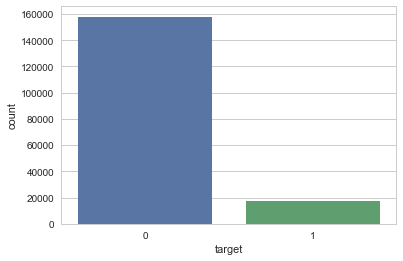

In [53]:
sns.countplot(data_without_outliers['target'])
print("The ratio of label 1 vs label 0 : ", ((data_without_outliers.loc[data_without_outliers.loc[:, 'target'] == 1].shape[0]) / (data_without_outliers.loc[data_without_outliers.loc[:, 'target'] == 0].shape[0]))*100)

# Check data distribution skewness:

C:\Users\uc212037\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


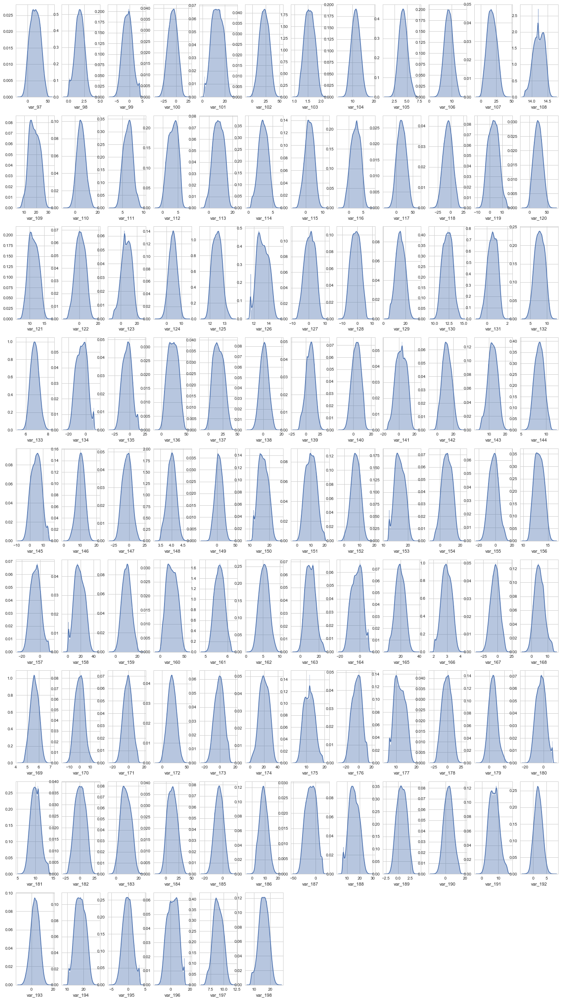

In [56]:
# To check distribution-Skewness.
# to see if the features are normally distributed or right/left skewed/positively skewed.

start = 99 
end = 201
l = data.iloc[:,start:end].columns.values

plt.figure(figsize=(2*number_of_columns,5*number_of_rows))
for i in range(0,len(l)):
    plt.subplot(number_of_rows + 1,number_of_columns,i+1)
    sns.distplot(data[l[i]],kde=True) 

# Observation of unique value of the data sample:

In [57]:
# EDA Observation:

# === Unique Value
col_var = data.columns[2:]
df = pd.DataFrame(col_var, columns=['feature'])
df['n_data_unique'] = data[col_var].nunique(axis=0).values

for i in df.index:
    col = df.loc[i, 'feature']

df['value_range'] = data[col_var].max(axis=0).values - data[col_var].min(axis=0).values

df.T

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
feature,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
n_data_unique,94672,108932,86555,74597,63515,141029,38599,103063,98617,49417,...,114959,94266,59065,110557,97069,57870,125560,40537,94153,149430
value_range,19.9066,25.4202,17.2359,13.2285,11.5966,49.8142,6.1004,22.3421,20.6568,7.1801,...,32.5342,19.4082,12.2169,30.0652,19.2344,9.5339,32.5311,6.0398,19.7798,67.3535


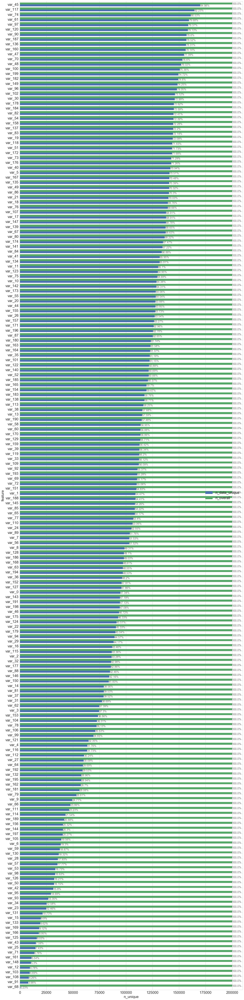

In [65]:
# === plot
import matplotlib.pyplot as plt
df = df.sort_values(by='n_data_unique').reset_index(drop=True)
df['n_overall'] = np.full((data.shape[1] - 2), data.shape[0])
ax = df[['n_data_unique', 'n_overall']].plot(kind='barh' ,figsize=(22, 100), fontsize=20, width=0.8)
plt.yticks(df.index, df['feature'].values)
plt.xlabel('n_unique', fontsize=20)
plt.ylabel('feature', fontsize=20)
plt.legend(loc='center right', fontsize=20)

for i in ax.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()/data.shape[0])*100, 2))+'%', fontsize=15, color='dimgrey')

# Data Augment:

In [98]:
# Augment data:
# Inspired from https://www.kaggle.com/hjd810/keras-lgbm-aug-feature-eng-sampling-prediction Kernel
def augment(x,y,t=2):
    xs,xn = [],[]
    print('First Part Augmentation')
    for i in range(t):
        mask = y>0
        x1 = x[mask].copy()
        ids = np.arange(x1.shape[0])
        for c in range(x1.shape[1]):
            np.random.shuffle(ids)
            x1[:,c] = x1[ids][:,c]
        xs.append(x1)
    if t//2 > 0:    
        print('Second Part Augmentation')
    for i in range(t//2):
        mask = y==0
        x1 = x[mask].copy()
        ids = np.arange(x1.shape[0])
        for c in range(x1.shape[1]):
            np.random.shuffle(ids)
            x1[:,c] = x1[ids][:,c]
        xn.append(x1)

    print(len(xs))
    xs = np.vstack(xs)
    xn = np.vstack(xn)
    ys = np.ones(xs.shape[0])
    yn = np.zeros(xn.shape[0])
    x = np.vstack([x,xs,xn])
    y = np.concatenate([y,ys,yn])
    return x, y


x_data, y_data = augment(data.iloc[:, 2:202].values, data['target'].values,t=2)
x_data = pd.DataFrame(x_data, columns=data.columns[2:])
y_data = pd.DataFrame(y_data, columns=['target'])

First Part Augmentation
Second Part Augmentation
2


In [99]:
data_augment = pd.concat([x_data, y_data], axis=1)

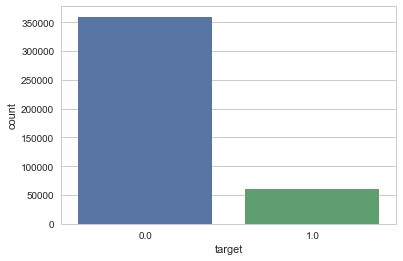

In [115]:
sns.countplot(data_augment['target'])

# Evaluate the result after EDA and data pre-processing:

In [112]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.utils import shuffle
    
def train_test_split(data):
    
    whole_data = shuffle(data)
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=0)
    
    for train_index, test_index in sss.split(whole_data, whole_data['target'].values):
        print("TRAIN:", train_index, "TEST:", test_index)
        train, test = whole_data.iloc[train_index], whole_data.iloc[test_index]
    
    x_train = train.iloc[:,2:]
    y_train = train['target']
    x_test = test.iloc[:,2:]
    y_test = test['target']
    features = [column for column in train.columns if column not in ['ID_code', 'target']]
    
    print("x_train shape: ", x_train.shape)
    print("y_train shape: ", y_train.shape)
    print("x_test shape: ", x_test.shape)
    print("y_test shape: ", y_test.shape)
    print("features", len(features))
    
    print(y_train[y_train==0].shape)
    print(y_train[y_train==1].shape)
    print("-----------------------------")
    print(y_test[y_test==0].shape)
    print(y_test[y_test==1].shape)
    
    return x_train, y_train, x_test, y_test

In [113]:
import time
from sklearn.model_selection import StratifiedKFold
import lightgbm as lgb


def eda_modle_eva (params, x_train, y_train, x_test):
    num_folds = 5
    
    folds = StratifiedKFold(n_splits=num_folds, shuffle=False, random_state=44000)
    oof = np.zeros(len(x_train))
    predictions = np.zeros(len(x_test))
    feature_importance_df = pd.DataFrame()
    
    features = [column for column in x_train.columns if column not in ['ID_code', 'target']]
    
    for fold_, (trn_idx, val_idx) in enumerate(folds.split(x_train.values, y_train.values)):
        print("Fold {}".format(fold_))
        trn_data = lgb.Dataset(x_train.iloc[trn_idx][features], label=y_train.iloc[trn_idx])
        val_data = lgb.Dataset(x_train.iloc[val_idx][features], label=y_train.iloc[val_idx])
        
        num_round = 1000000
        clf = lgb.train(params, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=1000, early_stopping_rounds = 3500)
        oof[val_idx] = clf.predict(x_train.iloc[val_idx][features], num_iteration=clf.best_iteration)
    
        clf.save_model('{:03d}.txt'.format(fold_))

        fold_importance_df = pd.DataFrame()
        fold_importance_df["Feature"] = features
        fold_importance_df["importance"] = clf.feature_importance()
        fold_importance_df["fold"] = fold_ + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
    
        predictions += clf.predict(x_test[features], num_iteration=clf.best_iteration) / folds.n_splits
    
    return predictions, oof, fold_importance_df, clf

# Outliers remove model check:

In [64]:
# ALl default values
params = {
    # Core Parameters
    'objective': 'binary',
    'boosting': 'gbdt',
    'learning_rate': 0.01,
    'num_leaves': 31,
    'tree_learner': 'serial',
    'num_threads': 0,
    'seed': 42,
    
    # Learning Control Parameters
    'max_depth': -1,
    'min_data_in_leaf': 20,
    'min_sum_hessian_in_leaf': 1e-3,  
    'bagging_fraction': 1.0,
    'bagging_freq': 0,
    'feature_fraction': 1.0,
    'lambda_l1': 0.0,
    'lambda_l2': 0.0,
    'bagging_seed': 42,
    
    # Others
    'verbosity ': 1,
    'boost_from_average': True,
    'metric': 'auc',
}


print("data shape: ", data_without_outliers.shape)
x_train, y_train, x_test, y_test = train_test_split(data_without_outliers)
predictions, oof, fold_importance_df, clf = eda_modle_eva(params, x_train, y_train, x_test)


data shape:  (175104, 202)
TRAIN: [ 51069 106483  99221 ... 159937  16044 142294] TEST: [ 11098 173425  21786 ... 156315 131199 108360]
x_train shape:  (87552, 200)
y_train shape:  (87552,)
x_test shape:  (87552, 200)
features 200
(78999,)
(8553,)
-----------------------------
(79000,)
(8552,)
Fold 0
Training until validation scores don't improve for 3500 rounds.
[1000]	training's auc: 0.969371	valid_1's auc: 0.863561
[2000]	training's auc: 0.991844	valid_1's auc: 0.878944
[3000]	training's auc: 0.998272	valid_1's auc: 0.881844
[4000]	training's auc: 0.999654	valid_1's auc: 0.880985
[5000]	training's auc: 0.999932	valid_1's auc: 0.880483
[6000]	training's auc: 0.999983	valid_1's auc: 0.879668
Early stopping, best iteration is:
[2998]	training's auc: 0.998266	valid_1's auc: 0.881859
Fold 1
Training until validation scores don't improve for 3500 rounds.
[1000]	training's auc: 0.968195	valid_1's auc: 0.878504
[2000]	training's auc: 0.991846	valid_1's auc: 0.890874
[3000]	training's auc: 0

In [65]:
from sklearn.metrics import roc_auc_score
print("CV score: {:<8.5f}".format(roc_auc_score(y_train, oof)))
print("CV score: {:<8.5f}".format(roc_auc_score(y_test, predictions)))

CV score: 0.88768 
CV score: 0.88987 


# Data augment model check:

In [116]:
# ALl default values
params = {
    # Core Parameters
    'objective': 'binary',
    'boosting': 'gbdt',
    'learning_rate': 0.01,
    'num_leaves': 31,
    'tree_learner': 'serial',
    'num_threads': 0,
    'seed': 42,
    
    # Learning Control Parameters
    'max_depth': -1,
    'min_data_in_leaf': 20,
    'min_sum_hessian_in_leaf': 1e-3,  
    'bagging_fraction': 1.0,
    'bagging_freq': 0,
    'feature_fraction': 1.0,
    'lambda_l1': 0.0,
    'lambda_l2': 0.0,
    'bagging_seed': 42,
    
    # Others
    'verbosity ': 1,
    'boost_from_average': True,
    'metric': 'auc',
}


print("data shape: ", data_augment.shape)
x_train, y_train, x_test, y_test = train_test_split(data_augment)
predictions, oof, fold_importance_df, clf = eda_modle_eva(params, x_train, y_train, x_test)


data shape:  (420098, 201)
TRAIN: [149060 395586 147581 ... 211507 177462 162908] TEST: [293932 244602  57039 ... 200292 361295  54540]
x_train shape:  (210049, 199)
y_train shape:  (210049,)
x_test shape:  (210049, 199)
y_test shape:  (210049,)
features 200
(179902,)
(30147,)
-----------------------------
(179902,)
(30147,)
Fold 0
Training until validation scores don't improve for 3500 rounds.
[1000]	training's auc: 0.919566	valid_1's auc: 0.873494
[2000]	training's auc: 0.94684	valid_1's auc: 0.889765
[3000]	training's auc: 0.961369	valid_1's auc: 0.895208
[4000]	training's auc: 0.972143	valid_1's auc: 0.897176
[5000]	training's auc: 0.980529	valid_1's auc: 0.897651
[6000]	training's auc: 0.986645	valid_1's auc: 0.897835
[7000]	training's auc: 0.991034	valid_1's auc: 0.897845
[8000]	training's auc: 0.994124	valid_1's auc: 0.897916
[9000]	training's auc: 0.996214	valid_1's auc: 0.897922
[10000]	training's auc: 0.997616	valid_1's auc: 0.897972
[11000]	training's auc: 0.998527	valid_1's

In [117]:
from sklearn.metrics import roc_auc_score
print("CV score: {:<8.5f}".format(roc_auc_score(y_train, oof)))
print("CV score: {:<8.5f}".format(roc_auc_score(y_test, predictions)))

CV score: 0.89602 
CV score: 0.89841 
